# **Importing Libraries and Preprocessing**

In [0]:
# Check the versions of libraries
# Python version
import sys
print('Python: {}'.format(sys.version))
# scipy
import scipy
print('scipy: {}'.format(scipy.__version__))
# numpy
import numpy
print('numpy: {}'.format(numpy.__version__))
# matplotlib
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))
# pandas
import pandas
print('pandas: {}'.format(pandas.__version__))
# scikit-learn
import sklearn
print('sklearn: {}'.format(sklearn.__version__))
import csv

# Load libraries
import statistics
import math
import itertools
# import optunity
# import optunity.metrics
import time
import pandas            as pd
import numpy             as np
import matplotlib.pyplot as plt
import seaborn           as sns
import tensorflow        as tf
import cv2
import pickle
from decimal              import Decimal
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
%matplotlib inline
# 
from sklearn.feature_selection    import RFECV
from mlxtend.plotting             import plot_sequential_feature_selection as plot_sfs
from sklearn.feature_selection    import SelectFromModel
from mlxtend.feature_selection    import SequentialFeatureSelector as SFS
from mlxtend.feature_selection    import ExhaustiveFeatureSelector as EFS
from itertools                    import chain, combinations
from sklearn.preprocessing        import LabelEncoder, PolynomialFeatures, MinMaxScaler
from sklearn.linear_model         import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.model_selection      import train_test_split, cross_val_score, GridSearchCV, KFold, validation_curve
from sklearn.metrics              import r2_score, mean_squared_error
from sklearn.svm                  import SVR
from sklearn.feature_selection    import SelectKBest, SelectPercentile, RFE, f_regression
from sklearn.ensemble             import RandomForestRegressor
from sklearn.tree                 import DecisionTreeRegressor
from sklearn.neighbors            import KNeighborsRegressor
from sklearn.externals            import joblib
from sklearn.pipeline             import make_pipeline, Pipeline








Python: 3.6.8 (default, Oct  7 2019, 12:59:55) 
[GCC 8.3.0]
scipy: 1.3.2
numpy: 1.17.4
matplotlib: 3.1.1
pandas: 0.25.3
sklearn: 0.21.3


/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [0]:
from google.colab import drive
drive.mount('/gdrive')#, force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive


In [0]:
df_points_HMX = pd.read_csv('/gdrive/My Drive/Transfer_Learning/data_points_HMX.csv')
for i in range(df_points_HMX.shape[0]):
  if df_points_HMX.iloc[i]['D'] == 9:
    df_points_HMX.iloc[i]['D'] = 10
print(df_points_HMX.shape)
print(df_points_HMX.head(3))

(83, 4)
       P     D     Fdot_IG       Fdot_G
0   5.00  0.05         0.0          0.0
1  20.02  0.05  12000000.0  102000000.0
2   4.00  0.05         0.0          0.0


In [0]:
df_points_TATB = pd.read_csv('/gdrive/My Drive/Transfer_Learning/data_points_TATB.csv')
print(df_points_TATB.shape)
print(df_points_TATB.head(3))

(52, 4)
       P     D     Fdot_IG  Fdot_G
0   5.00  0.05    6.341127     0.0
1  11.94  0.05    2.524479     0.0
2  18.88  0.05  188.136972     0.0


In [0]:
df_points_HYP = pd.read_csv('/gdrive/My Drive/Transfer_Learning/data_points_HYP.csv')
print(df_points_HYP.shape)
print(df_points_HYP)

(7, 4)
    P      D       Fdot_IG       Fdot_G
0   5   0.05  7.187485e+01          0.0
1  12   0.05  8.135326e+04          0.0
2  32   0.05  6.384197e+07   76366986.0
3  39   0.05  1.513647e+08  764979767.0
4   5   3.71  3.170982e+04          0.0
5   5   7.16  4.323179e+04          0.0
6  39  10.00  5.178015e+07  331487420.2


In [0]:
df_points_global = df_points_HMX.append(df_points_TATB, ignore_index = True)
print(df_points_global.shape)
print(df_points_global.head(3))

print(df_points_global.tail(3))

(135, 4)
       P     D     Fdot_IG       Fdot_G
0   5.00  0.05         0.0          0.0
1  20.02  0.05  12000000.0  102000000.0
2   4.00  0.05         0.0          0.0
         P     D       Fdot_IG        Fdot_G
132  23.04  10.0  2.495871e+06  2.122072e+06
133  32.76  10.0  1.338416e+07  2.368916e+07
134  39.00  10.0  2.020420e+07  1.095900e+08


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


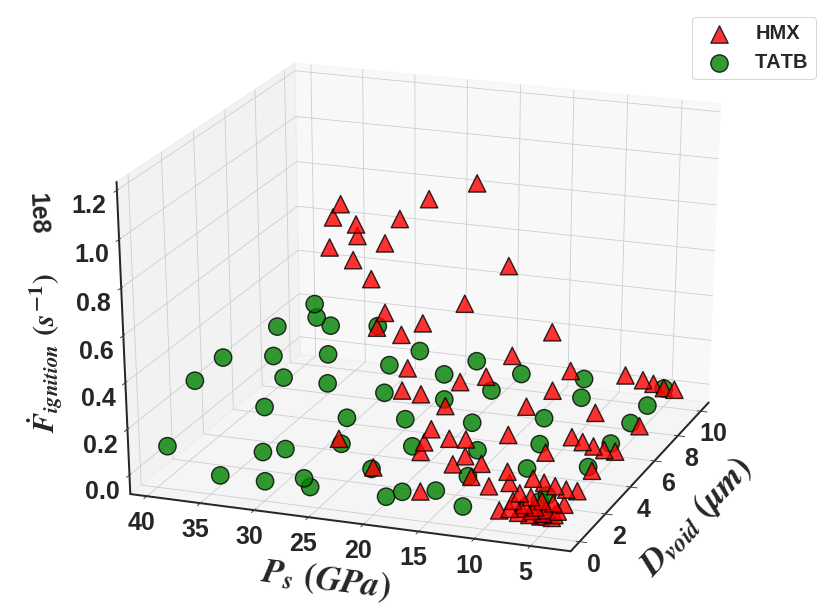

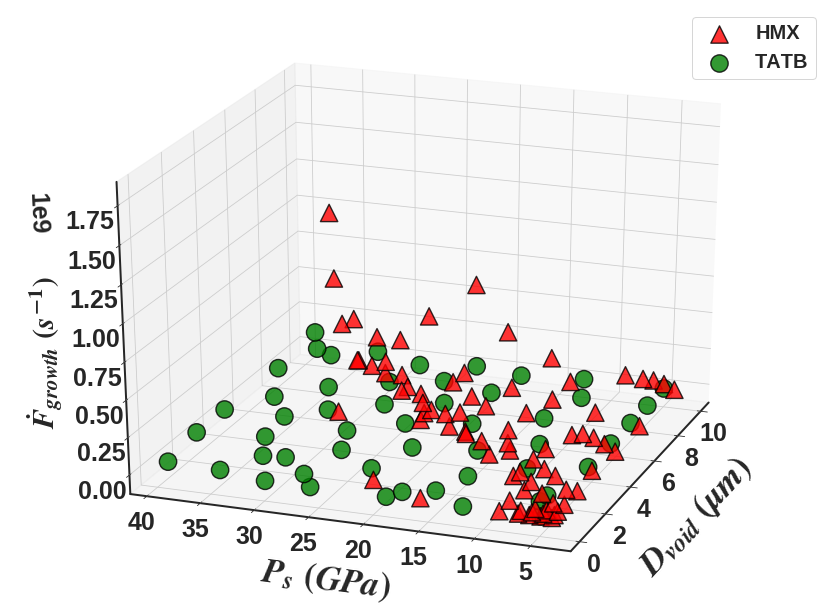

In [0]:
cmap = matplotlib.cm.get_cmap('viridis')
normalize_TATB = matplotlib.colors.Normalize(vmin=min(df_points_TATB['P']), vmax=max(df_points_TATB['P']))
colors_TATB = [cmap(normalize_TATB(value)) for value in df_points_TATB['P']]
normalize_HMX = matplotlib.colors.Normalize(vmin=min(df_points_HMX['P']), vmax=max(df_points_HMX['P']))
colors_HMX = [cmap(normalize_HMX(value)) for value in df_points_HMX['P']]

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 35}
plt.rc('font',**font)
plt.style.use('seaborn-ticks')
# plt.style.use('presentation')
params = {'figure.figsize'      : (14,11),
         'legend.frameon'       : True,
         "legend.shadow"        : False,
         "legend.fontsize"      : 20,
         "legend.borderpad"     : 0.35,
         "legend.columnspacing" : 0.1,
         "legend.loc"           : 'upper right',
         'axes.labelsize'       : 30,
         'xtick.labelsize'      : 25,
         'ytick.labelsize'      : 25,
         'ytick.major.left'     : True,
         'ytick.minor.left'     : True,
         'ytick.major.right'    : True,
         'ytick.minor.right'    : True,
         'xtick.major.top'      : True,
         'xtick.minor.bottom'   : True,
         'xtick.major.top'      : True,
         'xtick.minor.bottom'   : True,
         'mathtext.fontset'     : 'stix',
         'axes.linewidth'       : 2}
plt.rcParams.update(params)

markerSize = 300
figAspect = 0.75

figRotationX = 30
figRotationZ = 230 

fig = plt.figure(figsize=plt.figaspect(figAspect))
ax = fig.add_subplot(111,projection='3d')
# ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.scatter(df_points_HMX['D'],df_points_HMX['P'], df_points_HMX['Fdot_IG'],\
             s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=0.8, color='r', label='HMX')

ax.scatter(df_points_TATB['D'],df_points_TATB['P'], df_points_TATB['Fdot_IG'],\
             s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=0.8, color='g', label='TATB')
  
# ax.set_xlim([-0.2,10.2])
# ax.set_ylim([0,40])
# # ax.set_zlim([1e-1,5e9])
# # ax.set_zscale('log')
# ax.set_xlabel('D (micron)',font) 
# ax.set_ylabel('P (GPa)',font) 
# ax.set_zlabel('Fdot_IG (1/s)',font)
# ax.legend()
# for angle in range(0, 360):
ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
# ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
ax.xaxis.labelpad = 25
ax.yaxis.labelpad = 25
ax.zaxis.labelpad = 25
ax.zaxis.set_tick_params(which='major', pad=8)
ax.legend()
ax.view_init(figRotationX-5, figRotationZ-30)
# plt.draw()
# plt.pause(.001)


## Growth figures ##
fig = plt.figure(figsize=plt.figaspect(figAspect))
ax = fig.add_subplot(111,projection='3d')
# ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.scatter(df_points_HMX['D'],df_points_HMX['P'], df_points_HMX['Fdot_G'],\
             s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=0.8, color='r', label='HMX')

ax.scatter(df_points_TATB['D'],df_points_TATB['P'], df_points_TATB['Fdot_G'],\
             s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=0.8, color='g', label='TATB')
  
# ax.set_xlim([-0.2,10.2])
# ax.set_ylim([0,40])
# # ax.set_zlim([1e-1,5e9])
# # ax.set_zscale('log')
# ax.set_xlabel('D (micron)',font) 
# ax.set_ylabel('P (GPa)',font) 
# ax.set_zlabel('Fdot_G (1/s)',font)
# ax.legend()
ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel(r'$\dot{F}_{growth}\/\/(s^{-1})$', rotation=90)
# ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
ax.xaxis.labelpad = 25
ax.yaxis.labelpad = 25
ax.zaxis.labelpad = 25
ax.zaxis.set_tick_params(which='major', pad=8)
ax.legend()
ax.view_init(figRotationX-5, figRotationZ-30)


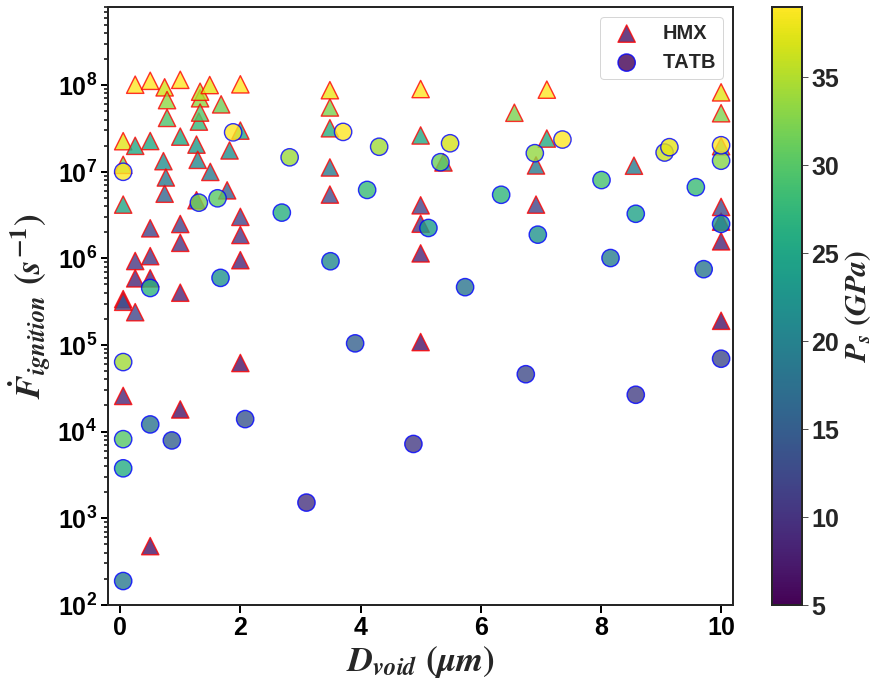

In [0]:

##sphinx_gallery_thumbnail_number = 3
#plot_colortable(mcolors.CSS4_COLORS, "CSS Colors")

#'text.usetex'          : False,
#'text.latex.preview' : True,
#'pgf.texsystem'    : 'xelatex',
#'text.latex.preamble': "/lat/" ,

fig, ax = plt.subplots()
ax.scatter(df_points_HMX['D'], df_points_HMX['Fdot_IG'],300,marker='^',label='HMX',edgecolor='r', linewidth=1.4, color=colors_HMX,alpha=0.8)
ax.scatter(df_points_TATB['D'], df_points_TATB['Fdot_IG'],300,marker='o',label='TATB',edgecolor='b', linewidth=1.4, color=colors_TATB,alpha=0.8)
ax.set_yscale('log')
ax.set_ylim([1e2,8e8])
ax.set_xlim([-0.2,10.2])
ax.tick_params(direction='out', length=7.5, width=2, colors='k')
ax.tick_params(which='minor', length=4.5, width=1.5, color='k')

ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font) 
ax.set_ylabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$',font)
ax.legend()


# Optionally add a colorbar
cax, _ = matplotlib.colorbar.make_axes(ax)
cbar = matplotlib.colorbar.ColorbarBase(cax, cmap=cmap, norm=normalize_TATB)
cbar.set_label(r'$P_{s}\/\/(GPa)$')



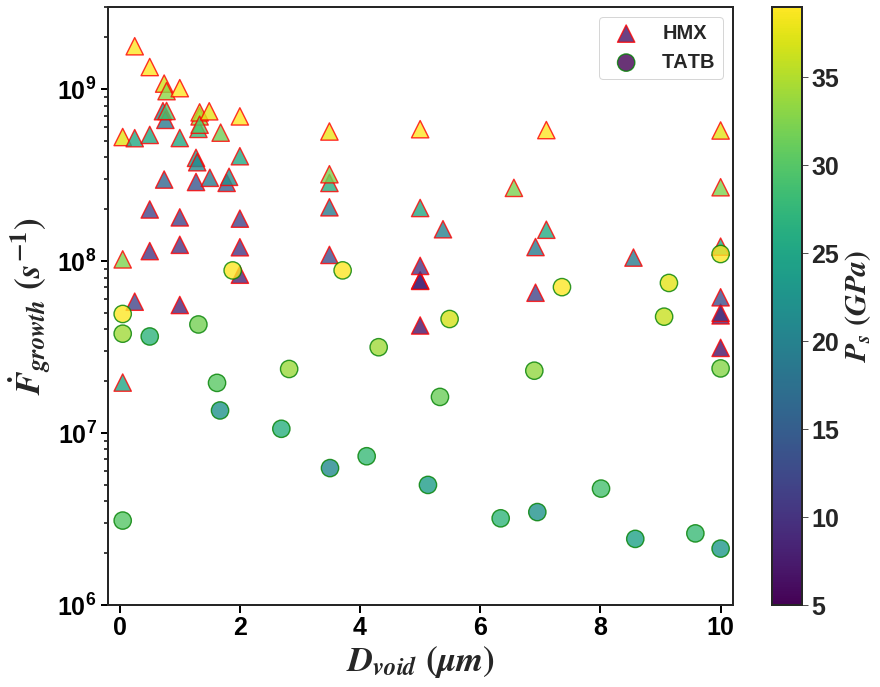

In [0]:
fig, ax = plt.subplots()
ax.scatter(df_points_HMX['D'], df_points_HMX['Fdot_G'],300,marker='^',label='HMX',edgecolor='r', linewidth=1.4, color=colors_HMX,alpha=0.8)
ax.scatter(df_points_TATB['D'], df_points_TATB['Fdot_G'],300,marker='o',label='TATB',edgecolor='g', linewidth=1.4, color=colors_TATB,alpha=0.8)
ax.set_yscale('log')
ax.set_ylim([1e6,3e9])
ax.set_xlim([-0.2,10.2])
ax.tick_params(direction='out', length=7.5, width=2, colors='k')
ax.tick_params(which='minor', length=4.5, width=1.5, color='k')

ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font) 
ax.set_ylabel(r'$\dot{F}_{growth}\/\/(s^{-1})$',font)
ax.legend()


# Optionally add a colorbar
cax, _ = matplotlib.colorbar.make_axes(ax)
cbar = matplotlib.colorbar.ColorbarBase(cax, cmap=cmap, norm=normalize_TATB)
cbar.set_label(r'$P_{s}\/\/(GPa)$')

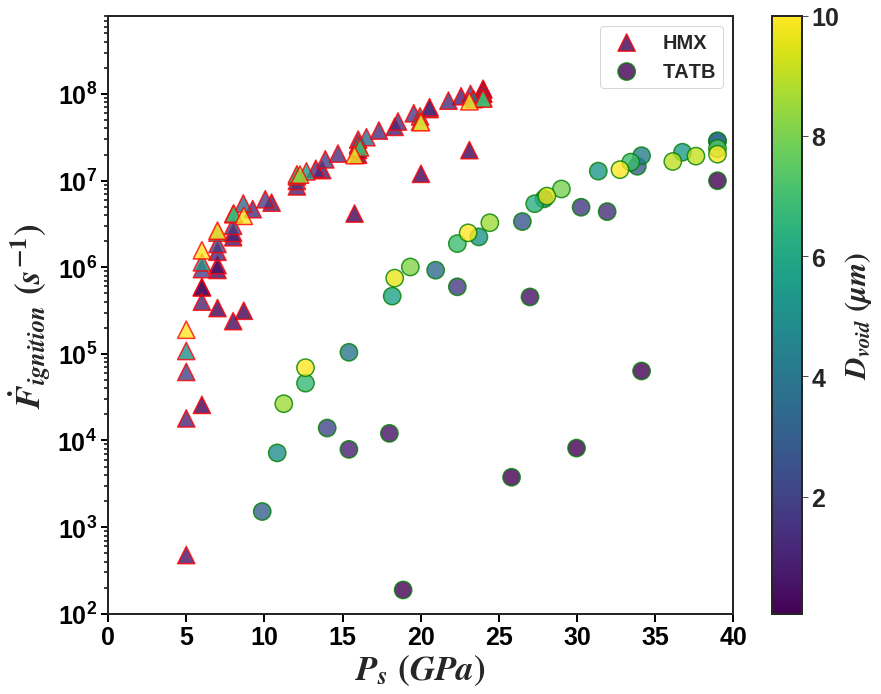

In [0]:
cmap = matplotlib.cm.get_cmap('viridis')
normalize_TATB = matplotlib.colors.Normalize(vmin=min(df_points_TATB['D']), vmax=max(df_points_TATB['D']))
colors_TATB = [cmap(normalize_TATB(value)) for value in df_points_TATB['D']]
normalize_HMX = matplotlib.colors.Normalize(vmin=min(df_points_HMX['D']), vmax=max(df_points_HMX['D']))
colors_HMX = [cmap(normalize_HMX(value)) for value in df_points_HMX['D']]

fig, ax = plt.subplots()
ax.scatter(df_points_HMX['P'], df_points_HMX['Fdot_IG'],300,marker='^',label='HMX',edgecolor='r',linewidth=1.5, color=colors_HMX,alpha=0.8)
ax.scatter(df_points_TATB['P'], df_points_TATB['Fdot_IG'],300,marker='o',label='TATB',edgecolor='g',linewidth=1.5, color=colors_TATB,alpha=0.8)
ax.set_yscale('log')
ax.set_ylim([1e2,8e8])
ax.set_xlim([0,40])
ax.tick_params(direction='out', length=7.5, width=2, colors='k')
ax.tick_params(which='minor', length=4.5, width=1.5, color='k')

ax.set_xlabel(r'$P_{s}\/\/(GPa)$',font) 
ax.set_ylabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$',font)
ax.legend()
# Optionally add a colorbar
cax, _ = matplotlib.colorbar.make_axes(ax)
cbar = matplotlib.colorbar.ColorbarBase(cax, cmap=cmap, norm=normalize_TATB)
cbar.set_label(r'$D_{void}\/\/(\mu m)$')

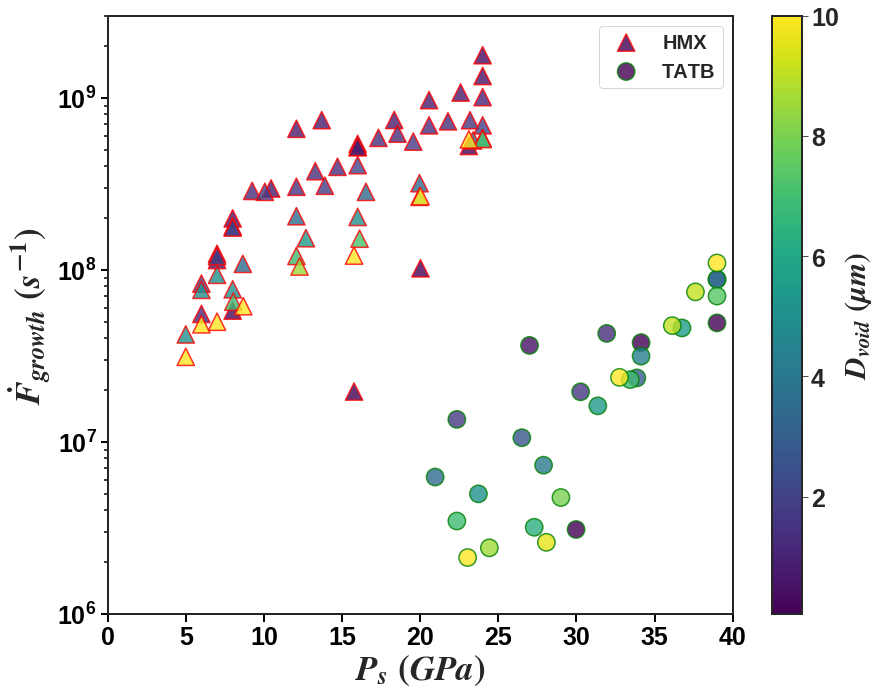

In [0]:
cmap = matplotlib.cm.get_cmap('viridis')
normalize_TATB = matplotlib.colors.Normalize(vmin=min(df_points_TATB['D']), vmax=max(df_points_TATB['D']))
colors_TATB = [cmap(normalize_TATB(value)) for value in df_points_TATB['D']]
normalize_HMX = matplotlib.colors.Normalize(vmin=min(df_points_HMX['D']), vmax=max(df_points_HMX['D']))
colors_HMX = [cmap(normalize_HMX(value)) for value in df_points_HMX['D']]

fig, ax = plt.subplots()
ax.scatter(df_points_HMX['P'], df_points_HMX['Fdot_G'],300,marker='^',label='HMX',edgecolor='r', linewidth=1.5, color=colors_HMX,alpha=0.8)
ax.scatter(df_points_TATB['P'], df_points_TATB['Fdot_G'],300,marker='o',label='TATB',edgecolor='g', linewidth=1.5, color=colors_TATB,alpha=0.8)
ax.set_yscale('log')
ax.set_ylim([1e6,3e9])
ax.set_xlim([0,40])
ax.set_xlabel(r'$P_{s}\/\/(GPa)$',font) 
ax.set_ylabel(r'$\dot{F}_{growth}\/\/(s^{-1})$',font)
ax.tick_params(direction='out', length=7.5, width=2, colors='k')
ax.tick_params(which='minor', length=4.5, width=1.5, color='k')
# ax.minorticks_on()
ax.legend()
# Optionally add a colorbar
cax, _ = matplotlib.colorbar.make_axes(ax)
cbar = matplotlib.colorbar.ColorbarBase(cax, cmap=cmap, norm=normalize_TATB)
cbar.set_label(r'$D_{void}\/\/(\mu m)$')

fig.savefig('test.png')



#### **Preparing the features**




In [0]:
# --------- HMX features ----------- #
# HMX_feature = [48.7,52.7,100.0,0.68e-7]*np.ones((df_points_HMX.shape[0],1));
HMX_vector = np.array([48.7,37.3,28.1,\
                       52.7,44.1,34.1,\
                       100.0,-300.0,-1200.0,\
                       0.68e-7])
HMX_feature = HMX_vector*np.ones((df_points_HMX.shape[0],1))
# convert HMX_feature from a numpy array to a dataframe
HMX_feature = pd.DataFrame(data = HMX_feature, columns = ('Z1','Z2','Z3',\
                                                        'E1','E2','E3',\
                                                        'h1','h2','h3',\
                                                        'al'))
HMX_feature = pd.concat([HMX_feature, df_points_HMX['P'], df_points_HMX['D']], axis=1)
# HMX_feature['Z1'] = np.exp(HMX_feature['Z1'])
print('HMX features:')
print(HMX_feature.shape)
print(HMX_feature.head(3))
print()
# --------- TATB features ----------- #
# TATB_feature = [48.0,60.0,50.0,1.01e-7]*np.ones((df_points_TATB.shape[0],1));
TATB_vector = np.array([48.0,29.8,26.8,\
                        60.0,42.0,33.8,\
                        50.0,50.0,-700.0,\
                        1.01e-7])
TATB_feature = TATB_vector*np.ones((df_points_TATB.shape[0],1));
# convert TATB_feature from a numpy array to a dataframe
TATB_feature = pd.DataFrame(data = TATB_feature, columns = ('Z1','Z2','Z3',\
                                                          'E1','E2','E3',\
                                                          'h1','h2','h3',\
                                                          'al'))
TATB_feature = pd.concat([TATB_feature, df_points_TATB['P'], df_points_TATB['D']], axis=1)
# TATB_feature['Z1'] = np.exp(TATB_feature['Z1'])
print('TATB features:')
print(TATB_feature.shape)
print(TATB_feature.head(3))
print()
# --------- Global features ----------- #
global_feature = None
global_feature = HMX_feature.append(TATB_feature, ignore_index = True, sort=False)
print('Global features:')
print(global_feature.shape)
print(global_feature.head(3))
print(global_feature.tail(3))
print()
# --------- Hypo features (synthesized P & D ) ----------- #
# hypo_feature = [48.0,55.0,100.0,0.8e-7]*np.ones((df_points_TATB.shape[0],1));
hypo_vector = np.array([48.0,35.5,27.8,\
                        55.0,47.0,36.0,\
                        100.0,-200.0,-800.0,\
                        0.8e-7])
hypo_feature = hypo_vector*np.ones((df_points_TATB.shape[0],1));
# convert hypo_feature from a numpy array to a dataframe
hypo_feature = pd.DataFrame(data = hypo_feature, columns = ('Z1','Z2','Z3',\
                                                          'E1','E2','E3',\
                                                          'h1','h2','h3',\
                                                          'al'))
hypo_P = np.linspace(min(global_feature['P']), 39.0, TATB_feature.shape[0])
hypo_D = np.linspace(min(global_feature['D']), 10.0, TATB_feature.shape[0])
hypo_P_D_array = np.array([hypo_P,hypo_D])
hypo_P_D_array = np.transpose(hypo_P_D_array)
print('hypo_P_D_array.shape:',hypo_P_D_array.shape)
print(hypo_P_D_array)
df_hypo_P_D = pd.DataFrame(data = hypo_P_D_array, columns=('P','D'))
hypo_feature = pd.concat([hypo_feature, df_hypo_P_D['P'], df_hypo_P_D['D']], axis=1)
print('hypo features:')
print(hypo_feature.shape)
print(hypo_feature.head(3))
print()
# --------- Hypo features (True P & D) ----------- #
# hypo_feature = [48.0,55.0,100.0,0.8e-7]*np.ones((df_points_TATB.shape[0],1));
hypo_vector = np.array([48.0,35.5,27.8,\
                        55.0,47.0,36.0,\
                        100.0,-200.0,-800.0,\
                        0.8e-7])
hypo_feature_true = hypo_vector*np.ones((df_points_HYP.shape[0],1))
# convert hypo_feature from a numpy array to a dataframe
hypo_feature_true = pd.DataFrame(data = hypo_feature_true, columns = ('Z1','Z2','Z3',\
                                                          'E1','E2','E3',\
                                                          'h1','h2','h3',\
                                                          'al'))
hypo_feature_true = pd.concat([hypo_feature_true, df_points_HYP['P'], df_points_HYP['D']], axis=1)
print('hypo features TRUE:')
print(hypo_feature_true.shape)
print(hypo_feature_true)
print()
#----- Global features with hypo -------#
global_feature_H = None
global_feature_H = global_feature.append(hypo_feature, ignore_index = True, sort=False)
print('Global features:')
print(global_feature_H.shape)
print(global_feature_H.head(3))
print(global_feature_H.tail(3))
print()
#====================================
# --------- HMX Response ---------- #
HMX_response    = None;
HMX_response    = pd.concat([df_points_HMX['Fdot_IG'], df_points_HMX['Fdot_G']], axis=1)
print('HMX response:')
print(HMX_response.shape)
print(HMX_response.head(3))
print(HMX_response.tail(3))
print()
# --------- TATB Response ---------- #
TATB_response   = None;
TATB_response   = pd.concat([df_points_TATB['Fdot_IG'], df_points_TATB['Fdot_G']], axis=1)
print('TATB response:')
print(TATB_response.shape)
print(TATB_response.head(3))
print(TATB_response.tail(3))
print()
# --------- HYP Response ---------- #
hypo_response   = None;
hypo_response   = pd.concat([df_points_HYP['Fdot_IG'], df_points_HYP['Fdot_G']], axis=1)
print('HYP response:')
print(hypo_response.shape)
print(hypo_response)
print()
# --------- Global Response ---------- #
global_response = None;
global_response = HMX_response.append(TATB_response, ignore_index = True, sort=False)
print('Global response:')
print(global_response.shape)
print(global_response.head(3))
print(global_response.tail(3))
print()
#=========================================================#
#                      Normalization                      #
#=========================================================#
#---------- Maxes for normalization (features) -----------#
maxes_feature = global_feature_H.max()
print('Global feature maxes:')
print(maxes_feature.shape)
print(maxes_feature)
print()
#---------- Mins for normalization (features) -----------#
mins_feature = global_feature_H.min()
print('Global feature mins:')
print(mins_feature.shape)
print(mins_feature)
print()
#---------- Maxes for normalization (responses) ----------#
maxes_response = global_response.max()
print('Global response maxes:')
print(maxes_response.shape)
print(maxes_response)
print()
#---------- Mins for normalization (responses) ----------#
mins_response = global_response.min()
print('Global response mins:')
print(mins_response.shape)
print(mins_response)
print()
# --------- HMX features ----------- #
HMX_feature = (HMX_feature-mins_feature)/(maxes_feature-mins_feature)
print('HMX features:')
print(HMX_feature.shape)
print(HMX_feature.head(3))
print()
# --------- Hypo features ----------- #
hypo_feature = (hypo_feature-mins_feature)/(maxes_feature-mins_feature)
print('hypo features:')
print(hypo_feature.shape)
print(hypo_feature.head(3))
print()
# --------- Hypo features TRUE ----------- #
hypo_feature_true = (hypo_feature_true-mins_feature)/(maxes_feature-mins_feature)
print('hypo features TRUE:')
print(hypo_feature_true.shape)
print(hypo_feature_true)
print()
# --------- TATB features ----------- #
TATB_feature = (TATB_feature-mins_feature)/(maxes_feature-mins_feature)
print('TATB features:')
print(TATB_feature.shape)
print(TATB_feature.head(3))
print()
# --------- Global features ----------- #
global_feature = (global_feature-mins_feature)/(maxes_feature-mins_feature)
print('Global features:')
print(global_feature.shape)
print(global_feature.head(3))
print(global_feature.tail(3))
print()
# --------- HMX Response ---------- #
HMX_response    = (HMX_response-mins_response)/(maxes_response-mins_response)
print('HMX response:')
print(HMX_response.shape)
print(HMX_response.head(3))
print(HMX_response.tail(3))
print()
# --------- TATB Response ---------- #
TATB_response    = (TATB_response-mins_response)/(maxes_response-mins_response)
print('TATB response:')
print(TATB_response.shape)
print(TATB_response.head(3))
print(TATB_response.tail(3))
print()
# --------- HYP Response ---------- #
hypo_response    = (hypo_response-mins_response)/(maxes_response-mins_response)
print('HYP response:')
print(hypo_response.shape)
print(hypo_response)
print()
# --------- Global Response ---------- #
global_response    = (global_response-mins_response)/(maxes_response-mins_response)
print('Global response:')
print(global_response.shape)
print(global_response.head(3))
print(global_response.tail(3))
print()
print()
#--------- Global Everything ----------#

#=========================================================#
#               Denormalization Functions                 #
#=========================================================#
# denormalize features
def denorm_f(xn):
  return (xn*(maxes_feature-mins_feature) + mins_feature)
# denormalize P surface 
def denorm_surf_P(xn):
  return (xn*(maxes_feature[10]-mins_feature[10]) + mins_feature[10])
# denormalize D surface 
def denorm_surf_D(xn):
  return (xn*(maxes_feature[11]-mins_feature[11]) + mins_feature[11])
# denormalize response
def denorm_r(xn):
  return (xn*(maxes_response-mins_response) + mins_response)
# denormalize prediction (ignition)
def denorm_ig(xn):
  return (xn*(maxes_response[0]-mins_response[0]) + mins_response[0])
# denormalize prediction (growth)
def denorm_g(xn):
  return (xn*(maxes_response[1]-mins_response[1]) + mins_response[1])



feature_cols = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']
X_global_old     = global_feature[feature_cols]
y_global_ig  = global_response['Fdot_IG']
y_global_g   = global_response['Fdot_G']

np.random.seed(3) 
# global_everything = global_feature.append(global_response, ignore_index = True, sort=False)
global_everything = pd.concat([global_feature, global_response['Fdot_IG'], global_response['Fdot_G']], axis=1)
print(global_everything.shape)
print(global_everything)
print()
print('Shuffling')
print()
# global_everything_shuffled = global_everything.apply(np.random.shuffle, axis=0)
global_everything_shuffled = global_everything.sample(frac=1).reset_index(drop=True) # (np.random.shuffle, axis=0)
print(global_everything_shuffled.shape)
print(global_everything_shuffled)

takeShuffledFlag = 0

if takeShuffledFlag == 1:
  X_global    = global_everything_shuffled[feature_cols]
  y_global_ig = global_everything_shuffled['Fdot_IG']
  y_global_g  = global_everything_shuffled['Fdot_G']
else:
  X_global    = global_everything[feature_cols]
  y_global_ig = global_everything['Fdot_IG']
  y_global_g  = global_everything['Fdot_G']

# print(X_global.shape)
# print(X_global)

# print(y_global_ig.shape)
# print(y_global_ig)

# print(y_global_g.shape)
# print(y_global_g)


HMX features:
(83, 12)
     Z1    Z2    Z3    E1    E2  ...     h2      h3            al      P     D
0  48.7  37.3  28.1  52.7  44.1  ... -300.0 -1200.0  6.800000e-08   5.00  0.05
1  48.7  37.3  28.1  52.7  44.1  ... -300.0 -1200.0  6.800000e-08  20.02  0.05
2  48.7  37.3  28.1  52.7  44.1  ... -300.0 -1200.0  6.800000e-08   4.00  0.05

[3 rows x 12 columns]

TATB features:
(52, 12)
     Z1    Z2    Z3    E1    E2  ...    h2     h3            al      P     D
0  48.0  29.8  26.8  60.0  42.0  ...  50.0 -700.0  1.010000e-07   5.00  0.05
1  48.0  29.8  26.8  60.0  42.0  ...  50.0 -700.0  1.010000e-07  11.94  0.05
2  48.0  29.8  26.8  60.0  42.0  ...  50.0 -700.0  1.010000e-07  18.88  0.05

[3 rows x 12 columns]

Global features:
(135, 12)
     Z1    Z2    Z3    E1    E2  ...     h2      h3            al      P     D
0  48.7  37.3  28.1  52.7  44.1  ... -300.0 -1200.0  6.800000e-08   5.00  0.05
1  48.7  37.3  28.1  52.7  44.1  ... -300.0 -1200.0  6.800000e-08  20.02  0.05
2  48.7  37.3  28

# **SVM model**

#### **Build SVM Model**

In [0]:
#==================================================================#
#                 Metrics Functions Definitions                    #
#==================================================================#
def calc_train_error(X_train, y_train, model):
    '''returns in-sample error for already fit model.'''
    predictions = model.predict(X_train)
    mse = mean_squared_error(y_train, predictions)
    rmse = np.sqrt(mse)
    return rmse
    
def calc_validation_error(X_valid, y_valid, model):
    '''returns out-of-sample error for already fit model.'''
    predictions = model.predict(X_valid)
    mse = mean_squared_error(y_valid, predictions)
    rmse = np.sqrt(mse)
    return rmse

def calc_test_error(X_train, y_train, X_test, y_test, model):
    '''returns out-of-sample error for already fit model.'''
    model.fit(X_train, y_train)
    test_error = calc_validation_error(X_test, y_test, model)
    return test_error
    
def calc_metrics(X_train, y_train, X_test, y_test, model):
    '''fits model and returns the RMSE for in-sample error and out-of-sample error'''
    model.fit(X_train, y_train)
    train_error = calc_train_error(X_train, y_train, model)
    validation_error = calc_validation_error(X_test, y_test, model)
    return train_error, validation_error
#==================================================================#
#                     Tuning   (first stage)                       #
#==================================================================#
def SVR_tuning(X, y, nfolds, Cs, gammas, epsilons):
    param_grid = {'C': Cs, 'gamma' : gammas, 'epsilon': epsilons}
    # grid_search = GridSearchCV(SVR(kernel='rbf'), param_grid, cv=nfolds)
    grid_search = GridSearchCV(SVR(kernel='rbf'),
                 param_grid=param_grid,
                 scoring='neg_mean_squared_error',
                 cv=nfolds,
                 verbose=1,
                 n_jobs=-1,
                 refit=False,
                 return_train_score=True)
    grid_search.fit(X, y)
    grid_search
    print(grid_search.best_params_)
    return grid_search.best_params_, grid_search.cv_results_

def SVR_tuning_linear(X, y, nfolds, Cs, gammas, epsilons):
    param_grid = {'C': Cs, 'gamma' : gammas, 'epsilon': epsilons}
    # grid_search = GridSearchCV(SVR(kernel='rbf'), param_grid, cv=nfolds)
    grid_search = GridSearchCV(SVR(kernel='linear'),
                 param_grid=param_grid,
                 scoring='neg_mean_squared_error',
                 cv=nfolds,
                 verbose=1,
                 n_jobs=-1,
                 refit=False,
                 return_train_score=True)
    grid_search.fit(X, y)
    grid_search
    print(grid_search.best_params_)
    return grid_search.best_params_, grid_search.cv_results_

def Lasso_tuning(X, y, nfolds, alphas, randomSeed):
    param_grid = {'alpha': alphas}
    grid_search = GridSearchCV(Lasso(random_state=randomSeed),
                 param_grid=param_grid,
                 scoring='neg_mean_squared_error',
                 cv=nfolds,
                 verbose=1,
                 n_jobs=-1,
                 refit=False,
                 return_train_score=True)
    grid_search.fit(X, y)
    grid_search
    print(grid_search.best_params_)
    return grid_search.best_params_, grid_search.cv_results_


def Ridge_tuning(X, y, nfolds, alphas, randomSeed):
    param_grid = {'alpha': alphas}
    grid_search = GridSearchCV(Ridge(random_state=randomSeed),
                 param_grid=param_grid,
                 scoring='neg_mean_squared_error',
                 cv=nfolds,
                 verbose=1,
                 n_jobs=-1,
                 refit=False,
                 return_train_score=True)
    grid_search.fit(X, y)
    grid_search
    print(grid_search.best_params_)
    return grid_search.best_params_, grid_search.cv_results_

def ElasticNet_tuning(X, y, nfolds, alphas, l1Ratios, randomSeed):
    param_grid = {'alpha': alphas, 'l1_ratio': l1Ratios}
    grid_search = GridSearchCV(ElasticNet(random_state=randomSeed) ,
                 param_grid=param_grid,
                 scoring='neg_mean_squared_error',
                 cv=nfolds,
                 verbose=1,
                 n_jobs=-1,
                 refit=False,
                 return_train_score=True)
    grid_search.fit(X, y)
    grid_search
    print(grid_search.best_params_)
    return grid_search.best_params_, grid_search.cv_results_
def return_min_pos_value(matrix,test_matrix):
  minimum = 1000
  minimum_test = 1000
  idex_C = 1
  index_gamma = 1
  for i in range(matrix.shape[0]):
    for j in range(matrix.shape[1]):
      if matrix[i,j] >= 0.0:
        if matrix[i,j] < minimum:
          minimum = matrix[i,j]
          minimum_test = test_matrix[i,j]
          index_C_test = i
          index_gamma_test = j
          index_C = i
          index_gamma = j
  return round(minimum,4), index_C, index_gamma, round(minimum_test,4), index_C_test, index_gamma_test


###### Hide this for now

In [0]:
# ------------- Parameters ------------- #
test_size_ig = 0.45
test_size_g = 0.45
randomSeed = 3
figRotationX = 30
figRotationZ = 230 
epsilon = 1e-6
n_folds=10
penalty_ig = 10
penalty_g = 10
figRatio = 0.35
#==============================================================================#
#                                                                              #
#                                 Global Part                                  #
#                                                                              #
#==============================================================================#
print(' ')
print('------ global (ignition) -------')
print(' ')
features_model_0 = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']
features_model_1 = ['Z1','Z2','Z3','P','D']
features_model_2 = ['E1','E2','E3','P','D']
features_model_3 = ['h1','h2','h3','P','D']

feature_cols = features_model_3

print('Selected features: ',feature_cols)
print()
Cs_ig     = np.linspace(1e-2, 1e4, 3)  #[1e-1, 0.5,  1,    2,    3,    1e1,  25,   5e1,  75,   1e2,  1e3]
gammas_ig = np.linspace(1e-2, 2, 3)    #[1e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2, 5e-2, 1e-1, 5e-1, 1,    2]
Cs_g     = np.linspace(1e-2, 1e4, 3)   #[1e-1, 0.5,  1,    2,    3,    1e1,  25,   5e1,  75,   1e2,  1e3]
gammas_g = np.linspace(1e-1, 2, 3)     #[1e-5, 1e-4, 5e-4, 1e-3, 5e-3, 1e-2, 5e-2, 1e-1, 5e-1, 1,    2]
print()
X_global = global_feature[feature_cols]
y_global_ig = global_response['Fdot_IG']
# Split dataset to training and testing datasets (no cross validation here)
X_global_ig_train, X_global_ig_test, y_global_ig_train, y_global_ig_test = train_test_split(X_global, y_global_ig, test_size=test_size_ig, random_state=randomSeed)

# Initial tuning
X = X_global_ig_train
y = y_global_ig_train
tune_para_ig = SVR_tuning(X, y, n_folds, Cs_ig, gammas_ig)
model_global_ig = SVR(kernel = 'rbf', gamma=tune_para_ig['gamma'], C=tune_para_ig['C'], epsilon=epsilon)
# model_global_ig = SVR(kernel = 'rbf', gamma='scale', C=penalty_ig, epsilon=epsilon)
#tune_para_ig['gamma']
model_global_ig.fit(X_global_ig_train, y_global_ig_train)

y_pred_global_ig_train = model_global_ig.predict(X_global_ig_train)

print(' ')
print('------ global (growth) -------')
print(' ')
# feature_cols = ['Z1','P','D']#list(global_feature.columns)
# feature_cols = global_feature.columns[1:6] #feature_cols[1:len(feature_cols)] 
print('Selected features: ',feature_cols)
print(' ')
X_global = global_feature[feature_cols]
y_global_g = global_response['Fdot_G']
# Split dataset to training and testing datasets (no cross validation here)
X_global_g_train, X_global_g_test, y_global_g_train, y_global_g_test = train_test_split(X_global, y_global_g, test_size=test_size_g, random_state=randomSeed)
# Initial tuning
X = X_global_g_train
y = y_global_g_train
tune_para_g = SVR_tuning(X, y, n_folds, Cs_g, gammas_g)
model_global_g = SVR(kernel = 'rbf', gamma=tune_para_g['gamma'], C=tune_para_g['C'], epsilon=epsilon)
# model_global_g = SVR(kernel = 'rbf', gamma='scale', C=penalty_g, epsilon=epsilon)
#tune_para_g['gamma']
model_global_g.fit(X_global_g_train, y_global_g_train)

y_pred_global_g_train = model_global_g.predict(X_global_g_train)




 
------ global (ignition) -------
 
Selected features:  ['h1', 'h2', 'h3', 'P', 'D']




TypeError: ignored

In [0]:
X_global_ig_train, X_global_ig_valid, y_global_ig_train, y_global_ig_valid = train_test_split(X_global, y_global_ig, 
                                                                                        shuffle=True, 
                                                                                        test_size=test_size_ig, 
                                                                                        random_state=randomSeed)
X_global_g_train, X_global_g_valid, y_global_g_train, y_global_g_valid = train_test_split(X_global, y_global_g, 
                                                                                        shuffle=True, 
                                                                                        test_size=test_size_g, 
                                                                                        random_state=randomSeed)
model_global_ig = SVR(kernel   = 'rbf', gamma=tune_para_ig['gamma'], C=tune_para_ig['C'], epsilon=epsilon)
model_global_g  = SVR(kernel   = 'rbf', gamma=tune_para_g['gamma'], C=tune_para_g['C'], epsilon=epsilon)
# model_global_ig = SVR(kernel = 'rbf', gamma='scale', C=penalty_ig, epsilon=epsilon)
# model_global_g = SVR(kernel = 'rbf', gamma='scale', C=penalty_g, epsilon=epsilon)

train_error_ig, valid_error_ig = calc_metrics(X_global_ig_train, y_global_ig_train, X_global_ig_valid, y_global_ig_valid, model_global_ig)
train_error_g, valid_error_g   = calc_metrics(X_global_g_train,  y_global_g_train,  X_global_g_valid,  y_global_g_valid,  model_global_g)
train_error_ig, valid_error_ig = round(train_error_ig, 3), round(valid_error_ig, 3)
train_error_g, valid_error_g   = round(train_error_g,  3), round(valid_error_g,  3)

RMSE_train_ig = train_error_ig
RMSE_valid_ig = valid_error_ig
RMSE_train_g  = train_error_g
RMSE_valid_g  = valid_error_g

print()
print('C_ig:', tune_para_ig['C']) 
print('gamma_ig:', tune_para_ig['gamma']) 
print('C_g:', tune_para_g['C']) 
print('gamma_g:', tune_para_g['gamma'])
print()
print('RMSE_train_ig:',RMSE_train_ig) 
print('RMSE_valid_ig:',RMSE_valid_ig) 
print('RMSE_train_g:',RMSE_train_g) 
print('RMSE_valid_g:',RMSE_valid_g)
print()


NameError: ignored

In [0]:

# Cs=tune_para_ig['C']
# gammas=tune_para_ig['gamma']

# Cs     = np.linspace(1e-1, 100, 5) 
# gammas = np.linspace(1e-1, 2, 5)
# Cs     = Cs
# gammas = gammas      
# Cs      = [0.1, 1,   2,   3, 5, 10, 20, 50, 75, 100, 200, 500, 1000, 2000] 
# gammas  = [0.1, 0.2, 0.5, 1, 2, 3,  5,  7,  9,  10]    
# epsilon = 1e-3
Cs      = np.linspace(0.1, 2000, 15)  
gammas  = np.linspace(0.1, 10, 10)     
epsilon = 1e-3
tol     = 1e-6

feature_cols = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']
X_global     = global_feature[feature_cols]
y_global_ig  = global_response['Fdot_IG']
y_global_g   = global_response['Fdot_G']
X_ig_test    = hypo_feature_true[feature_cols]
X_g_test     = hypo_feature_true[feature_cols]
y_ig_test    = hypo_response['Fdot_IG']
y_g_test     = hypo_response['Fdot_G']

RMSE_train_ig = np.empty([len(Cs),len(gammas)])
RMSE_valid_ig = np.empty([len(Cs),len(gammas)])
RMSE_test_ig  = np.empty([len(Cs),len(gammas)])
RMSE_train_g  = np.empty([len(Cs),len(gammas)])
RMSE_valid_g  = np.empty([len(Cs),len(gammas)])
RMSE_test_g   = np.empty([len(Cs),len(gammas)])

counter_1 = 0
counter_2 = 0
# for splitRatio
# for features
# for Kfold
k = 10
best_param_validation = 1
best_param_testing    = 0
for i in Cs:
  for j in gammas:
    # print('C:',i,'gamma:',j)

    kfold = KFold(n_splits=k, shuffle=False, random_state=randomSeed)
    for train_index, valid_index in kfold.split(X_global):
      X_global_ig_train, X_global_ig_valid = X_global.loc[train_index], X_global.loc[valid_index]
      y_global_ig_train, y_global_ig_valid = y_global_ig[train_index],  y_global_ig[valid_index]
      y_global_g_train,  y_global_g_valid  = y_global_g[train_index],   y_global_g[valid_index]

    # X_global_ig_train, X_global_ig_valid, y_global_ig_train, y_global_ig_valid = train_test_split(X_global, y_global_ig,
    #                                                                                               shuffle=True,
    #                                                                                               test_size=test_size_ig,
    #                                                                                               random_state=randomSeed)
    # X_global_g_train, X_global_g_valid, y_global_g_train, y_global_g_valid = train_test_split(X_global, y_global_g,
    #                                                                                           shuffle=True,
    #                                                                                           test_size=test_size_g,
    #                                                                                           random_state=randomSeed)
    


    model_global_ig = SVR(kernel = 'rbf', gamma=j, C=i, epsilon=epsilon, tol=tol)
    model_global_g  = SVR(kernel = 'rbf', gamma=j, C=i, epsilon=epsilon, tol=tol)

    train_error_ig, valid_error_ig = calc_metrics(X_global_ig_train, y_global_ig_train, X_global_ig_valid, y_global_ig_valid, model_global_ig)
    train_error_g, valid_error_g   = calc_metrics(X_global_g_train,  y_global_g_train,  X_global_g_valid,  y_global_g_valid,  model_global_g)
    test_error_ig                  = calc_test_error(X_global_ig_train, y_global_ig_train, X_ig_test, y_ig_test, model_global_ig)
    test_error_g                   = calc_test_error(X_global_g_train, y_global_g_train, X_g_test, y_g_test, model_global_g)
    train_error_ig, valid_error_ig = round(train_error_ig, 3), round(valid_error_ig, 3)
    train_error_g, valid_error_g   = round(train_error_g,  3), round(valid_error_g,  3)
    test_error_ig = round(test_error_ig, 3)
    test_error_g  = round(test_error_g, 3)

    RMSE_train_ig[counter_1, counter_2] = train_error_ig
    RMSE_valid_ig[counter_1, counter_2] = valid_error_ig
    RMSE_test_ig[counter_1, counter_2]  = test_error_ig
    RMSE_train_g[counter_1, counter_2]  = train_error_g
    RMSE_valid_g[counter_1, counter_2]  = valid_error_g
    RMSE_test_g[counter_1, counter_2]   = test_error_g
    counter_2 = counter_2 + 1 
  counter_2 = 0  
  counter_1 = counter_1 + 1 

Cs_surf, gammas_surf = np.meshgrid(Cs, gammas, indexing='ij')

print()
# print('Cs_surf:',Cs_surf)
print()
# print('gammas_surf:',gammas_surf)
print()
print()
print()
# print('RMSE_train_ig:',RMSE_train_ig) 
print('min value:',np.min(RMSE_train_ig))
index = np.where(RMSE_train_ig == np.amin(RMSE_train_ig))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
print('C:',Cs_surf[index])
print('gamma:',gammas_surf[index])
print() 
# print('RMSE_valid_ig:',RMSE_valid_ig) 
print('min RMSE_valid_ig:',np.min(RMSE_valid_ig))
index = np.where(RMSE_valid_ig == np.amin(RMSE_valid_ig))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
print('C:',Cs_surf[index])
print('gamma:',gammas_surf[index])
if best_param_validation == 1:
  C_best_ig = Cs_surf[index]
  gamma_best_ig = gammas_surf[index]
print() 
# print('RMSE_test_ig:',RMSE_test_ig)
print('min RMSE_test_ig:',np.min(RMSE_test_ig),' <--------')
index = np.where(RMSE_test_ig == np.amin(RMSE_test_ig))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
print('C:',Cs_surf[index])
print('gamma:',gammas_surf[index])
if best_param_testing == 1:
  C_best_ig = Cs_surf[index]
  gamma_best_ig = gammas_surf[index]
print() 
# print('RMSE_train_g:',RMSE_train_g) 
print('min RMSE_train_g:',np.min(RMSE_train_g))
index = np.where(RMSE_train_g == np.amin(RMSE_train_g))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
print('C:',Cs_surf[index])
print('gamma:',gammas_surf[index])
print() 
# print('RMSE_valid_g:',RMSE_valid_g)
print('min RMSE_valid_g:',np.min(RMSE_valid_g))
index = np.where(RMSE_valid_g == np.amin(RMSE_valid_g))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
print('C:',Cs_surf[index])
print('gamma:',gammas_surf[index])
if best_param_validation == 1:
  C_best_g = Cs_surf[index]
  gamma_best_g = gammas_surf[index]
print() 
# print('RMSE_test_g:',RMSE_test_g)
print('min RMSE_test_g:',np.min(RMSE_test_g),' <--------')
index = np.where(RMSE_test_g == np.amin(RMSE_test_g))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
print('C:',Cs_surf[index])
print('gamma:',gammas_surf[index])
if best_param_testing == 1:
  C_best_g = Cs_surf[index]
  gamma_best_g = gammas_surf[index]
print() 
print()
print()

print('C_best_ig=',C_best_ig)
print('gamma_best_ig=',gamma_best_ig)
print('C_best_g=',C_best_g)
print('gamma_best_g=',gamma_best_g)
print() 
print()
print()




model_global_ig = SVR(kernel = 'rbf', gamma=gamma_best_ig[0], C=C_best_ig[0], epsilon=epsilon, tol=tol)
model_global_g  = SVR(kernel = 'rbf', gamma=gamma_best_g[0],  C=C_best_g[0],  epsilon=epsilon, tol=tol)

X = X_global
y = y_global_ig
model_global_ig.fit(X,y)
X = X_global
y = y_global_g
model_global_g.fit(X,y)


NameError: ignored

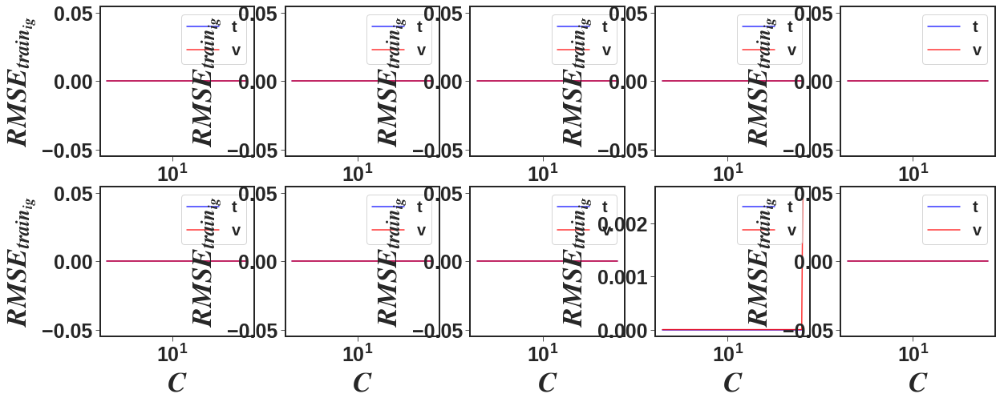

Error in callback <function flush_figures at 0x7f6274543158> (for post_execute):


KeyboardInterrupt: ignored

In [0]:

figX = 20
figY = 20
rows = 5
cols = 5

fig = plt.figure(figsize=(figX,figY))
for i in range(len(gammas)):
  ax = fig.add_subplot(rows, cols, i+1)
  ax.plot(Cs, RMSE_train_ig[:,i], color='b', alpha=0.8)
  ax.plot(Cs, RMSE_valid_ig[:,i], color='r', alpha=0.8)
  # ax.plot(Cs, RMSE_test_ig[:,i], color='m', alpha=0.8)
  ax.set_xlabel(r'$C$',font)
  ax.set_ylabel(r'$RMSE_{train_{ig}}$',font) 
  ax.set_xscale('log')
  ax.legend('tvt')

fig = plt.figure(figsize=(figX,figY))
for i in range(len(Cs)):
  ax = fig.add_subplot(rows, cols, i+1)
  ax.plot(gammas, RMSE_train_ig[i,:], color='b', alpha=0.8)
  ax.plot(gammas, RMSE_valid_ig[i,:], color='r', alpha=0.8)
  # ax.plot(gammas, RMSE_test_ig[:,i], color='m', alpha=0.8)
  ax.set_xlabel(r'$\gamma$',font)
  ax.set_ylabel(r'$RMSE_{train_{ig}}$',font) 
  ax.set_xscale('log')
  ax.legend('tvt')

# Growth
fig = plt.figure(figsize=(figX,figY))
for i in range(len(gammas)):
  ax = fig.add_subplot(rows, cols, i+1)
  ax.plot(Cs, RMSE_train_g[:,i], color='b', alpha=0.8)
  ax.plot(Cs, RMSE_valid_g[:,i], color='r', alpha=0.8)
  # ax.plot(Cs, RMSE_test_g[:,i], color='m', alpha=0.8)
  ax.set_xlabel(r'$C$',font)
  ax.set_ylabel(r'$RMSE_{train_{ig}}$',font) 
  ax.set_xscale('log')
  ax.legend('tvt')

fig = plt.figure(figsize=(figX,figY))
for i in range(len(Cs)):
  ax = fig.add_subplot(rows, cols, i+1)
  ax.plot(gammas, RMSE_train_g[i,:], color='b', alpha=0.8)
  ax.plot(gammas, RMSE_valid_g[i,:], color='r', alpha=0.8)
  # ax.plot(gammas, RMSE_test_g[:,i], color='m', alpha=0.8)
  ax.set_xlabel(r'$\gamma$',font)
  ax.set_ylabel(r'$RMSE_{train_{ig}}$',font) 
  ax.set_xscale('log')
  ax.legend('tvt')



In [0]:
numOfCurrentFeatures = 1
# PIndex = 10
# DIndex = 11
# data = pd.DataFrame(data=global_feature.iloc[:,PIndex])
# data.insert(data.shape[1],global_feature.columns[DIndex],global_feature.iloc[:,DIndex], allow_duplicates=True)
# print(data)
numOfMinFeatures = 1
numOfCases = np.power(2,12) - 1
print('numOfCases:',numOfCases)

baseIndex = 0

rotationCounter = 0
draws = 1
numOfCurrentFeatures = 1

for i in range(global_feature.shape[1]):
  current_permutations = int(math.factorial(12)/(math.factorial(draws)*math.factorial(12-draws)))
  print('current_permutations=',current_permutations)

  for j in range(global_feature.shape[1]):
    data = pd.DataFrame(data=global_feature.iloc[:,j])
    print(data)
    for k in range(draws-1):
      if global_feature.columns[k] != data.columns[k]:
        data.insert(data.shape[1], global_feature.columns[k],global_feature.iloc[:,k], allow_duplicates=True)
        print(data)
  draws = draws + 1
  print('draws=',draws)

rotationCounter = rotationCounter + 1
print()


In [0]:
feature_cols = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']
X_global     = global_feature[feature_cols]
y_global_ig  = global_response['Fdot_IG']

efs_ig = EFS(LinearRegression(), 
          min_features=3, 
          max_features=12, 
          scoring='neg_mean_squared_error', 
          cv=0, 
          print_progress=True,
          n_jobs=-1)
efs_ig.fit(X_global,y_global_ig)


df_ig = pd.DataFrame.from_dict(efs_ig.get_metric_dict()).T
df_ig

df_ig.to_csv('/gdrive/My Drive/Transfer_Learning/Features.csv')#, efs_ig.get_metric_dict(), delimiter=',')

Features: 4017/4017/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [0]:
P_D_index = []
counter=0
for i in range(df_ig.shape[0]):
  temp = list(df_ig.iloc[i]['feature_names'])
  # print(temp)
  # print(len(temp))
  # print(temp[2])
  if temp[len(temp)-2] == 'P' and temp[len(temp)-1] == 'D':
    print(temp)
    # print('YES',i)
    P_D_index.append(i)
    counter = counter + 1
print(counter)
print(P_D_index)

In [0]:
# for splitRatio
# for features
# for Kfold
# for tuning

# Cs       = np.linspace(0.1, 200, 5)  
# gammas   = np.linspace(0.1, 2, 4) 
Cs       = [0.1, 5,    10,  20,   50,  100] 
gammas   = [0.1, 0.25, 0.5, 0.75, 1.0, 1.5]
# for i in range(Cs):
#   Cs[i] = round(Cs[i],2)
# for i in range(gammas):
#   gammas[i] = round(gammas[i],2)    
epsilons = [1e-3] #np.linespace(1e-2, 1e-6 , 5) #1e-3
tol      = 1e-3

print('Cs:',Cs)
print('gammas:',gammas)
print('epsilons:',epsilons)
print('tol:',tol)

# length         = df_ig.shape[0]
length         = len(P_D_index)
RMSE_train_ig  = np.empty([length,1])
RMSE_valid_ig  = np.empty([length,1])
RMSE_test_ig   = np.empty([length,1])
RMSE_train_g   = np.empty([length,1])
RMSE_valid_g   = np.empty([length,1])
RMSE_test_g    = np.empty([length,1])
best_params_ig = np.empty([length,3])
best_params_g  = np.empty([length,3])
model_number   = np.empty([length,1])

best_param_testing = 1
counter = 0
start_total = time.time()
for i in range(len(P_D_index)):
  start_1 = time.time()
  print()
  print()
  print()
  feature_cols = list(df_ig.iloc[P_D_index[i]]['feature_names'])
  counter = counter + 1
  print('i:',i,'/',length)
  model_number[i] = [i]
  print(feature_cols)
  # There should be a Kfold loop here
  X_global     = global_feature[feature_cols]
  y_global_ig  = global_response['Fdot_IG']
  y_global_g   = global_response['Fdot_G']
  X_ig_test    = hypo_feature_true[feature_cols]
  X_g_test     = hypo_feature_true[feature_cols]
  y_ig_test    = hypo_response['Fdot_IG']
  y_g_test     = hypo_response['Fdot_G']
    
  nfolds = 10

  # kfold = KFold(n_splits=nfolds, shuffle=True, random_state=randomSeed)
  # for train_index, valid_index in kfold.split(X_global):
  #   X_global_ig_train, X_global_ig_valid = X_global.loc[train_index], X_global.loc[valid_index]
  #   y_global_ig_train, y_global_ig_valid = y_global_ig[train_index],  y_global_ig[valid_index]
  #   y_global_g_train,  y_global_g_valid  = y_global_g[train_index],   y_global_g[valid_index]

  print()
  print('Tuning ignition SVM parameters...')
  print()
  X = X_global
  y = y_global_ig
  best_param_ig = SVR_tuning(X, y, nfolds, Cs, gammas, epsilons)
  # print('best_param_ig:',best_param_ig)
  best_params_ig[i, 0]  = best_param_ig['C']
  best_params_ig[i, 1]  = best_param_ig['epsilon']
  best_params_ig[i, 2]  = best_param_ig['gamma']
  print('Fitting ignition model..')
  model_global_ig = SVR(kernel = 'rbf', C=round(best_param_ig['C'],4), epsilon=round(best_param_ig['epsilon'],4), gamma=round(best_param_ig['gamma'],4))
  print('Getting training and testing errors...')
  train_error_ig, test_error_ig = calc_metrics(X, y, X_ig_test, y_ig_test, model_global_ig)
  RMSE_train_ig[i] = train_error_ig
  # RMSE_valid_ig[i] = vlid_error_ig
  RMSE_test_ig[i]  = test_error_ig
  print()
  print('train_error_ig:',train_error_ig)
  print('test_error_ig:',test_error_ig)
  print()
  print('Tuning grwoth SVM parameters...')
  print()
  X = X_global
  y = y_global_g
  best_param_g = SVR_tuning(X, y, nfolds, Cs, gammas, epsilons)
  # print('best_param_g:',best_param_g)
  best_params_g[i, 0]  = best_param_g['C']
  best_params_g[i, 1]  = best_param_g['epsilon']
  best_params_g[i, 2]  = best_param_g['gamma']
  print('Fitting growth model..')
  model_global_g = SVR(kernel = 'rbf', C=round(best_param_g['C'],4), epsilon=round(best_param_g['epsilon'],4), gamma=round(best_param_g['gamma'],4))
  print('Getting training and testing errors...')
  train_error_g, test_error_g = calc_metrics(X, y, X_g_test, y_g_test, model_global_g)
  RMSE_train_g[i] = train_error_g
  # RMSE_valid_g[i] = vlid_error_g
  RMSE_test_g[i]  = test_error_g
  print()
  print('train_error_g:',train_error_g)
  print('test_error_g:',test_error_g)
  print()
  end_1 = time.time()
  hours, rem = divmod(end_1 - start_1, 3600)
  minutes, seconds = divmod(rem, 60)
  print('=========================')
  print('Total for this loop: ',"{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
  print('=========================')


print()
print()
print('***Final Results***')
print()
print()
print('min value:',np.min(RMSE_train_ig))
index = np.where(RMSE_train_ig == np.amin(RMSE_train_ig))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
print('C:',best_params_ig[index,0])
print('gamma:',best_params_ig[index,2])
print() 
# # print('RMSE_valid_ig:',RMSE_valid_ig) 
# print('min RMSE_valid_ig:',np.min(RMSE_valid_ig))
# index = np.where(RMSE_valid_ig == np.amin(RMSE_valid_ig))
# print('min index:',index)
# print('min index:',list(zip(index[0],index[1])))
# print('C:',Cs_surf[index])
# print('gamma:',gammas_surf[index])
# if best_param_validation == 1:
#   C_best_ig = Cs_surf[index]
#   gamma_best_ig = gammas_surf[index]
# print() 
# print('RMSE_test_ig:',RMSE_test_ig)
print('min RMSE_test_ig:',np.min(RMSE_test_ig),' <--------')
index = np.where(RMSE_test_ig == np.amin(RMSE_test_ig))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
C_best_ig_test       = best_params_ig[index,0]
epsilon_best_ig_test = best_params_ig[index,1]
gamma_best_ig_test   = best_params_ig[index,2]
print('C:',best_params_ig[index,0])
print('epsilon:',best_params_ig[index,1])
print('gamma:',best_params_ig[index,2])
if best_param_testing == 1:
  C_best_ig        = C_best_ig_test
  epsilon_best_ig  = epsilon_best_ig_test
  gamma_best_ig    = gamma_best_ig_test
  best_features_ig = list(df_ig.iloc[index[0][0]]['feature_names'])
print() 
# print('RMSE_train_g:',RMSE_train_g) 
print('min RMSE_train_g:',np.min(RMSE_train_g))
index = np.where(RMSE_train_g == np.amin(RMSE_train_g))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
print('C:',best_params_ig[index,0])
print('gamma:',best_params_ig[index,2])
print() 
# # print('RMSE_valid_g:',RMSE_valid_g)
# print('min RMSE_valid_g:',np.min(RMSE_valid_g))
# index = np.where(RMSE_valid_g == np.amin(RMSE_valid_g))
# print('min index:',index)
# print('min index:',list(zip(index[0],index[1])))
# print('C:',Cs_surf[index])
# print('gamma:',gammas_surf[index])
# if best_param_validation == 1:
#   C_best_g = Cs_surf[index]
#   gamma_best_g = gammas_surf[index]
# print() 
# print('RMSE_test_g:',RMSE_test_g)
print('min RMSE_test_g:',np.min(RMSE_test_g),' <--------')
index = np.where(RMSE_test_g == np.amin(RMSE_test_g))
print('min index:',index)
print('min index:',list(zip(index[0],index[1])))
C_best_g_test       = best_params_g[index,0]
epsilon_best_g_test = best_params_g[index,1]
gamma_best_g_test   = best_params_g[index,2]
print('C:',best_params_g[index,0])
print('epsilon:',best_params_g[index,1])
print('gamma:',best_params_g[index,2])
if best_param_testing == 1:
  C_best_g        = C_best_g_test
  epsilon_best_g  = epsilon_best_g_test
  gamma_best_g    = gamma_best_g_test
  best_features_g = list(df_ig.iloc[index[0][0]]['feature_names'])
print() 
print()
print()

print('C_best_ig=',C_best_ig)
print('epsilon_best_ig=',gamma_best_ig)
print('gamma_best_ig=',gamma_best_ig)
print('features_best_ig=',best_features_ig)
print()
print('C_best_g=',C_best_g)
print('epsilon_best_g=',gamma_best_g)
print('gamma_best_g=',gamma_best_g)
print('features_best_g=',best_features_g)
print() 
print()
print()



model_global_ig  = SVR(kernel = 'rbf', C=round(best_param_ig['C'],4),  epsilon=round(best_param_ig['epsilon'],4),  gamma=round(best_param_ig['gamma'],4))
model_global_g  = SVR(kernel = 'rbf', C=round(best_param_g['C'],4),  epsilon=round(best_param_g['epsilon'],4),  gamma=round(best_param_g['gamma'],4))

X = X_global[best_features_ig]
y = y_global_ig
model_global_ig.fit(X,y)
X = X_global[best_features_g]
y = y_global_g
model_global_g.fit(X,y)



end_total = time.time()
hours, rem = divmod(end_total - start_total, 3600)
minutes, seconds = divmod(rem, 60)
print('=========================')
print('Total time: ',"{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
print('=========================')



Cs: [0.1, 5, 10, 20, 50, 100]
gammas: [0.1, 0.25, 0.5, 0.75, 1.0, 1.5]
epsilons: [0.001]
tol: 0.001



i: 0 / 1023
['Z1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058786556900958235
test_error_ig: 0.5193933847510024

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977178414626083
test_error_g: 0.16032465842284063

Total for this loop:  00:00:14.85



i: 1 / 1023
['Z2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058786556900958235
test_error_ig: 0.8065840160398778

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977178414626083
test_error_g: 0.7309601578684533

Total for this loop:  00:00:14.64



i: 2 / 1023
['Z3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058786556900958235
test_error_ig: 0.8185651058994139

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977178414626083
test_error_g: 0.7397966369668701

Total for this loop:  00:00:14.54



i: 3 / 1023
['E1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058786556900958235
test_error_ig: 0.6994701340051348

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977178414626083
test_error_g: 0.6538343136729331

Total for this loop:  00:00:14.53



i: 4 / 1023
['E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 0.75}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.06759549046615468
test_error_ig: 1.687248915749762

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 5, 'epsilon': 0.001, 'gamma': 1.5}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.07467984989637094
test_error_g: 0.3388933704849469

Total for this loop:  00:00:14.30



i: 5 / 1023
['E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.06565260950179362
test_error_ig: 1.802044271421285

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 20, 'epsilon': 0.001, 'gamma': 1.5}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.07508573466028856
test_error_g: 0.6231202782293904

Total for this loop:  00:00:12.57



i: 6 / 1023
['h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058786556900958235
test_error_ig: 1.005949114123953

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977178414626083
test_error_g: 0.9029126315104486

Total for this loop:  00:00:14.51



i: 7 / 1023
['h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058786556900958235
test_error_ig: 0.7432495436020619

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977178414626083
test_error_g: 0.685047102703487

Total for this loop:  00:00:14.49



i: 8 / 1023
['h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058786556900958235
test_error_ig: 0.31028702584985496

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977178414626083
test_error_g: 0.11195325446371358

Total for this loop:  00:00:14.49



i: 9 / 1023
['al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058786556900958235
test_error_ig: 0.6228342916216716

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977178414626083
test_error_g: 0.5996449875227936

Total for this loop:  00:00:14.46



i: 10 / 1023
['Z1', 'Z2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.2792023670568726

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.23346289496605166

Total for this loop:  00:00:14.20



i: 11 / 1023
['Z1', 'Z3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.2778979596237903

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.23738523539495682

Total for this loop:  00:00:14.37



i: 12 / 1023
['Z1', 'E1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.29305605813224295

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.20077869301129764

Total for this loop:  00:00:14.45



i: 13 / 1023
['Z1', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058685154775264196
test_error_ig: 0.35527813848472256

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697793268817979
test_error_g: 0.23840394951761537

Total for this loop:  00:00:14.25



i: 14 / 1023
['Z1', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05874797004109031
test_error_ig: 0.43251121336539616

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697837594416298
test_error_g: 0.20411286760881098

Total for this loop:  00:00:14.45



i: 15 / 1023
['Z1', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.26833555467156406

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.32105310211734867

Total for this loop:  00:00:14.21



i: 16 / 1023
['Z1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.28694474350567756

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.21368253446786958

Total for this loop:  00:00:14.31



i: 17 / 1023
['Z1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.4663139134744603

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.11528396250022079

Total for this loop:  00:00:14.31



i: 18 / 1023
['Z1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.30509322946710005

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.17940538969630046

Total for this loop:  00:00:14.25



i: 19 / 1023
['Z2', 'Z3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.7976460769133612

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.7649975936922473

Total for this loop:  00:00:14.19



i: 20 / 1023
['Z2', 'E1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.7186240305270981

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.7169931582363792

Total for this loop:  00:00:14.26



i: 21 / 1023
['Z2', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058685154775264196
test_error_ig: 0.46275160472378335

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697793268817979
test_error_g: 0.6552697147972204

Total for this loop:  00:00:14.25



i: 22 / 1023
['Z2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05874797004109031
test_error_ig: 0.2676213284614578

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697837594416298
test_error_g: 0.4637420115191537

Total for this loop:  00:00:14.40



i: 23 / 1023
['Z2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.9041548376025103

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.842161115117393

Total for this loop:  00:00:14.22



i: 24 / 1023
['Z2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.7480389482092981

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.7347272082477412

Total for this loop:  00:00:14.21



i: 25 / 1023
['Z2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.2377442116935313

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.35455472394023063

Total for this loop:  00:00:14.19



i: 26 / 1023
['Z2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.6662986585536517

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.6855307360179309

Total for this loop:  00:00:14.06



i: 27 / 1023
['Z3', 'E1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.7260465420480876

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.7218277099777648

Total for this loop:  00:00:14.03



i: 28 / 1023
['Z3', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058685154775264196
test_error_ig: 0.4676176902129771

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697793268817979
test_error_g: 0.6595307415564183

Total for this loop:  00:00:14.28



i: 29 / 1023
['Z3', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05874797004109031
test_error_ig: 0.26823868474520085

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697837594416298
test_error_g: 0.4672216091485397

Total for this loop:  00:00:14.46



i: 30 / 1023
['Z3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.9123247746202633

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.8466476004625485

Total for this loop:  00:00:14.15



i: 31 / 1023
['Z3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.7556183373923626

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.7395532842464324

Total for this loop:  00:00:13.99



i: 32 / 1023
['Z3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.23927199723914827

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.358952981808697

Total for this loop:  00:00:13.97



i: 33 / 1023
['Z3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.6734273119021491

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.6903691210122841

Total for this loop:  00:00:14.18



i: 34 / 1023
['E1', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058685154775264196
test_error_ig: 0.41932022812252084

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697793268817979
test_error_g: 0.6172947079244112

Total for this loop:  00:00:14.07



i: 35 / 1023
['E1', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05874797004109031
test_error_ig: 0.2644200582092177

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697837594416298
test_error_g: 0.43342683338774113

Total for this loop:  00:00:14.07



i: 36 / 1023
['E1', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.8290780615694497

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.8013312033172106

Total for this loop:  00:00:14.32



i: 37 / 1023
['E1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.6788710706000134

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.6914400473771918

Total for this loop:  00:00:14.48



i: 38 / 1023
['E1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.2286559275339733

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.31680098024903225

Total for this loop:  00:00:14.29



i: 39 / 1023
['E1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.6015209793017697

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.6423509713830539

Total for this loop:  00:00:14.46



i: 40 / 1023
['E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 0.75}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0674402097813057
test_error_ig: 0.9893505090246801

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 5, 'epsilon': 0.001, 'gamma': 1.5}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.07450357475933486
test_error_g: 0.14948928631247707

Total for this loop:  00:00:14.52



i: 41 / 1023
['E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058685154775264196
test_error_ig: 0.5376201144613164

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697793268817979
test_error_g: 0.7306696827810251

Total for this loop:  00:00:14.69



i: 42 / 1023
['E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058685154775264196
test_error_ig: 0.4370172524489194

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697793268817979
test_error_g: 0.6328145186620625

Total for this loop:  00:00:14.14



i: 43 / 1023
['E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058685154775264196
test_error_ig: 0.2754239630058477

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697793268817979
test_error_g: 0.31947147067693993

Total for this loop:  00:00:14.02



i: 44 / 1023
['E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058685154775264196
test_error_ig: 0.38878047322219983

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697793268817979
test_error_g: 0.5899619590968281

Total for this loop:  00:00:14.05



i: 45 / 1023
['E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05874797004109031
test_error_ig: 0.284424593959265

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697837594416298
test_error_g: 0.5308907450608241

Total for this loop:  00:00:14.35



i: 46 / 1023
['E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05874797004109031
test_error_ig: 0.26521581451985593

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697837594416298
test_error_g: 0.44567837612357053

Total for this loop:  00:00:14.36



i: 47 / 1023
['E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05874797004109031
test_error_ig: 0.3712602860517461

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697837594416298
test_error_g: 0.23297285743674945

Total for this loop:  00:00:14.19



i: 48 / 1023
['E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05874797004109031
test_error_ig: 0.2648003149823125

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697837594416298
test_error_g: 0.4122468547408333

Total for this loop:  00:00:14.12



i: 49 / 1023
['h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.8601550126527336

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.8181818885137228

Total for this loop:  00:00:14.03



i: 50 / 1023
['h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.27824168290371976

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.445287134622711

Total for this loop:  00:00:13.99



i: 51 / 1023
['h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.773580061116651

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.7712058830269919

Total for this loop:  00:00:14.11



i: 52 / 1023
['h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.23136101084608132

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.33195115823454674

Total for this loop:  00:00:14.07



i: 53 / 1023
['h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.6281899298000911

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.6600125932534747

Total for this loop:  00:00:13.88



i: 54 / 1023
['h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058522709416398554
test_error_ig: 0.22740525118857297

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977735030864078
test_error_g: 0.2908779298188605

Total for this loop:  00:00:14.28



i: 55 / 1023
['Z1', 'Z2', 'Z3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2855056243723061

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.3238075458445971

Total for this loop:  00:00:14.15



i: 56 / 1023
['Z1', 'Z2', 'E1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2920538157584026

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.3009942516886327

Total for this loop:  00:00:14.06



i: 57 / 1023
['Z1', 'Z2', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.3395757856504513

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.3119631560086185

Total for this loop:  00:00:14.04



i: 58 / 1023
['Z1', 'Z2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0585241730572477
test_error_ig: 0.39299044534325006

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422991
test_error_g: 0.275174922264253

Total for this loop:  00:00:13.96



i: 59 / 1023
['Z1', 'Z2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.282695605382167

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.3702503551175338

Total for this loop:  00:00:14.08



i: 60 / 1023
['Z1', 'Z2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.28937512662763976

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.30920055226465626

Total for this loop:  00:00:13.88



i: 61 / 1023
['Z1', 'Z2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.3825343415215078

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.17013968972105206

Total for this loop:  00:00:13.98



i: 62 / 1023
['Z1', 'Z2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.29744744047829613

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.2869354801444942

Total for this loop:  00:00:13.98



i: 63 / 1023
['Z1', 'Z3', 'E1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.29143734326609144

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.30348602793166946

Total for this loop:  00:00:13.95



i: 64 / 1023
['Z1', 'Z3', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.33893267273202526

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.3136527933919137

Total for this loop:  00:00:13.94



i: 65 / 1023
['Z1', 'Z3', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0585241730572477
test_error_ig: 0.3925050071007182

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422991
test_error_g: 0.2765437898860692

Total for this loop:  00:00:13.92



i: 66 / 1023
['Z1', 'Z3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2822355934182757

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.37219171781817084

Total for this loop:  00:00:13.99



i: 67 / 1023
['Z1', 'Z3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.28878632105383145

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.31164926526248743

Total for this loop:  00:00:13.94



i: 68 / 1023
['Z1', 'Z3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.38162932282556444

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.1727995771417016

Total for this loop:  00:00:13.85



i: 69 / 1023
['Z1', 'Z3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.29678344406913326

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.28949339786226397

Total for this loop:  00:00:13.93



i: 70 / 1023
['Z1', 'E1', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.3457901649318492

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.29760140882809644

Total for this loop:  00:00:13.84



i: 71 / 1023
['Z1', 'E1', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0585241730572477
test_error_ig: 0.3975373665609418

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422991
test_error_g: 0.26384366618765476

Total for this loop:  00:00:13.96



i: 72 / 1023
['Z1', 'E1', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2877638978002664

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.35329773862795466

Total for this loop:  00:00:13.94



i: 73 / 1023
['Z1', 'E1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2957304780952739

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.28822800346519123

Total for this loop:  00:00:13.97



i: 74 / 1023
['Z1', 'E1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.3912616803126597

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.1489484730566411

Total for this loop:  00:00:14.04



i: 75 / 1023
['Z1', 'E1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.3044500730187313

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.2651726037582444

Total for this loop:  00:00:13.98



i: 76 / 1023
['Z1', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0587079537758106
test_error_ig: 0.42058747029913957

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977638707003697
test_error_g: 0.2873003142481899

Total for this loop:  00:00:14.09



i: 77 / 1023
['Z1', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.33174253239996565

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.3476166752904506

Total for this loop:  00:00:13.70



i: 78 / 1023
['Z1', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.3431548456385349

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.30333399375782333

Total for this loop:  00:00:13.85



i: 79 / 1023
['Z1', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.4112728869314167

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.21423873709238273

Total for this loop:  00:00:14.08



i: 80 / 1023
['Z1', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.3506991317516512

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.2878898304508792

Total for this loop:  00:00:13.99



i: 81 / 1023
['Z1', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.3862429379235318

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.306565716170814

Total for this loop:  00:00:13.80



i: 82 / 1023
['Z1', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.3956364656824216

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.26830443987756997

Total for this loop:  00:00:13.91



i: 83 / 1023
['Z1', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.43969084549885745

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.20841266872901576

Total for this loop:  00:00:13.73



i: 84 / 1023
['Z1', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.4009985458797057

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.2564609589368893

Total for this loop:  00:00:13.95



i: 85 / 1023
['Z1', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.28549070494487355

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.3601574556857783

Total for this loop:  00:00:14.10



i: 86 / 1023
['Z1', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.37069144682984134

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.23592141217138907

Total for this loop:  00:00:14.22



i: 87 / 1023
['Z1', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.29239092888731194

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.3414099061346552

Total for this loop:  00:00:13.93



i: 88 / 1023
['Z1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.3875627299944283

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.15710090989388784

Total for this loop:  00:00:13.96



i: 89 / 1023
['Z1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.3013687925531176

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.27386683959836644

Total for this loop:  00:00:13.99



i: 90 / 1023
['Z1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.39814839051256684

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.13613139204200672

Total for this loop:  00:00:14.00



i: 91 / 1023
['Z2', 'Z3', 'E1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.664559496390128

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.721365891784168

Total for this loop:  00:00:13.93



i: 92 / 1023
['Z2', 'Z3', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.4240120728587278

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.6183650138858903

Total for this loop:  00:00:13.84



i: 93 / 1023
['Z2', 'Z3', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0585241730572477
test_error_ig: 0.27406521015283686

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422991
test_error_g: 0.4601517480820343

Total for this loop:  00:00:13.94



i: 94 / 1023
['Z2', 'Z3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.8190337771165204

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.8118229582252166

Total for this loop:  00:00:13.86



i: 95 / 1023
['Z2', 'Z3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.6896316916614915

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7351830178736304

Total for this loop:  00:00:14.02



i: 96 / 1023
['Z2', 'Z3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2609066083192978

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.4266155812478261

Total for this loop:  00:00:14.03



i: 97 / 1023
['Z2', 'Z3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.6199312804006948

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.6965897847667446

Total for this loop:  00:00:14.17



i: 98 / 1023
['Z2', 'E1', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.3882765192182735

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.5905348964438826

Total for this loop:  00:00:14.00



i: 99 / 1023
['Z2', 'E1', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0585241730572477
test_error_ig: 0.27378357699688644

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422991
test_error_g: 0.4408933307057167

Total for this loop:  00:00:13.92



i: 100 / 1023
['Z2', 'E1', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.7463590803801299

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7751081023189356

Total for this loop:  00:00:14.12



i: 101 / 1023
['Z2', 'E1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.6254001936448598

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.6985060960192633

Total for this loop:  00:00:14.07



i: 102 / 1023
['Z2', 'E1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2522566417498821

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.3990495452355705

Total for this loop:  00:00:14.01



i: 103 / 1023
['Z2', 'E1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.5609756752324252

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.6607218704478149

Total for this loop:  00:00:14.20



i: 104 / 1023
['Z2', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0587079537758106
test_error_ig: 0.301359479975573

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977638707003697
test_error_g: 0.42660265318655405

Total for this loop:  00:00:14.24



i: 105 / 1023
['Z2', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.47313265903242807

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.6595304405367004

Total for this loop:  00:00:14.19



i: 106 / 1023
['Z2', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.4013664255446504

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.6008786026144624

Total for this loop:  00:00:14.04



i: 107 / 1023
['Z2', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.28185440348419444

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.3787864756126762

Total for this loop:  00:00:14.03



i: 108 / 1023
['Z2', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.36577782423554983

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.5720712905084845

Total for this loop:  00:00:13.94



i: 109 / 1023
['Z2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.2792913775841405

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.4917999593914402

Total for this loop:  00:00:13.90



i: 110 / 1023
['Z2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.2735709718820365

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.4479746756840948

Total for this loop:  00:00:13.94



i: 111 / 1023
['Z2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.3480413659590683

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.3092048834386668

Total for this loop:  00:00:13.73



i: 112 / 1023
['Z2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.27509332860718816

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.4284306191847811

Total for this loop:  00:00:13.72



i: 113 / 1023
['Z2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.7734979075131179

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7888498864918153

Total for this loop:  00:00:13.76



i: 114 / 1023
['Z2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2826468078068203

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.47665288343952084

Total for this loop:  00:00:13.78



i: 115 / 1023
['Z2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.6979232218217227

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7503583910998786

Total for this loop:  00:00:13.95



i: 116 / 1023
['Z2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.25492575627295916

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.4091054984268297

Total for this loop:  00:00:13.94



i: 117 / 1023
['Z2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.5828886372967008

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.6740514434909595

Total for this loop:  00:00:13.92



i: 118 / 1023
['Z2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.24913083441284795

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.38149565566459553

Total for this loop:  00:00:14.00



i: 119 / 1023
['Z3', 'E1', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.3914978527408282

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.5932571007707318

Total for this loop:  00:00:13.88



i: 120 / 1023
['Z3', 'E1', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0585241730572477
test_error_ig: 0.27373870713162635

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422991
test_error_g: 0.44283796346689275

Total for this loop:  00:00:13.61



i: 121 / 1023
['Z3', 'E1', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.7530132682463582

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7786182539998833

Total for this loop:  00:00:13.70



i: 122 / 1023
['Z3', 'E1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.6313178346981384

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.702088895570461

Total for this loop:  00:00:13.69



i: 123 / 1023
['Z3', 'E1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2530115549603979

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.4019409924838945

Total for this loop:  00:00:13.69



i: 124 / 1023
['Z3', 'E1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.566418464700816

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.6642528820402002

Total for this loop:  00:00:13.79



i: 125 / 1023
['Z3', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0587079537758106
test_error_ig: 0.3007098598017831

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977638707003697
test_error_g: 0.42818828462104436

Total for this loop:  00:00:13.69



i: 126 / 1023
['Z3', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.4772137014575822

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.662230288072033

Total for this loop:  00:00:13.79



i: 127 / 1023
['Z3', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.404747343023126

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.6036168446968408

Total for this loop:  00:00:13.69



i: 128 / 1023
['Z3', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.2814221797768945

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.38086774797875134

Total for this loop:  00:00:13.60



i: 129 / 1023
['Z3', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.3686994182621462

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.5747597365885653

Total for this loop:  00:00:13.66



i: 130 / 1023
['Z3', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.2797427747428493

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.49361524680618984

Total for this loop:  00:00:13.73



i: 131 / 1023
['Z3', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.27360424562963465

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.44991927049138036

Total for this loop:  00:00:13.59



i: 132 / 1023
['Z3', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.3473958307161137

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.3108373517318022

Total for this loop:  00:00:13.70



i: 133 / 1023
['Z3', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.2749176168815298

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.43037013583078243

Total for this loop:  00:00:13.69



i: 134 / 1023
['Z3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.7803496380064547

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7923970861371658

Total for this loop:  00:00:13.57



i: 135 / 1023
['Z3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.28404717991843886

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.47911208288012447

Total for this loop:  00:00:13.65



i: 136 / 1023
['Z3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.7042165339769453

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7537976565106121

Total for this loop:  00:00:13.82



i: 137 / 1023
['Z3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.25581131046419836

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.41196818288057774

Total for this loop:  00:00:13.86



i: 138 / 1023
['Z3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.5884912049940909

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.6775946073711024

Total for this loop:  00:00:13.65



i: 139 / 1023
['Z3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.24964744893485424

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.3844292571046187

Total for this loop:  00:00:13.62



i: 140 / 1023
['E1', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0587079537758106
test_error_ig: 0.3078091461946827

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977638707003697
test_error_g: 0.41255541610207125

Total for this loop:  00:00:14.08



i: 141 / 1023
['E1', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.43628431198177225

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.6347561089235125

Total for this loop:  00:00:13.64



i: 142 / 1023
['E1', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.3713170406964422

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.5760235443658716

Total for this loop:  00:00:13.62



i: 143 / 1023
['E1', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.2867447901690249

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.36065180896273624

Total for this loop:  00:00:13.73



i: 144 / 1023
['E1', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.34016227383307157

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.5477701317209599

Total for this loop:  00:00:13.58



i: 145 / 1023
['E1', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.2764163134100338

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.475384722553011

Total for this loop:  00:00:13.58



i: 146 / 1023
['E1', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.2744496103704559

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.4306658477755297

Total for this loop:  00:00:13.78



i: 147 / 1023
['E1', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.3542199037537739

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.2953758422234402

Total for this loop:  00:00:13.60



i: 148 / 1023
['E1', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.2777706330122199

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.41126583376115206

Total for this loop:  00:00:13.63



i: 149 / 1023
['E1', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.7105282164897387

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7562213055059617

Total for this loop:  00:00:13.74



i: 150 / 1023
['E1', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.27152585001340873

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.4546972725403022

Total for this loop:  00:00:13.60



i: 151 / 1023
['E1', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.6402127994510275

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7188085690207042

Total for this loop:  00:00:13.56



i: 152 / 1023
['E1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.24904324515914497

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.38399973959962475

Total for this loop:  00:00:13.67



i: 153 / 1023
['E1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.5318471926500268

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.6419100706789818

Total for this loop:  00:00:13.65



i: 154 / 1023
['E1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2466754459780508

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.35592671881172766

Total for this loop:  00:00:13.72



i: 155 / 1023
['E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0587079537758106
test_error_ig: 0.2933736696066297

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977638707003697
test_error_g: 0.4547488984614118

Total for this loop:  00:00:13.91



i: 156 / 1023
['E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0587079537758106
test_error_ig: 0.30503632962697075

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977638707003697
test_error_g: 0.4182766194960873

Total for this loop:  00:00:13.68



i: 157 / 1023
['E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0587079537758106
test_error_ig: 0.3877002671157642

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977638707003697
test_error_g: 0.3113982935636445

Total for this loop:  00:00:13.66



i: 158 / 1023
['E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0587079537758106
test_error_ig: 0.3131120441722151

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06977638707003697
test_error_g: 0.4025554115334121

Total for this loop:  00:00:13.86



i: 159 / 1023
['E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.4513802717899897

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.64501610449949

Total for this loop:  00:00:13.65



i: 160 / 1023
['E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.2791542086147381

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.4189962215410279

Total for this loop:  00:00:13.63



i: 161 / 1023
['E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.4099997215671875

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.6163400392954157

Total for this loop:  00:00:13.71



i: 162 / 1023
['E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.2845282094881935

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.3679813893910208

Total for this loop:  00:00:13.80



i: 163 / 1023
['E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.3504836068537982

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.5577659162522426

Total for this loop:  00:00:13.63



i: 164 / 1023
['E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058428949966794604
test_error_ig: 0.2913301162858056

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697961773435808
test_error_g: 0.34797681911914774

Total for this loop:  00:00:13.40



i: 165 / 1023
['E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.27732566074451076

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.48213608433608257

Total for this loop:  00:00:13.31



i: 166 / 1023
['E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.3398275095091825

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.3439803431208135

Total for this loop:  00:00:13.34



i: 167 / 1023
['E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.27579943322235173

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.4634005077197684

Total for this loop:  00:00:13.36



i: 168 / 1023
['E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.35161099131374407

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.3008859409095564

Total for this loop:  00:00:13.33



i: 169 / 1023
['E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.276435190092532

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.4182551255005579

Total for this loop:  00:00:13.46



i: 170 / 1023
['E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852417305724748
test_error_ig: 0.3590471685712937

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979786338422955
test_error_g: 0.28607068461687124

Total for this loop:  00:00:13.28



i: 171 / 1023
['h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.27574342600794316

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.46367701561223434

Total for this loop:  00:00:13.57



i: 172 / 1023
['h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.6640669181153032

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.7318750924623441

Total for this loop:  00:00:13.38



i: 173 / 1023
['h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2654058222683153

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.43886949213578363

Total for this loop:  00:00:13.40



i: 174 / 1023
['h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05847992248011518
test_error_ig: 0.2472083806383675

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982270693859795
test_error_g: 0.36626665347315474

Total for this loop:  00:00:13.45



i: 175 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3075953142877546

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3450213734002554

Total for this loop:  00:00:13.76



i: 176 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.34738388820630317

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.3403088406998683

Total for this loop:  00:00:13.60



i: 177 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.3956080501179143

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.3067189376645101

Total for this loop:  00:00:13.44



i: 178 / 1023
['Z1', 'Z2', 'Z3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2958118016303484

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.38953006723976413

Total for this loop:  00:00:13.48



i: 179 / 1023
['Z1', 'Z2', 'Z3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.30506106726557863

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3506561232050717

Total for this loop:  00:00:13.51



i: 180 / 1023
['Z1', 'Z2', 'Z3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3822209773216685

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.24904812540720567

Total for this loop:  00:00:13.95



i: 181 / 1023
['Z1', 'Z2', 'Z3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.312482553991237

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3352608690764089

Total for this loop:  00:00:13.71



i: 182 / 1023
['Z1', 'Z2', 'E1', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.35353766822620125

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.3299697264083559

Total for this loop:  00:00:13.35



i: 183 / 1023
['Z1', 'Z2', 'E1', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.3995108734702182

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.29901203290658424

Total for this loop:  00:00:13.44



i: 184 / 1023
['Z1', 'Z2', 'E1', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.30210947416367834

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3759109375766752

Total for this loop:  00:00:13.72



i: 185 / 1023
['Z1', 'Z2', 'E1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3115593904384992

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.33482216978805174

Total for this loop:  00:00:13.76



i: 186 / 1023
['Z1', 'Z2', 'E1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3868994595672739

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.23311589849589212

Total for this loop:  00:00:13.61



i: 187 / 1023
['Z1', 'Z2', 'E1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3190262895076721

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3190802665630321

Total for this loop:  00:00:13.63



i: 188 / 1023
['Z1', 'Z2', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058463100733593655
test_error_ig: 0.4176916024700045

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521444
test_error_g: 0.30905921579411816

Total for this loop:  00:00:13.58



i: 189 / 1023
['Z1', 'Z2', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3405267931241298

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.3602861245655467

Total for this loop:  00:00:13.64



i: 190 / 1023
['Z1', 'Z2', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.35119258743329435

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.33370304780833676

Total for this loop:  00:00:13.51



i: 191 / 1023
['Z1', 'Z2', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.409044095671405

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.2697602671986284

Total for this loop:  00:00:13.51



i: 192 / 1023
['Z1', 'Z2', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3578558907331585

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.32355327694188907

Total for this loop:  00:00:13.46



i: 193 / 1023
['Z1', 'Z2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.3910527702336656

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.32355334913426526

Total for this loop:  00:00:13.64



i: 194 / 1023
['Z1', 'Z2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.3980352275860716

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.30175300450757664

Total for this loop:  00:00:13.44



i: 195 / 1023
['Z1', 'Z2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.43213489182463843

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.2593325782778148

Total for this loop:  00:00:13.48



i: 196 / 1023
['Z1', 'Z2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.4021963079085444

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.29439268538001373

Total for this loop:  00:00:13.48



i: 197 / 1023
['Z1', 'Z2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2996239666903756

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3808955974128283

Total for this loop:  00:00:13.63



i: 198 / 1023
['Z1', 'Z2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.37773287726684357

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.2868046737095844

Total for this loop:  00:00:13.56



i: 199 / 1023
['Z1', 'Z2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.30692301199589916

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.36719196548147914

Total for this loop:  00:00:13.42



i: 200 / 1023
['Z1', 'Z2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.38509738133251087

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.23872292465483586

Total for this loop:  00:00:13.56



i: 201 / 1023
['Z1', 'Z2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.31646487719537547

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.32491859199122736

Total for this loop:  00:00:13.63



i: 202 / 1023
['Z1', 'Z2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.39025902288283376

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.2237965879981368

Total for this loop:  00:00:13.62



i: 203 / 1023
['Z1', 'Z3', 'E1', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.35297509509748154

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.33107345270125405

Total for this loop:  00:00:13.42



i: 204 / 1023
['Z1', 'Z3', 'E1', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.3991552683430542

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.2998738739795412

Total for this loop:  00:00:13.37



i: 205 / 1023
['Z1', 'Z3', 'E1', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.30151752931779696

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3773063703576755

Total for this loop:  00:00:13.30



i: 206 / 1023
['Z1', 'Z3', 'E1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3109662790497148

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3365124515841593

Total for this loop:  00:00:14.03



i: 207 / 1023
['Z1', 'Z3', 'E1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3864592226302847

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.23495413891163353

Total for this loop:  00:00:13.86



i: 208 / 1023
['Z1', 'Z3', 'E1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.31843216445781214

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.32082889223026856

Total for this loop:  00:00:13.42



i: 209 / 1023
['Z1', 'Z3', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058463100733593655
test_error_ig: 0.417418908263921

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521444
test_error_g: 0.30960279947040503

Total for this loop:  00:00:13.60



i: 210 / 1023
['Z1', 'Z3', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.33990687083186333

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.36120459965929397

Total for this loop:  00:00:13.51



i: 211 / 1023
['Z1', 'Z3', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3506205136769558

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.3347947144839868

Total for this loop:  00:00:13.70



i: 212 / 1023
['Z1', 'Z3', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.4087411916521491

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.27089144366290147

Total for this loop:  00:00:13.45



i: 213 / 1023
['Z1', 'Z3', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3573111230844023

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.3246744606352177

Total for this loop:  00:00:13.60



i: 214 / 1023
['Z1', 'Z3', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.39064523868798995

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.3242000315631624

Total for this loop:  00:00:13.39



i: 215 / 1023
['Z1', 'Z3', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.39767135988779706

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.3025975818743546

Total for this loop:  00:00:13.33



i: 216 / 1023
['Z1', 'Z3', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.43195341921947944

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.2603342642437955

Total for this loop:  00:00:13.24



i: 217 / 1023
['Z1', 'Z3', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.4018555334860532

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.29528137123434745

Total for this loop:  00:00:13.30



i: 218 / 1023
['Z1', 'Z3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.29904171230119186

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3822868367910174

Total for this loop:  00:00:13.16



i: 219 / 1023
['Z1', 'Z3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.37729357885710946

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.2880765878751548

Total for this loop:  00:00:13.19



i: 220 / 1023
['Z1', 'Z3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.30631817339151823

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3685909721785385

Total for this loop:  00:00:13.35



i: 221 / 1023
['Z1', 'Z3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.384659069533114

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.24051376955171191

Total for this loop:  00:00:13.37



i: 222 / 1023
['Z1', 'Z3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.31587017570378917

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3266407689273362

Total for this loop:  00:00:13.24



i: 223 / 1023
['Z1', 'Z3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.38981405992728635

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.2257082873418474

Total for this loop:  00:00:13.83



i: 224 / 1023
['Z1', 'E1', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058463100733593655
test_error_ig: 0.42022655708836587

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521444
test_error_g: 0.3044901405657348

Total for this loop:  00:00:13.44



i: 225 / 1023
['Z1', 'E1', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.34641626947578313

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.35220652930961677

Total for this loop:  00:00:13.74



i: 226 / 1023
['Z1', 'E1', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3566371620900471

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.3242862658035376

Total for this loop:  00:00:13.71



i: 227 / 1023
['Z1', 'E1', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.4119153861538765

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.26041235358856996

Total for this loop:  00:00:13.61



i: 228 / 1023
['Z1', 'E1', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.363037636691288

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.31394305684581875

Total for this loop:  00:00:13.47



i: 229 / 1023
['Z1', 'E1', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.3948676274681997

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.3180080045568987

Total for this loop:  00:00:14.63



i: 230 / 1023
['Z1', 'E1', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.4014548532894435

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.294645804752411

Total for this loop:  00:00:14.40



i: 231 / 1023
['Z1', 'E1', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.43384858201774595

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.2511602641622468

Total for this loop:  00:00:14.25



i: 232 / 1023
['Z1', 'E1', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.405401989117582

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.2869541874955948

Total for this loop:  00:00:13.71



i: 233 / 1023
['Z1', 'E1', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.30547983948281465

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3686120985854338

Total for this loop:  00:00:13.90



i: 234 / 1023
['Z1', 'E1', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.381935874756708

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.2761030852675302

Total for this loop:  00:00:13.69



i: 235 / 1023
['Z1', 'E1', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3129296397510252

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3549142702798612

Total for this loop:  00:00:13.66



i: 236 / 1023
['Z1', 'E1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3893641080246741

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.22390884785485105

Total for this loop:  00:00:14.12



i: 237 / 1023
['Z1', 'E1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3224051028651877

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.31008716817398185

Total for this loop:  00:00:14.19



i: 238 / 1023
['Z1', 'E1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3945980968861542

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.20807869613563454

Total for this loop:  00:00:14.15



i: 239 / 1023
['Z1', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.4139247701673412

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3209526109010591

Total for this loop:  00:00:14.21



i: 240 / 1023
['Z1', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.4191710609863898

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.30630356234696665

Total for this loop:  00:00:14.67



i: 241 / 1023
['Z1', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.4426793362174407

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.278716223704359

Total for this loop:  00:00:14.47



i: 242 / 1023
['Z1', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.42213317695501607

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.30144549695816725

Total for this loop:  00:00:14.26



i: 243 / 1023
['Z1', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3439378613752079

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.35548589236745237

Total for this loop:  00:00:13.95



i: 244 / 1023
['Z1', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.40523047233966947

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.29612742937314473

Total for this loop:  00:00:14.42



i: 245 / 1023
['Z1', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3509778285855404

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.3465064269590879

Total for this loop:  00:00:14.06



i: 246 / 1023
['Z1', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.41070913439539547

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.26409053472882804

Total for this loop:  00:00:13.97



i: 247 / 1023
['Z1', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3608566596795594

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.31779537387310364

Total for this loop:  00:00:14.04



i: 248 / 1023
['Z1', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.41412490577780847

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.25432007322137135

Total for this loop:  00:00:14.30



i: 249 / 1023
['Z1', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.39327406109639335

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.32023100379420133

Total for this loop:  00:00:13.68



i: 250 / 1023
['Z1', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.42978254736373334

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.2836620838293899

Total for this loop:  00:00:14.54



i: 251 / 1023
['Z1', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.397761255775736

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.31421709223100297

Total for this loop:  00:00:14.04



i: 252 / 1023
['Z1', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.43312980028230347

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.2543543178299149

Total for this loop:  00:00:14.55



i: 253 / 1023
['Z1', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.4040599675370512

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.289900436799105

Total for this loop:  00:00:14.74



i: 254 / 1023
['Z1', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.4351623413962903

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.2459268003869878

Total for this loop:  00:00:14.18



i: 255 / 1023
['Z1', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3801627144527673

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.28035348867936455

Total for this loop:  00:00:14.31



i: 256 / 1023
['Z1', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.31034960648686516

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3598933865323802

Total for this loop:  00:00:14.03



i: 257 / 1023
['Z1', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.3852055777745742

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.2689539640666773

Total for this loop:  00:00:14.00



i: 258 / 1023
['Z1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.392751403308769

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.21424557263744162

Total for this loop:  00:00:13.73



i: 259 / 1023
['Z2', 'Z3', 'E1', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.35645419717119703

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5758663833461218

Total for this loop:  00:00:13.74



i: 260 / 1023
['Z2', 'Z3', 'E1', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.2788838464576643

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.4403950287567442

Total for this loop:  00:00:13.66



i: 261 / 1023
['Z2', 'Z3', 'E1', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.6749616920305096

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.7495253014123219

Total for this loop:  00:00:13.74



i: 262 / 1023
['Z2', 'Z3', 'E1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.5701044885551875

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.6878232217838814

Total for this loop:  00:00:13.76



i: 263 / 1023
['Z2', 'Z3', 'E1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2667050555905787

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.4297750518671962

Total for this loop:  00:00:13.81



i: 264 / 1023
['Z2', 'Z3', 'E1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.5140456286299439

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.6556212233686759

Total for this loop:  00:00:13.77



i: 265 / 1023
['Z2', 'Z3', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058463100733593655
test_error_ig: 0.31139539191577725

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521444
test_error_g: 0.4068603514270314

Total for this loop:  00:00:13.81



i: 266 / 1023
['Z2', 'Z3', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.42567159217988726

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.630034858697473

Total for this loop:  00:00:13.74



i: 267 / 1023
['Z2', 'Z3', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3670350612525313

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5843941412888047

Total for this loop:  00:00:13.89



i: 268 / 1023
['Z2', 'Z3', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.29198293859956714

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.39778934383094977

Total for this loop:  00:00:13.81



i: 269 / 1023
['Z2', 'Z3', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3385285897528544

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5605546116959592

Total for this loop:  00:00:13.77



i: 270 / 1023
['Z2', 'Z3', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.27650245158819453

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.4766685698287584

Total for this loop:  00:00:13.62



i: 271 / 1023
['Z2', 'Z3', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.277710305730206

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.44578923675419857

Total for this loop:  00:00:13.82



i: 272 / 1023
['Z2', 'Z3', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.35482845230262755

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.33598880623512795

Total for this loop:  00:00:13.99



i: 273 / 1023
['Z2', 'Z3', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.28168239742806833

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.43081548770101996

Total for this loop:  00:00:13.74



i: 274 / 1023
['Z2', 'Z3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.6992822290849131

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.7616664731207735

Total for this loop:  00:00:13.82



i: 275 / 1023
['Z2', 'Z3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.28135910325925273

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.48390167361850855

Total for this loop:  00:00:13.85



i: 276 / 1023
['Z2', 'Z3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.6316492072491533

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.7275904659437047

Total for this loop:  00:00:13.77



i: 277 / 1023
['Z2', 'Z3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2677123858292495

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.4372810723257375

Total for this loop:  00:00:13.93



i: 278 / 1023
['Z2', 'Z3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.5329692064904898

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.6668462937462332

Total for this loop:  00:00:13.61



i: 279 / 1023
['Z2', 'Z3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.26602596133375583

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.4165459549354799

Total for this loop:  00:00:14.03



i: 280 / 1023
['Z2', 'E1', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058463100733593655
test_error_ig: 0.318350506880915

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521444
test_error_g: 0.3967856399145023

Total for this loop:  00:00:13.84



i: 281 / 1023
['Z2', 'E1', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3914483407093431

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.6067656483430542

Total for this loop:  00:00:13.98



i: 282 / 1023
['Z2', 'E1', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.34073097944941894

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.562035248252932

Total for this loop:  00:00:13.85



i: 283 / 1023
['Z2', 'E1', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.2981659582377446

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.383776123420828

Total for this loop:  00:00:13.61



i: 284 / 1023
['Z2', 'E1', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3171181485417742

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5390529771671706

Total for this loop:  00:00:13.91



i: 285 / 1023
['Z2', 'E1', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.27686738958626406

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.4622060036249716

Total for this loop:  00:00:13.90



i: 286 / 1023
['Z2', 'E1', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.28115223570223113

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.43144183437695677

Total for this loop:  00:00:13.86



i: 287 / 1023
['Z2', 'E1', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.36072773570489963

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.3262059213500474

Total for this loop:  00:00:13.86



i: 288 / 1023
['Z2', 'E1', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.28645118589766605

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.4168925391017281

Total for this loop:  00:00:13.74



i: 289 / 1023
['Z2', 'E1', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.6373850184370851

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.7300792467713192

Total for this loop:  00:00:13.80



i: 290 / 1023
['Z2', 'E1', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2746091604438819

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.46485333229410636

Total for this loop:  00:00:13.58



i: 291 / 1023
['Z2', 'E1', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.5754349630335993

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.697353469450793

Total for this loop:  00:00:13.66



i: 292 / 1023
['Z2', 'E1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2655796752327678

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.4167815034942999

Total for this loop:  00:00:13.65



i: 293 / 1023
['Z2', 'E1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.48484427077228504

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.6372626226609516

Total for this loop:  00:00:13.84



i: 294 / 1023
['Z2', 'E1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2663575930593332

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.39604499663505127

Total for this loop:  00:00:13.89



i: 295 / 1023
['Z2', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3037323793592219

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.4222822505887048

Total for this loop:  00:00:13.67



i: 296 / 1023
['Z2', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.31566978986273053

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.4005063106360465

Total for this loop:  00:00:13.77



i: 297 / 1023
['Z2', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.38920889285566707

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3274750025397345

Total for this loop:  00:00:13.66



i: 298 / 1023
['Z2', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3233804010842097

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3902129714757962

Total for this loop:  00:00:13.71



i: 299 / 1023
['Z2', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.4039992689240935

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.6154855639906401

Total for this loop:  00:00:13.58



i: 300 / 1023
['Z2', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.2866075084309969

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.42168506005291273

Total for this loop:  00:00:13.65



i: 301 / 1023
['Z2', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.36985270847035795

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5910569870951593

Total for this loop:  00:00:13.81



i: 302 / 1023
['Z2', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.29571273070128945

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.38890747590311286

Total for this loop:  00:00:13.81



i: 303 / 1023
['Z2', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.32477231237774984

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5470664017372954

Total for this loop:  00:00:13.98



i: 304 / 1023
['Z2', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.30295329251669945

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.37479581433694303

Total for this loop:  00:00:14.01



i: 305 / 1023
['Z2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.27645961128941055

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.4675914783031461

Total for this loop:  00:00:14.06



i: 306 / 1023
['Z2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.3481467371056744

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.35508136714667365

Total for this loop:  00:00:14.27



i: 307 / 1023
['Z2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.27840867142016495

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.45258898264189

Total for this loop:  00:00:14.25



i: 308 / 1023
['Z2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.35848461293428724

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.32973369337791986

Total for this loop:  00:00:14.62



i: 309 / 1023
['Z2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.28448271858972235

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.42203133577562063

Total for this loop:  00:00:14.92



i: 310 / 1023
['Z2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.3648451371428528

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.3201537533673876

Total for this loop:  00:00:15.10



i: 311 / 1023
['Z2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2767585663811334

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.47190647486861026

Total for this loop:  00:00:14.75



i: 312 / 1023
['Z2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.5963544582226856

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.7086855409423477

Total for this loop:  00:00:15.26



i: 313 / 1023
['Z2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2719078972531302

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.452329628698621

Total for this loop:  00:00:14.70



i: 314 / 1023
['Z2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.26589100390084863

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.40354808831972655

Total for this loop:  00:00:14.68



i: 315 / 1023
['Z3', 'E1', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058463100733593655
test_error_ig: 0.31769306279804793

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521444
test_error_g: 0.3977715992646787

Total for this loop:  00:00:14.78



i: 316 / 1023
['Z3', 'E1', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.39448863579891325

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.6089575323374612

Total for this loop:  00:00:15.51



i: 317 / 1023
['Z3', 'E1', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3430387324698261

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5641755972558592

Total for this loop:  00:00:15.45



i: 318 / 1023
['Z3', 'E1', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.2975791795654582

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.38520821960485546

Total for this loop:  00:00:15.10



i: 319 / 1023
['Z3', 'E1', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.31897218095682095

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5411241133155597

Total for this loop:  00:00:15.32



i: 320 / 1023
['Z3', 'E1', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.2767479930547292

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.46358863088081514

Total for this loop:  00:00:14.84



i: 321 / 1023
['Z3', 'E1', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.2807793721938911

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.43284961877604544

Total for this loop:  00:00:15.26



i: 322 / 1023
['Z3', 'E1', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.3601883050628303

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.3272534805832006

Total for this loop:  00:00:14.98



i: 323 / 1023
['Z3', 'E1', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738396
test_error_ig: 0.2859702763361494

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667079
test_error_g: 0.41827185855000293

Total for this loop:  00:00:14.28



i: 324 / 1023
['Z3', 'E1', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.6430192820594686

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.7330614841507227

Total for this loop:  00:00:14.08



i: 325 / 1023
['Z3', 'E1', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.27513719351079063

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.4667348886676312

Total for this loop:  00:00:14.11



i: 326 / 1023
['Z3', 'E1', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.5805450002195525

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.7002194745430215

Total for this loop:  00:00:14.33



i: 327 / 1023
['Z3', 'E1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2657246940901604

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.418878442761137

Total for this loop:  00:00:14.47



i: 328 / 1023
['Z3', 'E1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.4892249453949482

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.6401186331229873

Total for this loop:  00:00:14.41



i: 329 / 1023
['Z3', 'E1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2662922858111579

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.39816652117536583

Total for this loop:  00:00:15.13



i: 330 / 1023
['Z3', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3031084862829882

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.42327817544545393

Total for this loop:  00:00:14.74



i: 331 / 1023
['Z3', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.31501432628090104

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.40150177802231984

Total for this loop:  00:00:15.06



i: 332 / 1023
['Z3', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3887789540555331

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3281582282403885

Total for this loop:  00:00:14.87



i: 333 / 1023
['Z3', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3227230154947208

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3911798997755838

Total for this loop:  00:00:14.70



i: 334 / 1023
['Z3', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.40720733488661254

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.6177119630351717

Total for this loop:  00:00:14.74



i: 335 / 1023
['Z3', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.2861250007314893

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.42299070531447985

Total for this loop:  00:00:14.80



i: 336 / 1023
['Z3', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3725812227222404

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5931845325478152

Total for this loop:  00:00:15.32



i: 337 / 1023
['Z3', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.29513961880513695

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.39033632176166877

Total for this loop:  00:00:15.59



i: 338 / 1023
['Z3', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.32678200146324704

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5491587946992273

Total for this loop:  00:00:15.67



i: 339 / 1023
['Z3', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.30234713254861645

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.3762296989975409

Total for this loop:  00:00:15.47



i: 340 / 1023
['Z3', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.27641459921499156

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.468993227284873

Total for this loop:  00:00:15.19



i: 341 / 1023
['Z3', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.3475477887294041

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.3559484765124603

Total for this loop:  00:00:15.21



i: 342 / 1023
['Z3', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.2781666728394694

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.4539352771173913

Total for this loop:  00:00:15.22



i: 343 / 1023
['Z3', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.3579353446197869

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.3307693757650558

Total for this loop:  00:00:15.19



i: 344 / 1023
['Z3', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.28403493800603913

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.42341774427386303

Total for this loop:  00:00:15.13



i: 345 / 1023
['Z3', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.3643239508525283

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.32121856511889124

Total for this loop:  00:00:15.33



i: 346 / 1023
['Z3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.27739888495812437

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.4737961510069657

Total for this loop:  00:00:15.44



i: 347 / 1023
['Z3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.6016440666776275

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.7115892823414212

Total for this loop:  00:00:15.47



i: 348 / 1023
['Z3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2722408755202692

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.45419282682307077

Total for this loop:  00:00:15.41



i: 349 / 1023
['Z3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2658927655328006

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.40565523446652146

Total for this loop:  00:00:15.41



i: 350 / 1023
['E1', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3098601814090315

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.41322435393166146

Total for this loop:  00:00:15.42



i: 351 / 1023
['E1', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.32199859478880427

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.39156616177873654

Total for this loop:  00:00:15.51



i: 352 / 1023
['E1', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.39322629046864105

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3216104659659161

Total for this loop:  00:00:15.42



i: 353 / 1023
['E1', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.32968124678928146

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3815720817479047

Total for this loop:  00:00:15.43



i: 354 / 1023
['E1', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.37540539466045886

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5949426532765734

Total for this loop:  00:00:15.48



i: 355 / 1023
['E1', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.2916774709345277

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.40995328082913

Total for this loop:  00:00:15.46



i: 356 / 1023
['E1', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3458323369916378

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.571468703478172

Total for this loop:  00:00:15.38



i: 357 / 1023
['E1', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.30152048564203726

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.37628101300967354

Total for this loop:  00:00:15.48



i: 358 / 1023
['E1', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3076169171654971

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5279672547281623

Total for this loop:  00:00:15.52



i: 359 / 1023
['E1', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.30899981830777185

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.36220109023649

Total for this loop:  00:00:15.51



i: 360 / 1023
['E1', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.27785357806990957

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.45480849292104975

Total for this loop:  00:00:15.44



i: 361 / 1023
['E1', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.3538148548677772

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.3474687412861115

Total for this loop:  00:00:15.43



i: 362 / 1023
['E1', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.28147884001405893

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.44035478560560853

Total for this loop:  00:00:15.47



i: 363 / 1023
['E1', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.36369260402604536

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.3208195530883989

Total for this loop:  00:00:15.50



i: 364 / 1023
['E1', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.28928287507366846

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.4096004894612238

Total for this loop:  00:00:15.50



i: 365 / 1023
['E1', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.36978526200307854

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.31104684948746986

Total for this loop:  00:00:15.42



i: 366 / 1023
['E1', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.27226848841227225

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.4548696978635522

Total for this loop:  00:00:15.36



i: 367 / 1023
['E1', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.5480229991156146

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.681899815328987

Total for this loop:  00:00:15.26



i: 368 / 1023
['E1', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2701614212087937

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.4356121380272847

Total for this loop:  00:00:15.41



i: 369 / 1023
['E1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2671919036119867

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.3849552238655985

Total for this loop:  00:00:15.08



i: 370 / 1023
['E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3072385346040311

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.4169580798835067

Total for this loop:  00:00:14.86



i: 371 / 1023
['E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3833702104963766

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3412536856406091

Total for this loop:  00:00:15.62



i: 372 / 1023
['E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3148351476401832

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.4065844112434563

Total for this loop:  00:00:16.22



i: 373 / 1023
['E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.39154933575607676

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3239624075595004

Total for this loop:  00:00:16.15



i: 374 / 1023
['E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.3270175856089024

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.3851052206097293

Total for this loop:  00:00:16.10



i: 375 / 1023
['E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846310073359383
test_error_ig: 0.39626876006425593

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979648344521391
test_error_g: 0.31759809216157825

Total for this loop:  00:00:16.03



i: 376 / 1023
['E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.28944223763863686

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.41476344801752774

Total for this loop:  00:00:16.11



i: 377 / 1023
['E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.3555284315015895

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.5795919195829466

Total for this loop:  00:00:16.30



i: 378 / 1023
['E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.29613480193317226

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.40145960309189616

Total for this loop:  00:00:16.17



i: 379 / 1023
['E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058403017453894014
test_error_ig: 0.30639707871005467

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979991573494043
test_error_g: 0.3673107571097538

Total for this loop:  00:00:16.08



i: 380 / 1023
['E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.3514341267972225

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.35055555965896346

Total for this loop:  00:00:15.95



i: 381 / 1023
['E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.28002384111201684

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.44539691415597965

Total for this loop:  00:00:15.93



i: 382 / 1023
['E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.35818186061549023

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.3421117584631976

Total for this loop:  00:00:16.28



i: 383 / 1023
['E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05854432089738388
test_error_ig: 0.3677094029334306

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980995808667055
test_error_g: 0.31469329915443406

Total for this loop:  00:00:16.19



i: 384 / 1023
['h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058520858639069175
test_error_ig: 0.2705985491422212

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981250372440144
test_error_g: 0.44246405833337266

Total for this loop:  00:00:16.08



i: 385 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.36192520142373696

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3428300266604933

Total for this loop:  00:00:16.30



i: 386 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.4042557851220858

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.31772440211893804

Total for this loop:  00:00:16.44



i: 387 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.312221836038042

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.38630606331259704

Total for this loop:  00:00:16.34



i: 388 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.32354934691719084

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.35867995873832725

Total for this loop:  00:00:16.28



i: 389 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3934018829608479

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.2826832305948842

Total for this loop:  00:00:16.28



i: 390 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.33105742933826

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.34728274925381725

Total for this loop:  00:00:16.35



i: 391 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.4206078377744295

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.32020346914587844

Total for this loop:  00:00:16.20



i: 392 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3490672964234054

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.363113838438128

Total for this loop:  00:00:16.14



i: 393 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.35968155968537086

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3455008773150934

Total for this loop:  00:00:16.39



i: 394 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.41323123944359097

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.29747009447883294

Total for this loop:  00:00:16.08



i: 395 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3660273082294661

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.33819186348115093

Total for this loop:  00:00:16.18



i: 396 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.39626541969057555

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.33288284877514834

Total for this loop:  00:00:16.27



i: 397 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.40288578698568595

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.31952012758657555

Total for this loop:  00:00:16.21



i: 398 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4339661955026737

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.29003275402088896

Total for this loop:  00:00:16.25



i: 399 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.40673933758944947

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.31466453808698713

Total for this loop:  00:00:16.26



i: 400 / 1023
['Z1', 'Z2', 'Z3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3095613136383792

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3901860144826319

Total for this loop:  00:00:16.09



i: 401 / 1023
['Z1', 'Z2', 'Z3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.38493675384777565

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.31499948115708326

Total for this loop:  00:00:16.24



i: 402 / 1023
['Z1', 'Z2', 'Z3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3172498978058959

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.37947161199015

Total for this loop:  00:00:16.16



i: 403 / 1023
['Z1', 'Z2', 'Z3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.39185920285012704

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.2862159930509355

Total for this loop:  00:00:16.20



i: 404 / 1023
['Z1', 'Z2', 'Z3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3284785618519221

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3514280331682807

Total for this loop:  00:00:16.24



i: 405 / 1023
['Z1', 'Z2', 'Z3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3962300137748621

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.2767470377089586

Total for this loop:  00:00:16.15



i: 406 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.42312018431675097

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.31699527058774074

Total for this loop:  00:00:16.26



i: 407 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.35532931277425633

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3563293677417955

Total for this loop:  00:00:16.19



i: 408 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.36542576032196605

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3381369547436745

Total for this loop:  00:00:16.25



i: 409 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.41603749224765935

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.2910604563927498

Total for this loop:  00:00:16.25



i: 410 / 1023
['Z1', 'Z2', 'E1', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3714602364771359

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.33084129863554385

Total for this loop:  00:00:16.30



i: 411 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.40019488251592095

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.32861779413248743

Total for this loop:  00:00:16.03



i: 412 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4063768527273282

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.31438488617144306

Total for this loop:  00:00:16.27



i: 413 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4355130956167946

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.28452980698649294

Total for this loop:  00:00:16.15



i: 414 / 1023
['Z1', 'Z2', 'E1', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.40998933699169937

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3093760186337539

Total for this loop:  00:00:16.10



i: 415 / 1023
['Z1', 'Z2', 'E1', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3164826685046208

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.37974340063151213

Total for this loop:  00:00:16.32



i: 416 / 1023
['Z1', 'Z2', 'E1', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.389329746828546

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3072160255283265

Total for this loop:  00:00:16.14



i: 417 / 1023
['Z1', 'Z2', 'E1', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.32416918849793125

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.36924960877454405

Total for this loop:  00:00:16.05



i: 418 / 1023
['Z1', 'Z2', 'E1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3957712505236472

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.27578593421230496

Total for this loop:  00:00:16.00



i: 419 / 1023
['Z1', 'Z2', 'E1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.33508248023426934

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3398693022925464

Total for this loop:  00:00:16.19



i: 420 / 1023
['Z1', 'Z2', 'E1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3999077112107223

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.26570088037653355

Total for this loop:  00:00:15.94



i: 421 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.4175304097612776

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3268452483323938

Total for this loop:  00:00:16.11



i: 422 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.4221753941487357

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3181432658430908

Total for this loop:  00:00:16.28



i: 423 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.44317722946415145

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.2995498373976053

Total for this loop:  00:00:16.35



i: 424 / 1023
['Z1', 'Z2', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.4248267484438857

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3150457128660899

Total for this loop:  00:00:16.20



i: 425 / 1023
['Z1', 'Z2', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.35295510196041996

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.35881999650662894

Total for this loop:  00:00:16.28



i: 426 / 1023
['Z1', 'Z2', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.40999253501536964

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3121251527565429

Total for this loop:  00:00:16.11



i: 427 / 1023
['Z1', 'Z2', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.35967351025845856

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3519641482037138

Total for this loop:  00:00:16.26



i: 428 / 1023
['Z1', 'Z2', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.4149768400271324

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.2933275196979371

Total for this loop:  00:00:16.10



i: 429 / 1023
['Z1', 'Z2', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3694027382429891

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3335028620205213

Total for this loop:  00:00:16.39



i: 430 / 1023
['Z1', 'Z2', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.41796565930062607

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.2872655536654563

Total for this loop:  00:00:16.24



i: 431 / 1023
['Z1', 'Z2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.39871454655083355

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.33016182273103495

Total for this loop:  00:00:16.39



i: 432 / 1023
['Z1', 'Z2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.43220707191261976

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.30350604221931565

Total for this loop:  00:00:16.14



i: 433 / 1023
['Z1', 'Z2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4028762611981972

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3259580336477603

Total for this loop:  00:00:16.41



i: 434 / 1023
['Z1', 'Z2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.43492824579018485

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.2864586903483112

Total for this loop:  00:00:16.22



i: 435 / 1023
['Z1', 'Z2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4087635564515807

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.31126226251986433

Total for this loop:  00:00:16.24



i: 436 / 1023
['Z1', 'Z2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4365762439004235

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.2813376439261354

Total for this loop:  00:00:16.18



i: 437 / 1023
['Z1', 'Z2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.38766614176747494

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3099992671927143

Total for this loop:  00:00:16.22



i: 438 / 1023
['Z1', 'Z2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.32150932642833324

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.37299616632081795

Total for this loop:  00:00:16.10



i: 439 / 1023
['Z1', 'Z2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3923636633455497

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3024912565469515

Total for this loop:  00:00:16.20



i: 440 / 1023
['Z1', 'Z2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3985053363094595

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.26959912558924437

Total for this loop:  00:00:16.24



i: 441 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.4228905696383549

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.31734574656485726

Total for this loop:  00:00:16.21



i: 442 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.35475127320333355

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3570054210977163

Total for this loop:  00:00:16.07



i: 443 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.36489933396736923

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.33890199732641507

Total for this loop:  00:00:15.92



i: 444 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.4157840991905733

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.2917922444445763

Total for this loop:  00:00:16.29



i: 445 / 1023
['Z1', 'Z3', 'E1', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.37096363967234397

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3316154480251208

Total for this loop:  00:00:16.12



i: 446 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.3998353822843096

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3290643240237729

Total for this loop:  00:00:16.12



i: 447 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4060591335777413

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.31494706141107753

Total for this loop:  00:00:16.09



i: 448 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.43537410396096565

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.2851772126396524

Total for this loop:  00:00:16.21



i: 449 / 1023
['Z1', 'Z3', 'E1', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4096940969730517

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3099623705039622

Total for this loop:  00:00:16.21



i: 450 / 1023
['Z1', 'Z3', 'E1', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.31583403757912215

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.38078828215442445

Total for this loop:  00:00:16.21



i: 451 / 1023
['Z1', 'Z3', 'E1', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3889317493951609

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.308074490885655

Total for this loop:  00:00:16.21



i: 452 / 1023
['Z1', 'Z3', 'E1', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.32352591227642413

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.37028455743752164

Total for this loop:  00:00:16.27



i: 453 / 1023
['Z1', 'Z3', 'E1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3954182928663963

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.2769763856824741

Total for this loop:  00:00:16.15



i: 454 / 1023
['Z1', 'Z3', 'E1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3344786693266246

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.34108988147103686

Total for this loop:  00:00:16.15



i: 455 / 1023
['Z1', 'Z3', 'E1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.39957490225130915

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.26697237635984256

Total for this loop:  00:00:16.22



i: 456 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.4172650719361946

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3271247984244181

Total for this loop:  00:00:16.13



i: 457 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.42193986785045995

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3184886034371632

Total for this loop:  00:00:16.06



i: 458 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.44307315791355373

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.2999372761774512

Total for this loop:  00:00:16.10



i: 459 / 1023
['Z1', 'Z3', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.4246077977139626

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3154039862612761

Total for this loop:  00:00:16.19



i: 460 / 1023
['Z1', 'Z3', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3523674866811405

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.35950015451159234

Total for this loop:  00:00:16.05



i: 461 / 1023
['Z1', 'Z3', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.4096942792606388

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.31264539092244914

Total for this loop:  00:00:16.02



i: 462 / 1023
['Z1', 'Z3', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3591137506857999

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.35263133153538123

Total for this loop:  00:00:16.20



i: 463 / 1023
['Z1', 'Z3', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.4147165549236458

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.29404115632961997

Total for this loop:  00:00:16.37



i: 464 / 1023
['Z1', 'Z3', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.36889563712152784

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3342713035127582

Total for this loop:  00:00:16.31



i: 465 / 1023
['Z1', 'Z3', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.4177245297076705

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.28802618741224734

Total for this loop:  00:00:16.24



i: 466 / 1023
['Z1', 'Z3', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.3983463448292031

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.33060611969975906

Total for this loop:  00:00:16.28



i: 467 / 1023
['Z1', 'Z3', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4320411595237523

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3039316544113096

Total for this loop:  00:00:16.21



i: 468 / 1023
['Z1', 'Z3', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4025325649156547

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.32640714737022436

Total for this loop:  00:00:16.30



i: 469 / 1023
['Z1', 'Z3', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.43478523760414794

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.28708597229438243

Total for this loop:  00:00:16.12



i: 470 / 1023
['Z1', 'Z3', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4084605599442193

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3118378100142982

Total for this loop:  00:00:16.14



i: 471 / 1023
['Z1', 'Z3', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4364443320584596

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.2820174915405225

Total for this loop:  00:00:16.17



i: 472 / 1023
['Z1', 'Z3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.38725834449240765

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3108424062978003

Total for this loop:  00:00:16.20



i: 473 / 1023
['Z1', 'Z3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3208628680114738

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3740319247538915

Total for this loop:  00:00:16.13



i: 474 / 1023
['Z1', 'Z3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.39198330046678176

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3033734747945413

Total for this loop:  00:00:16.24



i: 475 / 1023
['Z1', 'Z3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.39816602459601075

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.2708368476298835

Total for this loop:  00:00:16.16



i: 476 / 1023
['Z1', 'E1', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.41999751442628763

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.32442233619360084

Total for this loop:  00:00:16.04



i: 477 / 1023
['Z1', 'E1', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.424366903239203

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3152077918778163

Total for this loop:  00:00:16.05



i: 478 / 1023
['Z1', 'E1', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.4441471876966509

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.2963582255915016

Total for this loop:  00:00:16.22



i: 479 / 1023
['Z1', 'E1', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.4268643826123134

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.31201729043268667

Total for this loop:  00:00:16.19



i: 480 / 1023
['Z1', 'E1', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.35849150446766415

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.35277664567958944

Total for this loop:  00:00:16.04



i: 481 / 1023
['Z1', 'E1', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.412779849513024

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.30771421223305484

Total for this loop:  00:00:16.24



i: 482 / 1023
['Z1', 'E1', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.36493876422150173

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3460693121541659

Total for this loop:  00:00:16.23



i: 483 / 1023
['Z1', 'E1', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.4174233682197825

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.287373532235791

Total for this loop:  00:00:16.31



i: 484 / 1023
['Z1', 'E1', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.37417704985083433

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.32684140470530043

Total for this loop:  00:00:16.20



i: 485 / 1023
['Z1', 'E1', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.4202366764383763

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.2809466732459207

Total for this loop:  00:00:16.28



i: 486 / 1023
['Z1', 'E1', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.40215026582776725

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3263104588316036

Total for this loop:  00:00:16.19



i: 487 / 1023
['Z1', 'E1', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.43375641361455947

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.2999654137506311

Total for this loop:  00:00:16.45



i: 488 / 1023
['Z1', 'E1', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4060831966575308

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.32208913354712876

Total for this loop:  00:00:16.24



i: 489 / 1023
['Z1', 'E1', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4362742094292684

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.2812964242669341

Total for this loop:  00:00:16.19



i: 490 / 1023
['Z1', 'E1', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.41159865147653335

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3063962111469598

Total for this loop:  00:00:16.39



i: 491 / 1023
['Z1', 'E1', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.4378215758498742

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.2757575079463194

Total for this loop:  00:00:16.17



i: 492 / 1023
['Z1', 'E1', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.39150993265350537

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.30284201144012973

Total for this loop:  00:00:16.22



i: 493 / 1023
['Z1', 'E1', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3277366891818139

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.3638248429714179

Total for this loop:  00:00:15.87



i: 494 / 1023
['Z1', 'E1', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.39595332424182217

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.295044050723315

Total for this loop:  00:00:16.05



i: 495 / 1023
['Z1', 'E1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.40174966687167707

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.2593106555741923

Total for this loop:  00:00:16.07



i: 496 / 1023
['Z1', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.41897028931160857

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.3253985688434506

Total for this loop:  00:00:16.20



i: 497 / 1023
['Z1', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.4417807312395277

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.30873274790615607

Total for this loop:  00:00:16.19



i: 498 / 1023
['Z1', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.42185234466130206

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.32274533555157453

Total for this loop:  00:00:16.21



i: 499 / 1023
['Z1', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.4437429379608907

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.2976123027956527

Total for this loop:  00:00:16.31



i: 500 / 1023
['Z1', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.4260156614351302

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.3132227518119436

Total for this loop:  00:00:16.28



i: 501 / 1023
['Z1', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.44487792413837735

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.2942833580787046

Total for this loop:  00:00:16.20



i: 502 / 1023
['Z1', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.4116165877814088

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3094726900800222

Total for this loop:  00:00:16.27



i: 503 / 1023
['Z1', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.36273371826282713

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3484665654429193

Total for this loop:  00:00:16.42



i: 504 / 1023
['Z1', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.41488800191432246

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.30474022763355846

Total for this loop:  00:00:16.11



i: 505 / 1023
['Z1', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.41928560461085007

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.2834400919338584

Total for this loop:  00:00:16.11



i: 506 / 1023
['Z1', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.433110121388622

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.30136358346211944

Total for this loop:  00:00:16.18



i: 507 / 1023
['Z1', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.4047456810093625

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.3236435092522083

Total for this loop:  00:00:15.90



i: 508 / 1023
['Z1', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.4349262801661542

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.29763450745506836

Total for this loop:  00:00:16.23



i: 509 / 1023
['Z1', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.43729954604128624

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.2779458858857582

Total for this loop:  00:00:16.21



i: 510 / 1023
['Z1', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.3944483873064517

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.29800672870822764

Total for this loop:  00:00:16.38



i: 511 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.3260778805462462

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3917465574813863

Total for this loop:  00:00:16.32



i: 512 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.358874940557293

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5843435918890919

Total for this loop:  00:00:16.02



i: 513 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3189393890058267

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5467566818071488

Total for this loop:  00:00:16.31



i: 514 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3088156898429214

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3903135082782278

Total for this loop:  00:00:16.27



i: 515 / 1023
['Z2', 'Z3', 'E1', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3013552249082078

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5266899567750686

Total for this loop:  00:00:16.22



i: 516 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.28115108641552716

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.4530357031983716

Total for this loop:  00:00:16.10



i: 517 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2888602950790826

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.42908948580752765

Total for this loop:  00:00:16.04



i: 518 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.3683912349207086

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.34119782739137733

Total for this loop:  00:00:16.24



i: 519 / 1023
['Z2', 'Z3', 'E1', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2953038742365499

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.41710588976960256

Total for this loop:  00:00:16.30



i: 520 / 1023
['Z2', 'Z3', 'E1', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.5743699336134986

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.7054073739960814

Total for this loop:  00:00:16.27



i: 521 / 1023
['Z2', 'Z3', 'E1', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27486311646010475

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.46592147811182555

Total for this loop:  00:00:16.09



i: 522 / 1023
['Z2', 'Z3', 'E1', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.5192031216576369

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.6758520716884192

Total for this loop:  00:00:16.19



i: 523 / 1023
['Z2', 'Z3', 'E1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27431425081637384

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.43068079335888493

Total for this loop:  00:00:16.12



i: 524 / 1023
['Z2', 'Z3', 'E1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.441261117302621

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.6255416711976478

Total for this loop:  00:00:16.22



i: 525 / 1023
['Z2', 'Z3', 'E1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27784328047007256

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.41439522202374335

Total for this loop:  00:00:16.32



i: 526 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.3108087137009417

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.4110934039758459

Total for this loop:  00:00:16.24



i: 527 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.3233565234410995

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.39470307293388746

Total for this loop:  00:00:16.38



i: 528 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.3941143598642845

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.33558094800397764

Total for this loop:  00:00:16.22



i: 529 / 1023
['Z2', 'Z3', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.33112929909567473

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3864955658404339

Total for this loop:  00:00:15.97



i: 530 / 1023
['Z2', 'Z3', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.36924761711957765

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5921709590574534

Total for this loop:  00:00:15.53



i: 531 / 1023
['Z2', 'Z3', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.295071444504499

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.41800765960193553

Total for this loop:  00:00:15.49



i: 532 / 1023
['Z2', 'Z3', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.34130051228259567

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5702211169710033

Total for this loop:  00:00:15.51



i: 533 / 1023
['Z2', 'Z3', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3061907567591013

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.39429552469920653

Total for this loop:  00:00:15.62



i: 534 / 1023
['Z2', 'Z3', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3069204901318029

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.533624070355576

Total for this loop:  00:00:15.54



i: 535 / 1023
['Z2', 'Z3', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3138039890023852

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3832891886323196

Total for this loop:  00:00:15.55



i: 536 / 1023
['Z2', 'Z3', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2799350365391802

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.45766661028129635

Total for this loop:  00:00:15.51



i: 537 / 1023
['Z2', 'Z3', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.35612579416687307

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3603454101188255

Total for this loop:  00:00:15.58



i: 538 / 1023
['Z2', 'Z3', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.28399214929351907

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.444743340259533

Total for this loop:  00:00:15.61



i: 539 / 1023
['Z2', 'Z3', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.36626186043299325

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3436954397475122

Total for this loop:  00:00:15.51



i: 540 / 1023
['Z2', 'Z3', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2929732046072631

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.42128080311149196

Total for this loop:  00:00:15.57



i: 541 / 1023
['Z2', 'Z3', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.37227668879251136

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.33686833925161946

Total for this loop:  00:00:15.52



i: 542 / 1023
['Z2', 'Z3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27553512874785113

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.47179722201008056

Total for this loop:  00:00:15.69



i: 543 / 1023
['Z2', 'Z3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.5377594313348177

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.6860315205328263

Total for this loop:  00:00:15.53



i: 544 / 1023
['Z2', 'Z3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.2746244504580678

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.4554398686332485

Total for this loop:  00:00:15.67



i: 545 / 1023
['Z2', 'Z3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27644903242669555

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.4201876354181437

Total for this loop:  00:00:15.60



i: 546 / 1023
['Z2', 'E1', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.31793004986187995

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.4028937519008785

Total for this loop:  00:00:15.64



i: 547 / 1023
['Z2', 'E1', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.3304182884205132

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.38694961784506016

Total for this loop:  00:00:15.54



i: 548 / 1023
['Z2', 'E1', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.3982073417698959

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3311923964282576

Total for this loop:  00:00:15.52



i: 549 / 1023
['Z2', 'E1', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.3380375124066098

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.37912711519339903

Total for this loop:  00:00:15.60



i: 550 / 1023
['Z2', 'E1', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.34357242846336283

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5719383815525944

Total for this loop:  00:00:15.47



i: 551 / 1023
['Z2', 'E1', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3014971548598146

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.40745130615308106

Total for this loop:  00:00:15.24



i: 552 / 1023
['Z2', 'E1', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.32057046030822867

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5510760980381899

Total for this loop:  00:00:15.60



i: 553 / 1023
['Z2', 'E1', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3130416225065183

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3836096542448725

Total for this loop:  00:00:14.97



i: 554 / 1023
['Z2', 'E1', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.2935940691893176

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5155403533493402

Total for this loop:  00:00:14.95



i: 555 / 1023
['Z2', 'E1', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3207191992594959

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3728581723923814

Total for this loop:  00:00:15.07



i: 556 / 1023
['Z2', 'E1', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2835336645103245

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.4456344936413104

Total for this loop:  00:00:15.10



i: 557 / 1023
['Z2', 'E1', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.36210103900101764

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.35402781789794147

Total for this loop:  00:00:15.13



i: 558 / 1023
['Z2', 'E1', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2889184112578303

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.43336607542104205

Total for this loop:  00:00:15.05



i: 559 / 1023
['Z2', 'E1', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.3717100046383541

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.3367895585520425

Total for this loop:  00:00:15.06



i: 560 / 1023
['Z2', 'E1', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2991889401494472

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.4102560848053595

Total for this loop:  00:00:15.92



i: 561 / 1023
['Z2', 'E1', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.3774140405683625

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.32996020464439907

Total for this loop:  00:00:15.56



i: 562 / 1023
['Z2', 'E1', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.2744730794079942

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.4562824328206229

Total for this loop:  00:00:15.01



i: 563 / 1023
['Z2', 'E1', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.49080461496218347

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.6596295765267253

Total for this loop:  00:00:15.08



i: 564 / 1023
['Z2', 'E1', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.2759605787838899

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.44046965563370577

Total for this loop:  00:00:15.14



i: 565 / 1023
['Z2', 'E1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.2803327189255948

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.4044883427925164

Total for this loop:  00:00:15.92



i: 566 / 1023
['Z2', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.3151923838940756

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.4059481019544107

Total for this loop:  00:00:15.58



i: 567 / 1023
['Z2', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.38912941470012014

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.3436333517886531

Total for this loop:  00:00:15.99



i: 568 / 1023
['Z2', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.32304892803357294

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.3974457813722618

Total for this loop:  00:00:15.38



i: 569 / 1023
['Z2', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.3966656028861187

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.332783375663589

Total for this loop:  00:00:15.90



i: 570 / 1023
['Z2', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.3354075752013874

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.38185278169593984

Total for this loop:  00:00:15.87



i: 571 / 1023
['Z2', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.40099968960320814

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.32844708334503825

Total for this loop:  00:00:15.61



i: 572 / 1023
['Z2', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.2989756853707595

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.41136619112721656

Total for this loop:  00:00:15.26



i: 573 / 1023
['Z2', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3279860736392282

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5582522976628599

Total for this loop:  00:00:15.24



i: 574 / 1023
['Z2', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3063542927521253

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.4004999493335674

Total for this loop:  00:00:15.20



i: 575 / 1023
['Z2', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.31805512205030423

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3766863649891586

Total for this loop:  00:00:15.61



i: 576 / 1023
['Z2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.35983890517096423

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.3563442481791671

Total for this loop:  00:00:15.49



i: 577 / 1023
['Z2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.28690678436340855

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.4376046724967721

Total for this loop:  00:00:15.31



i: 578 / 1023
['Z2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.3662307354476618

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.3499742585443396

Total for this loop:  00:00:15.15



i: 579 / 1023
['Z2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.37547054306981054

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.33245792765712673

Total for this loop:  00:00:15.22



i: 580 / 1023
['Z2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27519747094992814

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.44601819659390707

Total for this loop:  00:00:15.34



i: 581 / 1023
['Z3', 'E1', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.3172562005389336

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.4036645806306653

Total for this loop:  00:00:15.21



i: 582 / 1023
['Z3', 'E1', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.32975749840486057

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.38769312075412016

Total for this loop:  00:00:15.15



i: 583 / 1023
['Z3', 'E1', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.3978322523812376

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.3316490765938278

Total for this loop:  00:00:15.16



i: 584 / 1023
['Z3', 'E1', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605756
test_error_ig: 0.33739404216141083

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484875
test_error_g: 0.379839259703752

Total for this loop:  00:00:15.26



i: 585 / 1023
['Z3', 'E1', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.34580618695808085

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5738278006534482

Total for this loop:  00:00:15.40



i: 586 / 1023
['Z3', 'E1', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3008765191310568

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.4084699661018666

Total for this loop:  00:00:15.85



i: 587 / 1023
['Z3', 'E1', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3223441334263517

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5528685113187856

Total for this loop:  00:00:15.86



i: 588 / 1023
['Z3', 'E1', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3123966501479497

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3846738256682489

Total for this loop:  00:00:16.02



i: 589 / 1023
['Z3', 'E1', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.294691065252891

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5172560205854236

Total for this loop:  00:00:15.44



i: 590 / 1023
['Z3', 'E1', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3200740216881923

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3739088668992297

Total for this loop:  00:00:15.19



i: 591 / 1023
['Z3', 'E1', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2831381458319568

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.44676925552175867

Total for this loop:  00:00:15.07



i: 592 / 1023
['Z3', 'E1', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.36155035266195

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.35465956843980806

Total for this loop:  00:00:15.10



i: 593 / 1023
['Z3', 'E1', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2884143379107338

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.43444433733120197

Total for this loop:  00:00:15.05



i: 594 / 1023
['Z3', 'E1', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.37121112089247127

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.33751009138085036

Total for this loop:  00:00:14.93



i: 595 / 1023
['Z3', 'E1', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.2985858558551578

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.4113253249166227

Total for this loop:  00:00:15.28



i: 596 / 1023
['Z3', 'E1', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058568299103946786
test_error_ig: 0.37694471750990893

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777705
test_error_g: 0.33069095108137836

Total for this loop:  00:00:15.24



i: 597 / 1023
['Z3', 'E1', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.2744834353712817

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.4577862544871387

Total for this loop:  00:00:15.16



i: 598 / 1023
['Z3', 'E1', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.4950390716148708

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.6621092485301259

Total for this loop:  00:00:14.88



i: 599 / 1023
['Z3', 'E1', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27576732738212795

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.44193286279310967

Total for this loop:  00:00:14.81



i: 600 / 1023
['Z3', 'E1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27993866827421876

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.40607590418548506

Total for this loop:  00:00:14.59



i: 601 / 1023
['Z3', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.31451966555877586

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.4067346637165647

Total for this loop:  00:00:14.60



i: 602 / 1023
['Z3', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.3887017197845471

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.34404113516470136

Total for this loop:  00:00:14.59



i: 603 / 1023
['Z3', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.32237672002952944

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.39818757909093716

Total for this loop:  00:00:14.75



i: 604 / 1023
['Z3', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.3962816615063576

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.33323847753675073

Total for this loop:  00:00:14.91



i: 605 / 1023
['Z3', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.33475737412301

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.38257460873100035

Total for this loop:  00:00:15.10



i: 606 / 1023
['Z3', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.4006407067459832

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.32890518358204085

Total for this loop:  00:00:15.31



i: 607 / 1023
['Z3', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.2983687891637504

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.41239771598057434

Total for this loop:  00:00:15.67



i: 608 / 1023
['Z3', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3299179306729331

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5600770876132387

Total for this loop:  00:00:15.51



i: 609 / 1023
['Z3', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3057147095114555

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.4014938745715927

Total for this loop:  00:00:15.11



i: 610 / 1023
['Z3', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3174085187389378

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3777391763436661

Total for this loop:  00:00:14.83



i: 611 / 1023
['Z3', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.35927823013565363

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.3569794159722949

Total for this loop:  00:00:14.79



i: 612 / 1023
['Z3', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.2864361796313804

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.4387012925163655

Total for this loop:  00:00:14.77



i: 613 / 1023
['Z3', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.3656988545972255

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.3505984325518073

Total for this loop:  00:00:14.86



i: 614 / 1023
['Z3', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.3749908673642171

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.33318266729574914

Total for this loop:  00:00:14.77



i: 615 / 1023
['Z3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27506899365681764

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.44749293090900155

Total for this loop:  00:00:14.83



i: 616 / 1023
['E1', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.321658048360217

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.39876272968449905

Total for this loop:  00:00:14.71



i: 617 / 1023
['E1', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.3931187820467162

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.34002264982226515

Total for this loop:  00:00:14.81



i: 618 / 1023
['E1', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.3294642751890514

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.39068791928704644

Total for this loop:  00:00:14.74



i: 619 / 1023
['E1', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.4002469154454032

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.3288287090115859

Total for this loop:  00:00:14.70



i: 620 / 1023
['E1', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.34156881561490193

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.37534708244756665

Total for this loop:  00:00:14.82



i: 621 / 1023
['E1', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.4043475272336698

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.324491228436008

Total for this loop:  00:00:14.67



i: 622 / 1023
['E1', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3049938277003564

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.40202876206840293

Total for this loop:  00:00:14.87



i: 623 / 1023
['E1', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.31146887467735207

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.5414004867579528

Total for this loop:  00:00:14.71



i: 624 / 1023
['E1', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3126030321402932

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.39154065184936604

Total for this loop:  00:00:14.69



i: 625 / 1023
['E1', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.3243036681068621

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3673418191218903

Total for this loop:  00:00:14.76



i: 626 / 1023
['E1', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.3651094739910567

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.3507127958772033

Total for this loop:  00:00:14.69



i: 627 / 1023
['E1', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.2918467561339801

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.4275901839829179

Total for this loop:  00:00:14.61



i: 628 / 1023
['E1', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.37122417672767105

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.34447185788824447

Total for this loop:  00:00:15.14



i: 629 / 1023
['E1', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.37997887805030306

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.3261907599533597

Total for this loop:  00:00:15.11



i: 630 / 1023
['E1', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531980317042695
test_error_ig: 0.27734070720013365

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979801417354167
test_error_g: 0.43269224550222435

Total for this loop:  00:00:14.79



i: 631 / 1023
['E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.39145498964880615

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.34149225257267046

Total for this loop:  00:00:14.92



i: 632 / 1023
['E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.3267575411984165

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.39347511514119693

Total for this loop:  00:00:14.89



i: 633 / 1023
['E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.3961326416248892

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.337460294619184

Total for this loop:  00:00:14.74



i: 634 / 1023
['E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058531868848605915
test_error_ig: 0.4029515418989696

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980629231484868
test_error_g: 0.3260823737863866

Total for this loop:  00:00:14.70



i: 635 / 1023
['E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05853147851601948
test_error_ig: 0.30993687934780484

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697844329713266
test_error_g: 0.3952187882906164

Total for this loop:  00:00:14.81



i: 636 / 1023
['E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05856829910394677
test_error_ig: 0.3691349677165834

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981171273777703
test_error_g: 0.34670709265854327

Total for this loop:  00:00:14.79



i: 637 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42578548755687495

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.32072120406402144

Total for this loop:  00:00:14.82



i: 638 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.36267276362587825

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.35772948890992284

Total for this loop:  00:00:14.86



i: 639 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.37250318872143495

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3450027471902071

Total for this loop:  00:00:14.94



i: 640 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.41981918906821736

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3082817681919846

Total for this loop:  00:00:14.97



i: 641 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3782421729169777

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.33949105137483315

Total for this loop:  00:00:14.94



i: 642 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0584853494838323
test_error_ig: 0.40462731291086845

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470064
test_error_g: 0.3313001208945344

Total for this loop:  00:00:14.95



i: 643 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0584853494838323
test_error_ig: 0.4105438481441014

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470064
test_error_g: 0.32223254214975294

Total for this loop:  00:00:14.99



i: 644 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0584853494838323
test_error_ig: 0.43764094367467626

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470064
test_error_g: 0.30078238219706077

Total for this loop:  00:00:14.78



i: 645 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0584853494838323
test_error_ig: 0.41393971370287236

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470064
test_error_g: 0.31878242107695487

Total for this loop:  00:00:14.92



i: 646 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.3259495015295126

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.38163883078030914

Total for this loop:  00:00:14.89



i: 647 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.3952093992638691

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3216844249535782

Total for this loop:  00:00:14.94



i: 648 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.3335810194805284

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3731321027843479

Total for this loop:  00:00:15.03



i: 649 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.4016176815192909

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3027498614675104

Total for this loop:  00:00:14.94



i: 650 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.34494564431193386

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.352975502166547

Total for this loop:  00:00:14.87



i: 651 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.405458439762679

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.2963014690809195

Total for this loop:  00:00:15.12



i: 652 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42058277827250995

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.32702583268744995

Total for this loop:  00:00:15.19



i: 653 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4249094294819485

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.32150384890835526

Total for this loop:  00:00:14.99



i: 654 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4442956841782412

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3082249245584957

Total for this loop:  00:00:15.04



i: 655 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42736655739033735

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.31937821575664166

Total for this loop:  00:00:15.14



i: 656 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.36040157231489495

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.35974268482351496

Total for this loop:  00:00:15.05



i: 657 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4139734605510933

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.32107784581482995

Total for this loop:  00:00:14.97



i: 658 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.36681411169264616

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.35417899680289294

Total for this loop:  00:00:15.11



i: 659 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.41881922640382724

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.30972904762793746

Total for this loop:  00:00:15.12



i: 660 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3762830544318674

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3414618094392742

Total for this loop:  00:00:15.12



i: 661 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4216288886831331

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.305836266715484

Total for this loop:  00:00:14.98



i: 662 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4032375475826003

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3324519019893678

Total for this loop:  00:00:14.75



i: 663 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4344336027576136

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.31175272710367874

Total for this loop:  00:00:14.75



i: 664 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4071408858914703

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.32929725365212453

Total for this loop:  00:00:14.81



i: 665 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4370900208524113

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.30193576331740063

Total for this loop:  00:00:14.80



i: 666 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4127852924388345

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3200540288426859

Total for this loop:  00:00:14.90



i: 667 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4386373667520888

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.298859724544382

Total for this loop:  00:00:14.80



i: 668 / 1023
['Z1', 'Z2', 'Z3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.39363326950864114

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3235894809220344

Total for this loop:  00:00:14.94



i: 669 / 1023
['Z1', 'Z2', 'Z3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.3309442685881291

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3761199421941072

Total for this loop:  00:00:14.87



i: 670 / 1023
['Z1', 'Z2', 'Z3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.3980697904230808

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.31841816028964

Total for this loop:  00:00:14.74



i: 671 / 1023
['Z1', 'Z2', 'Z3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.40415820874560116

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.29875422012851033

Total for this loop:  00:00:14.92



i: 672 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42310242273333637

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.32508324429927093

Total for this loop:  00:00:14.84



i: 673 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42714667390410893

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.31930844135488085

Total for this loop:  00:00:14.88



i: 674 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4452748491478423

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.30610631428053664

Total for this loop:  00:00:14.96



i: 675 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42944547492285845

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.31715983685867855

Total for this loop:  00:00:15.13



i: 676 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3662369746966661

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.35441109625733846

Total for this loop:  00:00:15.07



i: 677 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4168615953130001

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3177667457523134

Total for this loop:  00:00:15.09



i: 678 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.37234421299198345

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.34907555095460413

Total for this loop:  00:00:15.06



i: 679 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4213631438906991

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.30551641224813847

Total for this loop:  00:00:15.07



i: 680 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.38129767459553876

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.33607303144407535

Total for this loop:  00:00:15.04



i: 681 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4239867665403816

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.30143024001510443

Total for this loop:  00:00:15.05



i: 682 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4067917408656411

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3293164066533389

Total for this loop:  00:00:15.01



i: 683 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4360393669720054

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.30929018383117507

Total for this loop:  00:00:15.04



i: 684 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4104582086767761

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.32621838188202323

Total for this loop:  00:00:15.07



i: 685 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.43848686665723785

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.2984782435445234

Total for this loop:  00:00:15.01



i: 686 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.41572996582399024

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.31644799032437154

Total for this loop:  00:00:14.95



i: 687 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.43992452216450534

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.29515089144976125

Total for this loop:  00:00:14.98



i: 688 / 1023
['Z1', 'Z2', 'E1', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.39765243921509413

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3182072447072824

Total for this loop:  00:00:15.02



i: 689 / 1023
['Z1', 'Z2', 'E1', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.3377536464865726

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3681384026039333

Total for this loop:  00:00:15.08



i: 690 / 1023
['Z1', 'Z2', 'E1', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.4018194686062359

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3129317198172116

Total for this loop:  00:00:15.06



i: 691 / 1023
['Z1', 'Z2', 'E1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.4074544912503492

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.29155386004465195

Total for this loop:  00:00:15.06



i: 692 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4221555932822959

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.32579046014879637

Total for this loop:  00:00:15.11



i: 693 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4431095155677237

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.31325652944159504

Total for this loop:  00:00:15.00



i: 694 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42481106172695016

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3238573185117493

Total for this loop:  00:00:14.98



i: 695 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.44490664967283816

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.30685223105100673

Total for this loop:  00:00:15.03



i: 696 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42866413819953886

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3179558028161196

Total for this loop:  00:00:14.87



i: 697 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.44593952244540436

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.30486440613324145

Total for this loop:  00:00:14.96



i: 698 / 1023
['Z1', 'Z2', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.41577486034200667

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3189568955403803

Total for this loop:  00:00:14.94



i: 699 / 1023
['Z1', 'Z2', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3702555550572604

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3509517708434207

Total for this loop:  00:00:15.05



i: 700 / 1023
['Z1', 'Z2', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4188261628813581

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3157344528263967

Total for this loop:  00:00:15.08



i: 701 / 1023
['Z1', 'Z2', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4230980985273337

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3029921301420036

Total for this loop:  00:00:14.93



i: 702 / 1023
['Z1', 'Z2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4354355431367974

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3101639003419404

Total for this loop:  00:00:14.93



i: 703 / 1023
['Z1', 'Z2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4092101436227699

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.327335840609458

Total for this loop:  00:00:15.04



i: 704 / 1023
['Z1', 'Z2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4371296028402476

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3078216909758796

Total for this loop:  00:00:14.93



i: 705 / 1023
['Z1', 'Z2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4394392110712078

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.2964535798435398

Total for this loop:  00:00:14.97



i: 706 / 1023
['Z1', 'Z2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.4004045514399639

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.314897955628785

Total for this loop:  00:00:14.90



i: 707 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42287165646766833

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3252809568642934

Total for this loop:  00:00:15.07



i: 708 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42694214866592

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.31954243639524993

Total for this loop:  00:00:15.05



i: 709 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4451860381490192

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.30635273212770736

Total for this loop:  00:00:15.06



i: 710 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4292555694424

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3173996668313836

Total for this loop:  00:00:15.02



i: 711 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3656986641916516

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3549310657646616

Total for this loop:  00:00:14.94



i: 712 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.41659796112569075

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3181227548040236

Total for this loop:  00:00:14.94



i: 713 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.37183496198722094

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3495784866825125

Total for this loop:  00:00:14.92



i: 714 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4211322557638217

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.30598863111072666

Total for this loop:  00:00:14.87



i: 715 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3808379091994759

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3366260053925471

Total for this loop:  00:00:15.00



i: 716 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.42377320792477

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3019296387447472

Total for this loop:  00:00:15.00



i: 717 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4064661094746837

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.32963605869647933

Total for this loop:  00:00:14.84



i: 718 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.43589332530066954

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.309568369528066

Total for this loop:  00:00:14.83



i: 719 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.41015453968201143

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.32653666586158236

Total for this loop:  00:00:14.69



i: 720 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.43836084602524644

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.29888051463957943

Total for this loop:  00:00:14.95



i: 721 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.41546141486311317

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.316838250720649

Total for this loop:  00:00:14.82



i: 722 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.43980874980019274

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.2955854004770837

Total for this loop:  00:00:14.79



i: 723 / 1023
['Z1', 'Z3', 'E1', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.3972862725123815

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.31878663894492665

Total for this loop:  00:00:14.81



i: 724 / 1023
['Z1', 'Z3', 'E1', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.33712131489765923

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3689276724905487

Total for this loop:  00:00:14.72



i: 725 / 1023
['Z1', 'Z3', 'E1', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.4014785424752945

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3135303728537285

Total for this loop:  00:00:14.73



i: 726 / 1023
['Z1', 'Z3', 'E1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.4071573174326404

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.2923698575029701

Total for this loop:  00:00:14.80



i: 727 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.42191896724043676

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3259887020411665

Total for this loop:  00:00:14.82



i: 728 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4430046690026443

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.31342310776445154

Total for this loop:  00:00:14.85



i: 729 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4245908908352674

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3240535993179729

Total for this loop:  00:00:14.85



i: 730 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.44481526831327317

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3070914366677582

Total for this loop:  00:00:14.86



i: 731 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4284692278183399

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3181926946263677

Total for this loop:  00:00:15.12



i: 732 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.44585531576681336

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3051224764747669

Total for this loop:  00:00:15.34



i: 733 / 1023
['Z1', 'Z3', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.41550439872094286

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.31930893340323163

Total for this loop:  00:00:15.24



i: 734 / 1023
['Z1', 'Z3', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.36973613292096674

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.35145952282097936

Total for this loop:  00:00:15.24



i: 735 / 1023
['Z1', 'Z3', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4185748540243704

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.31609627381708905

Total for this loop:  00:00:15.31



i: 736 / 1023
['Z1', 'Z3', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.42287856669019536

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.30347987063871895

Total for this loop:  00:00:15.01



i: 737 / 1023
['Z1', 'Z3', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.4352854394113454

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.31043579858688475

Total for this loop:  00:00:14.78



i: 738 / 1023
['Z1', 'Z3', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.40889893260767013

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.327653616727492

Total for this loop:  00:00:14.79



i: 739 / 1023
['Z1', 'Z3', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.43699085590186904

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.30810986130284196

Total for this loop:  00:00:14.82



i: 740 / 1023
['Z1', 'Z3', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.43931989999377696

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.29687477042865146

Total for this loop:  00:00:15.01



i: 741 / 1023
['Z1', 'Z3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.4000548870573504

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3154875909233575

Total for this loop:  00:00:14.79



i: 742 / 1023
['Z1', 'E1', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4243540529606481

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3240543277463671

Total for this loop:  00:00:14.86



i: 743 / 1023
['Z1', 'E1', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4440834315628881

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3118590295605494

Total for this loop:  00:00:14.75



i: 744 / 1023
['Z1', 'E1', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4268564660263611

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3221485522198608

Total for this loop:  00:00:14.82



i: 745 / 1023
['Z1', 'E1', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4457573589842054

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.30487015740015805

Total for this loop:  00:00:14.84



i: 746 / 1023
['Z1', 'E1', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.43047592820609754

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3159329316902658

Total for this loop:  00:00:14.85



i: 747 / 1023
['Z1', 'E1', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.44672415569261925

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.30273223035740693

Total for this loop:  00:00:14.81



i: 748 / 1023
['Z1', 'E1', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4182940270965258

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.31594201676894923

Total for this loop:  00:00:14.96



i: 749 / 1023
['Z1', 'E1', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3751195568579808

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3464267086221407

Total for this loop:  00:00:14.76



i: 750 / 1023
['Z1', 'E1', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.42116750865642727

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3126540862012834

Total for this loop:  00:00:14.71



i: 751 / 1023
['Z1', 'E1', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.42515028127098925

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.2989082332426324

Total for this loop:  00:00:14.94



i: 752 / 1023
['Z1', 'E1', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.43683260392194867

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.30788395765546084

Total for this loop:  00:00:14.89



i: 753 / 1023
['Z1', 'E1', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.41210743446286807

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3245684736793762

Total for this loop:  00:00:14.75



i: 754 / 1023
['Z1', 'E1', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.438421776689718

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.30541583000690864

Total for this loop:  00:00:14.73



i: 755 / 1023
['Z1', 'E1', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.44055603278998257

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.2929762846306324

Total for this loop:  00:00:14.72



i: 756 / 1023
['Z1', 'E1', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.4036785034025037

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.3098737770026194

Total for this loop:  00:00:14.89



i: 757 / 1023
['Z1', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4436781592818662

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.31241326001532943

Total for this loop:  00:00:14.65



i: 758 / 1023
['Z1', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4260051894062926

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3228384688054416

Total for this loop:  00:00:14.62



i: 759 / 1023
['Z1', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.44481423220742156

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3109288772291645

Total for this loop:  00:00:14.72



i: 760 / 1023
['Z1', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4463972028386567

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.303571339889834

Total for this loop:  00:00:14.81



i: 761 / 1023
['Z1', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.4201917837564645

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3138845685024608

Total for this loop:  00:00:14.75



i: 762 / 1023
['Z1', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0584853494838323
test_error_ig: 0.4378834298155793

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470064
test_error_g: 0.30636763049796795

Total for this loop:  00:00:14.73



i: 763 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3264499994144435

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.39372186872247733

Total for this loop:  00:00:14.68



i: 764 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3387331971053028

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3807843382979863

Total for this loop:  00:00:14.87



i: 765 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.40271364879432825

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.33309680604236325

Total for this loop:  00:00:14.84



i: 766 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3460897553292721

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.37415666468758596

Total for this loop:  00:00:14.76



i: 767 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3196603540675481

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.5532301704183954

Total for this loop:  00:00:14.89



i: 768 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.30997858684964497

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.40382576074801163

Total for this loop:  00:00:14.81



i: 769 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.30231434265355356

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.5342390583459989

Total for this loop:  00:00:14.84



i: 770 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.322263095832557

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3856214935702215

Total for this loop:  00:00:14.80



i: 771 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.28417127703468803

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.5036214320438048

Total for this loop:  00:00:14.80



i: 772 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3299735623548516

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3768846852828605

Total for this loop:  00:00:15.15



i: 773 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.28937951040999477

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.43547335347256755

Total for this loop:  00:00:14.79



i: 774 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.3689074283852822

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3540244336725876

Total for this loop:  00:00:14.81



i: 775 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.29589111953170666

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.42459623295576826

Total for this loop:  00:00:14.79



i: 776 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.3782180125661651

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.34208273937961947

Total for this loop:  00:00:14.79



i: 777 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.30751176513404915

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.4059135516663522

Total for this loop:  00:00:14.87



i: 778 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.3836307495240198

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3369579740236582

Total for this loop:  00:00:14.78



i: 779 / 1023
['Z2', 'Z3', 'E1', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.27858121619903753

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.4512369012841241

Total for this loop:  00:00:14.72



i: 780 / 1023
['Z2', 'Z3', 'E1', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.4446359087317945

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.6374327422654271

Total for this loop:  00:00:14.82



i: 781 / 1023
['Z2', 'Z3', 'E1', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.2823598326601124

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.43765744298062026

Total for this loop:  00:00:14.85



i: 782 / 1023
['Z2', 'Z3', 'E1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.2905815361511713

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.4106485819732371

Total for this loop:  00:00:14.79



i: 783 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3237356378193995

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3963926117856886

Total for this loop:  00:00:14.90



i: 784 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3942061709974799

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.34176124081148446

Total for this loop:  00:00:14.77



i: 785 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3314859708181812

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.38895006355041273

Total for this loop:  00:00:14.82



i: 786 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4012758233835871

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.33427813122668426

Total for this loop:  00:00:14.96



i: 787 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3435562474056334

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3764419771612354

Total for this loop:  00:00:14.85



i: 788 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4053145564672624

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3310393292750483

Total for this loop:  00:00:14.78



i: 789 / 1023
['Z2', 'Z3', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.30730936891371946

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.4071710785821201

Total for this loop:  00:00:14.83



i: 790 / 1023
['Z2', 'Z3', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.30778619464648144

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.5407468805419027

Total for this loop:  00:00:15.00



i: 791 / 1023
['Z2', 'Z3', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.31502738088412374

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3978646457915818

Total for this loop:  00:00:14.84



i: 792 / 1023
['Z2', 'Z3', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3273045753246109

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.37994715310554456

Total for this loop:  00:00:14.94



i: 793 / 1023
['Z2', 'Z3', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.36675152788082177

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3558889592814901

Total for this loop:  00:00:14.95



i: 794 / 1023
['Z2', 'Z3', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.2935306033636731

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.4283292049763885

Total for this loop:  00:00:14.86



i: 795 / 1023
['Z2', 'Z3', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.37283183624407296

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3507396015780206

Total for this loop:  00:00:14.84



i: 796 / 1023
['Z2', 'Z3', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.38178425233851254

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.33879358862322634

Total for this loop:  00:00:14.89



i: 797 / 1023
['Z2', 'Z3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.28085400194513677

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.44236932892328384

Total for this loop:  00:00:14.85



i: 798 / 1023
['Z2', 'E1', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.33078617295138196

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.38950706680209

Total for this loop:  00:00:14.90



i: 799 / 1023
['Z2', 'E1', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3983082802948077

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3386401599004394

Total for this loop:  00:00:14.83



i: 800 / 1023
['Z2', 'E1', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.33838841890375815

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.38253231634710666

Total for this loop:  00:00:14.73



i: 801 / 1023
['Z2', 'E1', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4049539741313453

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.33107385797562766

Total for this loop:  00:00:14.84



i: 802 / 1023
['Z2', 'E1', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3500909598200313

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3704810922867417

Total for this loop:  00:00:14.87



i: 803 / 1023
['Z2', 'E1', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.408749626130504

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3279043031086597

Total for this loop:  00:00:14.87



i: 804 / 1023
['Z2', 'E1', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.31430703620647615

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3984440618518802

Total for this loop:  00:00:14.85



i: 805 / 1023
['Z2', 'E1', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.2947442987072316

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.5239658789210351

Total for this loop:  00:00:14.82



i: 806 / 1023
['Z2', 'E1', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.32209508597628783

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.38960645191191134

Total for this loop:  00:00:14.77



i: 807 / 1023
['Z2', 'E1', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3342072606156942

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3717881909319329

Total for this loop:  00:00:14.91



i: 808 / 1023
['Z2', 'E1', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.37228590265718897

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3509442043725594

Total for this loop:  00:00:14.84



i: 809 / 1023
['Z2', 'E1', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.29984723949853703

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.41866681221920493

Total for this loop:  00:00:14.88



i: 810 / 1023
['Z2', 'E1', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.3780609240387254

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3460019009668536

Total for this loop:  00:00:14.84



i: 811 / 1023
['Z2', 'E1', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.3865083674333319

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.33376310897098155

Total for this loop:  00:00:15.07



i: 812 / 1023
['Z2', 'E1', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.285125854941366

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.4299976916040976

Total for this loop:  00:00:15.25



i: 813 / 1023
['Z2', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3967642501984474

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3397885758015474

Total for this loop:  00:00:14.99



i: 814 / 1023
['Z2', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.33576218561085924

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.38492300035500704

Total for this loop:  00:00:15.24



i: 815 / 1023
['Z2', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.40110217774617196

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.33662401723575164

Total for this loop:  00:00:14.87



i: 816 / 1023
['Z2', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4074572155814833

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3290437697863447

Total for this loop:  00:00:14.83



i: 817 / 1023
['Z2', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.31938321766224

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3926707913403324

Total for this loop:  00:00:14.90



i: 818 / 1023
['Z2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0584853494838323
test_error_ig: 0.3760875755578279

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470064
test_error_g: 0.34774208987572836

Total for this loop:  00:00:14.89



i: 819 / 1023
['Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.33012529167990906

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3901480481139087

Total for this loop:  00:00:15.03



i: 820 / 1023
['Z3', 'E1', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.39793155224541543

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.33894451883911647

Total for this loop:  00:00:14.87



i: 821 / 1023
['Z3', 'E1', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3377442978772219

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3831318066948348

Total for this loop:  00:00:14.97



i: 822 / 1023
['Z3', 'E1', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.404616823254936

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3313986859175199

Total for this loop:  00:00:14.84



i: 823 / 1023
['Z3', 'E1', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3494846193651611

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.37104757799189475

Total for this loop:  00:00:14.87



i: 824 / 1023
['Z3', 'E1', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4084350119746763

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.328226479294411

Total for this loop:  00:00:14.85



i: 825 / 1023
['Z3', 'E1', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.31364287298559174

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.39927328757521413

Total for this loop:  00:00:14.80



i: 826 / 1023
['Z3', 'E1', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.2958074415305909

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.5255265945352287

Total for this loop:  00:00:14.84



i: 827 / 1023
['Z3', 'E1', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3214298371632882

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3903962692518637

Total for this loop:  00:00:14.75



i: 828 / 1023
['Z3', 'E1', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.3335648835717798

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.37259146165259804

Total for this loop:  00:00:14.77



i: 829 / 1023
['Z3', 'E1', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.37177599551596585

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3514275890818774

Total for this loop:  00:00:14.78



i: 830 / 1023
['Z3', 'E1', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.29923073174332787

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.4195722858746691

Total for this loop:  00:00:14.78



i: 831 / 1023
['Z3', 'E1', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.37757987575078955

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.3464700453891419

Total for this loop:  00:00:14.70



i: 832 / 1023
['Z3', 'E1', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848534948383229
test_error_ig: 0.3860755222083061

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470069
test_error_g: 0.33428109185495564

Total for this loop:  00:00:14.65



i: 833 / 1023
['Z3', 'E1', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05846946851424092
test_error_ig: 0.28467858724770506

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981788065582448
test_error_g: 0.43118580849339583

Total for this loop:  00:00:14.85



i: 834 / 1023
['Z3', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.3963787689748942

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3400969628619042

Total for this loop:  00:00:15.04



i: 835 / 1023
['Z3', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.33511154573275426

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.38553626255171514

Total for this loop:  00:00:15.02



i: 836 / 1023
['Z3', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4007414169100483

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3369206699145617

Total for this loop:  00:00:14.96



i: 837 / 1023
['Z3', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4071348626598683

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.32936590683594963

Total for this loop:  00:00:14.79



i: 838 / 1023
['Z3', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.31871696655265086

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.3934731302730485

Total for this loop:  00:00:14.79



i: 839 / 1023
['Z3', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0584853494838323
test_error_ig: 0.37559647592094164

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470064
test_error_g: 0.3482144742043517

Total for this loop:  00:00:15.05



i: 840 / 1023
['E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4003545877839101

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.337034593846304

Total for this loop:  00:00:14.70



i: 841 / 1023
['E1', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.34192030844328625

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.37931769606120713

Total for this loop:  00:00:14.80



i: 842 / 1023
['E1', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.4044608135277847

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.3339876585813907

Total for this loop:  00:00:14.81



i: 843 / 1023
['E1', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.41045827105608074

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.326231335811571

Total for this loop:  00:00:14.81



i: 844 / 1023
['E1', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.058526759616599484
test_error_ig: 0.32577083819772945

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0697923793392199
test_error_g: 0.38539677994557087

Total for this loop:  00:00:14.64



i: 845 / 1023
['E1', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.0584853494838323
test_error_ig: 0.3806805931511844

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980290377470064
test_error_g: 0.34353903681589465

Total for this loop:  00:00:14.71



i: 846 / 1023
['E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05844551329506556
test_error_ig: 0.40306142036832765

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979699528893757
test_error_g: 0.33506242144480275

Total for this loop:  00:00:14.71



i: 847 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4258771955453001

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.32608237093714376

Total for this loop:  00:00:14.79



i: 848 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.42965063552168276

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3222373033280531

Total for this loop:  00:00:14.71



i: 849 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44643583492559447

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.312384956905414

Total for this loop:  00:00:14.83



i: 850 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.43178563017356436

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3206898447432808

Total for this loop:  00:00:14.74



i: 851 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.3729063705427638

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3556438136952346

Total for this loop:  00:00:14.79



i: 852 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.4201197106913909

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3246774957902646

Total for this loop:  00:00:14.83



i: 853 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.37865795105506495

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.35120610078325626

Total for this loop:  00:00:14.80



i: 854 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.42440523329543495

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3170569498681723

Total for this loop:  00:00:14.82



i: 855 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.387166277003275

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3418722576280809

Total for this loop:  00:00:14.72



i: 856 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.4268588850343424

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3143405943725046

Total for this loop:  00:00:14.85



i: 857 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.41073501796470624

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0698027629721537
test_error_g: 0.3304802844523056

Total for this loop:  00:00:14.73



i: 858 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.43791233391308954

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0698027629721537
test_error_g: 0.31447032833282723

Total for this loop:  00:00:14.72



i: 859 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.41415702457564174

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0698027629721537
test_error_g: 0.32807263223673605

Total for this loop:  00:00:14.75



i: 860 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.4402739999094874

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0698027629721537
test_error_g: 0.30813361843829196

Total for this loop:  00:00:14.59



i: 861 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.41914255410065465

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0698027629721537
test_error_g: 0.32169568786718533

Total for this loop:  00:00:14.79



i: 862 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.44162820955833904

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.0698027629721537
test_error_g: 0.30609146552642646

Total for this loop:  00:00:14.76



i: 863 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05849653693759426
test_error_ig: 0.4026096245348546

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980399098624322
test_error_g: 0.3264821759093922

Total for this loop:  00:00:14.84



i: 864 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05849653693759426
test_error_ig: 0.3460743142961495

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980399098624322
test_error_g: 0.3689715015025999

Total for this loop:  00:00:14.76



i: 865 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05849653693759426
test_error_ig: 0.40653008966332055

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980399098624322
test_error_g: 0.322708554186677

Total for this loop:  00:00:14.80



i: 866 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05849653693759426
test_error_ig: 0.4120809823744238

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980399098624322
test_error_g: 0.3096463077588961

Total for this loop:  00:00:14.81



i: 867 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.42499854950602844

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.32663051258459785

Total for this loop:  00:00:14.88



i: 868 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44439463775249

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3166072254827455

Total for this loop:  00:00:14.76



i: 869 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.42746210182779304

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.32512471420340994

Total for this loop:  00:00:14.79



i: 870 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4460918872934734

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3128424803272527

Total for this loop:  00:00:14.69



i: 871 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4310595009221406

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3212510693087981

Total for this loop:  00:00:14.86



i: 872 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4470559041475124

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3116176793325905

Total for this loop:  00:00:15.10



i: 873 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.41910712396434713

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3255309870523044

Total for this loop:  00:00:14.78



i: 874 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.37669166010482896

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3527467171775593

Total for this loop:  00:00:14.86



i: 875 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.4219480955321985

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3232058369813048

Total for this loop:  00:00:14.88



i: 876 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.42602586710976414

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3153593467303662

Total for this loop:  00:00:14.81



i: 877 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.43734797460501906

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3150403507817311

Total for this loop:  00:00:14.88



i: 878 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.41299170465523355

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3289248477027056

Total for this loop:  00:00:14.86



i: 879 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.4389300749080861

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3135033345301234

Total for this loop:  00:00:14.83



i: 880 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.44116940213128564

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.30688021456266895

Total for this loop:  00:00:14.83



i: 881 / 1023
['Z1', 'Z2', 'Z3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05849653693759426
test_error_ig: 0.405196220975349

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980399098624322
test_error_g: 0.3240851961176921

Total for this loop:  00:00:14.78



i: 882 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.42724499189660275

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.32516219973649385

Total for this loop:  00:00:14.88



i: 883 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4453911552587712

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.315602606741444

Total for this loop:  00:00:14.86



i: 884 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.42955202758791977

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.32370913898968734

Total for this loop:  00:00:14.84



i: 885 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44696819046194847

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.31148693692933455

Total for this loop:  00:00:14.87



i: 886 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4329143073696491

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3196886575675548

Total for this loop:  00:00:14.85



i: 887 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4478662472263423

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.31017680790334606

Total for this loop:  00:00:14.80



i: 888 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.4216937737970529

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.32316360560070995

Total for this loop:  00:00:14.83



i: 889 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.3817352356797003

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3486884303521039

Total for this loop:  00:00:14.90



i: 890 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.4243539950313039

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.32083911816827326

Total for this loop:  00:00:14.78



i: 891 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.4281478682176285

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.31241309191359357

Total for this loop:  00:00:14.83



i: 892 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.4387875509627704

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3133977025024388

Total for this loop:  00:00:14.78



i: 893 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.41597161308357467

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.32662182481960905

Total for this loop:  00:00:14.88



i: 894 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.44026424473806447

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3118009286391915

Total for this loop:  00:00:14.84



i: 895 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.44233526571055176

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.30452654629194253

Total for this loop:  00:00:14.83



i: 896 / 1023
['Z1', 'Z2', 'E1', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05849653693759426
test_error_ig: 0.4086013831376375

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980399098624322
test_error_g: 0.32022757363245513

Total for this loop:  00:00:14.86



i: 897 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4450169901168317

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.31596103631278594

Total for this loop:  00:00:14.79



i: 898 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.428767021689605

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3242255667449204

Total for this loop:  00:00:14.89



i: 899 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4460653981668445

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3149960222985363

Total for this loop:  00:00:14.94



i: 900 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44756175907501017

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3106849923475412

Total for this loop:  00:00:14.88



i: 901 / 1023
['Z1', 'Z2', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.42344954238274063

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.32169179754376515

Total for this loop:  00:00:15.01



i: 902 / 1023
['Z1', 'Z2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.4397629455062596

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.31240630821439397

Total for this loop:  00:00:14.88



i: 903 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4270391856227563

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3253081701229455

Total for this loop:  00:00:14.88



i: 904 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44530012744323105

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.31571373096131417

Total for this loop:  00:00:14.87



i: 905 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.42936062147927034

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.32385170487474174

Total for this loop:  00:00:14.90



i: 906 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44688840533918783

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.31164238351412077

Total for this loop:  00:00:14.92



i: 907 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.43274465188704986

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.31985338660190055

Total for this loop:  00:00:14.78



i: 908 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44779257222507457

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3103435187251368

Total for this loop:  00:00:14.83



i: 909 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.42145720526666475

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3234118613059287

Total for this loop:  00:00:14.87



i: 910 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.3812710148331472

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3490807813110957

Total for this loop:  00:00:14.87



i: 911 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.4241341370586969

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.32109093648914483

Total for this loop:  00:00:14.94



i: 912 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.4279547782954159

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3127405756314576

Total for this loop:  00:00:14.94



i: 913 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.4386562047498192

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.31357942959510243

Total for this loop:  00:00:14.86



i: 914 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.41569858362253664

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.32685397219760953

Total for this loop:  00:00:14.93



i: 915 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.440142640067236

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.31199162480700954

Total for this loop:  00:00:14.83



i: 916 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.44222964452731206

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.30479886280689567

Total for this loop:  00:00:14.96



i: 917 / 1023
['Z1', 'Z3', 'E1', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05849653693759426
test_error_ig: 0.408290421297759

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980399098624322
test_error_g: 0.320638087560434

Total for this loop:  00:00:14.94



i: 918 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4449235047608814

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3160701846596876

Total for this loop:  00:00:14.97



i: 919 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4285707000792393

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.32436892581486193

Total for this loop:  00:00:14.96



i: 920 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44597879344853597

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3151102306025114

Total for this loop:  00:00:14.87



i: 921 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44748598752183166

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.31084699066051863

Total for this loop:  00:00:14.94



i: 922 / 1023
['Z1', 'Z3', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.42322395851712485

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3219414791667687

Total for this loop:  00:00:14.99



i: 923 / 1023
['Z1', 'Z3', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.43963800392110386

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3125930603818598

Total for this loop:  00:00:14.81



i: 924 / 1023
['Z1', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4458845603336696

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3150375796491036

Total for this loop:  00:00:14.89



i: 925 / 1023
['Z1', 'E1', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4305896904955045

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.32296517934896063

Total for this loop:  00:00:14.82



i: 926 / 1023
['Z1', 'E1', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44686924989367477

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.31403458148876157

Total for this loop:  00:00:14.89



i: 927 / 1023
['Z1', 'E1', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4482660870771658

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.30933905760324215

Total for this loop:  00:00:14.71



i: 928 / 1023
['Z1', 'E1', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.4255472397878201

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3195449192010637

Total for this loop:  00:00:14.83



i: 929 / 1023
['Z1', 'E1', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.44092402987488877

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3108346930251704

Total for this loop:  00:00:14.84



i: 930 / 1023
['Z1', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.44653486467043246

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3144165299905099

Total for this loop:  00:00:15.03



i: 931 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.3389785539637307

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3833523298882036

Total for this loop:  00:00:14.93



i: 932 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4028588285187994

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.33814958382212174

Total for this loop:  00:00:14.88



i: 933 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.3463309905284663

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3771582145576578

Total for this loop:  00:00:14.87



i: 934 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.40907966276676977

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.332653764020601

Total for this loop:  00:00:14.89



i: 935 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.3575734869568905

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.36714020142140513

Total for this loop:  00:00:15.13



i: 936 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.412615808568687

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3301797967786726

Total for this loop:  00:00:15.10



i: 937 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.32304555574066923

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.39543551816109107

Total for this loop:  00:00:14.77



i: 938 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.2854112209343804

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.5098165706354262

Total for this loop:  00:00:14.83



i: 939 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.3307628146882148

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3877522394720543

Total for this loop:  00:00:14.82



i: 940 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.3427390326169722

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.37384155002069325

Total for this loop:  00:00:14.89



i: 941 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.37847497456452567

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3498808311214588

Total for this loop:  00:00:14.94



i: 942 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.30777156229351377

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.41056904428922325

Total for this loop:  00:00:14.90



i: 943 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.3839197818656997

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3457815324587648

Total for this loop:  00:00:14.84



i: 944 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.39195773616630464

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.33707234384139056

Total for this loop:  00:00:14.87



i: 945 / 1023
['Z2', 'Z3', 'E1', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05849653693759426
test_error_ig: 0.29237058619928813

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980399098624322
test_error_g: 0.425232029491968

Total for this loop:  00:00:14.84



i: 946 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.40141866828003975

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3390982345171069

Total for this loop:  00:00:14.98



i: 947 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.34379799013203516

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3792715908975378

Total for this loop:  00:00:14.94



i: 948 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4054627559103229

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.33647562946413584

Total for this loop:  00:00:15.05



i: 949 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4114114104638115

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3310531955023439

Total for this loop:  00:00:15.24



i: 950 / 1023
['Z2', 'Z3', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.3280872377581702

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3903946525673732

Total for this loop:  00:00:15.14



i: 951 / 1023
['Z2', 'Z3', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.38205975796502667

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3472055513312088

Total for this loop:  00:00:14.96



i: 952 / 1023
['Z2', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.40510601238881205

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3366131897090937

Total for this loop:  00:00:15.09



i: 953 / 1023
['Z2', 'E1', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.35033474592116165

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3738370913939598

Total for this loop:  00:00:15.19



i: 954 / 1023
['Z2', 'E1', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.40890914522538785

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.33413387811993284

Total for this loop:  00:00:15.13



i: 955 / 1023
['Z2', 'E1', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4144917823946908

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3287007744678304

Total for this loop:  00:00:15.27



i: 956 / 1023
['Z2', 'E1', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.3350226877949509

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.383528658392544

Total for this loop:  00:00:15.32



i: 957 / 1023
['Z2', 'E1', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.3868281334475588

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.343450871626424

Total for this loop:  00:00:15.09



i: 958 / 1023
['Z2', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.40761312705089636

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.33499663288844106

Total for this loop:  00:00:15.08



i: 959 / 1023
['Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.40476747116385364

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.33685125082056605

Total for this loop:  00:00:15.08



i: 960 / 1023
['Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.3497276486105079

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.374340795310593

Total for this loop:  00:00:15.17



i: 961 / 1023
['Z3', 'E1', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4085928854338159

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3343602400483936

Total for this loop:  00:00:15.17



i: 962 / 1023
['Z3', 'E1', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.4142094670170541

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3289366570175871

Total for this loop:  00:00:15.14



i: 963 / 1023
['Z3', 'E1', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05865745459330642
test_error_ig: 0.33437459798156594

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978840611981933
test_error_g: 0.3841767433006225

Total for this loop:  00:00:15.09



i: 964 / 1023
['Z3', 'E1', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845439346888764
test_error_ig: 0.3863895876538751

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980276297215371
test_error_g: 0.3438144633293418

Total for this loop:  00:00:15.14



i: 965 / 1023
['Z3', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.40728923250870064

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3352266098931426

Total for this loop:  00:00:15.14



i: 966 / 1023
['E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852738501313576
test_error_ig: 0.41062545648574295

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981016508214118
test_error_g: 0.3329374132347461

Total for this loop:  00:00:15.19



i: 967 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.42973313460814094

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3258196916521305

Total for this loop:  00:00:15.23



i: 968 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.44652799455069025

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3179469656399518

Total for this loop:  00:00:15.12



i: 969 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.43187186902985597

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.32465027827774545

Total for this loop:  00:00:15.12



i: 970 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.44800718448185034

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3154768957072531

Total for this loop:  00:00:15.10



i: 971 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.43500075950031136

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3219085956312931

Total for this loop:  00:00:15.17



i: 972 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.44884326582106454

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3146463488855951

Total for this loop:  00:00:15.10



i: 973 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05858440691144189
test_error_ig: 0.4247581033701271

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982264574518438
test_error_g: 0.3244744910741635

Total for this loop:  00:00:15.12



i: 974 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05858440691144189
test_error_ig: 0.38760852854211064

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982264574518438
test_error_g: 0.3466152253327749

Total for this loop:  00:00:15.12



i: 975 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05858440691144189
test_error_ig: 0.42722705725081384

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982264574518438
test_error_g: 0.32273905223513405

Total for this loop:  00:00:15.02



i: 976 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05858440691144189
test_error_ig: 0.43080733497750834

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982264574518438
test_error_g: 0.31745147683020003

Total for this loop:  00:00:15.14



i: 977 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05859646125311822
test_error_ig: 0.4404298462572653

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981891684707377
test_error_g: 0.3186909747450004

Total for this loop:  00:00:15.09



i: 978 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05859646125311822
test_error_ig: 0.4193403356489725

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981891684707377
test_error_g: 0.32964430075396295

Total for this loop:  00:00:15.18



i: 979 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05859646125311822
test_error_ig: 0.44179902011338124

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981891684707377
test_error_g: 0.3176017640325807

Total for this loop:  00:00:15.06



i: 980 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05859646125311822
test_error_ig: 0.44376523416510827

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981891684707377
test_error_g: 0.31326546117757703

Total for this loop:  00:00:15.08



i: 981 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05845232150003818
test_error_ig: 0.4125471206527495

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06979774528706922
test_error_g: 0.3248485136150542

Total for this loop:  00:00:15.23



i: 982 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.446181091889175

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.31819106278264453

Total for this loop:  00:00:15.19



i: 983 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.43114407075920347

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.32505930968007773

Total for this loop:  00:00:15.25



i: 984 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.44715287931520803

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3175298468503659

Total for this loop:  00:00:15.21



i: 985 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4485593278367294

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3149632350309632

Total for this loop:  00:00:15.20



i: 986 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05858440691144189
test_error_ig: 0.42638706995747677

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982264574518438
test_error_g: 0.32336229154455765

Total for this loop:  00:00:15.04



i: 987 / 1023
['Z1', 'Z2', 'Z3', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05859646125311822
test_error_ig: 0.4413337064370156

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981891684707377
test_error_g: 0.31800637155555156

Total for this loop:  00:00:15.08



i: 988 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4470670098561549

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.31749974977686657

Total for this loop:  00:00:15.24



i: 989 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.43300461250546207

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3239700833604461

Total for this loop:  00:00:15.17



i: 990 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4479744160850257

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3168248218901178

Total for this loop:  00:00:15.20



i: 991 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4492834360111567

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.31402960439051325

Total for this loop:  00:00:15.20



i: 992 / 1023
['Z1', 'Z2', 'E1', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05858440691144189
test_error_ig: 0.42853337269657615

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982264574518438
test_error_g: 0.3216475159653006

Total for this loop:  00:00:15.21



i: 993 / 1023
['Z1', 'Z2', 'E1', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05859646125311822
test_error_ig: 0.44252136734484604

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981891684707377
test_error_g: 0.31684844742809637

Total for this loop:  00:00:15.07



i: 994 / 1023
['Z1', 'Z2', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4476660322823956

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3170769762202372

Total for this loop:  00:00:15.19



i: 995 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4469859945548723

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.31757444054857803

Total for this loop:  00:00:15.16



i: 996 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.43283418199044194

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3240773463948014

Total for this loop:  00:00:15.12



i: 997 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.44789931611311057

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3169020666102046

Total for this loop:  00:00:15.24



i: 998 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.449217387662202

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3141359161150372

Total for this loop:  00:00:15.20



i: 999 / 1023
['Z1', 'Z3', 'E1', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05858440691144189
test_error_ig: 0.42833695702276553

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982264574518438
test_error_g: 0.3218252012686201

Total for this loop:  00:00:15.04



i: 1000 / 1023
['Z1', 'Z3', 'E1', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05859646125311822
test_error_ig: 0.44241287589063005

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981891684707377
test_error_g: 0.316975360590844

Total for this loop:  00:00:15.00



i: 1001 / 1023
['Z1', 'Z3', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4475889152112669

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.31715302041957305

Total for this loop:  00:00:15.13



i: 1002 / 1023
['Z1', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.44838134378726424

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3164310233969722

Total for this loop:  00:00:15.20



i: 1003 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.40918438419583547

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.33609745789257983

Total for this loop:  00:00:15.18



i: 1004 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.35770243410146996

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3694709797113776

Total for this loop:  00:00:15.10



i: 1005 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4127240551664553

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.33399550436785913

Total for this loop:  00:00:15.22



i: 1006 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4179305686389837

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.32995212965111037

Total for this loop:  00:00:15.32



i: 1007 / 1023
['Z2', 'Z3', 'E1', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05858440691144189
test_error_ig: 0.3433359678574914

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06982264574518438
test_error_g: 0.378303443193346

Total for this loop:  00:00:15.12



i: 1008 / 1023
['Z2', 'Z3', 'E1', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05859646125311822
test_error_ig: 0.3922858080978459

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981891684707377
test_error_g: 0.3447360782993447

Total for this loop:  00:00:15.24



i: 1009 / 1023
['Z2', 'Z3', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.4115179988894257

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3347193966075619

Total for this loop:  00:00:15.08



i: 1010 / 1023
['Z2', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.41460432178189144

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.3328310310771036

Total for this loop:  00:00:15.22



i: 1011 / 1023
['Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05855907036088106
test_error_ig: 0.414321169569379

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980724772241027
test_error_g: 0.33301066354306014

Total for this loop:  00:00:15.22



i: 1012 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848391288420474
test_error_ig: 0.44798992758537043

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980454833171906
test_error_g: 0.3177545380067514

Total for this loop:  00:00:15.15



i: 1013 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848391288420474
test_error_ig: 0.43496818062727843

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980454833171906
test_error_g: 0.3232253405044188

Total for this loop:  00:00:15.16



i: 1014 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848391288420474
test_error_ig: 0.4488307790894573

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980454833171906
test_error_g: 0.3172773189702215

Total for this loop:  00:00:15.15



i: 1015 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848391288420474
test_error_ig: 0.45005343724593144

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980454833171906
test_error_g: 0.3155876686581741

Total for this loop:  00:00:15.15



i: 1016 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05850292554346054
test_error_ig: 0.43078109596769365

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981705817738634
test_error_g: 0.32246261234155144

Total for this loop:  00:00:15.11



i: 1017 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05852266624663263
test_error_ig: 0.4438055254033401

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06981796592025051
test_error_g: 0.31842533027784675

Total for this loop:  00:00:15.18



i: 1018 / 1023
['Z1', 'Z2', 'Z3', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848391288420474
test_error_ig: 0.4485449109267816

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980454833171906
test_error_g: 0.31745178388515133

Total for this loop:  00:00:15.07



i: 1019 / 1023
['Z1', 'Z2', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848391288420474
test_error_ig: 0.44927508436646135

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980454833171906
test_error_g: 0.316961453494362

Total for this loop:  00:00:15.09



i: 1020 / 1023
['Z1', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848391288420474
test_error_ig: 0.4492082885145748

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980454833171906
test_error_g: 0.317013862282263

Total for this loop:  00:00:15.18



i: 1021 / 1023
['Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05848391288420474
test_error_ig: 0.4178933444181915

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06980454833171906
test_error_g: 0.3311933808785912

Total for this loop:  00:00:15.15



i: 1022 / 1023
['Z1', 'Z2', 'Z3', 'E1', 'E2', 'E3', 'h1', 'h2', 'h3', 'al', 'P', 'D']

Tuning ignition SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 50, 'epsilon': 0.001, 'gamma': 1.5}
Fitting ignition model..
Getting training and testing errors...

train_error_ig: 0.05851459938044759
test_error_ig: 0.45002070123326754

Tuning grwoth SVM parameters...



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 100, 'epsilon': 0.001, 'gamma': 1.0}
Fitting growth model..
Getting training and testing errors...

train_error_g: 0.06978802414465635
test_error_g: 0.317216750079691

Total for this loop:  00:00:15.30


***Final Results***


min value: 0.058403017453894014
min index: (array([176, 182, 189, 190, 191, 192, 203, 210, 211, 212, 213, 225, 226,
       227, 228, 243, 244, 245, 246, 247, 248, 259, 266, 267, 268, 269,
       281, 282, 283, 284, 299, 300, 301, 302, 303, 304, 316, 317, 318,
       319, 334, 335, 336, 337, 338, 339, 354, 355, 356, 357, 358, 359,
       376, 377, 378, 379]), array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]))
min index: [(176, 0), (182, 0), (189, 0), (190, 0), (191, 0), (192, 0), (203, 0), (210, 0), (211, 0), (212, 0), (213, 0), (225, 0), (226, 0), (227, 0), (228, 0), (243, 0), (244, 0), (245, 0), (246, 0), (247, 0), (248

In [0]:

figX = 40
figY = 40
rows = 5
cols = 5

fig = plt.figure(figsize=(figX,figY))
# for i in range(len(model_number)):
ax = fig.add_subplot(rows, cols, i+1)
ax.plot(model_number, RMSE_train_ig, color='b', alpha=0.8)
# ax.plot(model_number, RMSE_valid_ig[:,i], color='r', alpha=0.8)
ax.plot(model_number, RMSE_test_ig, color='m', alpha=0.8)
ax.set_xlabel(r'$C$',font)
ax.set_ylabel(r'$RMSE_{ig}$',font) 
ax.set_xscale('log')
ax.legend('tvt')

# fig = plt.figure(figsize=(figX,figY))
# for i in range(len(model_number)):
#   ax = fig.add_subplot(rows, cols, i+1)
#   ax.plot(model_number, RMSE_train_ig[i,:], color='b', alpha=0.8)
#   # ax.plot(model_number, RMSE_valid_ig[i,:], color='r', alpha=0.8)
#   ax.plot(model_number, RMSE_test_ig[:,i], color='m', alpha=0.8)
#   ax.set_xlabel(r'$\gamma$',font)
#   ax.set_ylabel(r'$RMSE_{train_{ig}}$',font) 
#   ax.set_xscale('log')
#   ax.legend('tvt')

# Growth
fig = plt.figure(figsize=(figX,figY))
# for i in range(len(model_number)):
ax = fig.add_subplot(rows, cols, i+1)
ax.plot(model_number, RMSE_train_g, color='b', alpha=0.8)
# ax.plot(model_number, RMSE_valid_g[:,i], color='r', alpha=0.8)
ax.plot(model_number, RMSE_test_g, color='m', alpha=0.8)
ax.set_xlabel(r'$C$',font)
ax.set_ylabel(r'$RMSE_{g}$',font) 
ax.set_xscale('log')
ax.legend('tvt')

# fig = plt.figure(figsize=(figX,figY))
# for i in range(len(model_number)):
#   ax = fig.add_subplot(rows, cols, i+1)
#   ax.plot(model_number, RMSE_train_g[i,:], color='b', alpha=0.8)
#   # ax.plot(model_number, RMSE_valid_g[i,:], color='r', alpha=0.8)
#   ax.plot(model_number, RMSE_test_g[:,i], color='m', alpha=0.8)
#   ax.set_xlabel(r'$\gamma$',font)
#   ax.set_ylabel(r'$RMSE_{train_{ig}}$',font) 
#   ax.set_xscale('log')
#   ax.legend('tvt')



ValueError: ignored

<Figure size 2880x2880 with 0 Axes>

## Continue here

In [0]:
randomSeed = 3
test_size_ig = 0.3
test_size_g  = 0.3


# X_ig_train, X_ig_valid, y_ig_train, y_ig_valid = train_test_split(X_global, y_global_ig,
#                                                                     shuffle=False, 
#                                                                     test_size=test_size_ig, 
#                                                                     random_state=randomSeed)

X = X_global
# noise = np.random.uniform(0, 1, (X_global.shape[0], 10))
# X = np.concatenate([X_global, noise], axis=1)
y = y_global_ig

def rank_to_dict(ranks, names, order=1):
    minmax = MinMaxScaler()
    ranks = minmax.fit_transform(order*np.array([ranks]).T).T[0]
    ranks = map(lambda x: round(x, 2), ranks)
    return dict(zip(names, ranks ))

names = feature_cols 

alpha_   = [1e-5, 1e-4, 1.5e-4, 1e-3, 1e-1, 0.2]
l1Ratio_ = [0.0,  0.25, 0.5,    0.75, 1.0]
 
for alpha in alpha_:
  for l1Ratio in l1Ratio_:
    ranks = {}
    ridge = Ridge(alpha=alpha)#1e+2)
    ridge.fit(X, y)
    ranks["Ridge"] = rank_to_dict(np.abs(ridge.coef_), names)
    lasso = Lasso(alpha=alpha)#1e-2)
    lasso.fit(X, y)
    ranks["Lasso"] = rank_to_dict(np.abs(lasso.coef_), names)
    elastic = ElasticNet(alpha=alpha, l1_ratio=l1Ratio, random_state=randomSeed) #ElasticNet(alpha=1.5e-4, l1_ratio=0.25, random_state=randomSeed) #alpha=2e-4
    elastic.fit(X, y)
    ranks["Elastic"] = rank_to_dict(np.abs(elastic.coef_), names)
    methods = sorted(ranks.keys())
    print('alpha',alpha,'l1Ratio',l1Ratio)
    print("\t%s" % "\t".join(methods))
    for name in names:
      print("%s\t%s" % (name, "\t".join(map(str, 
                         [ranks[method][name] for method in methods]))))

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.0517154200356753, tolerance: 0.0007868181214946897
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.0542070642958703, tolerance: 0.0007868181214946897
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 2.055488478398941, tolerance: 0.0007868181214946897
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.

alpha 1e-05 l1Ratio 0.0
	Elastic	Lasso	Ridge
Z1	0.54	0.56	0.06
Z2	0.02	0.0	0.06
Z3	0.0	0.0	0.06
E1	0.0	0.0	0.06
E2	0.0	0.0	0.02
E3	0.0	0.0	0.0
h1	0.0	0.0	0.06
h2	0.0	0.0	0.06
h3	0.0	0.0	0.06
al	0.0	0.0	0.06
P	1.0	1.0	1.0
D	0.02	0.02	0.01
alpha 1e-05 l1Ratio 0.25
	Elastic	Lasso	Ridge
Z1	0.56	0.56	0.06
Z2	0.0	0.0	0.06
Z3	0.0	0.0	0.06
E1	0.0	0.0	0.06
E2	0.0	0.0	0.02
E3	0.0	0.0	0.0
h1	0.0	0.0	0.06
h2	0.0	0.0	0.06
h3	0.0	0.0	0.06
al	0.0	0.0	0.06
P	1.0	1.0	1.0
D	0.02	0.02	0.01
alpha 1e-05 l1Ratio 0.5
	Elastic	Lasso	Ridge
Z1	0.56	0.56	0.06
Z2	0.0	0.0	0.06
Z3	0.0	0.0	0.06
E1	0.0	0.0	0.06
E2	0.0	0.0	0.02
E3	0.0	0.0	0.0
h1	0.0	0.0	0.06
h2	0.0	0.0	0.06
h3	0.0	0.0	0.06
al	0.0	0.0	0.06
P	1.0	1.0	1.0
D	0.02	0.02	0.01
alpha 1e-05 l1Ratio 0.75
	Elastic	Lasso	Ridge
Z1	0.56	0.56	0.06
Z2	0.0	0.0	0.06
Z3	0.0	0.0	0.06
E1	0.0	0.0	0.06
E2	0.0	0.0	0.02
E3	0.0	0.0	0.0
h1	0.0	0.0	0.06
h2	0.0	0.0	0.06
h3	0.0	0.0	0.06
al	0.0	0.0	0.06
P	1.0	1.0	1.0
D	0.02	0.02	0.01
alpha 1e-05 l1Ratio 1.0
	Elastic	Lasso	Ridge
Z1	0

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.0153372372730747, tolerance: 0.0007868181214946897
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 3.2525724043443174, tolerance: 0.0007868181214946897
  positive)


In [0]:
randomSeed = 3
test_size_ig = 0.3
test_size_g  = 0.3


# X_ig_train, X_ig_valid, y_ig_train, y_ig_valid = train_test_split(X_global, y_global_ig,
#                                                                     shuffle=False, 
#                                                                     test_size=test_size_ig, 
#                                                                     random_state=randomSeed)

X = X_global
# noise = np.random.uniform(0, 1, (X_global.shape[0], 10))
# X = np.concatenate([X_global, noise], axis=1)
y = y_global_g

def rank_to_dict(ranks, names, order=1):
    minmax = MinMaxScaler()
    ranks = minmax.fit_transform(order*np.array([ranks]).T).T[0]
    ranks = map(lambda x: round(x, 2), ranks)
    return dict(zip(names, ranks ))

names = feature_cols 

alpha_   = [1e-5, 1e-4, 1.5e-4, 1e-3, 1e-1, 0.2]
l1Ratio_ = [0.0,  0.25, 0.5,    0.75, 1.0]
 
for alpha in alpha_:
  for l1Ratio in l1Ratio_:
    ranks = {}
    # ridge = Ridge(alpha=alpha)#1e+2)
    # ridge.fit(X, y)
    # ranks["Ridge"] = rank_to_dict(np.abs(ridge.coef_), names)
    # lasso = Lasso(alpha=alpha)#1e-2)
    # lasso.fit(X, y)
    # ranks["Lasso"] = rank_to_dict(np.abs(lasso.coef_), names)
    elastic = ElasticNet(alpha=alpha, l1_ratio=l1Ratio, random_state=randomSeed) #ElasticNet(alpha=1.5e-4, l1_ratio=0.25, random_state=randomSeed) #alpha=2e-4
    elastic.fit(X, y)
    ranks["Elastic"] = rank_to_dict(np.abs(elastic.coef_), names)
    methods = sorted(ranks.keys())
    print('alpha',alpha,'l1Ratio',l1Ratio)
    print("\t%s" % "\t".join(methods))
    for name in names:
      # print("%s\t%s" % (name, "\t".join(map(str,[ranks[method][name] for method in methods]))))
        print("%s\t%s" % (name, "\t".join(map(str,[ranks[method][name] for method in methods]))))



        

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0832142474764346, tolerance: 0.0003873766246092023
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0840381739999263, tolerance: 0.0003873766246092023
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.0844458348502841, tolerance: 0.0003873766246092023
  positive)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0

alpha 1e-05 l1Ratio 0.0
	Elastic
Z1	0.7
Z2	0.03
Z3	0.0
E1	0.0
E2	0.0
E3	0.0
h1	0.0
h2	0.0
h3	0.0
al	0.0
P	1.0
D	0.24
alpha 1e-05 l1Ratio 0.25
	Elastic
Z1	0.73
Z2	0.0
Z3	0.0
E1	0.0
E2	0.0
E3	0.0
h1	0.0
h2	0.0
h3	0.0
al	0.0
P	1.0
D	0.24
alpha 1e-05 l1Ratio 0.5
	Elastic
Z1	0.73
Z2	0.0
Z3	0.0
E1	0.0
E2	0.0
E3	0.0
h1	0.0
h2	0.0
h3	0.0
al	0.0
P	1.0
D	0.24
alpha 1e-05 l1Ratio 0.75
	Elastic
Z1	0.73
Z2	0.0
Z3	0.0
E1	0.0
E2	0.0
E3	0.0
h1	0.0
h2	0.0
h3	0.0
al	0.0
P	1.0
D	0.24
alpha 1e-05 l1Ratio 1.0
	Elastic
Z1	0.73
Z2	0.0
Z3	0.0
E1	0.0
E2	0.0
E3	0.0
h1	0.0
h2	0.0
h3	0.0
al	0.0
P	1.0
D	0.24
alpha 0.0001 l1Ratio 0.0
	Elastic
Z1	0.48
Z2	0.2
Z3	0.04
E1	0.01
E2	0.0
E3	0.0
h1	0.0
h2	0.0
h3	0.0
al	0.0
P	1.0
D	0.24
alpha 0.0001 l1Ratio 0.25
	Elastic
Z1	0.53
Z2	0.17
Z3	0.03
E1	0.0
E2	0.0
E3	0.0
h1	0.0
h2	0.0
h3	0.0
al	0.0
P	1.0
D	0.24
alpha 0.0001 l1Ratio 0.5
	Elastic
Z1	0.59
Z2	0.12
Z3	0.01
E1	0.0
E2	0.0
E3	0.0
h1	0.0
h2	0.0
h3	0.0
al	0.0
P	1.0
D	0.24
alpha 0.0001 l1Ratio 0.75
	Elastic
Z1	0.73
Z2	0.0
Z3

#### Surfaces

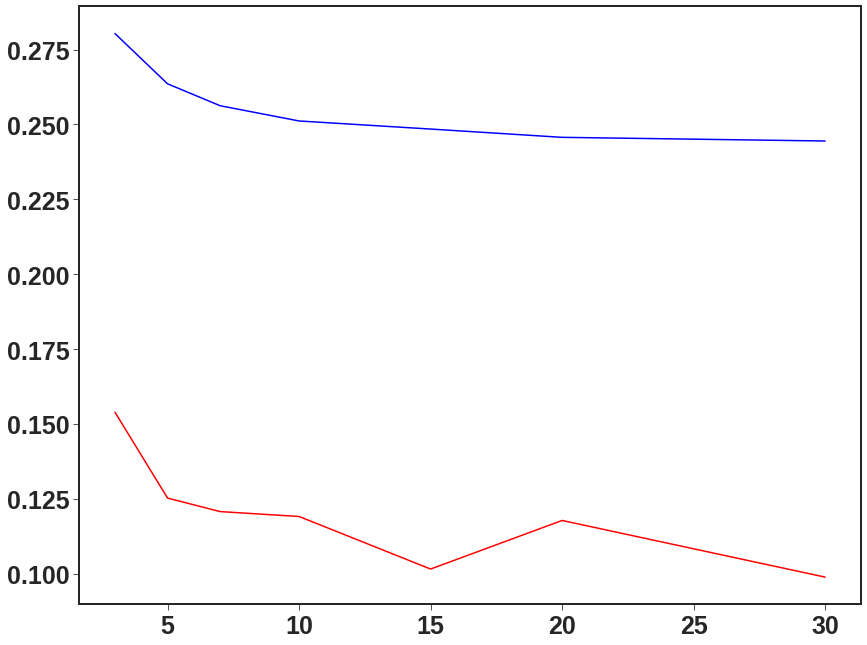

In [0]:
# X_ig_all = X_global[best_features_ig]
# y_ig_all = y_global_ig

randomSeed = 3
fold_loop = [3, 5, 7, 10, 15, 20, 30]
train_error_ig = np.empty([len(fold_loop)])
valid_error_ig = np.empty([len(fold_loop)])


for i in range(len(fold_loop)):
  kfold = KFold(n_splits=fold_loop[i], shuffle=False, random_state=randomSeed)
  for train_index, valid_index in kfold.split(X_global):
    X_ig_train, X_ig_valid = X_global.loc[train_index], X_global.loc[valid_index]
    y_ig_train, y_ig_valid = y_global_ig[train_index],  y_global_ig[valid_index]

    train_error_ig_, valid_error_ig_ = calc_metrics(X_ig_train, y_ig_train, X_ig_valid, y_ig_valid, Lasso())
    train_error_ig[i] = train_error_ig_
    valid_error_ig[i] = valid_error_ig_

plt.figure()
plt.plot(fold_loop,train_error_ig,'b')
plt.plot(fold_loop,valid_error_ig,'r')
# plt.yscale('log')



In [0]:
X_ig_train, X_ig_valid, y_ig_train, y_ig_valid = train_test_split(X_global[best_features_ig], y_global_ig, shuffle=True, test_size=test_size_ig, random_state=randomSeed)
X_g_train, X_g_valid, y_g_train, y_g_valid = train_test_split(X_global[best_features_g], y_global_g, shuffle=True, test_size=test_size_g, random_state=randomSeed)
X_ig = X_ig_train
y_ig = y_ig_train
X_g = X_g_train
y_g = y_g_train

print(X_ig)
print(y_ig)
print(X_g)
print(y_g)


      Z1   Z2   Z3   E1         P         D
58   1.0  1.0  1.0  0.0  0.554000  0.345729
99   0.0  0.0  0.0  1.0  0.286286  0.204020
11   1.0  1.0  1.0  0.0  0.028571  0.020101
130  0.0  0.0  0.0  1.0  0.028571  1.000000
68   1.0  1.0  1.0  0.0  0.456000  0.654271
..   ...  ...  ...  ...       ...       ...
107  0.0  0.0  0.0  1.0  0.682857  0.408040
21   1.0  1.0  1.0  0.0  0.114286  0.045226
0    1.0  1.0  1.0  0.0  0.028571  0.000000
131  0.0  0.0  0.0  1.0  0.246571  1.000000
106  0.0  0.0  0.0  1.0  0.326000  0.387940

[94 rows x 6 columns]
58     7.589438e-01
99     1.211055e-04
11     4.886957e-07
130    6.151951e-07
68     4.167081e-01
           ...     
107    5.353738e-02
21     1.930435e-02
0      0.000000e+00
131    6.025569e-04
106    9.064749e-04
Name: Fdot_IG, Length: 94, dtype: float64
      Z1   Z2   Z3   E1         P         D
58   1.0  1.0  1.0  0.0  0.554000  0.345729
99   0.0  0.0  0.0  1.0  0.286286  0.204020
11   1.0  1.0  1.0  0.0  0.028571  0.020101
130  0.0  0

In [0]:
# Cs       = [10,  20,  30,  40,  50,   0.5e4, 1.0e4, 1.5e4, 1e5]  # [0.1, 1,    5,   10,   50,  100, 500, 1e3, 1e4]
# gammas   = [0.4, 0.5, 0.6, 0.7, 0.75, 0.8,   0.9,   1.0, 2.0]           # [0.1, 0.25, 0.5, 0.75, 1.0, 2.0, 3,   5]

Cs       = [0.1, 1,    5,   10,   50,  100, 500, 1e3, 1e4] 
gammas   = [0.1, 0.25, 0.5, 0.75, 1.0, 2.0, 3,   5]  

# Cs       = [100]#[1, 100, 500, 1000, 10000]#[50,  75,  100, 125, 150]#  500, 1e3, 1e4]
# gammas   = [0.5]#[0.1,0.5,0.75,1,2]#[0.3, 0.4, 0.5, 0.6, 0.7]# 0.75, 1.0, 2.0,  5]

# Cs     = np.linspace(1.0, 5e4, 10)
# gammas = np.linspace(0.1, 3,  10)

for i in range(len(Cs)):
  Cs[i] = round(Cs[i],2)
for i in range(len(gammas)):
  gammas[i] = round(gammas[i],2)
print('Cs:',Cs)
print('gammas:',gammas)
epsilons = [1e-3] #1e-3, 


featureSelectionFlag    = 1
tuningFlag              = 1
splitDataFlag           = 1
finalFitOnAllData       = 0
linear_regression_model = 0
Lasso_model             = 0
ElasticNet_model        = 0
SVM_model               = 1
SVM_model_linear        = 0
SVM_model_poly          = 0
SVM_poly_degree         = 3
LOOCV                   = 0
unified_folds           = 1

nfolds_vector = [10]  
nfolds_ig_ = 10
nfolds_g_  = 10

model_num  = [1,2,3,4,5,6,7,8,9,10,11] 

test_size_ig = 0.3
test_size_g  = test_size_ig

y_ig_test = hypo_response['Fdot_IG']
y_g_test  = hypo_response['Fdot_G']

all_features = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']

# model_1 = ['Z1','P','D']  #1
# model_2 = ['Z1','Z2','P','D'] # 2
# model_3 = ['Z1','Z2','Z3','P','D']  #4
# model_4 = ['Z1','Z2','Z3','E1','P','D']
# model_5 = ['Z1','Z2','Z3','E1','h1','h2','h3','P','D'] #5
# model_6 = ['Z1','Z2','Z3','E1','E2','h1','h2','h3','al','P','D'] #6
# model_7 = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']


model_1  = ['P','D']
model_2  = ['Z1','P','D']
model_3  = ['Z1','Z2','P','D']
model_4  = ['Z1','Z2','Z3','P','D']
model_5  = ['Z1','Z2','Z3','E1','P','D']
model_6  = ['Z1','Z2','Z3','E1','E2','P','D']
model_7  = ['Z1','Z2','Z3','E1','E2','E3','P','D']
model_8  = ['Z1','Z2','Z3','E1','E2','E3','h1','P','D']
model_9  = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','P','D']
model_10 = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','P','D']
model_11 = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']


# model_1  = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']
# model_2  = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','P','D']
# model_3  = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','P','D']
# model_4  = ['Z1','Z2','Z3','E1','E2','E3','h1','P','D']
# model_5  = ['Z1','Z2','Z3','E1','E2','E3','P','D']
# model_6  = ['Z1','Z2','Z3','E1','E2','P','D']
# model_7  = ['Z1','Z2','Z3','E1','P','D']
# model_8  = ['Z1','Z2','Z3','P','D']
# model_9  = ['Z1','Z2','P','D']
# model_10 = ['Z1','P','D']
# model_11 = ['P','D']

# model_4  = ['Z1','Z2','Z3','E1','P','D']



#===== CURRENT FEATURES =====#
# current_features = model_4
print()
# print('Current Features:', current_features)
print()
#============================#

RMSE_test_ig = np.empty([len(Cs),len(gammas),len(nfolds_vector)])
RMSE_test_g  = np.empty([len(Cs),len(gammas),len(nfolds_vector)])

RMSE_min_train_ig = np.empty([len(nfolds_vector)])
RMSE_min_valid_ig = np.empty([len(nfolds_vector)])
RMSE_min_test_ig  = np.empty([len(nfolds_vector)])
RMSE_min_train_g  = np.empty([len(nfolds_vector)])
RMSE_min_valid_g  = np.empty([len(nfolds_vector)])
RMSE_min_test_g   = np.empty([len(nfolds_vector)])
RMSE_max_train_ig = np.empty([len(nfolds_vector)])
RMSE_max_valid_ig = np.empty([len(nfolds_vector)])
RMSE_max_test_ig  = np.empty([len(nfolds_vector)])
RMSE_max_train_g  = np.empty([len(nfolds_vector)])
RMSE_max_valid_g  = np.empty([len(nfolds_vector)])
RMSE_max_test_g   = np.empty([len(nfolds_vector)])

std_min_train_ig = np.empty([len(nfolds_vector)])
std_min_valid_ig = np.empty([len(nfolds_vector)])
std_min_train_g  = np.empty([len(nfolds_vector)])
std_min_valid_g  = np.empty([len(nfolds_vector)])


start_total = time.time()

for loop in model_num:
  if loop == 1:
    current_features = model_1
  elif loop == 2:
    current_features = model_2
  elif loop == 3:
    current_features = model_3
  elif loop == 4:
    current_features = model_4
  elif loop == 5:
    current_features = model_5
  elif loop == 6:
    current_features = model_6
  elif loop == 7:
    current_features = model_7
  elif loop == 8:
    current_features = model_8
  elif loop == 9:
    current_features = model_9
  elif loop == 10:
    current_features = model_10
  elif loop == 11:
    current_features = model_11
  elif loop == 12:
    current_features = model_12
  print('model # :',loop)
  print('current_features : ',current_features)
  print()
  start_time = time.time()
  for k in range(len(nfolds_vector)):
    if unified_folds == 1:
      nfolds_ig = nfolds_vector[k]
      nfolds_g  = nfolds_vector[k]
    else:
      nfolds_ig = nfolds_ig_
      nfolds_g  = nfolds_g_
    nfolds = nfolds_vector[k]
    print()
    print('nfolds_ig:',nfolds_ig)
    print('nfolds_g:',nfolds_g)
    print()
    if featureSelectionFlag == 0:
      best_features_ig = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']
      best_features_g  = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']
    else:
      best_features_ig = current_features #['Z1','Z2','Z3','E1','h1','h2','h3','al','P','D'] #
      best_features_g  = current_features #['Z1','Z2','Z3','E1','h1','h2','h3','al','P','D'] #

    if splitDataFlag == 0:
      X_ig = X_global[best_features_ig]
      y_ig = y_global_ig
      X_g  = X_global[best_features_g]
      y_g  = y_global_g
      X_test = hypo_feature_true[best_features_ig]
    else:
      X_ig_train, X_ig_valid, y_ig_train, y_ig_valid = train_test_split(X_global[best_features_ig], y_global_ig, shuffle=False, test_size=test_size_ig, random_state=randomSeed)
      X_g_train,  X_g_valid,  y_g_train,  y_g_valid  = train_test_split(X_global[best_features_g],  y_global_g,  shuffle=False, test_size=test_size_g, random_state=randomSeed)
      X_ig = X_ig_train
      y_ig = y_ig_train
      X_g = X_g_train
      y_g = y_g_train
      X_test = hypo_feature_true[best_features_ig]

    if LOOCV == 1:
      nfolds = X_ig.shape[0] - 1
    else:
      nfolds = nfolds

    if tuningFlag == 0 and SVM_model == 1:
      tune_para_ig = {'C': 100, 'gamma': 0.5, 'epsilon': 1e-3}
      tune_para_g = {'C': 1000, 'gamma': 0.5, 'epsilon': 1e-3}
    elif tuningFlag == 1 and SVM_model == 1:
      tune_para_ig, cv_results_ig = SVR_tuning(X_ig, y_ig, nfolds_ig, Cs, gammas, epsilons)
      tune_para_g, cv_results_g   = SVR_tuning(X_g, y_g, nfolds_g, Cs, gammas, epsilons)
      tuning_train_score_ig = np.sqrt(-cv_results_ig['mean_train_score'])
      tuning_valid_score_ig = np.sqrt(-cv_results_ig['mean_test_score'])
      tuning_train_std_ig   = np.sqrt(cv_results_ig['std_train_score'])
      tuning_valid_std_ig    = np.sqrt(cv_results_ig['std_test_score'])
      tuning_train_score_g = np.sqrt(-cv_results_g['mean_train_score'])
      tuning_valid_score_g = np.sqrt(-cv_results_g['mean_test_score'])
      tuning_train_std_g   = np.sqrt(cv_results_g['std_train_score'])
      tuning_valid_std_g    = np.sqrt(cv_results_g['std_test_score'])
      C_surf_ig       = cv_results_ig['param_C']
      C_surf_g       = cv_results_g['param_C']
      gamma_surf_ig   = cv_results_ig['param_gamma']
      gamma_surf_g   = cv_results_g['param_gamma']
      epsilon_surf_ig = cv_results_ig['param_epsilon']
      epsilon_surf_g = cv_results_g['param_epsilon']
    elif tuningFlag == 1 and SVM_model_linear == 1:
      tune_para_ig, cv_results_ig = SVR_tuning_linear(X_ig, y_ig, nfolds_ig, Cs, gammas, epsilons)
      tune_para_g, cv_results_g = SVR_tuning_linear(X_g, y_g, nfolds_g, Cs, gammas, epsilons)
      tuning_train_score_ig = -cv_results_ig['mean_train_score']
      tuning_train_score_g = -cv_results_g['mean_train_score']
      tuning_valid_score_ig  = -cv_results_ig['mean_test_score']
      tuning_valid_score_g  = -cv_results_g['mean_test_score']
      C_surf_ig       = cv_results_ig['param_C']
      C_surf_g       = cv_results_g['param_C']
      gamma_surf_ig   = cv_results_ig['param_gamma']
      gamma_surf_g   = cv_results_g['param_gamma']
      epsilon_surf_ig = cv_results_ig['param_epsilon']
      epsilon_surf_g = cv_results_g['param_epsilon']
    elif tuningFlag == 1 and Lasso_model == 1:
      tune_para_ig, cv_results_ig = Lasso_tuning(X_ig, y_ig, nfolds_ig, alphas, randomSeed)
      tune_para_g, cv_results_g = Lasso_tuning(X_g, y_g, nfolds_g, alphas, randomSeed)
      tuning_train_score_ig = np.sqrt(-cv_results_ig['mean_train_score'])
      tuning_train_score_g = np.sqrt(-cv_results_g['mean_train_score'])
      tuning_valid_score_ig  = np.sqrt(-cv_results_ig['mean_test_score'])
      tuning_valid_score_g  = np.sqrt(-cv_results_g['mean_test_score'])
      plt.figure()
      plt.plot(alphas,tuning_train_score_ig,'b',label=r'$Training_{ignition}$',linestyle='-')
      plt.plot(alphas,tuning_test_score_ig,'b',label=r'$Validation_{ignition}$',linestyle='--')
      plt.plot(alphas,tuning_train_score_g,'r',label=r'$Training_{growth}$',linestyle='-')
      plt.plot(alphas,tuning_test_score_g,'r',label=r'$Validation_{growth}$',linestyle='--')
      plt.xscale('log')
      plt.xlabel(r'$\alpha$')
      plt.ylabel(r'$RMSE_{n}$')
      plt.title(test_size_ig)#'Lasso (validation set size=',test_size_ig*100)#,r'$\%$',r'$)$')
      plt.ylim([0,0.4])
      plt.legend()
    elif tuningFlag == 1 and ElasticNet_model == 1:
      tune_para_ig, cv_results_ig = ElasticNet_tuning(X_ig, y_ig, nfolds_ig, alphas, l1Ratios, randomSeed)
      tune_para_g, cv_results_g = ElasticNet_tuning(X_g, y_g, nfolds_g, alphas, l1Ratios, randomSeed)
      tuning_train_score_ig = np.sqrt(-cv_results_ig['mean_train_score'])
      tuning_train_score_g  = np.sqrt(-cv_results_g['mean_train_score'])
      tuning_valid_score_ig  = np.sqrt(-cv_results_ig['mean_test_score'])
      tuning_valid_score_g   = np.sqrt(-cv_results_g['mean_test_score'])
      Plot_ElasticNet(alphas, l1Ratios, tuning_train_score_ig, tuning_test_score_ig, tuning_train_score_g, tuning_test_score_g)

    if linear_regression_model == 1:
      model_global_ig = LinearRegression()
      model_global_g = LinearRegression()
    elif Lasso_model == 1:
      model_global_ig = Lasso(alpha = tune_para_ig['alpha'], random_state=randomSeed)
      model_global_g  = Lasso(alpha = tune_para_g['alpha'], random_state=randomSeed)
    elif ElasticNet_model == 1:
      model_global_ig = ElasticNet(alpha = tune_para_ig['alpha'], l1_ratio=tune_para_ig['l1_ratio'], random_state=randomSeed)
      model_global_g  = ElasticNet(alpha = tune_para_g['alpha'], l1_ratio=tune_para_g['l1_ratio'], random_state=randomSeed)
    elif SVM_model == 1:
      model_global_ig = SVR(kernel = 'rbf', gamma=tune_para_ig['gamma'], C=tune_para_ig['C'], epsilon=tune_para_ig['epsilon'])
      model_global_g  = SVR(kernel = 'rbf', gamma=tune_para_g['gamma'],  C=tune_para_g['C'],  epsilon=tune_para_g['epsilon'])
    elif SVM_model_linear == 1:
      model_global_ig = SVR(kernel = 'linear', gamma=tune_para_ig['gamma'], C=tune_para_ig['C'], epsilon=tune_para_ig['epsilon'])
      model_global_g = SVR(kernel = 'linear', gamma=tune_para_g['gamma'], C=tune_para_g['C'], epsilon=tune_para_g['epsilon'])
      print(model_global_ig.coef_)
      print(model_global_g.coef_)

    if finalFitOnAllData == 1:
      X_ig_all = X_global[best_features_ig] 
      y_ig_all = y_global_ig
      X_g_all = X_global[best_features_g]
      y_g_all = y_global_g
      model_global_ig.fit(X_ig_all,y_ig_all)
      model_global_g.fit(X_g_all,y_g_all)
      print()
    else:
      model_global_ig.fit(X_ig_train, y_ig_train)
      model_global_g.fit(X_g_train, y_g_train)
      print()

    for i in range(len(Cs)):
      for j in range(len(gammas)):
        model_global_ig_temp = SVR(kernel = 'rbf', gamma=gammas[j], C=Cs[i], epsilon=epsilons[0])
        model_global_g_temp  = SVR(kernel = 'rbf', gamma=gammas[j], C=Cs[i], epsilon=epsilons[0])
        if splitDataFlag == 1:
          test_error_ig = calc_test_error(X_ig, y_ig, X_ig_valid, y_ig_valid, model_global_ig_temp)
          test_error_g  = calc_test_error(X_g,  y_g,  X_g_valid, y_g_valid,  model_global_g_temp)
          test_error_ig, test_error_g = round(test_error_ig, 3), round(test_error_g, 3)
        else:
          test_error_ig   = calc_test_error(X_ig, y_ig, X_test, y_ig_test, model_global_ig_temp)
          test_error_g    = calc_test_error(X_g,  y_g,  X_test, y_g_test,  model_global_g_temp)
          test_error_ig, test_error_g = round(test_error_ig, 3), round(test_error_g, 3)
        RMSE_test_ig[i,j,k] = test_error_ig
        RMSE_test_g[i,j,k]  = test_error_g
  
    # print('RMSE_test_ig:',RMSE_test_ig) 
    # print('RMSE_test_g:',RMSE_test_g)
    print()

    RMSE_min_train_ig[k] = np.amin(tuning_train_score_ig)
    RMSE_min_valid_ig[k] = np.amin(tuning_valid_score_ig)
    RMSE_min_test_ig[k]  = np.amin(RMSE_test_ig[:,:,k])
    RMSE_min_train_g[k]  = np.amin(tuning_train_score_g)
    RMSE_min_valid_g[k]  = np.amin(tuning_valid_score_g)
    RMSE_min_test_g[k]   = np.amin(RMSE_test_g[:,:,k])

    index = np.where(np.amin(tuning_valid_score_ig) == tuning_valid_score_ig)
    index = index[0][0]
    corrospond_std_valid_ig = round(tuning_valid_std_ig[index]*100,3)
    index = np.where(np.amin(tuning_valid_score_g) == tuning_valid_score_g)
    index = index[0][0]
    corrospond_std_valid_g = round(tuning_valid_std_g[index]*100,3)

    std_min_train_ig[k] = np.amin(tuning_train_std_ig)
    std_min_valid_ig[k] = np.amin(tuning_valid_std_ig)
    std_min_train_g[k]  = np.amin(tuning_train_std_g)
    std_min_valid_g[k]  = np.amin(tuning_valid_std_g)

    RMSE_max_train_ig[k] = np.amax(tuning_train_score_ig)
    RMSE_max_valid_ig[k] = np.amax(tuning_valid_score_ig)
    RMSE_max_test_ig[k]  = np.amax(RMSE_test_ig[:,:,k])
    RMSE_max_train_g[k]  = np.amax(tuning_train_score_g)
    RMSE_max_valid_g[k]  = np.amax(tuning_valid_score_g)
    RMSE_max_test_g[k]   = np.amax(RMSE_test_g[:,:,k])

    print('RMSE_min_train_ig =',round(RMSE_min_train_ig[k]*100,3))
    print('std_min_train_ig =',round(std_min_train_ig[k]*100,3))
    print('RMSE_min_valid_ig =',round(RMSE_min_valid_ig[k]*100,3))
    print('std_min_valid_ig =',round(std_min_valid_ig[k]*100,3))
    print('corrospond_std_valid_ig = ',corrospond_std_valid_ig)
    print('RMSE_min_test_ig =',round(RMSE_min_test_ig[k]*100,3))
    print()
    # print('RMSE_train_ig =',round(tuning_train_score_ig*100,3))
    # print('std_train_ig =',round(tuning_train_std_ig*100,3))
    # print('RMSE_valid_ig =',round(tuning_valid_score_ig[k]*100,3))
    # print('std_valid_ig =',round(tuning_valid_std_ig[k]*100,3))
    # print('RMSE_test_ig =',round(RMSE_test_ig[k]*100,3))
    print('RMSE_train_ig =',tuning_train_score_ig*100)
    print('std_train_ig =',tuning_train_std_ig*100)
    print('RMSE_valid_ig =',tuning_valid_score_ig[k]*100)
    print('std_valid_ig =',tuning_valid_std_ig[k]*100)
    print('RMSE_test_ig =',RMSE_test_ig[k]*100)
    print()
    # print('RMSE_min_train_g=',round(RMSE_min_train_g[k]*100,3))
    # print('std_min_train_g:',round(std_min_train_g[k]*100,3))
    # print('RMSE_min_valid_g=',round(RMSE_min_valid_g[k]*100,3))
    # print('std_min_valid_g:',round(std_min_valid_g[k]*100,3))
    # print('corrospond_std_valid_g = ',corrospond_std_valid_g)
    # print('RMSE_min_test_g=',round(RMSE_min_test_g[k]*100,3)) 
    print('RMSE_min_train_g=',RMSE_min_train_g[k]*100)
    print('std_min_train_g:',std_min_train_g[k]*100)
    print('RMSE_min_valid_g=',RMSE_min_valid_g[k]*100)
    print('std_min_valid_g:',std_min_valid_g[k]*100)
    print('corrospond_std_valid_g = ',corrospond_std_valid_g)
    print('RMSE_min_test_g=',RMSE_min_test_g[k]*100)
    print()
    # print('RMSE_train_g =',round(RMSE_train_g[k]*100,3))
    # print('std_train_g =',round(std_train_g[k]*100,3))
    # print('RMSE_valid_g =',round(RMSE_valid_g[k]*100,3))
    # print('std_valid_g =',round(std_valid_g[k]*100,3))
    # print('RMSE_test_g =',round(RMSE_test_g[k]*100,3))
    # print('RMSE_train_g =',RMSE_train_g[k]*100)
    # print('std_train_g =',std_train_g[k]*100)
    # print('RMSE_valid_g =',RMSE_valid_g[k]*100)
    # print('std_valid_g =',std_valid_g[k]*100)
    # print('RMSE_test_g =',RMSE_test_g[k]*100)
    print()
    # print('RMSE_train_ig =',round(RMSE_train_ig[k]*100,3))
    # print('std_train_ig =',round(std_train_ig[k]*100,3))
    # print('RMSE_valid_ig =',round(RMSE_valid_ig[k]*100,3))
    # print('std_valid_ig =',round(std_valid_ig[k]*100,3))
    # print('RMSE_test_ig =',round(RMSE_test_ig[k]*100,3))
    # print('RMSE_train_ig =',RMSE_train_ig[k]*100)
    # print('std_train_ig =',std_train_ig[k]*100)
    # print('RMSE_valid_ig =',RMSE_valid_ig[k]*100)
    # print('std_valid_ig =',std_valid_ig[k]*100)
    # print('RMSE_test_ig =',RMSE_test_ig[k]*100)
    print()
    # print('RMSE_min_train_g=',round(RMSE_min_train_g[k]*100,3))
    # print('std_min_train_g:',round(std_min_train_g[k]*100,3))
    # print('RMSE_min_valid_g=',round(RMSE_min_valid_g[k]*100,3))
    # print('std_min_valid_g:',round(std_min_valid_g[k]*100,3))
    # print('corrospond_std_valid_g = ',corrospond_std_valid_g)
    # print('RMSE_min_test_g=',round(RMSE_min_test_g[k]*100,3)) 
    # print('RMSE_min_train_g=',RMSE_min_train_g[k]*100)
    # print('std_min_train_g:',std_min_train_g[k]*100)
    # print('RMSE_min_valid_g=',RMSE_min_valid_g[k]*100)
    # print('std_min_valid_g:',std_min_valid_g[k]*100)
    # print('corrospond_std_valid_g = ',corrospond_std_valid_g)
    # print('RMSE_min_test_g=',RMSE_min_test_g[k]*100) 

  print()
  index = np.where(RMSE_min_train_ig == np.amin(RMSE_min_train_ig))
  index = index[0][0]
  print('Min train ig =',np.amin(RMSE_min_train_ig),' nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_min_valid_ig == np.amin(RMSE_min_valid_ig))
  index = index[0][0]
  print('Min valid ig =',np.amin(RMSE_min_valid_ig),' nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_min_test_ig == np.amin(RMSE_min_test_ig))
  index = index[0][0]
  print('Min test ig  =',np.amin(RMSE_min_test_ig),'         nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_min_train_g == np.amin(RMSE_min_train_g))
  index = index[0][0]
  print('Min train g  =',np.amin(RMSE_min_train_g),' nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_min_valid_g == np.amin(RMSE_min_valid_g))
  index = index[0][0]
  print('Min valid g  =',np.amin(RMSE_min_valid_g),' nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_min_test_g == np.amin(RMSE_min_test_g))
  index = index[0][0]
  print('Min test g   =',np.amin(RMSE_min_test_g),'         nfolds = ', nfolds_vector[index])
  print()

  index = np.where(RMSE_max_train_ig == np.amax(RMSE_max_train_ig))
  index = index[0][0]
  print('Max train ig =',np.amax(RMSE_max_train_ig),' nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_max_test_ig == np.amax(RMSE_max_test_ig))
  index = index[0][0]
  print('Max valid ig =',np.amax(RMSE_max_valid_ig),' nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_max_test_ig == np.amax(RMSE_max_test_ig))
  index = index[0][0]
  print('Max test ig  =',np.amax(RMSE_max_test_ig),'         nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_max_train_g == np.amax(RMSE_max_train_g))
  index = index[0][0]
  print('Max train g  =',np.amax(RMSE_max_train_g),' nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_max_valid_g == np.amax(RMSE_max_valid_g))
  index = index[0][0]
  print('Max valid g  =',np.amax(RMSE_max_valid_g),' nfolds = ', nfolds_vector[index])
  index = np.where(RMSE_max_test_g == np.amax(RMSE_max_test_g))
  index = index[0][0]
  print('Max test g   =',np.amax(RMSE_max_test_g),'         nfolds = ', nfolds_vector[index])
  print()
  print()

  # K_min_ig = np.where(np.array(gammas) == tune_para_ig['gamma'])
  # K_min_ig = index_gamma_ig[0][0]
  end_time = time.time()
  hours, rem = divmod(end_time - start_time, 3600)
  minutes, seconds = divmod(rem, 60)
  print('=========================')
  print('Model time : ',"{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
  print('=========================')


print('model_global_ig : ', model_global_ig)
print('model_global_g  : ', model_global_g)


end_total = time.time()
hours, rem = divmod(end_total - start_total, 3600)
minutes, seconds = divmod(rem, 60)
print('=========================')
print('Total time : ',"{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
print('=========================')




Cs: [0.1, 1, 5, 10, 50, 100, 500, 1000.0, 10000.0]
gammas: [0.1, 0.25, 0.5, 0.75, 1.0, 2.0, 3, 5]


model # : 1
current_features :  ['P', 'D']


nfolds_ig: 10
nfolds_g: 10

Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 300 tasks      | elapsed:    3.9s


{'C': 0.1, 'epsilon': 0.001, 'gamma': 5}
Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:  1.9min finished
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:  1.1min finished
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 0.1, 'epsilon': 0.001, 'gamma': 5}


RMSE_min_train_ig = 9.478
std_min_train_ig = 5.259
RMSE_min_valid_ig = 23.565
std_min_valid_ig = 18.09
corrospond_std_valid_ig =  24.075
RMSE_min_test_ig = 6.8

RMSE_train_ig = [28.53236254 25.75515883 23.89655037 23.16906769 22.26672332 20.55529722
 19.18719751 17.55144087 22.99142996 21.46031362 20.16971618 19.15800553
 18.36885661 15.61288518 14.49879031 12.98718096 21.30196008 20.15425734
 18.80595759 17.03893462 15.88897397 14.09497594 12.93199717 11.35543771
 20.71607064 19.75113663 17.85739477 15.99572204 15.38065609 13.56844805
 12.17964947 11.02734823 20.19240039 18.51284184 15.74251962 14.90695687
 14.11470147 12.11503604 11.19179365 10.36088547 19.92830256 17.35442285
 15.359862   14.31635975 13.7378261  11.66272808 10.9453032  10.1564762
 19.30632453 15.68258412 14.23237014 13.37607299 12.73990259 11.04861495
 10.56409904  9.92386778 18.1135486  15.37040325 13.88361839 13.03493171
 12.14056273 10.89105379 10.46364168  9.81857341 15

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:    3.7s


{'C': 5, 'epsilon': 0.001, 'gamma': 5}
Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:  1.4min finished
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 1, 'epsilon': 0.001, 'gamma': 2.0}


RMSE_min_train_ig = 2.718
std_min_train_ig = 2.0
RMSE_min_valid_ig = 10.224
std_min_valid_ig = 10.009
corrospond_std_valid_ig =  13.46
RMSE_min_test_ig = 4.5

RMSE_train_ig = [27.83122066 24.34426619 21.8030019  19.60156946 18.5522315  15.86860588
 14.15533264 12.65650808 20.22314854 17.03988507 13.40195171 11.2228059
  9.48789847  8.15683167  7.82165616  7.36462539 16.91142429 12.69013177
  8.98864544  8.32202189  8.2227078   7.64628754  7.19909311  6.87202707
 14.91496994 10.95597624  8.43009039  8.28310859  8.17726696  7.36332518
  6.93737215  6.64838895 11.77085792  8.51023917  8.29499885  7.89295817
  7.51727647  6.80305098  6.5208388   5.74867877 10.32794372  8.38854733
  8.1053815   7.57708869  7.33648012  6.67972985  6.23383901  5.40329153
  8.72706392  8.25596324  7.53711739  7.13361499  6.82471307  6.19211513
  5.5412993   4.76107901  8.4691432   8.08814908  7.39582923  6.94878492
  6.68259998  5.87513686  5.28527657  4.42377613  8.2

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:    3.8s


{'C': 10000.0, 'epsilon': 0.001, 'gamma': 1.0}
Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:  1.4min finished
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 10, 'epsilon': 0.001, 'gamma': 0.5}


RMSE_min_train_ig = 2.706
std_min_train_ig = 1.99
RMSE_min_valid_ig = 8.915
std_min_valid_ig = 10.026
corrospond_std_valid_ig =  12.635
RMSE_min_test_ig = 4.9

RMSE_train_ig = [27.39843652 23.68539129 21.18697595 19.18945758 18.18173621 15.75240655
 14.11373047 12.65582997 19.71164614 16.02956601 12.65395561 10.5743149
  9.28478738  8.15307065  7.83329139  7.36645039 15.22390183 11.78774056
  8.64809183  8.30289289  8.24984696  7.64841581  7.19817638  6.87176812
 13.97172924 10.14109155  8.34839329  8.31941195  8.17264204  7.36018407
  6.9381483   6.64700608 11.13504777  8.40088377  8.27176692  7.85373881
  7.517309    6.79926931  6.52207025  5.74738361  9.77983064  8.40954481
  8.06986731  7.5896006   7.34607346  6.67897464  6.22935049  5.40041692
  8.4896543   8.20564163  7.54447226  7.12968339  6.82785601  6.19524349
  5.54439503  4.76437612  8.4360269   8.01728113  7.40241063  6.95885734
  6.68653992  5.87681404  5.28028118  4.41687622  8

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:    3.8s


{'C': 10000.0, 'epsilon': 0.001, 'gamma': 0.75}
Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=-1)]: Done 720 out of 720 | elapsed:  2.4min finished
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:    3.7s


In [0]:
randomSeed = 3

# Cs       = [10,  20,  30,  40,  0.5e4, 1.0e4, 1.5e4, 1e5]  
# gammas   = [0.4, 0.5, 0.6, 0.7, 0.75,  0.8,   0.9,   1.0, 2.0]    

Cs       = [0.1, 1,    5,   10,   50,  100, 500, 1e3, 1e4] 
gammas   = [0.1, 0.25, 0.5, 0.75, 1.0, 2.0, 3,   5]   

# Cs       = [0.1, 1,    5,   10,  20,  30,  40,   50,  100, 500, 1e3, 0.5e4, 1e4, 1.5e4, 1e5] 
# gammas   = [0.1, 0.25, 0.4, 0.5, 0.6, 0.7, 0.75, 0.8, 0.9, 1.0, 2.0, 3,     5] 
epsilons = [1e-3]    

RMSE_test_ig  = np.empty([len(Cs),len(gammas)])
RMSE_test_g   = np.empty([len(Cs),len(gammas)])
RMSE_train_ig = np.empty([len(Cs),len(gammas)])
RMSE_train_g  = np.empty([len(Cs),len(gammas)])
RMSE_diff_ig  = np.empty([len(Cs),len(gammas)])
RMSE_diff_g   = np.empty([len(Cs),len(gammas)])


# model_1  = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']
# model_2  = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','P','D']
# model_3  = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','P','D']
# model_4  = ['Z1','Z2','Z3','E1','E2','E3','h1','P','D']
# model_5  = ['Z1','Z2','Z3','E1','E2','E3','P','D']
# model_6  = ['Z1','Z2','Z3','E1','E2','P','D']
# model_7  = ['Z1','Z2','Z3','E1','P','D']
# model_8  = ['Z1','Z2','Z3','P','D']
# model_9  = ['Z1','Z2','P','D']
# model_10 = ['Z1','P','D']
# model_11 = ['P','D']
# model_12 = ['P']

model_2 = ['Z1','Z2','P','D']
model_3 = ['Z1','Z2','Z3','P','D']
model_4 = ['Z1','Z2','Z3','E1','P','D']
model_5 = ['Z1','Z2','Z3','E1','h1','h2','h3','P','D']
model_6 = ['Z1','Z2','Z3','E1','E2','h1','h2','h3','al','P','D']

test_size_ig = 0.3
test_size_g  = 0.3

model_num = [2]#[1,2,3,4,5,6,7,8,9,10,11,12]

for loop in model_num:
  if loop == 1:
    current_features = model_1
  elif loop == 2:
    current_features = model_2
  elif loop == 3:
    current_features = model_3
  elif loop == 4:
    current_features = model_4
  elif loop == 5:
    current_features = model_5
  elif loop == 6:
    current_features = model_6
  elif loop == 7:
    current_features = model_7
  elif loop == 8:
    current_features = model_8
  elif loop == 9:
    current_features = model_9
  elif loop == 10:
    current_features = model_10
  elif loop == 11:
    current_features = model_11
  elif loop == 12:
    current_features = model_12
  print()
  print('-------------------')
  print()
  print('model # :',loop)
  print('current_features : ',current_features)
  print()
  start_time = time.time()
  best_features_ig = current_features 
  best_features_g  = current_features 
      
  X_ig_train, X_ig_test, y_ig_train, y_ig_test = train_test_split(X_global[best_features_ig], y_global_ig, shuffle=False, test_size=test_size_ig, random_state=randomSeed)
  X_g_train,  X_g_test,  y_g_train,  y_g_test  = train_test_split(X_global[best_features_g],  y_global_g,  shuffle=False, test_size=test_size_g, random_state=randomSeed)

  for i in range(len(Cs)):
    print('C:',i,'/',len(Cs))
    for j in range(len(gammas)):
      print('gamma:',j,'/',len(gammas))
      model_global_ig = SVR(kernel = 'rbf', gamma=gammas[j], C=Cs[i], epsilon=epsilons[0])
      model_global_ig.fit(X_ig_train, y_ig_train)
      model_global_g  = SVR(kernel = 'rbf', gamma=gammas[j], C=Cs[i], epsilon=epsilons[0])
      model_global_g.fit(X_g_train, y_g_train)
      
      train_error_ig  = calc_train_error(X_ig_train, y_ig_train, model_global_ig)
      train_error_g   = calc_train_error(X_g_train,  y_g_train,  model_global_g)
      train_error_ig, train_error_g = round(train_error_ig, 4)*100, round(train_error_g, 4)*100
      RMSE_train_ig[i,j] = train_error_ig
      RMSE_train_g[i,j]  = train_error_g

      test_error_ig   = calc_test_error(X_ig_train, y_ig_train, X_ig_test, y_ig_test, model_global_ig)
      test_error_g    = calc_test_error(X_g_train,  y_g_train,  X_g_test,  y_g_test,  model_global_g)
      test_error_ig, test_error_g = round(test_error_ig, 4)*100, round(test_error_g, 4)*100
      RMSE_test_ig[i,j] = test_error_ig
      RMSE_test_g[i,j]  = test_error_g
  

  print()
  print('RMSE_train_ig=',RMSE_train_ig)
  print('RMSE_train_g=',RMSE_train_g)
  print()
  RMSE_min_test_ig = round(np.amin(RMSE_test_ig),4)
  RMSE_min_test_g  = round(np.amin(RMSE_test_g),4)
  print('RMSE_test_ig=',RMSE_test_ig)
  print('RMSE_test_g=',RMSE_test_g)
  print()
  print('RMSE_min_test_ig=',RMSE_min_test_ig)
  index = np.where(np.amin(RMSE_test_ig) == RMSE_test_ig)
  print(index)
  index_C     = index[0][0]
  index_gamma = index[1][0]
  print('Min test ig index        =',index)
  print('corresponding train ig=',RMSE_train_ig[index_C,index_gamma])
  print('Min test ig C and gamma  =',Cs[index_C],' ',gammas[index_gamma])
  print()
  print('RMSE_min_test_g=',RMSE_min_test_g)
  index = np.where(np.amin(RMSE_test_g) == RMSE_test_g)
  print(index)
  index_C     = index[0][0]
  index_gamma = index[1][0]
  print('Min test g index        =',index)
  print('corresponding train g=',RMSE_train_g[index_C,index_gamma])
  print('Min test g C and gamma  =',Cs[index_C],' ',gammas[index_gamma])


  print()
  print()
  RMSE_diff_ig = RMSE_test_ig-RMSE_train_ig
  RMSE_diff_g  = RMSE_test_g-RMSE_train_g
  print('RMSE_diff_ig=',RMSE_diff_ig)
  print('RMSE_diff_g=',RMSE_diff_g)
  print()
  # RMSE_min_diff_ig = np.where(RMSE_diff_ig >= 0, RMSE_diff_ig, 1000).argmin()
  # RMSE_min_diff_g  = np.where(RMSE_diff_g >= 0, RMSE_diff_g, 1000).argmin()
  RMSE_min_diff_ig, index_C_ig, index_gamma_ig, RMSE_min_test_ig_, index_C_ig_test, index_gamma_ig_test = return_min_pos_value(RMSE_diff_ig, RMSE_test_ig)
  RMSE_min_diff_g,  index_C_g,  index_gamma_g, RMSE_min_test_g_, index_C_g_test, index_gamma_g_test  = return_min_pos_value(RMSE_diff_g, RMSE_test_g)
  # index = np.where(np.amin(RMSE_diff_ig) == RMSE_diff_ig)
  # print(index)
  print('RMSE_min_diff_ig=',RMSE_min_diff_ig)
  index_C     = index_C_ig #index[0][0]
  index_gamma = index_gamma_ig #index[1][0]
  print()
  print('Min diff ig index        =',index_C_ig,index_gamma_ig)
  print('corresponding train ig=',round(RMSE_train_ig[index_C_ig,index_gamma_ig],4))
  print('corresponding test ig=',round(RMSE_test_ig[index_C_ig,index_gamma_ig],4))
  print('Min diff ig C and gamma  =',Cs[index_C_ig],' ',gammas[index_gamma_ig])
  print()
  # index = np.where(np.amin(RMSE_diff_g) == RMSE_diff_g)
  # print(index)
  print('RMSE_min_diff_g=',RMSE_min_diff_g)
  index_C     = index_C_g #index[0][0]
  index_gamma = index_gamma_g #index[1][0]
  print('Min diff g index        =',index_C_g,index_gamma_g)
  print('corresponding train g=',round(RMSE_train_g[index_C_g,index_gamma_g],4))
  print('corresponding test g=',round(RMSE_test_g[index_C_g,index_gamma_g],4))
  print('Min diff g C and gamma  =',Cs[index_C_g],' ',gammas[index_gamma_g])
  print()
  print()
  print('RMSE_min_test_ig_ =',RMSE_min_test_ig_)
  print('Min test ig index       =',index_C_ig_test, index_gamma_ig_test)
  print('corresponding train ig=',round(RMSE_train_ig[index_C_ig_test,index_gamma_ig_test],4))
  print('corresponding diff ig=',round(RMSE_diff_ig[index_C_ig_test,index_gamma_ig_test],4))
  print('Min diff ig C and gamma  =',Cs[index_C_ig_test],' ',gammas[index_gamma_ig_test])
  print()
  print('RMSE_min_test_g_ =',RMSE_min_test_g_)
  print('RMSE_min_test_g_  =',RMSE_min_test_g_)
  print('Min test g index       =',index_C_g_test, index_gamma_g_test)
  print('corresponding train g=',round(RMSE_train_g[index_C_g_test,index_gamma_g_test],4))
  print('corresponding diff g=',round(RMSE_diff_g[index_C_g_test,index_gamma_g_test],4))
  print('Min diff g C and gamma  =',Cs[index_C_g_test],' ',gammas[index_gamma_g_test])
  print()





-------------------

model # : 2
current_features :  ['Z1', 'Z2', 'P', 'D']

C: 0 / 9
gamma: 0 / 8
gamma: 1 / 8
gamma: 2 / 8
gamma: 3 / 8
gamma: 4 / 8
gamma: 5 / 8
gamma: 6 / 8
gamma: 7 / 8
C: 1 / 9
gamma: 0 / 8
gamma: 1 / 8
gamma: 2 / 8
gamma: 3 / 8
gamma: 4 / 8
gamma: 5 / 8
gamma: 6 / 8
gamma: 7 / 8
C: 2 / 9
gamma: 0 / 8
gamma: 1 / 8
gamma: 2 / 8
gamma: 3 / 8
gamma: 4 / 8
gamma: 5 / 8
gamma: 6 / 8
gamma: 7 / 8
C: 3 / 9
gamma: 0 / 8
gamma: 1 / 8
gamma: 2 / 8
gamma: 3 / 8
gamma: 4 / 8
gamma: 5 / 8
gamma: 6 / 8
gamma: 7 / 8
C: 4 / 9
gamma: 0 / 8
gamma: 1 / 8
gamma: 2 / 8
gamma: 3 / 8
gamma: 4 / 8
gamma: 5 / 8
gamma: 6 / 8
gamma: 7 / 8
C: 5 / 9
gamma: 0 / 8
gamma: 1 / 8
gamma: 2 / 8
gamma: 3 / 8
gamma: 4 / 8
gamma: 5 / 8
gamma: 6 / 8
gamma: 7 / 8
C: 6 / 9
gamma: 0 / 8
gamma: 1 / 8
gamma: 2 / 8
gamma: 3 / 8
gamma: 4 / 8
gamma: 5 / 8
gamma: 6 / 8
gamma: 7 / 8
C: 7 / 9
gamma: 0 / 8
gamma: 1 / 8
gamma: 2 / 8
gamma: 3 / 8
gamma: 4 / 8
gamma: 5 / 8
gamma: 6 / 8
gamma: 7 / 8


KeyboardInterrupt: ignored

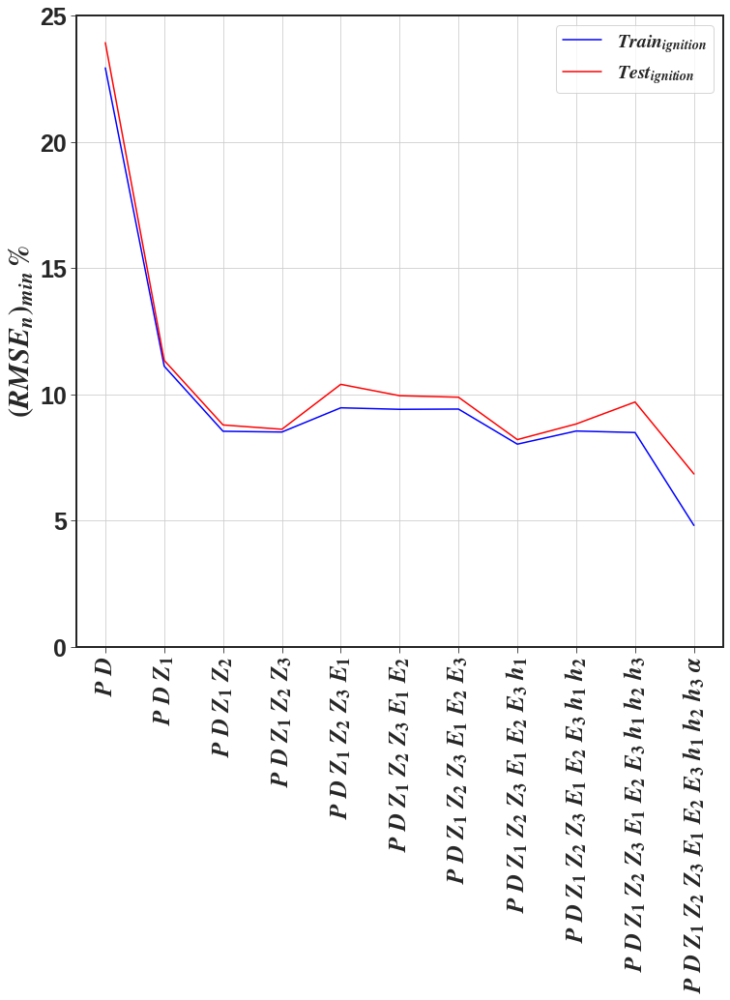

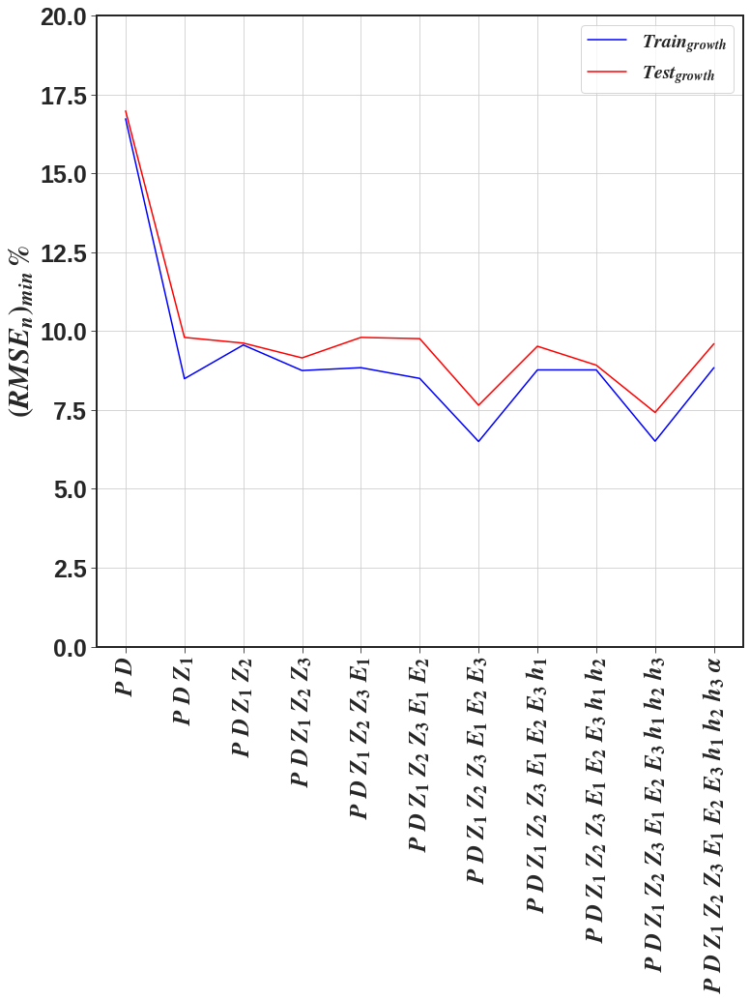

In [0]:
# from model 11 to 1


modelNum = [1,2,3,4,5,6,7,8,9,10,11]

min_train_error_ig = [22.93, 11.11, 8.53, 8.5, 9.46,  9.40, 9.41, 8.02, 8.54, 8.48, 4.80]  
min_test_error_ig  = [23.93, 11.34, 8.78, 8.61, 10.39, 9.94, 9.88, 8.20, 8.82, 9.69, 6.84]

# min_train_error_ig_cv = [9.478,  2.718,  2.706, 2.715, 2.714, 2.711, 2.716, 2.717, 2.716, 2.706, 2.71]  
# min_valid_error_ig_cv = [23.565, 10.224, 8.915, 8.444, 8.016, 8.085, 8.204, 8.46,  8.52,  8.49,  8.48] 
# min_std_ig_cv         = [24.08,  13.46,  12.64, 12.50, 12.57, 12.6,  12.45, 12.57, 12.9,  12.9,  12.91]
# min_test_error_ig_cv  = [6.8,    4.5,    4.9,   4.5,   4.7,   4.7,   4.6,   4.6,   4.6,   5.5,   4.1]
# percent_ig = (np.array(min_train_error_ig)/np.array(min_test_error_ig))*100
# print(percent_ig)


min_train_error_g = [16.73, 8.49, 9.56, 8.75, 8.84, 8.50, 6.50, 8.77, 8.77, 6.51, 8.84]  
min_test_error_g  = [16.98, 9.8, 9.62, 9.15, 9.80, 9.76, 7.65, 9.52, 8.92, 7.42, 9.60]

# min_train_error_g_cv = [9.21,  4.52,  4.52,  4.52,  4.52,  4.52,  4.52,  4.52,  4.52,  4.52,  4.52]  
# min_valid_error_g_cv = [16.35, 10.38, 10.22, 10.16, 10.12, 10.12, 10.11, 10.10, 10.08, 10.07, 10.06] 
# min_std_g_cv        = [19.01, 11.83, 11.40, 11.49, 11.52, 11.52, 11.51, 11.54, 11.52, 11.54, 11.53]
# min_test_error_g_cv  = [11.2,  1.80,  1.3,   1.4,   1.2,   1.1,   1.1,   1.1,   1.0,   1.1,  1.1]
# percent_g = (np.array(min_train_error_g)/np.array(min_test_error_g))*100
# print(percent_g)


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(1,1,1)

# ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
# ax2.set_yticks([0])
# # ax2.set_xticks(percent_ig)
# # ax2.xaxis.set_ticks_position('top')
# ax2.tick_params(labelbottom='off',labeltop='on')

# ax.plot(modelNum, min_train_error_ig_cv, color='b', label = r'$Train_{ignition}$')
# ax.plot(modelNum, min_valid_error_ig_cv,  color='g', label = r'$Valid_{ignition}$')
# ax.plot(modelNum, min_std_ig_cv, color='k', label = r'$std_{ignition}$')
# ax.plot(modelNum, min_test_error_ig_cv,  color='r', label = r'$Test_{ignition}$')

ax.plot(modelNum, min_train_error_ig, color='b', label = r'$Train_{ignition}$')
ax.plot(modelNum, min_test_error_ig,  color='r', label = r'$Test_{ignition}$')
my_xticks = [r'$P\/\/D$',r'$P\/\/D\/\/Z_{1}$',r'$P\/\/D\/\/Z_{1}\/\/Z_{2}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}\/\/h_{1}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}\/\/h_{1}\/\/h_{2}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}\/\/h_{1}\/\/h_{2}\/\/h_{3}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}\/\/h_{1}\/\/h_{2}\/\/h_{3}\/\/\alpha$']
plt.xticks(rotation=90)
plt.xticks(modelNum, my_xticks)
plt.grid()
ax.set_ylabel(r'$(RMSE_{n})_{min}\/\%$')
ax.set_ylim([0,25])
ax.legend()
# ax.set_yscale('log')

#
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(1,1,1)

# ax.plot(modelNum, min_train_error_g_cv, color='b', label = r'$Train_{growth}$')
# ax.plot(modelNum, min_valid_error_g_cv,  color='g', label = r'$Valid_{growth}$')
# ax.plot(modelNum, min_std_g_cv, color='k', label = r'$std_{growth}$')
# ax.plot(modelNum, min_test_error_g_cv,  color='r', label = r'$Test_{growth}$')

ax.plot(modelNum, min_train_error_g, color='b', label = r'$Train_{growth}$')
ax.plot(modelNum, min_test_error_g,  color='r', label = r'$Test_{growth}$')
my_xticks = [r'$P\/\/D$',r'$P\/\/D\/\/Z_{1}$',r'$P\/\/D\/\/Z_{1}\/\/Z_{2}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}\/\/h_{1}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}\/\/h_{1}\/\/h_{2}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}\/\/h_{1}\/\/h_{2}\/\/h_{3}$',
             r'$P\/\/D\/\/Z_{1}\/\/Z_{2}\/\/Z_{3}\/\/E_{1}\/\/E_{2}\/\/E_{3}\/\/h_{1}\/\/h_{2}\/\/h_{3}\/\/\alpha$']
plt.xticks(rotation=90)
plt.xticks(modelNum, my_xticks)
plt.grid()
ax.set_ylabel(r'$(RMSE_{n})_{min}\/\%$')
ax.set_ylim([0,20])
ax.legend()
# ax.set_yscale('log')



In [0]:
C_surf, gamma_surf = np.meshgrid(Cs, gammas, indexing='ij')

tuning_train_score_ig = tuning_train_score_ig.reshape(len(Cs),len(gammas))
tuning_valid_score_ig = tuning_test_score_ig.reshape(len(Cs),len(gammas))
tuning_test_score_ig  = test_error_ig#.reshape(len(Cs),len(gammas))

tuning_train_score_g = tuning_train_score_g.reshape(len(Cs),len(gammas))
tuning_valid_score_g = tuning_test_score_g.reshape(len(Cs),len(gammas))
tuning_test_score_g  = test_error_g#.reshape(len(Cs),len(gammas))

RMSE_min_train_ig = min(tuning_train_score_ig)
RMSE_min_valid_ig = min(tuning_valid_score_ig)
RMSE_min_test_ig = min(tuning_test_score_ig)
RMSE_min_train_g = min(tuning_train_score_g)
RMSE_min_valid_g = min(tuning_valid_score_g)
RMSE_min_test_g = min(tuning_test_score_g)
print('RMSE_min_train_ig=',RMSE_min_train_ig)
print('RMSE_min_valid_ig=',RMSE_min_valid_ig)
print('RMSE_min_test_ig=',RMSE_min_test_ig)
print('RMSE_min_train_g=',RMSE_min_train_g)
print('RMSE_min_valid_g=',RMSE_min_valid_g)
print('RMSE_min_test_g=',RMSE_min_test_g)


fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111,projection='3d')
# ax.plot_surface(C_surf , gamma_surf, tuning_train_score_ig, color='b', alpha=0.7)
ax.plot_surface(C_surf , gamma_surf, tuning_valid_score_ig,  color='r', alpha=0.7)

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111,projection='3d')
# ax.plot_surface(C_surf , gamma_surf, tuning_train_score_g, color='b', alpha=0.7)
ax.plot_surface(C_surf , gamma_surf, tuning_valid_score_g,  color='r', alpha=0.7)

index_gamma_ig = np.where(np.array(gammas) == tune_para_ig['gamma'])
index_gamma_ig = index_gamma_ig[0][0]
index_gamma_g  = np.where(np.array(gammas_test) == tune_para_g['gamma'])
index_gamma_g  = index_gamma_g[0][0]
index_C_ig     = np.where(np.array(Cs) == tune_para_ig['C'])
index_C_ig     = index_C_ig[0][0]
index_C_g      = np.where(np.array(Cs) == tune_para_g['C'])
index_C_g      = index_C_g[0][0]
print(index_gamma_ig)
print(index_gamma_g)
print(index_C_ig)
print(index_C_g)

fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1,2,1)
ax.plot(Cs, tuning_train_score_ig[:,index_gamma_ig]*100, color='b',  label = r'$Train_{ignition}$')
ax.plot(Cs, tuning_valid_score_ig[:,index_gamma_ig]*100, color='r',  label = r'$Valid_{ignition}$')
ax.plot(Cs, tuning_test_score_ig[:,index_gamma_ig]*100,  color='g', label = r'$Test_{ignition}$') 
ax.set_xlabel(r'$C$')
ax.set_xscale('log')
print(gammas[1])
ax.legend()

ax = fig.add_subplot(1,2,2)
ax.plot(gammas, tuning_train_score_ig[index_C_ig,:]*100, color='b',  label = r'$Train_{ignition}$')
ax.plot(gammas, tuning_valid_score_ig[index_C_ig,:]*100, color='r',  label = r'$Valid_{ignition}$')
ax.plot(gammas, tuning_test_score_ig[index_C_ig,:]*100,  color='g', label = r'$Test_{ignition}$') 
ax.set_xlabel(r'$\gamma$')
ax.set_xscale('log')
print(gammas[1])
ax.legend()

fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1,2,1)
ax.plot(Cs, tuning_train_score_g[:,index_gamma_g]*100, color='b',  label = r'$Train_{ignition}$')
ax.plot(Cs, tuning_valid_score_g[:,index_gamma_g]*100, color='r',  label = r'$Valid_{ignition}$')
ax.plot(Cs, tuning_test_score_g[:,index_gamma_g]*100,  color='g', label = r'$Test_{ignition}$') 
ax.set_xlabel(r'$C$')
ax.set_xscale('log')
print(gammas[1])
ax.legend()

ax = fig.add_subplot(1,2,2)
ax.plot(gammas, tuning_train_score_g[index_C_g,:]*100, color='b',  label = r'$Train_{ignition}$')
ax.plot(gammas, tuning_valid_score_g[index_C_g,:]*100, color='r',  label = r'$Valid_{ignition}$')
ax.plot(gammas, tuning_test_score_g[index_C_g,:]*100,  color='g', label = r'$Test_{ignition}$') 
ax.set_xlabel(r'$\gamma$')
ax.set_xscale('log')
print(gammas[1])
ax.legend()




In [0]:
RMSE_valid_ig = np.empty([len(Cs),len(gammas)])
RMSE_train_ig = np.empty([len(Cs),len(gammas)])
RMSE_valid_g  = np.empty([len(Cs),len(gammas)])
RMSE_train_g  = np.empty([len(Cs),len(gammas)])
counter1 = 0
counter2 = 0
for i in range(len(Cs)):
  for j in range(len(gammas)):
    model_global_ig = SVR(kernel   = 'rbf', gamma=gammas[j], C=Cs[i], epsilon=epsilons[0])
    model_global_g  = SVR(kernel   = 'rbf', gamma=gammas[j], C=Cs[i], epsilon=epsilons[0])
    train_error_ig, valid_error_ig = calc_metrics(X_ig_train, y_ig_train, X_ig_valid, y_ig_valid, model_global_ig)
    train_error_g, valid_error_g   = calc_metrics(X_g_train,  y_g_train,  X_g_valid,  y_g_valid,  model_global_g)
    train_error_ig, valid_error_ig = round(train_error_ig, 3), round(valid_error_ig, 3)
    train_error_g, valid_error_g   = round(train_error_g,  3), round(valid_error_g,  3)
    RMSE_train_ig[i,j] = train_error_ig
    RMSE_valid_ig[i,j] = valid_error_ig
    RMSE_train_g[i,j]  = train_error_g
    RMSE_valid_g[i,j]  = valid_error_g
  

print('RMSE_train_ig:',RMSE_train_ig) 
print('RMSE_valid_ig:',RMSE_valid_ig) 
print('RMSE_train_g:',RMSE_train_g) 
print('RMSE_valid_g:',RMSE_valid_g)
print()
print()



In [0]:
RMSE_valid_ig = RMSE_test_ig
RMSE_valid_g = RMSE_test_g
index = 1
plt.figure()
plt.plot(Cs,RMSE_train_ig[:,index],'b')
plt.plot(Cs,RMSE_valid_ig[:,index],'r')
# plt.xscale('log')
plt.xlabel(r'$C$')
plt.ylabel(r'$RMSE$')
plt.figure()
plt.plot(Cs,RMSE_train_g[:,index],'b')
plt.plot(Cs,RMSE_valid_g[:,index],'r')
# plt.xscale('log')
plt.xlabel(r'$C$')
plt.ylabel(r'$RMSE$')
plt.figure()
plt.plot(gammas,RMSE_train_ig[index,:],'b')
plt.plot(gammas,RMSE_valid_ig[index,:],'r')
# plt.xscale('log')
plt.xlabel(r'$\gamma$')
plt.ylabel(r'$RMSE$')
plt.figure()
plt.plot(gammas,RMSE_train_g[index,:],'b')
plt.plot(gammas,RMSE_valid_g[index,:],'r')
# plt.xscale('log')
plt.xlabel(r'$\gamma$')
plt.ylabel(r'$RMSE$')


C_surf, gamma_surf = np.meshgrid(Cs, gammas, indexing='ij')

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111,projection='3d')
ax.plot_surface(C_surf , gamma_surf, RMSE_train_ig, color='b', alpha=0.7)
ax.plot_surface(C_surf , gamma_surf, RMSE_valid_ig,  color='r', alpha=0.7)

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111,projection='3d')
ax.plot_surface(C_surf , gamma_surf, RMSE_train_g, color='b', alpha=0.7)
ax.plot_surface(C_surf , gamma_surf, RMSE_valid_g,  color='r', alpha=0.7)



In [0]:
def Plot_ElasticNet(alphas, l1Ratios, train_error_ig, valid_error_ig, train_error_g, valid_error_g): 
  alphas_surf, l1Ratios_surf = np.meshgrid(alphas, l1Ratios, indexing='ij')
  tuning_train_score_ig = train_error_ig.reshape(len(alphas),len(l1Ratios))
  tuning_test_score_ig  = valid_error_ig.reshape(len(alphas),len(l1Ratios))
  tuning_train_score_g  = train_error_g.reshape(len(alphas),len(l1Ratios))
  tuning_test_score_g   = valid_error_g.reshape(len(alphas),len(l1Ratios))
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111,projection='3d')
  ax.plot_surface(alphas_surf , l1Ratios_surf, tuning_train_score_ig, color='b', alpha=0.7)
  ax.plot_surface(alphas_surf , l1Ratios_surf, tuning_test_score_ig,  color='r', alpha=0.7)
  plt.xlabel(r'$\alpha$')
  plt.ylabel(r'$ratio$')
  fig = plt.figure(figsize=(10,8))
  ax = fig.add_subplot(111,projection='3d')
  ax.plot_surface(alphas_surf , l1Ratios_surf, tuning_train_score_g, color='b', alpha=0.7)
  ax.plot_surface(alphas_surf , l1Ratios_surf, tuning_test_score_g,  color='r', alpha=0.7)
  plt.xlabel(r'$\alpha$')
  plt.ylabel(r'$ratio$')


In [0]:
C_surf, gamma_surf = np.meshgrid(Cs, gammas, indexing='ij')
# print(C_surf)
# print(gamma_surf)
tuning_train_score_ig = tuning_train_score_ig.reshape(len(Cs),len(gammas))
tuning_test_score_ig  = tuning_test_score_ig.reshape(len(Cs),len(gammas))
tuning_train_score_g = tuning_train_score_g.reshape(len(Cs),len(gammas))
tuning_test_score_g  = tuning_test_score_g.reshape(len(Cs),len(gammas))
# print(tuning_train_score_ig)
# print(tuning_test_score_ig)

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111,projection='3d')
ax.plot_surface(C_surf , gamma_surf, tuning_train_score_ig, color='b', alpha=0.7)
ax.plot_surface(C_surf , gamma_surf, tuning_test_score_ig,  color='r', alpha=0.7)

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111,projection='3d')
ax.plot_surface(C_surf , gamma_surf, tuning_train_score_g, color='b', alpha=0.7)
ax.plot_surface(C_surf , gamma_surf, tuning_test_score_g,  color='r', alpha=0.7)

fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1,3,1)
ax.plot(Cs, tuning_train_score_g[:,1]*100, color='b', alpha=0.7, label = r'$Train_{growth}$')
ax.plot(Cs, tuning_test_score_g[:,1]*100,  color='r', alpha=0.7, label = r'$Test_{growth}$')
ax.set_xlabel(r'$C$')
ax.set_xscale('log')
print(gammas[1])
ax.legend()
ax = fig.add_subplot(1,3,2)
ax.plot(Cs, tuning_train_score_g[:,2]*100, color='b', alpha=0.7, label = r'$Train_{growth}$')
ax.plot(Cs, tuning_test_score_g[:,2]*100,  color='r', alpha=0.7, label = r'$Test_{growth}$')
ax.set_xlabel(r'$C$')
ax.set_xscale('log')
print(gammas[2])
ax.legend()
ax = fig.add_subplot(1,3,3)
ax.plot(Cs, tuning_train_score_g[:,3]*100, color='b', alpha=0.7, label = r'$Train_{growth}$')
ax.plot(Cs, tuning_test_score_g[:,3]*100,  color='r', alpha=0.7, label = r'$Test_{growth}$')
ax.set_xlabel(r'$C$')
ax.set_xscale('log')
print(gammas[3])
ax.legend()

fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1,3,1)
ax.plot(gammas, tuning_train_score_g[1,:]*100, color='b', alpha=0.7, label = r'$Train_{growth}$')
ax.plot(gammas, tuning_test_score_g[1,:]*100,  color='r', alpha=0.7, label = r'$Test_{growth}$')
ax.set_xlabel(r'$\gamma$')
ax.set_xscale('log')
print(Cs[1])
ax.legend()
ax = fig.add_subplot(1,3,2)
ax.plot(gammas, tuning_train_score_g[2,:]*100, color='b', alpha=0.7, label = r'$Train_{growth}$')
ax.plot(gammas, tuning_test_score_g[2,:]*100,  color='r', alpha=0.7, label = r'$Test_{growth}$')
ax.set_xlabel(r'$\gamma$')
ax.set_xscale('log')
print(Cs[2])
ax.legend()
ax = fig.add_subplot(1,3,3)
ax.plot(gammas, tuning_train_score_g[3,:]*100, color='b', alpha=0.7, label = r'$Train_{growth}$')
ax.plot(gammas, tuning_test_score_g[3,:]*100,  color='r', alpha=0.7, label = r'$Test_{growth}$')
ax.set_xlabel(r'$\gamma$')
ax.set_xscale('log')
print(Cs[3])
ax.legend()





HMX chosen!


HMX chosen!

HMX
HMX

TATB chosen!


TATB chosen!

TATB
TATB

HYP chosen!


HYP chosen!

HYP
HYP


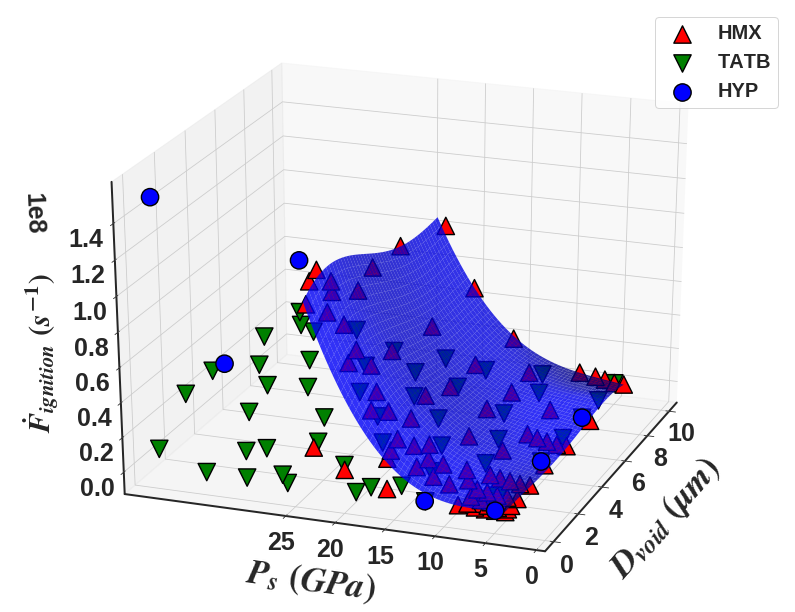

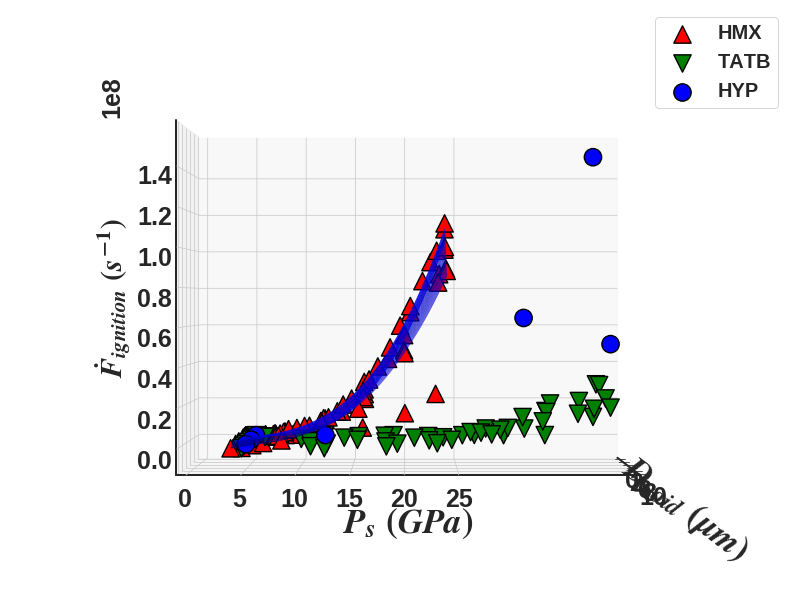

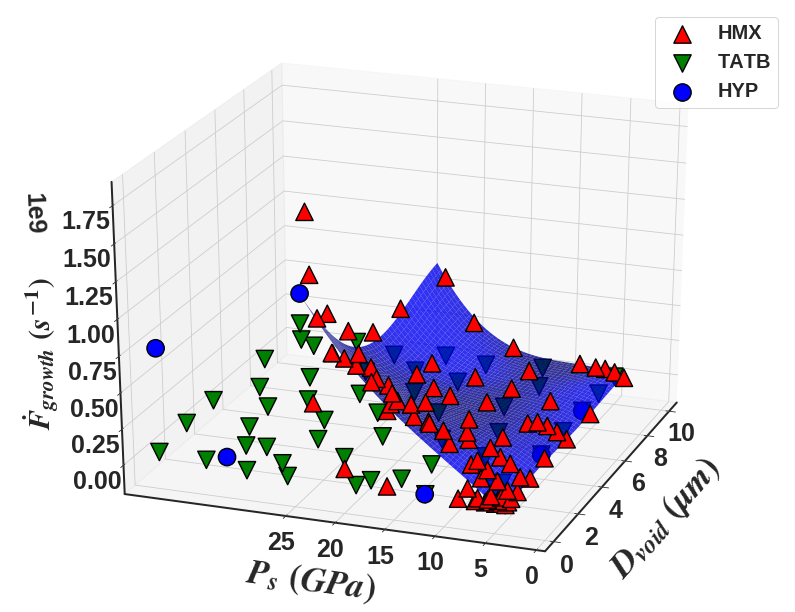

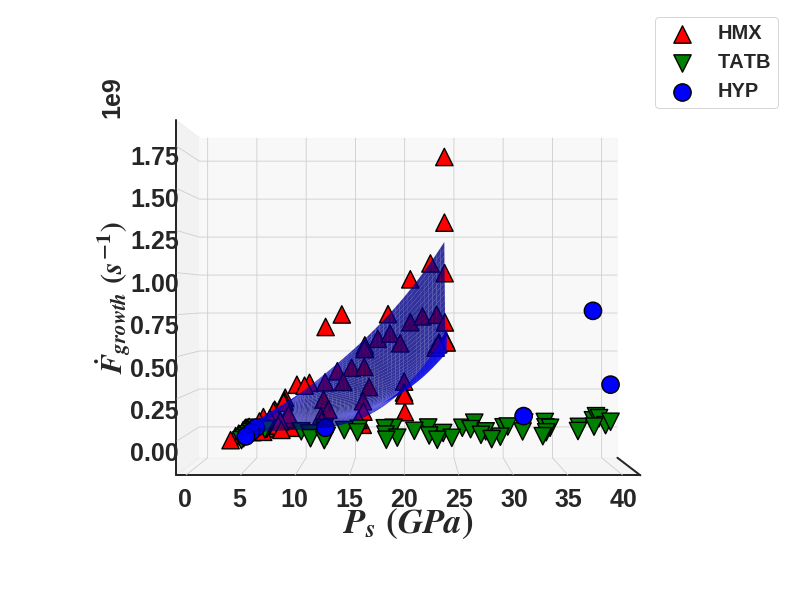

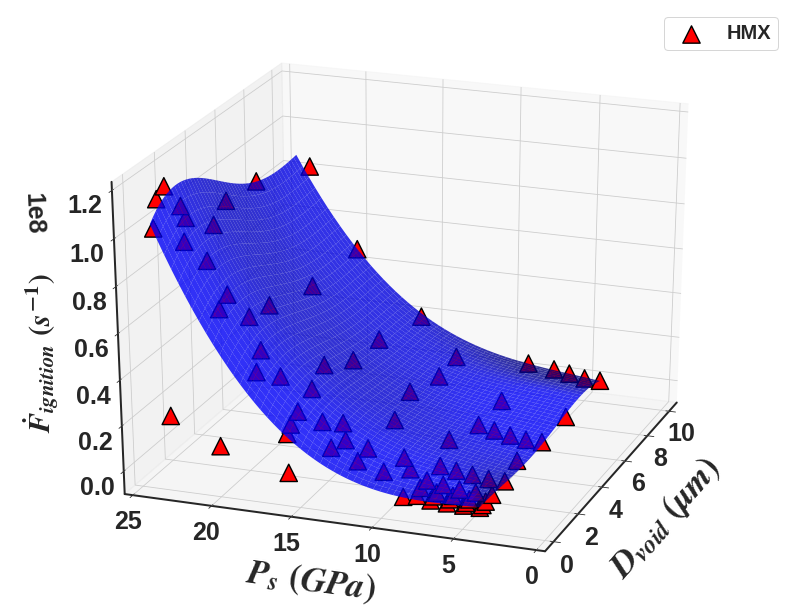

...

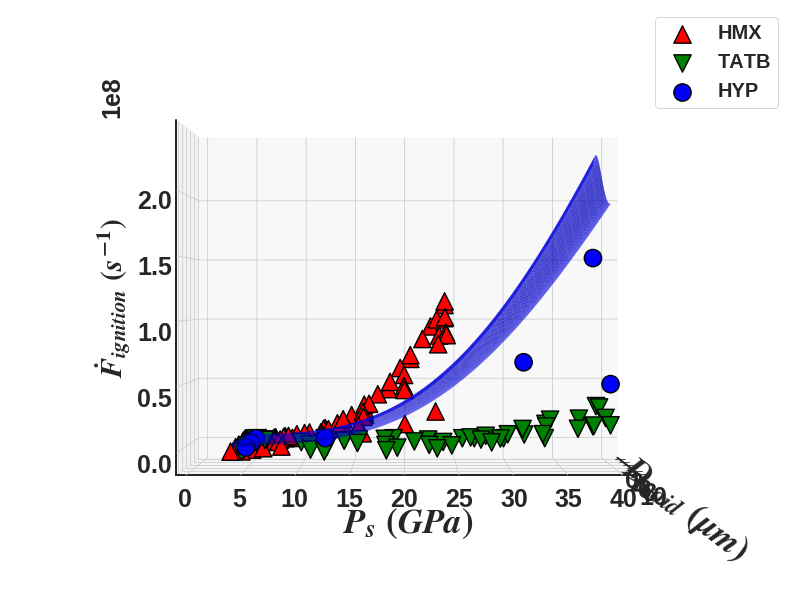

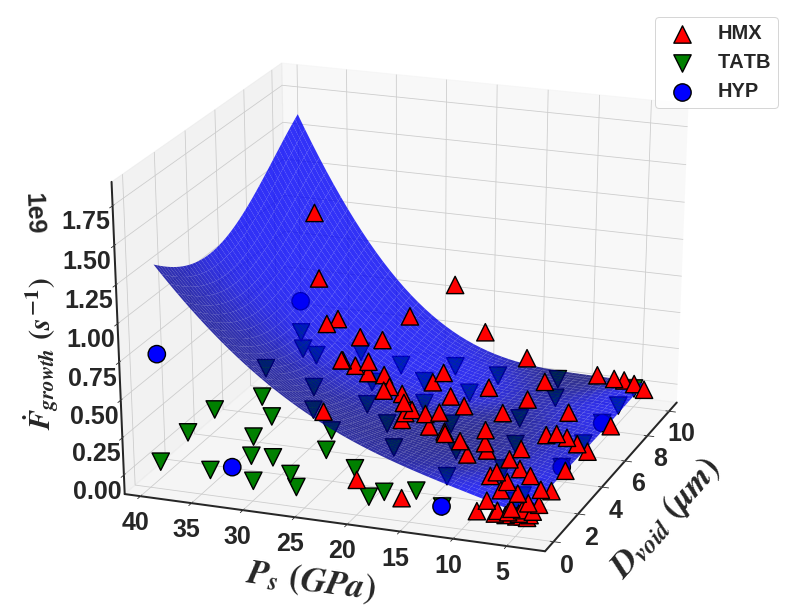

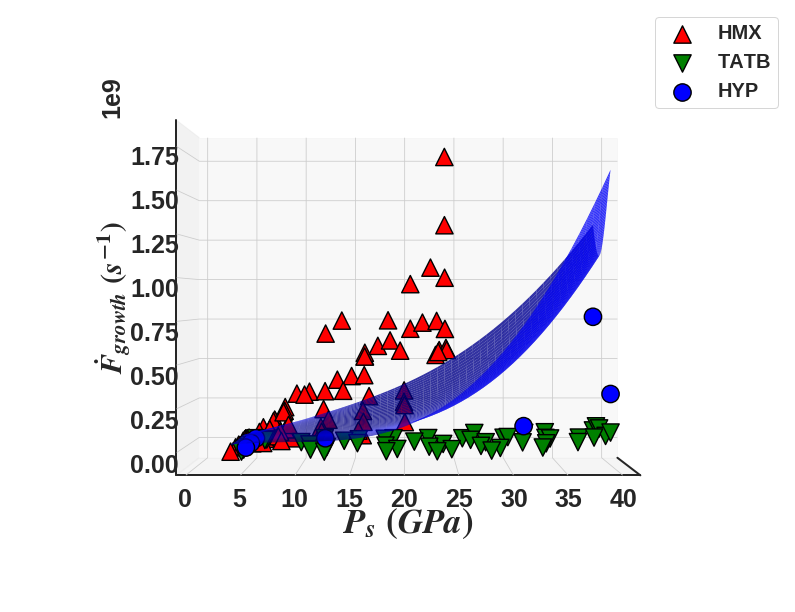

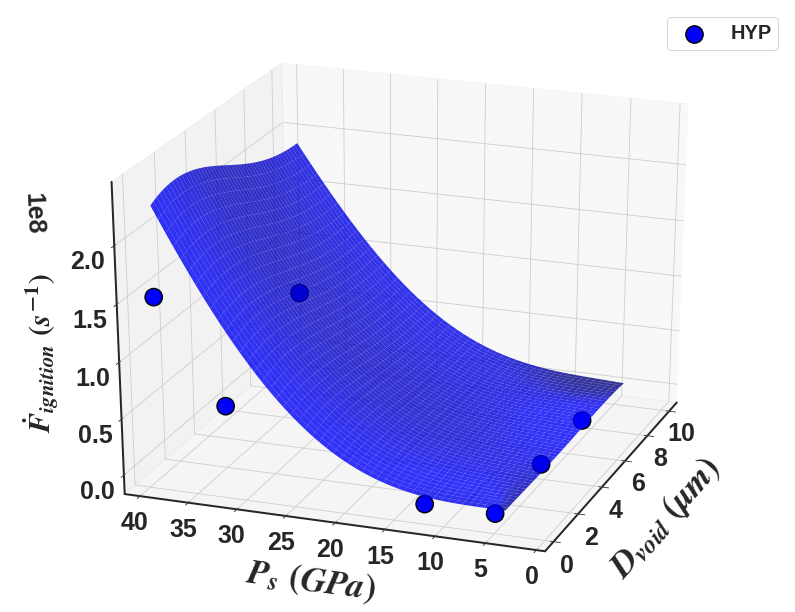

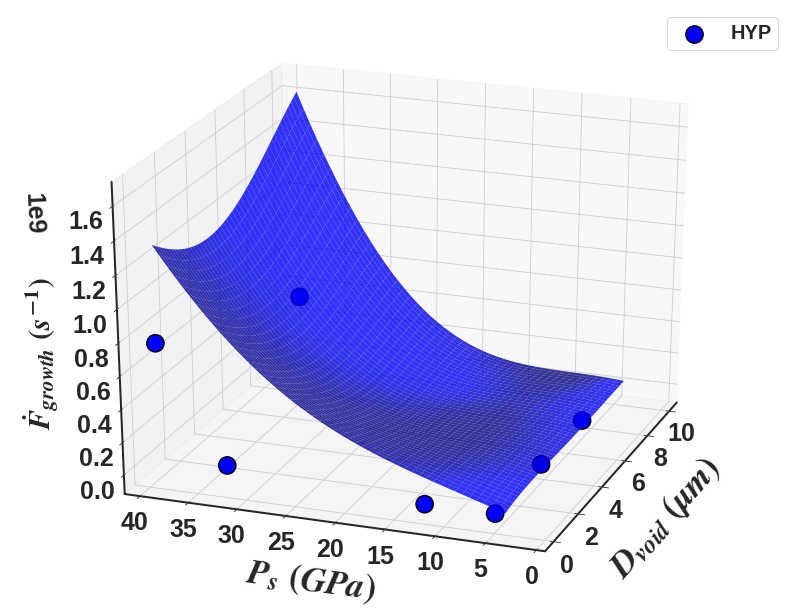

In [0]:
#==============================================================================#
#                                                                              #
#                             Hypo Part (surface)                              #
#                                                                              #
#==============================================================================#
# ==== create the input dataset (Hypo) ==== #
numOfSegments = 50

model_1  = ['P','D']
model_2  = ['Z1','P','D']
model_3  = ['Z1','Z2','P','D']
model_4  = ['Z1','Z2','Z3','P','D']
model_5  = ['Z1','Z2','Z3','E1','P','D']
model_6  = ['Z1','Z2','Z3','E1','E2','P','D']
model_7  = ['Z1','Z2','Z3','E1','E2','E3','P','D']
model_8  = ['Z1','Z2','Z3','E1','E2','E3','h1','P','D']
model_9  = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','P','D']
model_10 = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','P','D']
model_11 = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']


best_features_ig = model_4 #['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','P','D']
best_features_g  = model_3 #['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','P','D']

model_global_ig = SVR(kernel = 'rbf', gamma=0.5, C=1000, epsilon=1e-3)  # before CV (['Z1','Z2','Z3','E1','P','D'])
# model_global_ig = SVR(kernel = 'rbf', gamma=0.75, C=10000, epsilon=1e-3)  # before CV (['Z1','Z2','Z3','E1','P','D'])
## model_global_ig = SVR(kernel = 'rbf', gamma=0.25, C=50, epsilon=1e-3)
# model_global_ig = SVR(kernel = 'rbf', gamma=5, C=10000, epsilon=1e-3) # with CV ['Z1','Z2','Z3','E1','P','D']
# model_global_ig = SVR(kernel = 'rbf', gamma=0.25, C=50, epsilon=1e-3) # no CV ['Z1','Z2','P','D']
# model_global_ig = SVR(kernel = 'rbf', gamma=0.25, C=100, epsilon=1e-3) # with CV ['Z1','Z2','P','D']
# model_global_ig = SVR(kernel = 'rbf', gamma=0.75, C=10000, epsilon=1e-3)
model_global_ig.fit(X_global[best_features_ig],y_global_ig)

model_global_g  = SVR(kernel = 'rbf', gamma=0.5,  C=1000,  epsilon=1e-3) # no CV ['Z1','Z2','P','D']
# model_global_g  = SVR(kernel = 'rbf', gamma=0.25,  C=100,  epsilon=1e-3) # no CV ['Z1','Z2','Z3','E1','P','D']
# model_global_g  = SVR(kernel = 'rbf', gamma=0.1,  C=10,  epsilon=1e-3)
# model_global_g  = SVR(kernel = 'rbf', gamma=0.25,  C=10000,  epsilon=1e-3) # with CV ['Z1','Z2','Z3','E1','P','D']
# model_global_g  = SVR(kernel = 'rbf', gamma=1,  C=10,  epsilon=1e-3) # no CV ['Z1','Z2','Z3','P','D']
# model_global_g  = SVR(kernel = 'rbf', gamma=0.5,  C=10,  epsilon=1e-3) # no CV ['Z1','Z2','P','D']
# model_global_g  = SVR(kernel = 'rbf', gamma=0.25,  C=0.1,  epsilon=1e-3)
model_global_g.fit(X_global[best_features_g],y_global_g)

figRotationX = 30
figRotationZ = 230 

material_Flag = [1,2,3] # 1:HMX, 2:TATB, 3:hypo

for k in material_Flag:
  #======= Ignition =======#
  print()
  if k == 1:
    hypo_feature_copy = HMX_feature[best_features_ig]
    print('HMX chosen!')
  elif k == 2:
    print('TATB chosen!')
    hypo_feature_copy = TATB_feature[best_features_ig]
  elif k == 3:
    print('HYP chosen!')
    hypo_feature_copy = hypo_feature[best_features_ig]
  else:
    print("**** Error material_Flag! ****",'k=',k,' point 1')
  
  hypo_linespace_matrix = np.zeros([numOfSegments, hypo_feature_copy.shape[1]])

  for i in range(hypo_linespace_matrix.shape[1]):
    hypo_linespace_matrix[:,i] = np.linspace(min(hypo_feature_copy.iloc[:,i]),max(hypo_feature_copy.iloc[:,i]), numOfSegments)

  size = np.power(numOfSegments,2)
  hypo_all_dataset_ig = np.zeros([size, hypo_feature_copy.shape[1]])
  counter=0
  for i in range(numOfSegments):
    for j in range(numOfSegments):
      temp = np.append(np.zeros(hypo_feature_copy.shape[1]-2,dtype=int),[i,j])
      for m in range(len(temp)):
        hypo_all_dataset_ig[counter,m] = hypo_linespace_matrix[temp[m],m]
      counter = counter + 1 

  # Predict the response from the out of sample dataset
  print('')
  y_pred_hypo_ig = model_global_ig.predict(hypo_all_dataset_ig)
  # declare y_pred_surf
  y_pred_hypo_ig_surf = np.zeros([numOfSegments, numOfSegments]) 
  counter=0
  for i in range(numOfSegments):
    for j in range(numOfSegments):
      y_pred_hypo_ig_surf[i,j] = y_pred_hypo_ig[counter]
      counter=counter+1
  # meshgrid
  hypo_P_surf, hypo_D_surf = np.meshgrid(hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-2], hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-1], indexing='ij')


  hypo_D_surf_d = denorm_surf_D(hypo_D_surf)
  hypo_P_surf_d = denorm_surf_P(hypo_P_surf)
  y_pred_hypo_ig_surf_d = denorm_ig(y_pred_hypo_ig_surf)

  # Denormalize for plotting
  HMX_feature_d       = denorm_f(HMX_feature)
  TATB_feature_d      = denorm_f(TATB_feature)
  hypo_feature_copy_d = denorm_f(hypo_feature_copy)
  hypo_feature_true_d = denorm_f(hypo_feature_true)
  global_feature_d    = denorm_f(global_feature)
  
  HMX_response_d      = denorm_r(HMX_response)
  TATB_response_d     = denorm_r(TATB_response)
  hypo_response_d     = denorm_r(hypo_response)
  global_response_d   = denorm_r(global_response)
  
  y_pred_hypo_ig_d    = denorm_ig(y_pred_hypo_ig)
  

  # define figure
  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # plot scatters
  # HMX
  markerSize = 300
  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_IG'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_IG'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_IG'],\
           s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')

  # plot surface
  # ax.plot_surface(HMX_P_surf, HMX_D_surf, y_pred_HMX_ig_surf, color='r', alpha=1.0)
  # ax.plot_surface(TATB_P_surf, TATB_D_surf, y_pred_TATB_ig_surf, color='b', alpha=1.0)
  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_ig_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  elif k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  elif k == 3:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  else:
    print("Error material_Flag!",'k=',k,' point 2')
  # ax.set_xlim([-0.2,10.2])
  # ax.set_ylim([0,40])
  # ax.set_zlim([1e-1,5e9])
  # ax.set_zscale('log')
  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
  # ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-5, figRotationZ-30)



  # Another angle ----

  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # plot scatters
  # HMX
  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_IG'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_IG'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_IG'],\
           s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')

  # plot surface
  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_ig_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  elif k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  elif k == 3:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  else:
    print("Error material_Flag!",'k=',k,' point 3')
  
  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-30, figRotationZ+130)


  #======= Growth =======#

  print()
  if k == 1:
    hypo_feature_copy = HMX_feature[best_features_g]
    print('HMX chosen!')
  elif k == 2:
    print('TATB chosen!')
    hypo_feature_copy = TATB_feature[best_features_g]
  elif k == 3:
    print('HYP chosen!')
    hypo_feature_copy = hypo_feature[best_features_g]
  else:
    print("**** Error material_Flag! ****",'k=',k,' point 1')
  
  hypo_linespace_matrix = np.zeros([numOfSegments, hypo_feature_copy.shape[1]])

  for i in range(hypo_linespace_matrix.shape[1]):
    hypo_linespace_matrix[:,i] = np.linspace(min(hypo_feature_copy.iloc[:,i]),max(hypo_feature_copy.iloc[:,i]), numOfSegments)

  size = np.power(numOfSegments,2)
  hypo_all_dataset_g = np.zeros([size, hypo_feature_copy.shape[1]])
  counter=0
  for i in range(numOfSegments):
    for j in range(numOfSegments):
      temp = np.append(np.zeros(hypo_feature_copy.shape[1]-2,dtype=int),[i,j])
      for m in range(len(temp)):
        hypo_all_dataset_g[counter,m] = hypo_linespace_matrix[temp[m],m]
      counter = counter + 1 
  # Predict the response from the out of sample dataset
  print('')
  y_pred_hypo_g  = model_global_g.predict(hypo_all_dataset_g)
  # print('model testing score (ignition) :',LR_model_hypo_ig.score(hypo_outOfSample_testset,y_pred_hypo_outOfSample_ig))
  # print(y_pred_hypo_g.shape)
  # print(y_pred_hypo_outOfSample_ig)
  # declare y_pred_surf
  y_pred_hypo_g_surf = np.zeros([numOfSegments,numOfSegments]) 
  counter=0
  for i in range(numOfSegments):
    for j in range(numOfSegments):
      y_pred_hypo_g_surf[i,j] = y_pred_hypo_g[counter]
      counter=counter+1

  y_pred_hypo_g_surf_d = denorm_g(y_pred_hypo_g_surf)

  # Denormalize for plotting
  y_pred_hypo_g_d     = denorm_g(y_pred_hypo_g)

  # define figure
  # ax = fig.add_subplot(1, 2, 2, projection='3d')
  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # plot scatters
  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_G'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_G'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_G'],\
           s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')

  # plot surface
  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_g_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  if k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  # ax.set_xlim([-0.2,10.2])
  # ax.set_ylim([0,40])
  # ax.set_zlim([1e-1,5e9])
  # ax.set_zscale('log')
  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{growth}\/\/(s^{-1})$', rotation=90)
  # ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-5, figRotationZ-30)



  # Another angle ----

  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # plot scatters
  # HMX
  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_G'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_G'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_G'],\
           s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')

  # plot surface
  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_g_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  # if k == 1:
  #   ax.set_yticks([0, 5, 10, 15, 20, 25])
  # elif k == 2:
  #   ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  # elif k == 3:
  ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  ax.set_xticks([])
  # else:
  #   print("Error material_Flag!",'k=',k,' point 4')

  # ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{growth}\/\/(s^{-1})$', rotation=90)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-30, figRotationZ+130)





  # define figure for the hypo only
  # fig = plt.figure(figsize=plt.figaspect(0.4))
  # ax = fig.add_subplot(1, 2, 1, projection='3d')
  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # ax.plot_surface(HMX_P_surf, HMX_D_surf, y_pred_HMX_ig_surf, color='r', alpha=1.0)
  # ax.plot_surface(TATB_P_surf, TATB_D_surf, y_pred_TATB_ig_surf, color='b', alpha=1.0)

  if k == 1:
    print('HMX')
    ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_IG'],\
             s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  elif k == 2:
    print('TATB')
    ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_IG'],\
             s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  elif k == 3:
    print('HYP')
    ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_IG'],\
             s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')
  else:
    print("Error material_Flag!",'k=',k,' point 5')

  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_ig_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  elif k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  elif k == 3:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  else:
    print("Error material_Flag!",'k=',k,' point 6')

  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
  # ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-5, figRotationZ-30)


  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # ax = fig.add_subplot(1, 2, 2, projection='3d')
  # ax.plot_surface(HMX_P_surf, HMX_D_surf, y_pred_HMX_g_surf, color='r', alpha=1.0)
  # ax.plot_surface(TATB_P_surf, TATB_D_surf, y_pred_TATB_g_surf, color='b', alpha=1.0)
  if k == 1:
    print('HMX')
    ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_G'],\
             s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  elif k == 2:
    print('TATB')
    ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_G'],\
             s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  elif k == 3:
    print('HYP')
    ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_G'],\
             s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')
  else:
    print("Error material_Flag!",'k=',k,' point 7')

  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_g_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  elif k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  elif k == 3:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  else:
    print("Error material_Flag!",'k=',k)

  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{growth}\/\/(s^{-1})$', rotation=90)
  # ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  # fake2Dline = mpl.lines.Line2D([0],[0], linestyle="none", c='b', marker = 'o')
  # ax.legend([fake2Dline], ['Predictions surface'], numpoints = 1)
  ax.view_init(figRotationX-5, figRotationZ-30)






In [0]:
#===========================================================#
#                                                           #
#           Sequential Feature Selection  (ignition)        #      
#                                                           #
#===========================================================#
# ------------- Parameters ------------- #
test_size_ig = 0.48
test_size_g = 0.48
randomSeed = 3
epsilon = 1e-2
# Cs_ig     = np.linspace(1e-1, 1e2, 4)  
# gammas_ig = np.linspace(1e-1, 2, 4)    
# Cs_g     = np.linspace(1e-1, 1e2, 4)   
# gammas_g = np.linspace(1e-1, 2, 4)   
Cs       = [0.1, 1,    5,   10,   50,  100, 500, 1e3, 1e4] 
gammas   = [0.1, 0.25, 0.5, 0.75, 1.0, 2.0, 3,   5]   
print('Cs:',Cs)
print('gammas:',gammas)
# print('Cs_g:',Cs_g)
# print('gammas_g:',gammas_g)

feature_cols = ['Z1','Z2','Z3','E1','E2','E3','h1','h2','h3','al','P','D']
X_global = global_feature[feature_cols]
y_global_ig = global_response['Fdot_IG']

# CV_vector = [5,10,15]
CV_vector = [3]
print('CV_vector:',CV_vector)
# splitRatio = np.linspace(0.2,0.5,8)
# splitRatio = [0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.47, 0.48, 0.5]
splitRatio = [0.3]
print('splitRatio:',splitRatio)

start_total = time.time()

for i in splitRatio:
  for k in CV_vector:
    print()
    print('=========== Ignition Forward ===========','','test_size=',i,'','K=',k)
    print()
    # feature_cols = list(global_feature.columns)
    X_global = global_feature[feature_cols]
    y_global_ig = global_response['Fdot_IG']

    start_1 = time.time()
    # SVM_global_ig = SVR(kernel = 'rbf')#, gamma='scale', C=10, epsilon=epsilon, tol=1e-6)
    # SVM_global_ig = SVR(kernel = 'rbf', epsilon=epsilon)
    # kfold = KFold(n_splits=i, shuffle=True, random_state=randomSeed)
    # for train_index, valid_index in kfold.split(X_global):
    #   X_global_ig_train,    X_global_valid    = X_global.loc[train_index], X_global.loc[valid_index]
    #   y_global_ig_train, y_global_ig_valid = y_global_ig[train_index],  y_global_ig[valid_index]
    # X_global_ig_train, X_global_ig_valid, y_global_ig_train, y_global_ig_valid = train_test_split(X_global, y_global_ig, 
    #                                                                                         shuffle=True, 
    #                                                                                         test_size=test_size_ig, 
    #                                                                                         random_state=randomSeed)
    # sfs_ig = SFS(SVM_global_ig,
    #        k_features=12,
    #        forward=True,
    #        floating=False,
    #        verbose=2,
    #        n_jobs = -1,
    #        scoring='neg_mean_squared_error',
    #        cv=k)

    SVM_global_ig_linear = SVR(kernel = 'linear')

    selector = RFECV(estimator=SVM_global_ig_linear, step=1, min_features_to_select=1, 
                  cv=10, scoring='neg_mean_squared_error',verbose=2,n_jobs=-1)
    X = X_global
    y = y_global_ig
    
    rfe_ig = selector.fit(X,y)
    # rfe_ig

    rfe_ig.support_
    print()
    rfe_ig.ranking_
    print()

    # X_sfs = sfs_ig.transform(X)

    # params_ig = SVR_tuning(X_sfs, y, k, Cs_ig, gammas_ig)
    # C = params_ig['C']
    # gamma = params_ig['gamma']
    # print()
    # print('C=', C)
    # print('gamma=', gamma)

    # SVM_global_ig = SVR(kernel = 'rbf', gamma=gamma, C=C, epsilon=epsilon, tol=1e-6)
    # SVM_global_ig.fit(X_sfs, y)

    # train_error_ig, valid_error_ig   = calc_metrics(X, y, X_global_ig_valid, y_global_ig_valid, SVM_global_ig)
    # train_error_ig, valid_error_ig   = round(train_error_ig, 3), round(valid_error_ig, 3)
    # print('train_error_ig=',train_error_ig)
    # print('valid_error_ig=',valid_error_ig)

    # X_test = sfs_ig.transform(hypo_feature_true)
    # y_test = hypo_response['Fdot_IG']
    # test_error_ig = calc_test_error(X_sfs,y,X_test,y_test,SVM_global_ig)
    # test_error_ig = round( test_error_ig, 3)
    # print('test_error_ig:',test_error_ig)

    # feat_cols = list(sfs_ig.k_feature_idx_)
    # print(feat_cols)
    # # print(sfs_ig.subsets_)
    # # print(sfs_ig.k_feature_names_)
    # print()
    # fig = plot_sfs(sfs_ig.get_metric_dict(), kind='std_err')
    # plt.title('Sequential Forward Selection (w. StdErr)')
    # # plt.ylim([0,1.05])
    # plt.grid()
    # plt.show()
  
    print()
    print('=========== Growth Forward ===========')#,'','test_size=',i,'','K=',k)
    print()
    # feature_cols = list(global_feature.columns)
    X_global = global_feature[feature_cols]
    y_global_g = global_response['Fdot_G']
    # SVM_global_g = SVR(kernel = 'rbf',gamma='scale', C=penalty, epsilon=epsilon)
  
    # CV_vector = np.array([5])
    # CV_vector = np.array([8,9,10,11,12,13,14,15,16])
    # min_features_vec = np.array([3,4,5,6,7,8])
  
    SVM_global_g = SVR(kernel = 'rbf')#, gamma='scale', C=10, epsilon=epsilon, tol=1e-6)
    # SVM_global_g = SVR(kernel = 'rbf', epsilon=epsilon)
    # kfold = KFold(n_splits=i, shuffle=True, random_state=randomSeed)
    # for train_index, valid_index in kfold.split(X_global):
    #   X_global_g_train,    X_global_valid    = X_global.loc[train_index], X_global.loc[valid_index]
    #   y_global_g_train, y_global_g_valid = y_global_g[train_index],  y_global_g[valid_index]
    # X_global_g_train, X_global_g_valid, y_global_g_train, y_global_g_valid = train_test_split(X_global, y_global_g, 
    #                                                                                         shuffle=True, 
    #                                                                                         test_size=test_size_g, 
    #                                                                                         random_state=randomSeed)
    # sfs_g = SFS(SVM_global_g,
    #        k_features=12,
    #        forward=True,
    #        floating=False,
    #        verbose=2,
    #        n_jobs = -1,
    #        scoring='neg_mean_squared_error',
    #        cv=k)

    SVM_global_g_linear = SVR(kernel = 'linear')

    selector = RFECV(estimator=SVM_global_g_linear, step=1, min_features_to_select=1, 
                  cv=10, scoring='neg_mean_squared_error',verbose=2,n_jobs=-1)
    X = X_global
    y = y_global_g
    
    rfe_g = selector.fit(X,y)
    
    rfe_g.support_
    print()
    rfe_g.ranking_
    print()

    # sfs_g = sfs_g.fit(X,y)
    # X_sfs = sfs_g.transform(X)

    # params_g = SVR_tuning(X_sfs, y, k, Cs_g, gammas_g)
    # C = params_g['C']
    # gamma = params_g['gamma']

    # print()
    # print('C=', C)
    # print('gamma=', gamma)

    # # X = X_global_g_train
    # # y = y_global_g_train
    # SVM_global_g = SVR(kernel = 'rbf', gamma=gamma, C=C, epsilon=epsilon, tol=1e-6)
    # SVM_global_g.fit(X_sfs, y)

    # train_error_g, valid_error_g   = calc_metrics(X, y, X_global_g_valid, y_global_g_valid, SVM_global_g)
    # train_error_g, valid_error_g   = round(train_error_g, 3), round(valid_error_g, 3)
    # print('train_error_g=',train_error_g)
    # print('valid_error_g=',valid_error_g)

    # X_test = sfs_g.transform(hypo_feature_true)
    # y_test = hypo_response['Fdot_G']
    # test_error_g = calc_test_error(X_sfs,y,X_test,y_test,SVM_global_g)
    # test_error_g = round( test_error_g, 3)
    # print('test_error_g:',test_error_g)

    # feat_cols = list(sfs_g.k_feature_idx_)
    # print(feat_cols)
    # # print(sfs_g.subsets_)
    # print(sfs_g.k_feature_names_)
    # fig = plot_sfs(sfs_g.get_metric_dict(), kind='std_err')
    # plt.title('Sequential Forward Selection (w. StdErr)')
    # # plt.ylim([0,1.05])
    # plt.grid()
    # plt.show()

end_total = time.time()
hours, rem = divmod(end_total - start_total, 3600)
minutes, seconds = divmod(rem, 60)
print('=========================')
print('Total time (ignition - all): ',"{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
print('=========================')



Cs: [0.1, 1, 5, 10, 50, 100, 500, 1000.0, 10000.0]
gammas: [0.1, 0.25, 0.5, 0.75, 1.0, 2.0, 3, 5]
CV_vector: [3]
splitRatio: [0.3]

=========== Ignition Forward ===========  test_size= 0.3  K= 3

Fitting estimator with 12 features.



=========== Growth Forward ===========

Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.


Total time (ignition - all):  00:00:02.51


In [0]:
rfe_g.support_

array([False, False, False, False, False, False, False, False,  True,
        True,  True, False])

In [0]:
df_ig = pd.DataFrame.from_dict(sfs_ig.get_metric_dict()).T
df_ig.sort_values('avg_score', inplace=True, ascending=False)
df_ig

In [0]:
df_ig_f = pd.DataFrame.from_dict(sfs_ig_f.get_metric_dict()).T
# df_ig_f.sort_values('avg_score', inplace=True, ascending=False)
avg = -df_ig_f.iloc[:]['avg_score']
avg = [[np.sqrt(k) for k in avg]]
avg = np.transpose(avg)
print(avg.shape)
print(avg)

for i in range(df_ig_f.shape[0]):
  print(df_ig_f.iloc[i]['feature_idx'])
  X_train = X_global_ig_train.iloc[:,0:i]
  print(X_train)
    # print(X_global_ig_train.iloc[:,0:i])
  # X_train = X_global_ig_train.iloc[:,0:i]
  # y_train = y_global_ig_train
  # X_valid = X_global_ig_valid.iloc[:,0:i]
  # y_valid = y_global_ig_valid
  # X_test  = hypo_feature_true.iloc[:,0:i]
  # train_error_ig, valid_error_ig   = calc_metrics(X_train, y_train, X_valid, y_valid, SVM_global_ig)
  # test_error_ig                    = calc_test_error(X_train, y_train, X_test, y_test, SVM_global_g)
  # train_error_ig, valid_error_ig   = round(train_error_ig, 3), round(valid_error_ig, 3)
  # test_error_ig                    = round(test_error_ig, 3)
  # print('train_error_ig=',train_error_ig)
  # print('valid_error_ig=',valid_error_ig)
  # print('test_error_ig:',test_error_ig)


(12, 1)
[[0.2201581 ]
 [0.0639527 ]
 [0.05404522]
 [0.05352946]
 [0.05549904]
 [0.06274057]
 [0.06652501]
 [0.06831748]
 [0.07181701]
 [0.07270413]
 [0.07724905]
 [0.08152659]]
(10,)
Empty DataFrame
Columns: []
Index: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 20, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 91, 92, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 108, 109, ...]

[122 rows x 0 columns]
(4, 10)
      Z1
1    1.0
2    1.0
3    1.0
4    1.0
5    1.0
..   ...
129  0.0
130  0.0
132  0.0
133  0.0
134  0.0

[122 rows x 1 columns]
(4, 10, 11)
      Z1   Z2
1    1.0  1.0
2    1.0  1.0
3    1.0  1.0
4    1.0  1.0
5    1.0  1.0
..   ...  ...
129  0.0  0.0
130  0.0  0.0
132  0.0  0.0
133  0.0  0.0
134  0.0  0.0

[122 rows x 2 columns]
(3, 4, 10

In [0]:

y_ig_test = hypo_response['Fdot_IG']
y_g_test  = hypo_response['Fdot_G']

SVM_global_ig = SVR(kernel = 'rbf', gamma='scale', C=10, epsilon=epsilon, tol=1e-6)

kfold = KFold(n_splits=10, shuffle=True, random_state=randomSeed)
for train_index, valid_index in kfold.split(X_global):
  X_global_ig_train, X_global_ig_valid = X_global.loc[train_index], X_global.loc[valid_index]
  y_global_ig_train, y_global_ig_valid = y_global_ig[train_index],  y_global_ig[valid_index]

for i in range(1,X_global_ig_train.shape[1]+1): 
  print(i,':',list(X_global_ig_train.columns[0:i]))
  # print(X_global_ig_train.iloc[:,0:i])
  X_train = X_global_ig_train.iloc[:,0:i]
  y_train = y_global_ig_train
  X_valid = X_global_ig_valid.iloc[:,0:i]
  y_valid = y_global_ig_valid
  X_test  = hypo_feature_true.iloc[:,0:i]
  train_error_ig, valid_error_ig   = calc_metrics(X_train, y_train, X_valid, y_valid, SVM_global_ig)
  test_error_ig                    = calc_test_error(X_train, y_train, X_test, y_ig_test, SVM_global_g)
  train_error_ig, valid_error_ig   = round(train_error_ig, 3), round(valid_error_ig, 3)
  test_error_ig                    = round(test_error_ig, 3)
  print('train_error_ig=',train_error_ig)
  print('valid_error_ig=',valid_error_ig)
  print('test_error_ig:',test_error_ig)


##### Output Copy

CV_vector: [5, 10, 15]
splitRatio: [0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.47, 0.48, 0.5]

=========== Ignition Forward ===========  test_size= 0.2  K= 5

train_error_ig= 0.061
valid_error_ig= 0.115


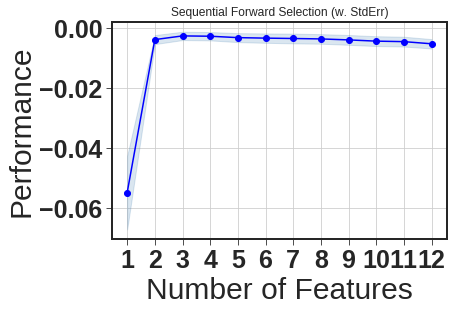


=========== Growth Forward ===========  test_size= 0.2  K= 5

train_error_g= 0.076
valid_error_g= 0.066


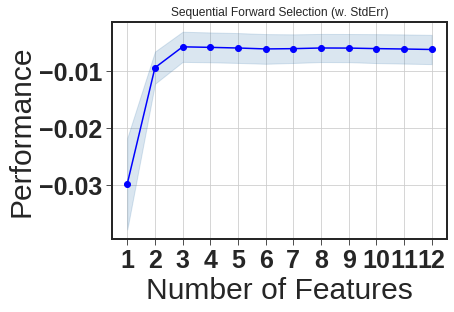


=========== Ignition Forward ===========  test_size= 0.2  K= 10

train_error_ig= 0.061
valid_error_ig= 0.115


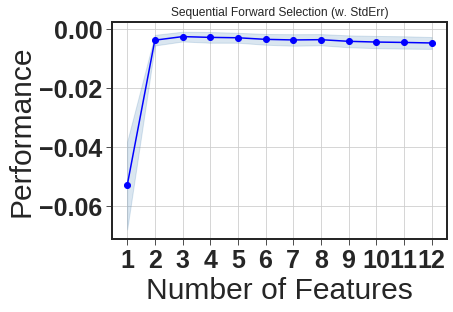


=========== Growth Forward ===========  test_size= 0.2  K= 10

train_error_g= 0.076
valid_error_g= 0.066


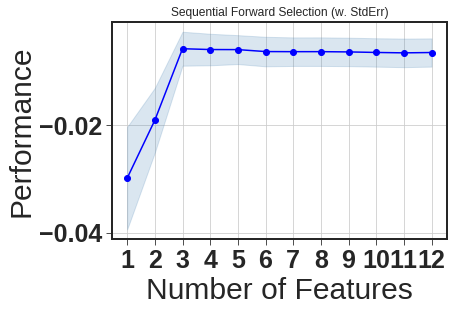


=========== Ignition Forward ===========  test_size= 0.2  K= 15

train_error_ig= 0.061
valid_error_ig= 0.115


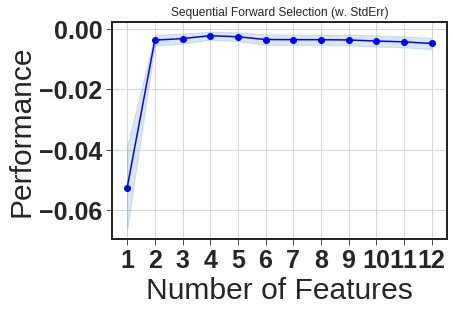


=========== Growth Forward ===========  test_size= 0.2  K= 15

train_error_g= 0.076
valid_error_g= 0.066


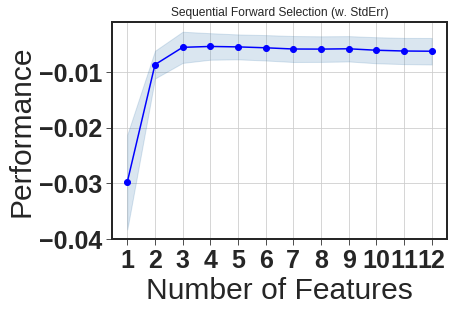


=========== Ignition Forward ===========  test_size= 0.25  K= 5

train_error_ig= 0.058
valid_error_ig= 0.113


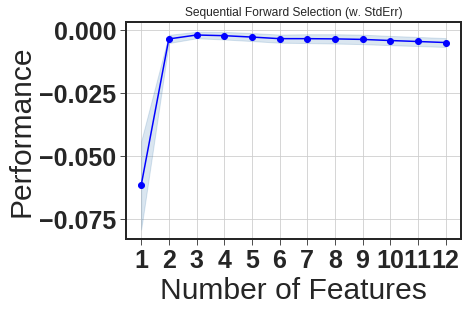


=========== Growth Forward ===========  test_size= 0.25  K= 5

train_error_g= 0.07
valid_error_g= 0.083


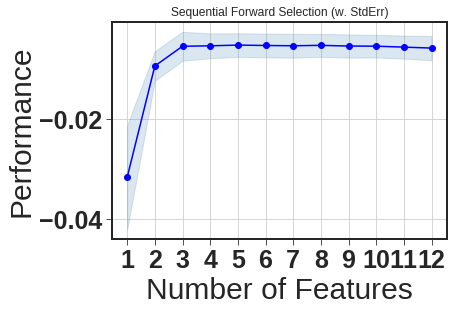


=========== Ignition Forward ===========  test_size= 0.25  K= 10

train_error_ig= 0.058
valid_error_ig= 0.113


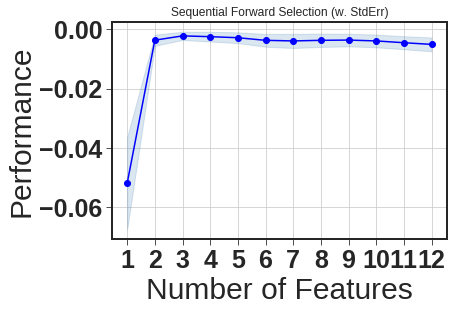


=========== Growth Forward ===========  test_size= 0.25  K= 10

train_error_g= 0.07
valid_error_g= 0.083


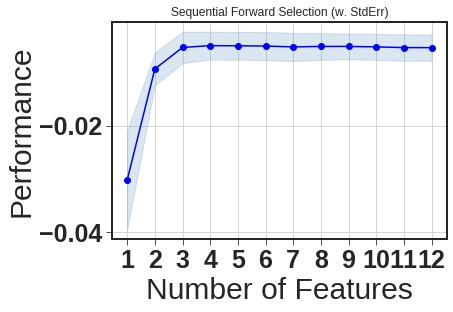


=========== Ignition Forward ===========  test_size= 0.25  K= 15

train_error_ig= 0.058
valid_error_ig= 0.113


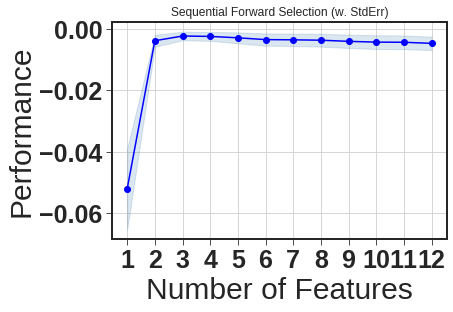


=========== Growth Forward ===========  test_size= 0.25  K= 15

train_error_g= 0.07
valid_error_g= 0.083


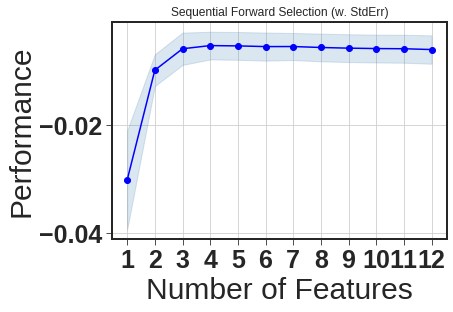


=========== Ignition Forward ===========  test_size= 0.3  K= 5

train_error_ig= 0.059
valid_error_ig= 0.098


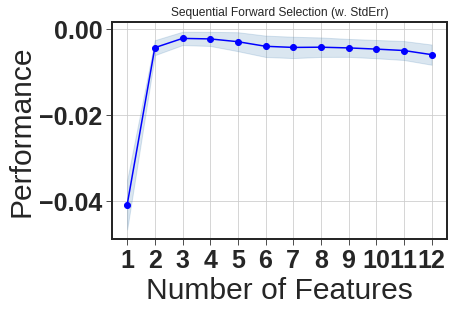


=========== Growth Forward ===========  test_size= 0.3  K= 5

train_error_g= 0.057
valid_error_g= 0.106


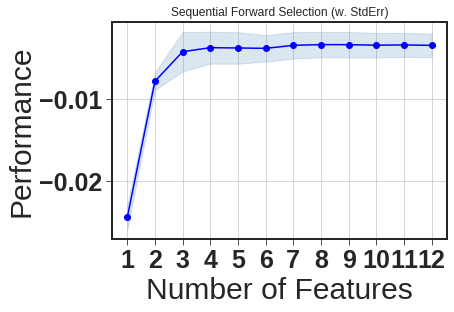


=========== Ignition Forward ===========  test_size= 0.3  K= 10

train_error_ig= 0.059
valid_error_ig= 0.098


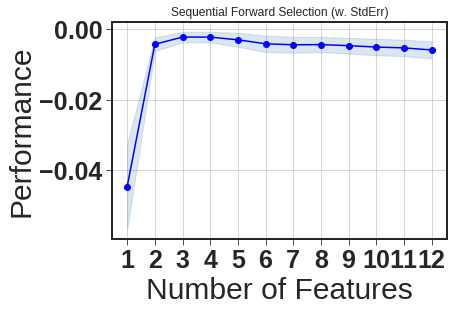


=========== Growth Forward ===========  test_size= 0.3  K= 10

train_error_g= 0.057
valid_error_g= 0.106


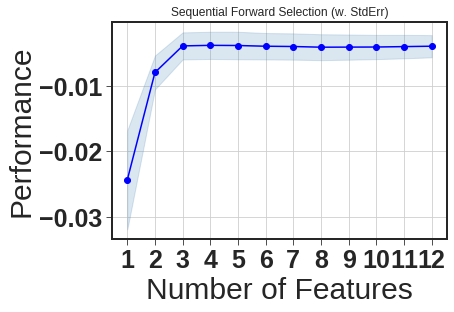


=========== Ignition Forward ===========  test_size= 0.3  K= 15

train_error_ig= 0.059
valid_error_ig= 0.098


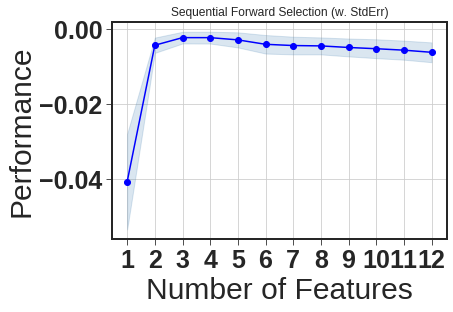


=========== Growth Forward ===========  test_size= 0.3  K= 15

train_error_g= 0.057
valid_error_g= 0.106


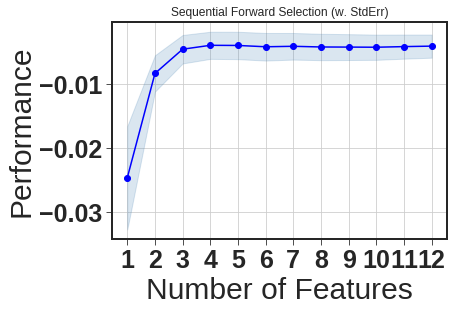


=========== Ignition Forward ===========  test_size= 0.35  K= 5

train_error_ig= 0.067
valid_error_ig= 0.09


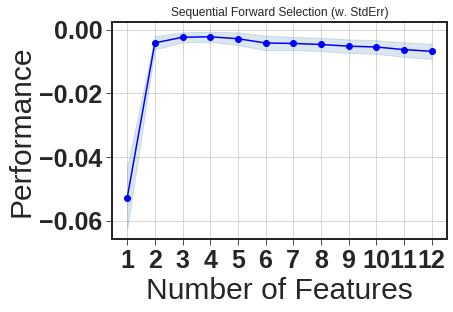


=========== Growth Forward ===========  test_size= 0.35  K= 5

train_error_g= 0.058
valid_error_g= 0.098


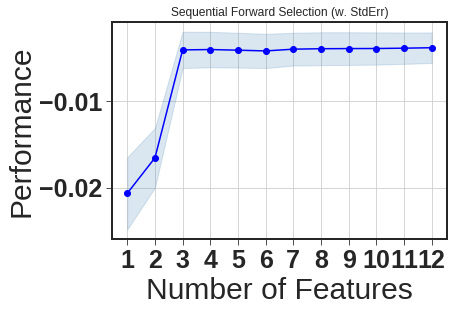


=========== Ignition Forward ===========  test_size= 0.35  K= 10

train_error_ig= 0.067
valid_error_ig= 0.09


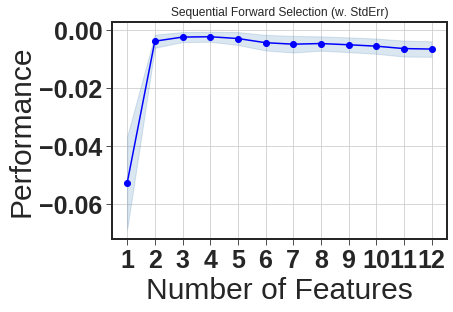


=========== Growth Forward ===========  test_size= 0.35  K= 10

train_error_g= 0.058
valid_error_g= 0.098


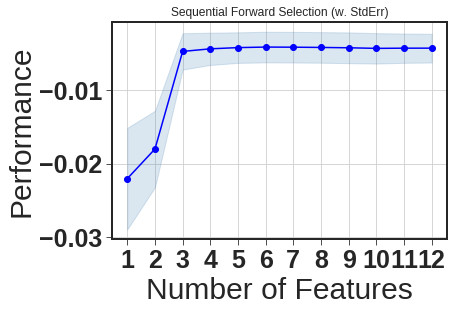


=========== Ignition Forward ===========  test_size= 0.35  K= 15

train_error_ig= 0.067
valid_error_ig= 0.09


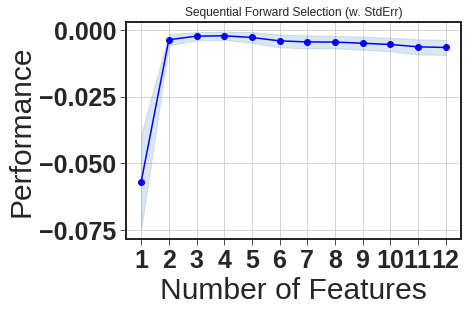


=========== Growth Forward ===========  test_size= 0.35  K= 15

train_error_g= 0.058
valid_error_g= 0.098


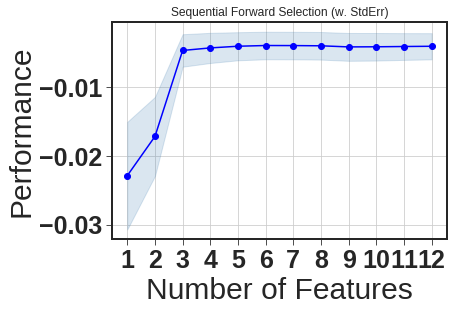


=========== Ignition Forward ===========  test_size= 0.4  K= 5

train_error_ig= 0.069
valid_error_ig= 0.085


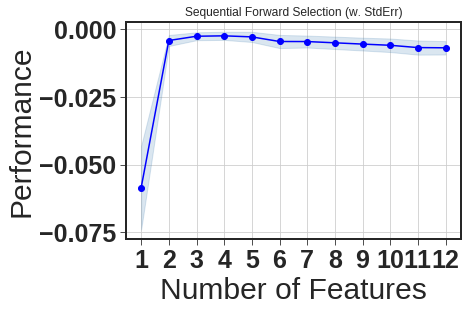


=========== Growth Forward ===========  test_size= 0.4  K= 5

train_error_g= 0.06
valid_error_g= 0.092


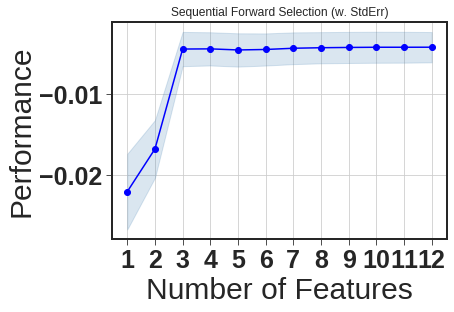


=========== Ignition Forward ===========  test_size= 0.4  K= 10

train_error_ig= 0.069
valid_error_ig= 0.085


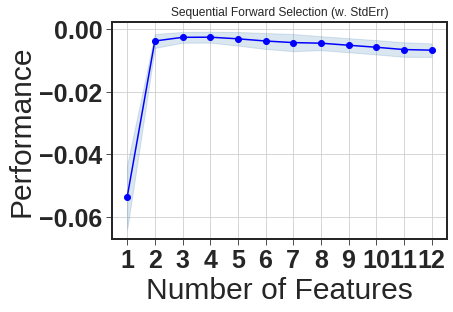


=========== Growth Forward ===========  test_size= 0.4  K= 10

train_error_g= 0.06
valid_error_g= 0.092


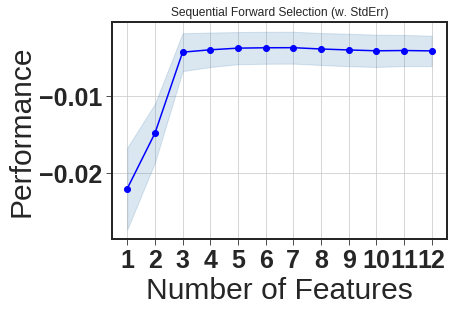


=========== Ignition Forward ===========  test_size= 0.4  K= 15

train_error_ig= 0.069
valid_error_ig= 0.085


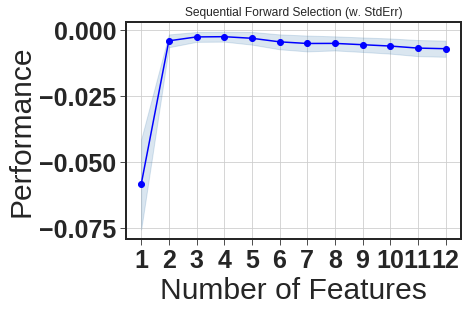


=========== Growth Forward ===========  test_size= 0.4  K= 15

train_error_g= 0.06
valid_error_g= 0.092


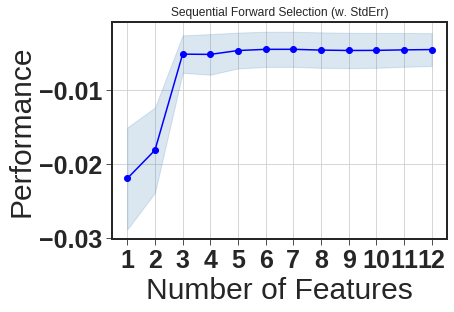


=========== Ignition Forward ===========  test_size= 0.45  K= 5

train_error_ig= 0.072
valid_error_ig= 0.082


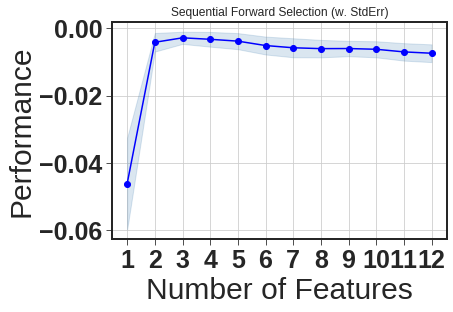


=========== Growth Forward ===========  test_size= 0.45  K= 5

train_error_g= 0.062
valid_error_g= 0.088


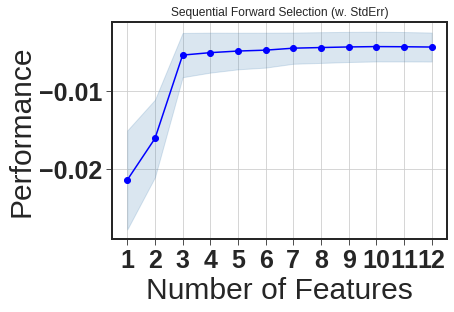


=========== Ignition Forward ===========  test_size= 0.45  K= 10

train_error_ig= 0.072
valid_error_ig= 0.082


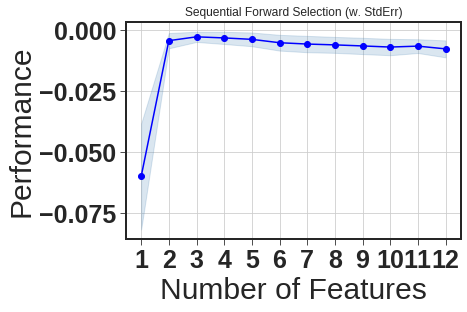


=========== Growth Forward ===========  test_size= 0.45  K= 10

train_error_g= 0.062
valid_error_g= 0.088


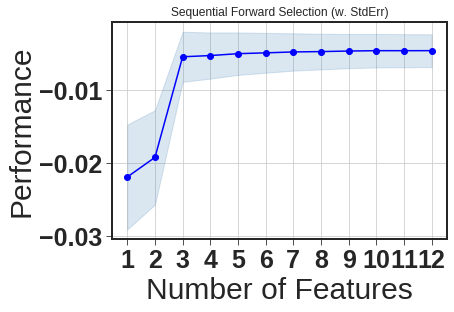


=========== Ignition Forward ===========  test_size= 0.45  K= 15

train_error_ig= 0.072
valid_error_ig= 0.082


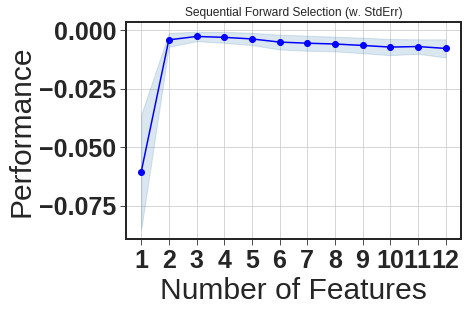


=========== Growth Forward ===========  test_size= 0.45  K= 15

train_error_g= 0.062
valid_error_g= 0.088


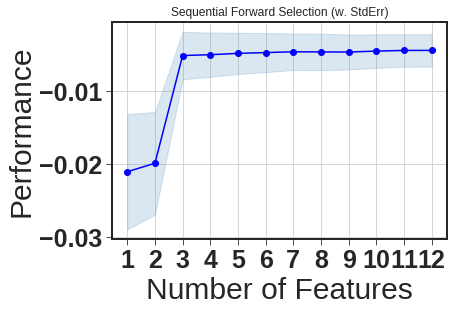


=========== Ignition Forward ===========  test_size= 0.47  K= 5

train_error_ig= 0.073
valid_error_ig= 0.086


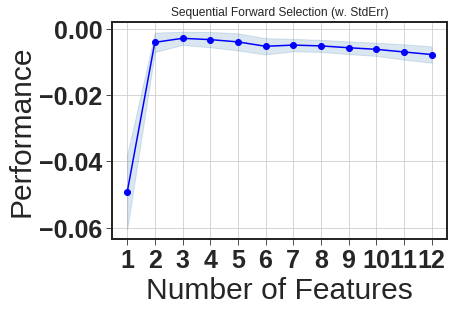


=========== Growth Forward ===========  test_size= 0.47  K= 5

train_error_g= 0.062
valid_error_g= 0.087


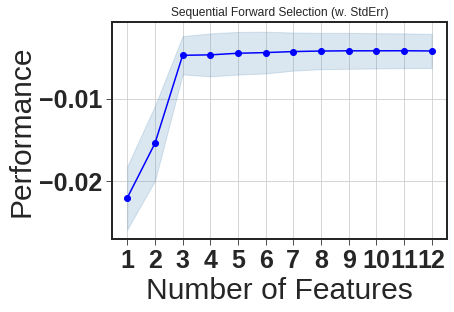


=========== Ignition Forward ===========  test_size= 0.47  K= 10

train_error_ig= 0.073
valid_error_ig= 0.086


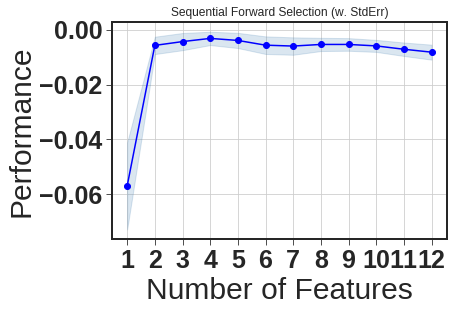


=========== Growth Forward ===========  test_size= 0.47  K= 10

train_error_g= 0.062
valid_error_g= 0.087


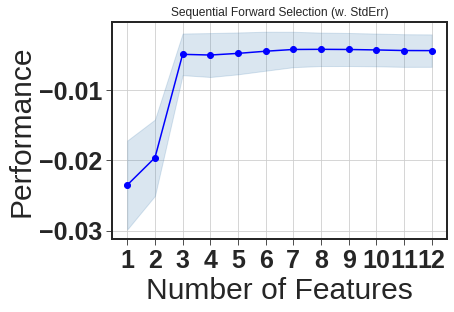


=========== Ignition Forward ===========  test_size= 0.47  K= 15

train_error_ig= 0.073
valid_error_ig= 0.086


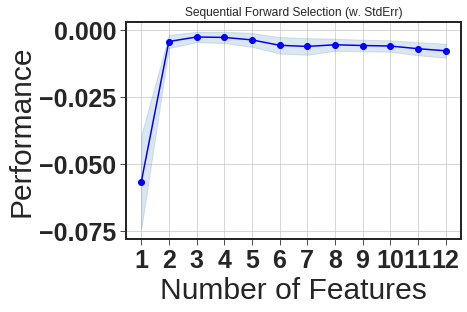


=========== Growth Forward ===========  test_size= 0.47  K= 15

train_error_g= 0.062
valid_error_g= 0.087


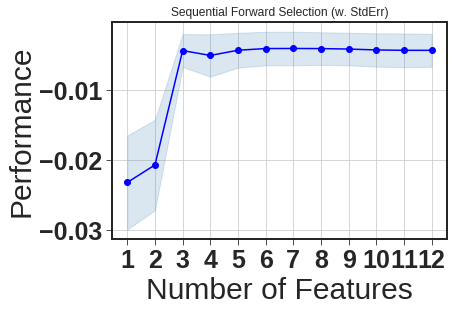


=========== Ignition Forward ===========  test_size= 0.48  K= 5

train_error_ig= 0.074
valid_error_ig= 0.087


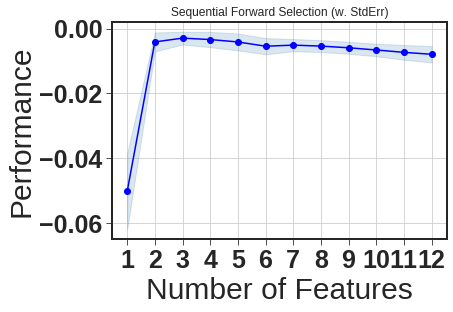


=========== Growth Forward ===========  test_size= 0.48  K= 5

train_error_g= 0.062
valid_error_g= 0.086


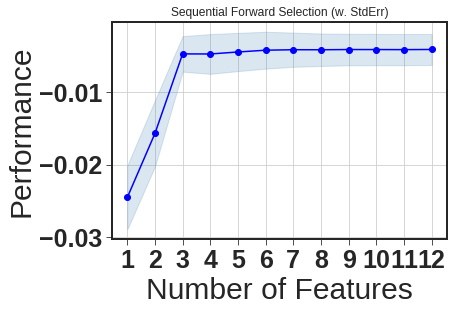


=========== Ignition Forward ===========  test_size= 0.48  K= 10

train_error_ig= 0.074
valid_error_ig= 0.087


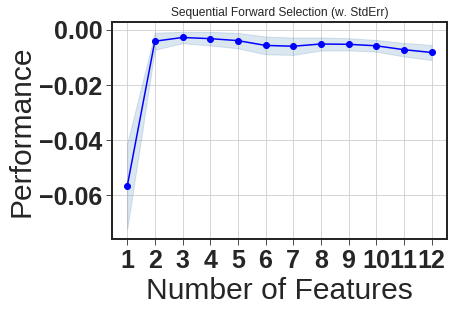


=========== Growth Forward ===========  test_size= 0.48  K= 10

train_error_g= 0.062
valid_error_g= 0.086


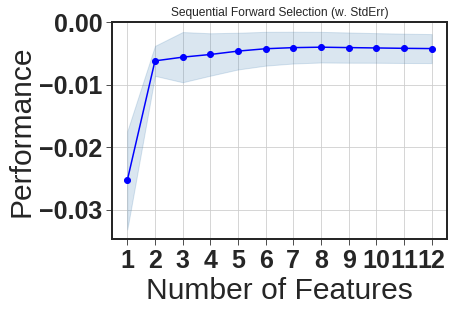


=========== Ignition Forward ===========  test_size= 0.48  K= 15

train_error_ig= 0.074
valid_error_ig= 0.087


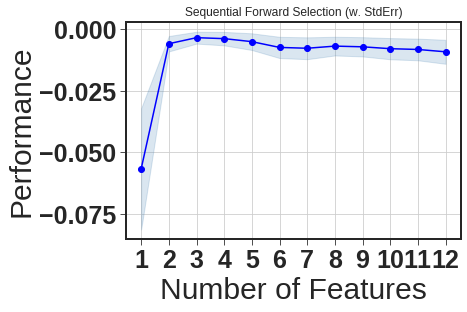


=========== Growth Forward ===========  test_size= 0.48  K= 15

train_error_g= 0.062
valid_error_g= 0.086


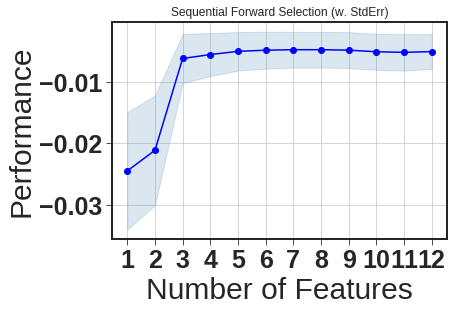


=========== Ignition Forward ===========  test_size= 0.5  K= 5

train_error_ig= 0.074
valid_error_ig= 0.086


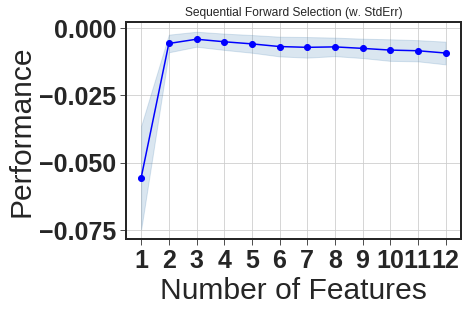


=========== Growth Forward ===========  test_size= 0.5  K= 5

train_error_g= 0.064
valid_error_g= 0.085


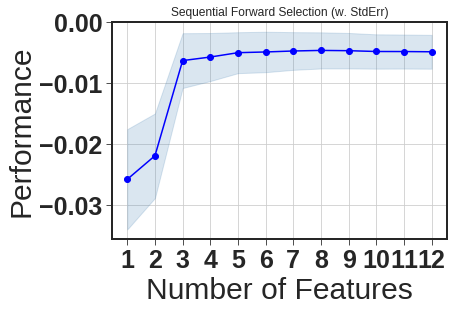


=========== Ignition Forward ===========  test_size= 0.5  K= 10

train_error_ig= 0.074
valid_error_ig= 0.086


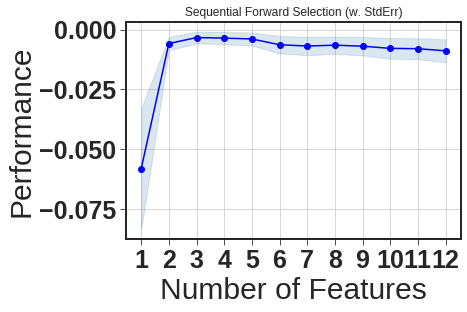


=========== Growth Forward ===========  test_size= 0.5  K= 10

train_error_g= 0.064
valid_error_g= 0.085


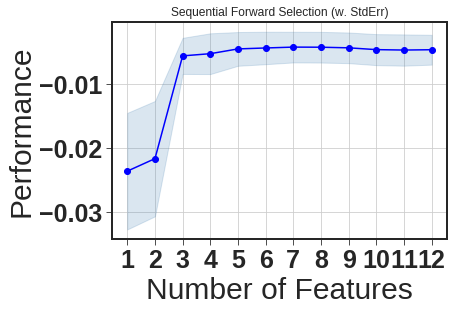


=========== Ignition Forward ===========  test_size= 0.5  K= 15

train_error_ig= 0.074
valid_error_ig= 0.086


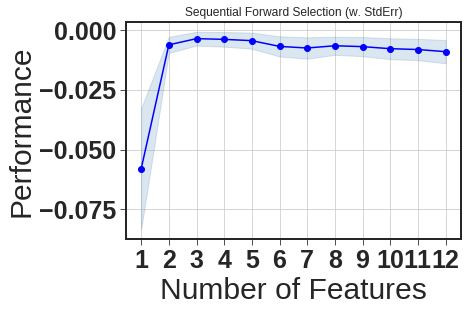


=========== Growth Forward ===========  test_size= 0.5  K= 15

train_error_g= 0.064
valid_error_g= 0.085


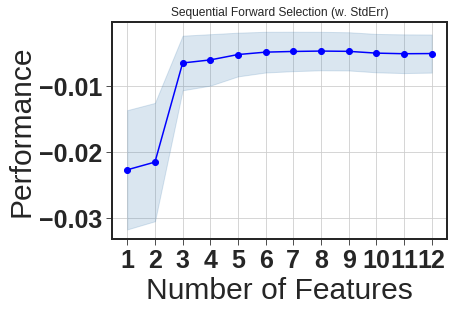

Total time (ignition - all):  00:24:29.96


In [0]:
#===========================================================#
#                                                           #
#           Sequential Feature Selection  (ignition)        #      
#                                                           #
#===========================================================#
# ------------- Parameters ------------- #
test_size_ig = 0.45
test_size_g = 0.45
randomSeed = 3
epsilon = 1e-6
n_folds=5
Cs_ig     = np.linspace(1e-2, 1e4, 4)  
gammas_ig = np.linspace(1e-2, 2, 4)    
Cs_g     = np.linspace(1e-2, 1e4, 4)   
gammas_g = np.linspace(1e-1, 2, 4)   

# CV_vector = np.array([8,9,10,11,12,13,14,15,16])
# min_features_vec = np.array([3,4,5,6,7,8])

CV_vector = [5,10,15]
print('CV_vector:',CV_vector)
# splitRatio = np.linspace(0.2,0.5,8)
splitRatio = [0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.47, 0.48, 0.5]
print('splitRatio:',splitRatio)

start_total = time.time()

for i in splitRatio:
  for k in CV_vector:
    print()
    print('=========== Ignition Forward ===========','','test_size=',i,'','K=',k)
    print()
    feature_cols = list(global_feature.columns)
    X_global_ig = global_feature[feature_cols]
    y_global_ig = global_response['Fdot_IG']

    start_1 = time.time()
    SVM_global_ig = SVR(kernel = 'rbf', gamma='scale', C=10, epsilon=epsilon)
    # SVM_global_ig = SVR(kernel = 'rbf', epsilon=epsilon)
    # kfold = KFold(n_splits=i, shuffle=True, random_state=randomSeed)
    # for train_index, valid_index in kfold.split(X_global):
    #   X_global_ig_train,    X_global_valid    = X_global.loc[train_index], X_global.loc[valid_index]
    #   y_global_ig_train, y_global_ig_valid = y_global_ig[train_index],  y_global_ig[valid_index]
    X_global_ig_train, X_global_ig_valid, y_global_ig_train, y_global_ig_valid = train_test_split(X_global, y_global_ig, 
                                                                                            shuffle=True, 
                                                                                            test_size=i, 
                                                                                            random_state=randomSeed)
    sfs_ig_f = SFS(SVM_global_ig,
           k_features=12,
           forward=True,
           floating=False,
           verbose=0,
           n_jobs = -1,
           scoring='neg_mean_squared_error',
           cv=k)
    
    #'r2' 'neg_mean_squared_error'
    X = X_global_ig_train
    y = y_global_ig_train
    sfs_ig_f = sfs_ig_f.fit(X,y)
    X_sfs = sfs_ig_f.transform(X)
    SVM_global_ig.fit(X_sfs, y)

    train_error_ig, valid_error_ig   = calc_metrics(X, y, X_global_ig_valid, y_global_ig_valid, SVM_global_ig)
    train_error_ig, valid_error_ig   = round(train_error_ig, 3), round(valid_error_ig, 3)
    print('train_error_ig=',train_error_ig)
    print('valid_error_ig=',valid_error_ig)

    feat_cols = list(sfs_ig_f.k_feature_idx_)
    # print(feat_cols)
    # print(sfs_ig_f.subsets_)
    # print(sfs_ig_f.k_feature_names_)
    fig = plot_sfs(sfs_ig_f.get_metric_dict(), kind='std_err')
    plt.title('Sequential Forward Selection (w. StdErr)')
    # plt.ylim([0,1.05])
    plt.grid()
    plt.show()
  
    print()
    print('=========== Growth Forward ===========','','test_size=',i,'','K=',k)
    print()
    feature_cols = list(global_feature.columns)
    X_global_g = global_feature[feature_cols]
    y_global_g = global_response['Fdot_G']
    # SVM_global_g = SVR(kernel = 'rbf',gamma='scale', C=penalty, epsilon=epsilon)
  
    # CV_vector = np.array([5])
    # CV_vector = np.array([8,9,10,11,12,13,14,15,16])
    # min_features_vec = np.array([3,4,5,6,7,8])
  
    SVM_global_g = SVR(kernel = 'rbf', gamma='scale', C=10, epsilon=epsilon)
    # SVM_global_g = SVR(kernel = 'rbf', epsilon=epsilon)
    # kfold = KFold(n_splits=i, shuffle=True, random_state=randomSeed)
    # for train_index, valid_index in kfold.split(X_global):
    #   X_global_g_train,    X_global_valid    = X_global.loc[train_index], X_global.loc[valid_index]
    #   y_global_g_train, y_global_g_valid = y_global_g[train_index],  y_global_g[valid_index]
    X_global_g_train, X_global_g_valid, y_global_g_train, y_global_g_valid = train_test_split(X_global, y_global_g, 
                                                                                            shuffle=True, 
                                                                                            test_size=i, 
                                                                                            random_state=randomSeed)
    sfs_g_f = SFS(SVM_global_g,
           k_features=12,
           forward=True,
           floating=False,
           verbose=0,
           n_jobs = -1,
           scoring='neg_mean_squared_error',
           cv=k)
  
    X = X_global_g_train
    y = y_global_g_train
    sfs_g_f = sfs_g_f.fit(X,y)
  
    X_sfs = sfs_g_f.transform(X)
    SVM_global_g.fit(X_sfs, y)

    train_error_g, valid_error_g   = calc_metrics(X, y, X_global_g_valid, y_global_g_valid, SVM_global_g)
    train_error_g, valid_error_g   = round(train_error_g, 3), round(valid_error_g, 3)
    print('train_error_g=',train_error_g)
    print('valid_error_g=',valid_error_g)

    feat_cols = list(sfs_g_f.k_feature_idx_)
    # print(feat_cols)
    # print(sfs_g_f.subsets_)
    # print(sfs_g_f.k_feature_names_)
    fig = plot_sfs(sfs_g_f.get_metric_dict(), kind='std_err')
    plt.title('Sequential Forward Selection (w. StdErr)')
    # plt.ylim([0,1.05])
    plt.grid()
    plt.show()

end_total = time.time()
hours, rem = divmod(end_total - start_total, 3600)
minutes, seconds = divmod(rem, 60)
print('=========================')
print('Total time (ignition - all): ',"{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
print('=========================')



### Prediction of the SFS


(2500,)
(50, 12)


HMX chosen!


HMX chosen!

HMX
HMX

TATB chosen!


TATB chosen!

TATB
TATB

HYP chosen!


HYP chosen!

HYP
HYP


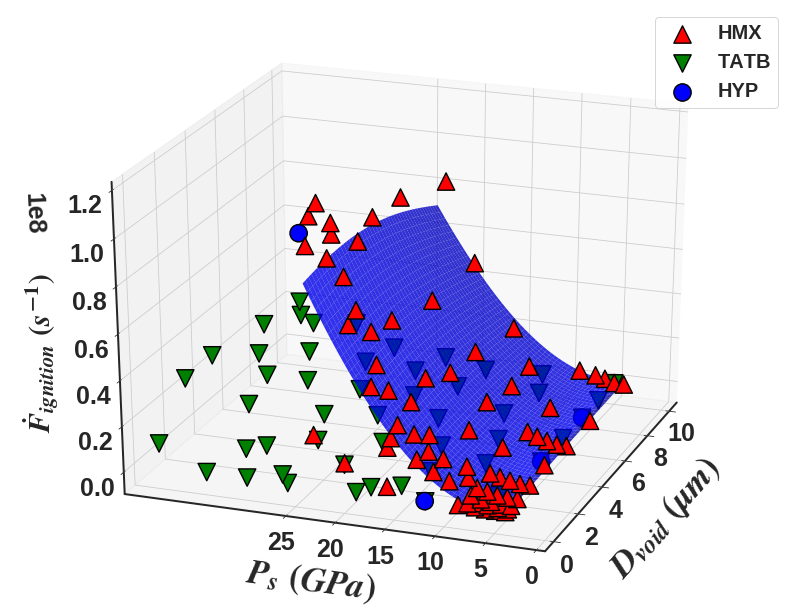

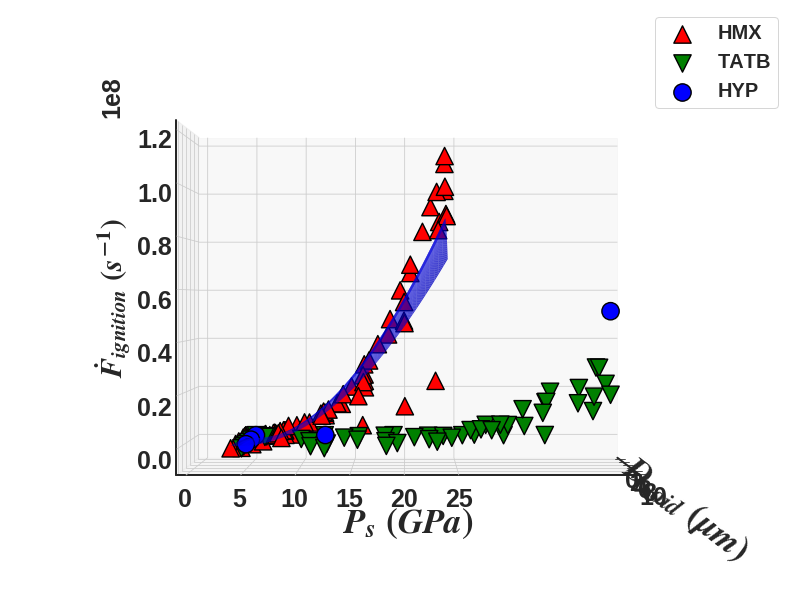

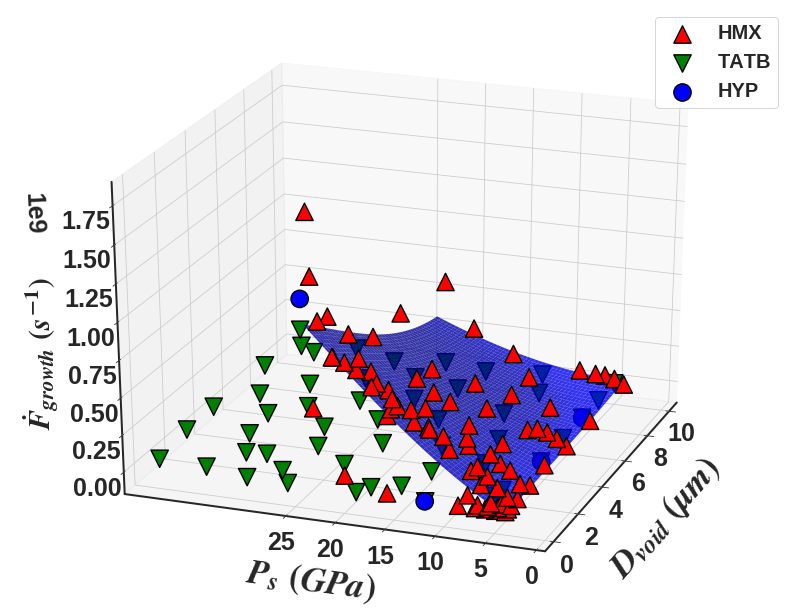

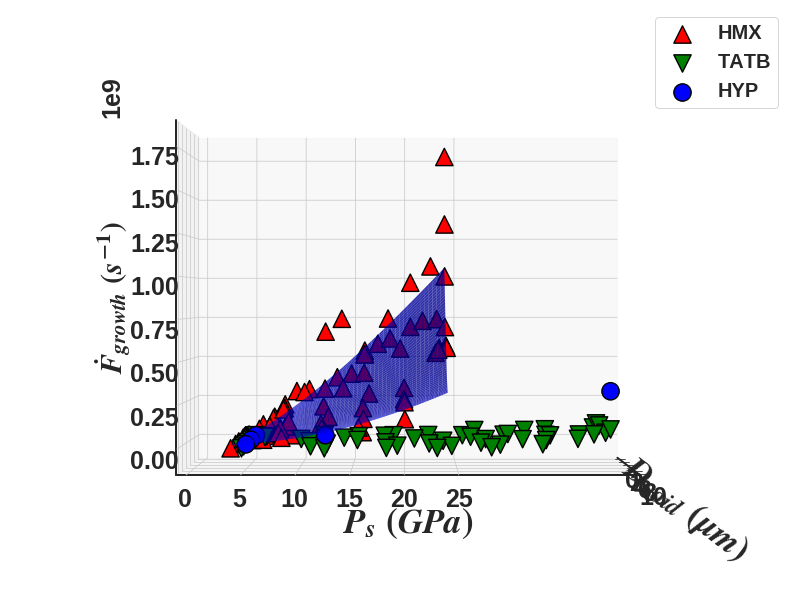

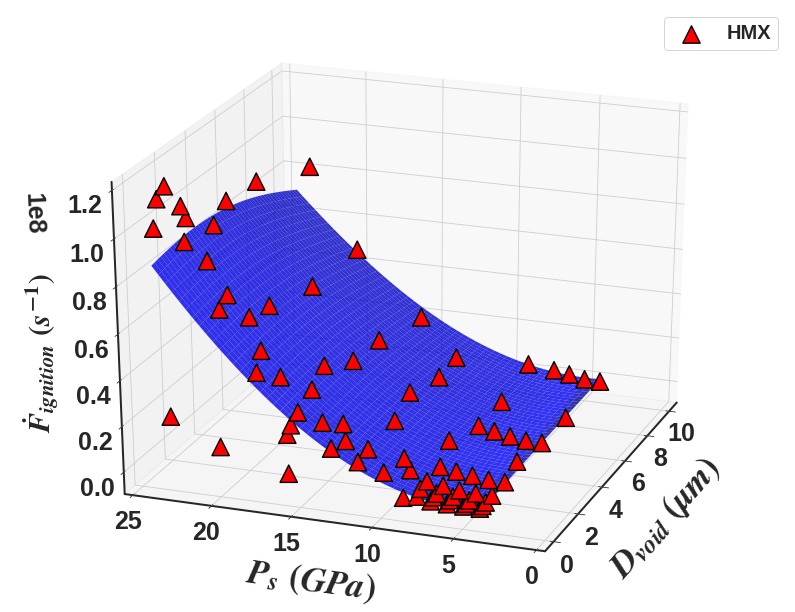

...

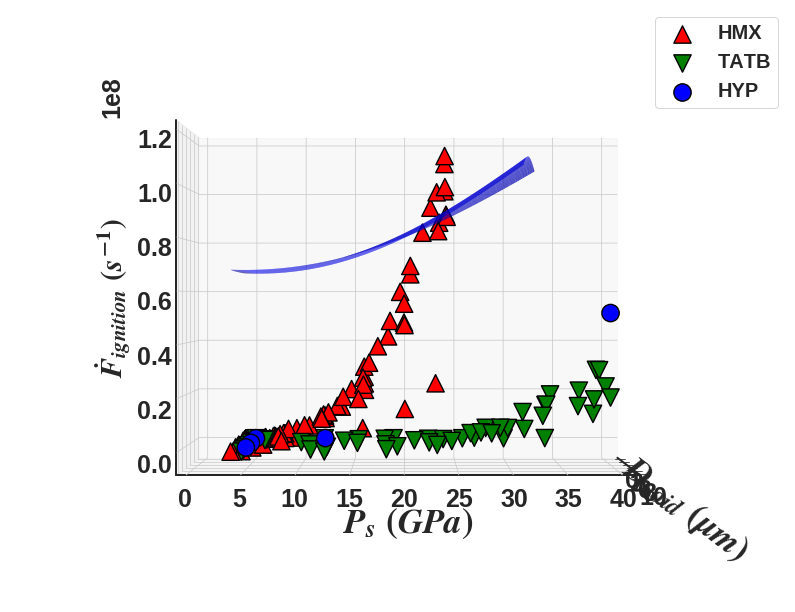

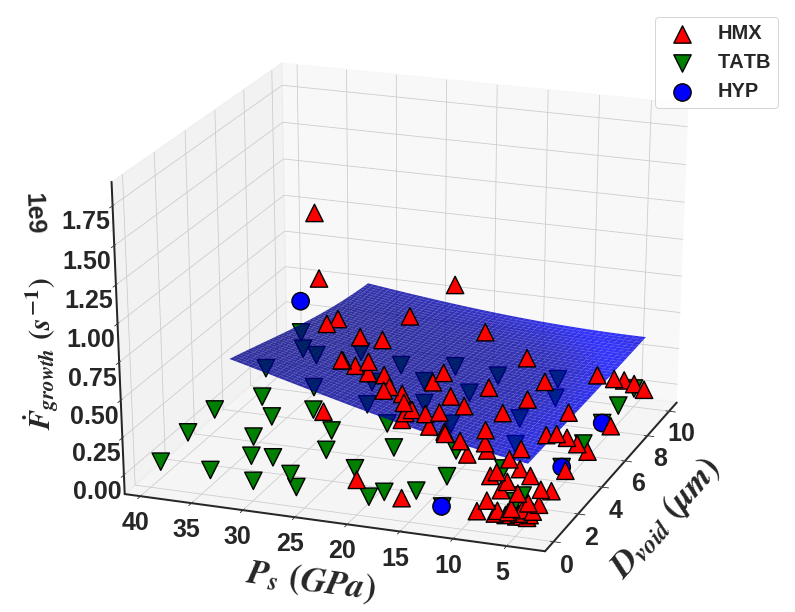

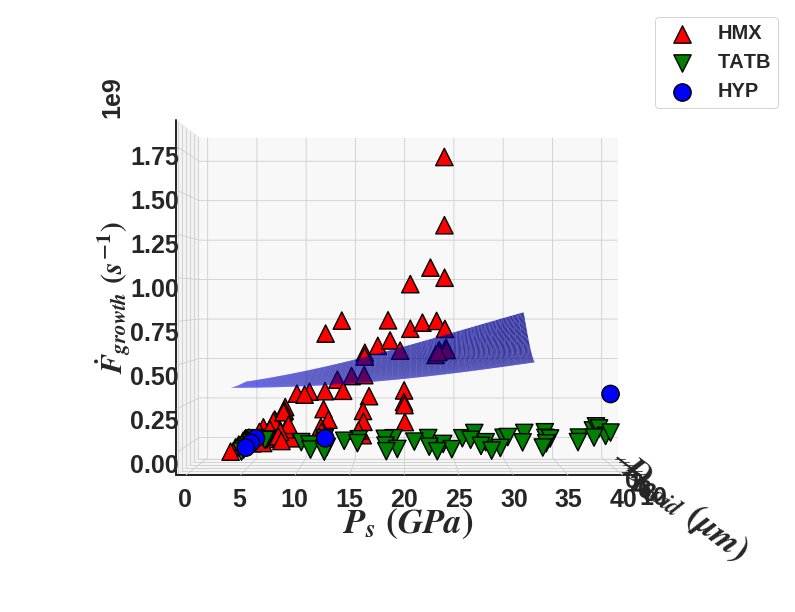

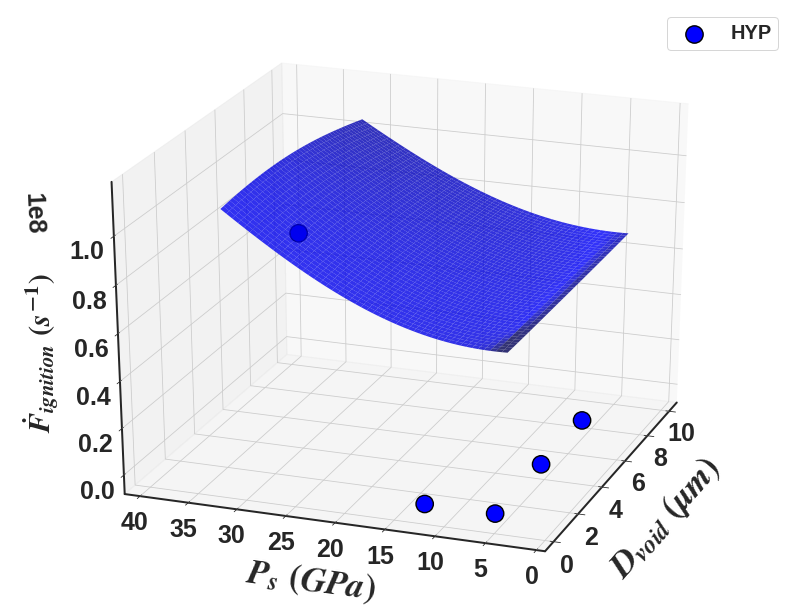

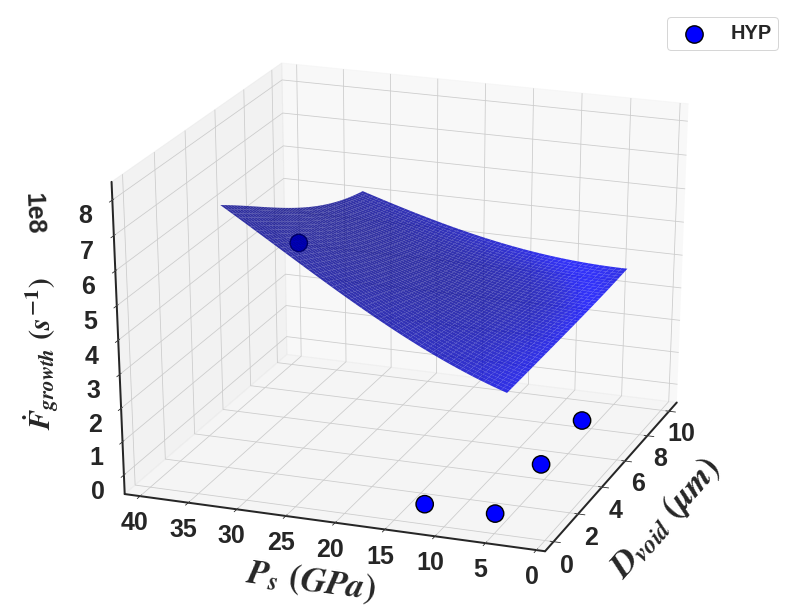

In [0]:
#==============================================================================#
#                                                                              #
#                             Hypo Part (surface)                              #
#                                                                              #
#==============================================================================#
# ==== create the input dataset (Hypo) ==== #
numOfSegments = 50
material_Flag = 3 # 1:HMX, 2:TATB, 3:hypo

# HMX_feature_d       = denorm_f(HMX_feature)
# TATB_feature_d      = denorm_f(TATB_feature)
# hypo_feature_copy_d = denorm_f(hypo_feature_copy)
# hypo_feature_true_d = denorm_f(hypo_feature_true)
# global_feature_d    = denorm_f(global_feature)

# HMX_response_d      = denorm_r(HMX_response)
# TATB_response_d     = denorm_r(TATB_response)
# hypo_response_d     = denorm_r(hypo_response)
# global_response_d   = denorm_r(global_response)

# y_pred_hypo_ig_d    = denorm_ig(y_pred_hypo_ig)
# y_pred_hypo_g_d     = denorm_g(y_pred_hypo_g)

# model_global_ig = SVM_global_ig
# model_global_g = SVM_global_g

if material_Flag == 1:
  hypo_feature_copy = sfs_ig.transform(HMX_feature)
elif material_Flag == 2:
  hypo_feature_copy = sfs_ig.transform(TATB_feature)
elif material_Flag == 3:
  hypo_feature_copy = sfs_ig.transform(hypo_feature)
else:
  print("**** Error material_Flag! ****")

hypo_linespace_matrix = np.zeros([numOfSegments, hypo_feature_copy.shape[1]])
# print(hypo_linespace_matrix.shape)

for i in range(hypo_linespace_matrix.shape[1]):
  hypo_linespace_matrix[:,i] = np.linspace(min(hypo_feature_copy[:,i]),max(hypo_feature_copy[:,i]), numOfSegments)

size = np.power(numOfSegments,2)
hypo_all_dataset = np.zeros([size, hypo_feature_copy.shape[1]])
# hypo_all_dataset = np.zeros([size, 3])
counter=0
for i in range(numOfSegments):
  for j in range(numOfSegments):
    temp = np.append(np.zeros(hypo_feature_copy.shape[1]-2,dtype=int),[i,j])
    for k in range(len(temp)):
      hypo_all_dataset[counter,k] = hypo_linespace_matrix[temp[k],k]
    counter = counter + 1 

#======= Ignition =======#
# Predict the response from the out of sample dataset
print('')
y_pred_hypo_ig = model_global_ig.predict(hypo_all_dataset)
# print('model testing score (ignition) :',LR_model_hypo_ig.score(hypo_outOfSample_testset,y_pred_hypo_outOfSample_ig))
print(y_pred_hypo_ig.shape)
# print(y_pred_hypo_outOfSample_ig)
 # declare y_pred_surf
y_pred_hypo_ig_surf = np.zeros([numOfSegments, numOfSegments]) 
counter=0
for i in range(numOfSegments):
  for j in range(numOfSegments):
    y_pred_hypo_ig_surf[i,j] = y_pred_hypo_ig[counter]
    counter=counter+1
# meshgrid
hypo_P_surf, hypo_D_surf = np.meshgrid(hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-2], hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-1], indexing='ij')

hypo_D_surf_d = denorm_surf_D(hypo_D_surf)
hypo_P_surf_d = denorm_surf_P(hypo_P_surf)
y_pred_hypo_ig_surf_d = denorm_ig(y_pred_hypo_ig_surf)


#======= Growth =======#

if material_Flag == 1:
  hypo_feature_copy = sfs_g.transform(HMX_feature)
elif material_Flag == 2:
  hypo_feature_copy = sfs_g.transform(TATB_feature)
elif material_Flag == 3:
  hypo_feature_copy = sfs_g.transform(hypo_feature)
else:
  print("**** Error material_Flag! ****")

hypo_linespace_matrix = np.zeros([numOfSegments, hypo_feature_copy.shape[1]])
print(hypo_linespace_matrix.shape)

for i in range(hypo_linespace_matrix.shape[1]):
  hypo_linespace_matrix[:,i] = np.linspace(min(hypo_feature_copy[:,i]),max(hypo_feature_copy[:,i]), numOfSegments)

size = np.power(numOfSegments,2)
hypo_all_dataset = np.zeros([size, hypo_feature_copy.shape[1]])
counter=0
for i in range(numOfSegments):
  for j in range(numOfSegments):
    temp = np.append(np.zeros(hypo_feature_copy.shape[1]-2,dtype=int),[i,j])
    for k in range(len(temp)):
      hypo_all_dataset[counter,k] = hypo_linespace_matrix[temp[k],k]
    counter = counter + 1 

# Predict the response from the out of sample dataset
print('')
y_pred_hypo_g = model_global_g.predict(hypo_all_dataset)
y_pred_hypo_g_surf = np.zeros([numOfSegments,numOfSegments]) 
counter=0
for i in range(numOfSegments):
  for j in range(numOfSegments):
    y_pred_hypo_g_surf[i,j] = y_pred_hypo_g[counter]
    counter=counter+1

y_pred_hypo_g_surf_d = denorm_g(y_pred_hypo_g_surf)
#==============================================================================#
#                                                                              #
#                             Hypo Part (surface)                              #
#                                                                              #
#==============================================================================#
# ==== create the input dataset (Hypo) ==== #
numOfSegments = 50

material_Flag = [1,2,3] # 1:HMX, 2:TATB, 3:hypo

#======= Ignition =======#

for k in material_Flag:
  print()
  if k == 1:
    hypo_feature_copy = sfs_ig.transform(HMX_feature)
    print('HMX chosen!')
  elif k == 2:
    print('TATB chosen!')
    hypo_feature_copy = sfs_ig.transform(TATB_feature) 
  elif k == 3:
    print('HYP chosen!')
    hypo_feature_copy = sfs_ig.transform(hypo_feature)
  else:
    print("**** Error material_Flag! ****",'k=',k,' point 1')
  
  hypo_linespace_matrix = np.zeros([numOfSegments, hypo_feature_copy.shape[1]])
  # hypo_linespace_matrix = np.zeros([numOfSegments, len(feature_cols)])

  # print(hypo_linespace_matrix.shape)

  for i in range(hypo_linespace_matrix.shape[1]):
    hypo_linespace_matrix[:,i] = np.linspace(min(hypo_feature_copy[:,i]),max(hypo_feature_copy[:,i]), numOfSegments)

  size = np.power(numOfSegments,2)
  hypo_all_dataset = np.zeros([size, hypo_feature_copy.shape[1]])
  # hypo_all_dataset = np.zeros([size, 3])
  counter=0
  for i in range(numOfSegments):
    for j in range(numOfSegments):
      temp = np.append(np.zeros(hypo_feature_copy.shape[1]-2,dtype=int),[i,j])
      for m in range(len(temp)):
        hypo_all_dataset[counter,m] = hypo_linespace_matrix[temp[m],m]
      counter = counter + 1 
  # Predict the response from the out of sample dataset
  print('')
  y_pred_hypo_ig = model_global_ig.predict(hypo_all_dataset)
  # print('model testing score (ignition) :',LR_model_hypo_ig.score(hypo_outOfSample_testset,y_pred_hypo_outOfSample_ig))
  # print(y_pred_hypo_ig.shape)
  # print(y_pred_hypo_outOfSample_ig)
  # declare y_pred_surf
  y_pred_hypo_ig_surf = np.zeros([numOfSegments, numOfSegments]) 
  counter=0
  for i in range(numOfSegments):
    for j in range(numOfSegments):
      y_pred_hypo_ig_surf[i,j] = y_pred_hypo_ig[counter]
      counter=counter+1
  # meshgrid
  # hypo_P_surf, hypo_D_surf = np.meshgrid(hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-2], hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-1], indexing='ij')
  hypo_P_surf, hypo_D_surf = np.meshgrid(hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-2], hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-1], indexing='ij')
  # print(hypo_P_surf.shape)
  # print(hypo_D_surf.shape)
  # print(y_pred_hypo_ig_surf.shape)

  hypo_D_surf_d = denorm_surf_D(hypo_D_surf)
  hypo_P_surf_d = denorm_surf_P(hypo_P_surf)
  y_pred_hypo_ig_surf_d = denorm_ig(y_pred_hypo_ig_surf)
  # define figure
  # fig = plt.figure(figsize=plt.figaspect(0.4))
  # ax = fig.add_subplot(1, 2, 1, projection='3d')
  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # plot scatters
  # HMX

  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_IG'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_IG'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_IG'],\
           s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')

  # plot surface
  # ax.plot_surface(HMX_P_surf, HMX_D_surf, y_pred_HMX_ig_surf, color='r', alpha=1.0)
  # ax.plot_surface(TATB_P_surf, TATB_D_surf, y_pred_TATB_ig_surf, color='b', alpha=1.0)
  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_ig_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  elif k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  elif k == 3:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  else:
    print("Error material_Flag!",'k=',k,' point 2')
  # ax.set_xlim([-0.2,10.2])
  # ax.set_ylim([0,40])
  # ax.set_zlim([1e-1,5e9])
  # ax.set_zscale('log')
  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
  # ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-5, figRotationZ-30)



  # Another angle ----

  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # plot scatters
  # HMX
  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_IG'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_IG'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_IG'],\
           s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')

  # plot surface
  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_ig_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  elif k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  elif k == 3:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  else:
    print("Error material_Flag!",'k=',k,' point 3')
  
  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-30, figRotationZ+130)


  #======= Growth =======#
  print()
  if k == 1:
    hypo_feature_copy = sfs_g.transform(HMX_feature)
    print('HMX chosen!')
  elif k == 2:
    print('TATB chosen!')
    hypo_feature_copy = sfs_g.transform(TATB_feature) 
  elif k == 3:
    print('HYP chosen!')
    hypo_feature_copy = sfs_g.transform(hypo_feature)
  else:
    print("**** Error material_Flag! ****",'k=',k,' point 1')
  
  hypo_linespace_matrix = np.zeros([numOfSegments, hypo_feature_copy.shape[1]])
  # hypo_linespace_matrix = np.zeros([numOfSegments, len(feature_cols)])

  # print(hypo_linespace_matrix.shape)

  for i in range(hypo_linespace_matrix.shape[1]):
    hypo_linespace_matrix[:,i] = np.linspace(min(hypo_feature_copy[:,i]),max(hypo_feature_copy[:,i]), numOfSegments)

  size = np.power(numOfSegments,2)
  hypo_all_dataset = np.zeros([size, hypo_feature_copy.shape[1]])
  # hypo_all_dataset = np.zeros([size, 3])
  counter=0
  for i in range(numOfSegments):
    for j in range(numOfSegments):
      temp = np.append(np.zeros(hypo_feature_copy.shape[1]-2,dtype=int),[i,j])
      for m in range(len(temp)):
        hypo_all_dataset[counter,m] = hypo_linespace_matrix[temp[m],m]
      counter = counter + 1 
  # Predict the response from the out of sample dataset
  print('')
  y_pred_hypo_g = model_global_g.predict(hypo_all_dataset)
  # print('model testing score (ignition) :',LR_model_hypo_ig.score(hypo_outOfSample_testset,y_pred_hypo_outOfSample_ig))
  # print(y_pred_hypo_g.shape)
  # print(y_pred_hypo_outOfSample_ig)
  # declare y_pred_surf
  y_pred_hypo_g_surf = np.zeros([numOfSegments,numOfSegments]) 
  counter=0
  for i in range(numOfSegments):
    for j in range(numOfSegments):
      y_pred_hypo_g_surf[i,j] = y_pred_hypo_g[counter]
      counter=counter+1

  y_pred_hypo_g_surf_d = denorm_g(y_pred_hypo_g_surf)

  # define figure
  # ax = fig.add_subplot(1, 2, 2, projection='3d')
  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # plot scatters
  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_G'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_G'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_G'],\
           s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')

  # plot surface
  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_g_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  if k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  # ax.set_xlim([-0.2,10.2])
  # ax.set_ylim([0,40])
  # ax.set_zlim([1e-1,5e9])
  # ax.set_zscale('log')
  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{growth}\/\/(s^{-1})$', rotation=90)
  # ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-5, figRotationZ-30)



  # Another angle ----

  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # plot scatters
  # HMX
  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_G'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_G'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_G'],\
           s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')

  # plot surface
  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_g_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  elif k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  elif k == 3:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  else:
    print("Error material_Flag!",'k=',k,' point 4')

  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{growth}\/\/(s^{-1})$', rotation=90)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-30, figRotationZ+130)





  # define figure for the hypo only
  # fig = plt.figure(figsize=plt.figaspect(0.4))
  # ax = fig.add_subplot(1, 2, 1, projection='3d')
  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # ax.plot_surface(HMX_P_surf, HMX_D_surf, y_pred_HMX_ig_surf, color='r', alpha=1.0)
  # ax.plot_surface(TATB_P_surf, TATB_D_surf, y_pred_TATB_ig_surf, color='b', alpha=1.0)

  if k == 1:
    print('HMX')
    ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_IG'],\
             s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  elif k == 2:
    print('TATB')
    ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_IG'],\
             s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  elif k == 3:
    print('HYP')
    ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_IG'],\
             s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')
  else:
    print("Error material_Flag!",'k=',k,' point 5')

  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_ig_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  elif k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  elif k == 3:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  else:
    print("Error material_Flag!",'k=',k,' point 6')

  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
  # ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  ax.view_init(figRotationX-5, figRotationZ-30)


  fig = plt.figure()
  ax = fig.add_subplot(111,projection='3d')
  # ax = fig.add_subplot(1, 2, 2, projection='3d')
  # ax.plot_surface(HMX_P_surf, HMX_D_surf, y_pred_HMX_g_surf, color='r', alpha=1.0)
  # ax.plot_surface(TATB_P_surf, TATB_D_surf, y_pred_TATB_g_surf, color='b', alpha=1.0)
  if k == 1:
    print('HMX')
    ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_G'],\
             s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
  elif k == 2:
    print('TATB')
    ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_G'],\
             s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
  elif k == 3:
    print('HYP')
    ax.scatter(hypo_feature_true_d['D'], hypo_feature_true_d['P'], hypo_response_d['Fdot_G'],\
             s = markerSize, marker='o',edgecolor='k', linewidth=1.4, alpha=1, color='b', label='HYP')
  else:
    print("Error material_Flag!",'k=',k,' point 7')

  ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_g_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
  if k == 1:
    ax.set_yticks([0, 5, 10, 15, 20, 25])
  elif k == 2:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  elif k == 3:
    ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
  else:
    print("Error material_Flag!",'k=',k)

  ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
  ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
  ax.zaxis.set_rotate_label(False)  # disable automatic rotation
  ax.set_zlabel(r'$\dot{F}_{growth}\/\/(s^{-1})$', rotation=90)
  # ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
  ax.xaxis.labelpad = 25
  ax.yaxis.labelpad = 25
  ax.zaxis.labelpad = 25
  ax.zaxis.set_tick_params(which='major', pad=8)
  ax.legend()
  # fake2Dline = mpl.lines.Line2D([0],[0], linestyle="none", c='b', marker = 'o')
  # ax.legend([fake2Dline], ['Predictions surface'], numpoints = 1)
  ax.view_init(figRotationX-5, figRotationZ-30)







In [0]:
#===========================================================#
#                                                           #
#           Exhaustive Feature Selection  (ignition)        #      
#                                                           #
#===========================================================#
# ------------- Parameters ------------- #
test_size_ig = 0.45
test_size_g = 0.45
randomSeed = 3
epsilon = 1e-6
n_folds=10
Cs_ig     = np.linspace(1e-2, 1e4, 4)  
gammas_ig = np.linspace(1e-2, 2, 4)    
Cs_g     = np.linspace(1e-2, 1e4, 4)   
gammas_g = np.linspace(1e-1, 2, 4)  
min_features = 1
print()
print('=========== Ignition ===========')
print()
feature_cols = list(global_feature.columns)
X_global = global_feature[feature_cols]
y_global_ig = global_response['Fdot_IG']
# SVM_global_ig = SVR(kernel = 'rbf',gamma='scale', C=penalty, epsilon=epsilon)

# CV_vector = np.array([5,10,12,15])
CV_vector = np.array([5])
# CV_vector = np.array([8,9,10,11,12,13,14,15,16])
# min_features_vec = np.array([3,4,5,6,7,8])


start_1 = time.time()
for i in CV_vector:
  SVM_global_ig = SVR(kernel = 'rbf', gamma='scale', C=10, epsilon=epsilon)
  # kfold = KFold(n_splits=i, shuffle=True, random_state=randomSeed)
  # for train_index, valid_index in kfold.split(X_global):
  #   X_global_ig_train,    X_global_valid    = X_global.loc[train_index], X_global.loc[valid_index]
  #   y_global_ig_train, y_global_ig_valid = y_global_ig[train_index],  y_global_ig[valid_index]
  X_global_ig_train, X_global_valid, y_global_ig_train, y_global_ig_valid = train_test_split(X_global, y_global_ig, 
                                                                                          shuffle=True, 
                                                                                          test_size=test_size_ig, 
                                                                                          random_state=randomSeed)
  
  efs = EFS(SVM_global_ig, 
               min_features=3, 
               max_features=12, 
               scoring='r2', 
               cv=i, 
               print_progress=True,
               clone_estimator=False,
               n_jobs=-1)
  
  start = time.time()

  pipe = make_pipeline(efs, SVM_global_ig)

  param_grid = {'exhaustivefeatureselector__estimator__C': Cs_ig,\
                'exhaustivefeatureselector__estimator__gamma' : gammas_ig}

  gs = GridSearchCV(estimator=pipe,
                    param_grid=param_grid,
                    scoring='r2',
                    n_jobs=1,
                    cv=i,
                    verbose=2,
                    n_jobs=-1,
                    refit=True)

  #run grid search
  gs = gs.fit(X_global_ig_train, y_global_ig_train)
  efs_ig = gs.best_estimator_.steps[0][1]

  # X = X_global_ig_train
  # y = y_global_ig_train
  # efs_ig.fit(X, y)
  # valid_error = []
  # train_error = []
  # Generate the new subsets based on the selected features
  # Note that the transform call is equivalent to X_train[:, efs.k_feature_idx_]
  # X_efs = efs_ig.transform(X)
  # X_global_valid_efs = efs_ig.transform(X_global_valid)
  # Fit the estimator using the new feature subset and make a prediction on the valid data
  # SVM_global_ig.fit(X_efs, y)
  # y_pred_ig_valid = SVM_global_ig.predict(X_global_valid_efs)
  # Fit and predict on the training data
  # y_pred_ig_train = SVM_global_ig.predict(X_global_ig_train_efs)
  # y_pred = SVM_global_ig.predict(X_efs)

  end = time.time()
  hours, rem = divmod(end-start, 3600)
  minutes, seconds = divmod(rem, 60)
  print()
  print('------------')
  print('CV_vector:',i)
  MSE = efs_ig.best_score_*(-1)
  RMSE = np.sqrt(MSE)
  print('Best MSE score: {0:1.4e}'.format(MSE))
  print('Best RMSE score: {0:1.4e}'.format(RMSE))
  print('Best RMSE ignition value: {0:1.2e}'.format(denorm_ig(RMSE)))
  # print('# of best selected features:', len(efs_ig.best_feature_names_))
  # print('Best features names:', efs_ig.best_feature_names_)
  # print('Best subset:', efs_ig.best_idx_)
  print('# of best selected features:', len(gs.best_estimator_.steps[0][1].best_idx_))
  print('Best features names:', gs.best_estimator_.steps[0][1].best_idx_)
  print('Best subset:', gs.best_estimator_.steps[0][1].best_feature_names_)
  print()
  # MSE
  # print('MSE train: {0:1.2e}'.format(mean_squared_error(y, y_pred)))
  # print('MSE train: {0:1.2e}'.format(mean_squared_error(y_global_ig_train, y_pred_ig_train)))
  # print('MSE valid: {0:1.2e}'.format(mean_squared_error(y_global_ig_valid, y_pred_ig_valid)))
  print()
  # RMSE
  # RMSE = np.sqrt(mean_squared_error(denorm_ig(y), denorm_ig(y_pred)))
  # print('RMSE train: {0:1.2e}'.format(RMSE))
  # print('Relative value train: {0:1.2e}'.format(denorm_ig(RMSE)))
  # RMSE = np.sqrt(mean_squared_error(denorm_ig(y_global_ig_valid), denorm_ig(y_pred_ig_valid)))
  # print('RMSE valid: {0:1.2e}'.format(RMSE))
  # print('Relative value valid: {0:1.2e}'.format(denorm_ig(RMSE)))
  print()
  # R^2
  # print('SVM_global_ig.score train (R^2): {}'.format(SVM_global_ig.score(X_efs, y)))
  # print('SVM_global_ig.score valid (R^2): {}'.format(SVM_global_ig.score(X_global_valid_efs, y_global_ig_valid)))
  print()
  print()

end_1 = time.time()
hours, rem = divmod(end_1-start_1, 3600)
minutes, seconds = divmod(rem, 60)
print('=========================')
print('Total time (ignition - all): ',"{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
print('=========================')
print()
print()
print()
#===========================================================#
#                                                           #
#           Exhaustive Feature Selection  (growth)          #      
#                                                           #
#===========================================================#
print()
print('=========== Growth ===========')
print()
feature_cols = list(global_feature.columns)
X_global = global_feature[feature_cols]
y_global_g = global_response['Fdot_G']
# SVM_global_g = SVR(kernel = 'rbf',gamma='scale', C=penalty, epsilon=epsilon)

CV_vector = np.array([5])
# CV_vector = np.array([8,9,10,11,12,13,14,15,16])
# min_features_vec = np.array([3,4,5,6,7,8])

start_1 = time.time()
for i in CV_vector:
  SVM_global_g = SVR(kernel = 'rbf', gamma='scale', C=10, epsilon=epsilon)
  # kfold = KFold(i, shuffle=True, random_state=randomSeed)
  # for train_index, valid_index in kfold.split(X_global):
  #   X_global_ig_train,   X_global_valid   = X_global.loc[train_index], X_global.loc[valid_index]
  #   y_global_g_train, y_global_g_valid = y_global_g[train_index],   y_global_g[valid_index]
  # X_global_ig_train, X_global_valid, y_global_g_train, y_global_g_valid = train_test_split(X_global, y_global_g, 
  #                                                                                       shuffle=True, 
  #                                                                                       test_size=test_size_g, 
  #                                                                                       random_state=randomSeed)
  
  efs = EFS(SVM_global_g, 
               min_features=3, 
               max_features=12, 
               scoring='neg_mean_squared_error', 
               cv=i, 
               print_progress=True,
               clone_estimator=False,
               n_jobs=1)
  
  start = time.time()

  pipe = make_pipeline(efs, SVM_global_g)

  param_grid = {'exhaustivefeatureselector__estimator__C': Cs_g,\
                'exhaustivefeatureselector__estimator__gamma' : gammas_g}

  gs = GridSearchCV(estimator=pipe,
                    param_grid=param_grid,
                    scoring='neg_mean_squared_error',
                    n_jobs=1,
                    cv=i,
                    verbose=1,
                    refit=True)

  #run grid search
  gs.fit(X_global_g_train, y_global_g_train)
  efs_g = gs.best_estimator_.steps[0][1]

  C = gs.best_params_['exhaustivefeatureselector__estimator__C']
  gamma = gs.best_params_['exhaustivefeatureselector__estimator__gamma']

  print('C=', C)
  print('gamma=', gamma)

  # X = X_global_g_train
  # y = y_global_g_train
  SVM_global_g = SVR(kernel = 'rbf', gamma=gamma, C=C, epsilon=epsilon)

  # efs_g.fit(X, y)
  # Generate the new subsets based on the selected features
  # Note that the transform call is equivalent to X_train[:, efs.k_feature_idx_]
  # X_efs = efs_g.transform(X)
  # X_global_valid_efs = efs_g.transform(X_global_valid)
  # Fit the estimator using the new feature subset and make a prediction on the valid data
  # SVM_global_g.fit(X_efs, y)
  # y_pred_g_valid = SVM_global_g.predict(X_global_valid_efs)
  # Fit and predict on the training data
  # y_pred_g_train = SVM_global_g.predict(X_global_g_train_efs)
  # y_pred = SVM_global_g.predict(X_efs)
  end = time.time()
  hours, rem = divmod(end-start, 3600)
  minutes, seconds = divmod(rem, 60)
  print()
  print('------------')
  print('CV_vector:',i)
  MSE = efs_g.best_score_*(-1)
  RMSE = np.sqrt(MSE)
  print('Best MSE score: {0:1.4e}'.format(MSE))
  print('Best RMSE score: {0:1.4e}'.format(RMSE))
  print('Best RMSE ignition value: {0:1.2e}'.format(denorm_g(RMSE)))
  print('# of best selected features:', len(efs_g.best_feature_names_))
  print('Best features names:', efs_g.best_feature_names_)
  print('Best subset:', efs_g.best_idx_)
  print()
  # MSE
  # print('MSE train: {0:1.2e}'.format(mean_squared_error(y, y_pred)))
  # print('MSE train: {0:1.2e}'.format(mean_squared_error(y_global_g_train, y_pred_g_train)))
  # print('MSE valid: {0:1.2e}'.format(mean_squared_error(y_global_g_valid, y_pred_g_valid)))
  print()
  # RMSE
  # RMSE = np.sqrt(mean_squared_error(denorm_g(y), denorm_g(y_pred)))
  # print('RMSE train: {0:1.2e}'.format(RMSE))
  # print('Relative value train: {0:1.2e}'.format(denorm_g(RMSE)))
  # RMSE = np.sqrt(mean_squared_error(denorm_g(y_global_g_valid), denorm_g(y_pred_g_valid)))
  # print('RMSE valid: {0:1.2e}'.format(RMSE))
  # print('Relative value valid: {0:1.2e}'.format(denorm_g(RMSE)))
  print()
  # R^2
  # print('SVM_global_g.score train (R^2): {}'.format(SVM_global_g.score(X_efs, y)))
  # print('SVM_global_g.score valid (R^2): {}'.format(SVM_global_g.score(X_global_valid_efs, y_global_g_valid)))
  print()
  print()

end_1 = time.time()
hours, rem = divmod(end_1-start_1, 3600)
minutes, seconds = divmod(rem, 60)
print('=========================')
print('Total time (growth - all): ',"{:0>2}:{:0>2}:{:05.2f}".format(int(hours),int(minutes),seconds))
print('=========================')
print()




SyntaxError: ignored

In [0]:
#==============================================================================#
#                                                                              #
#                             Hypo Part (surface)                              #
#                                                                              #
#==============================================================================#
# ==== create the input dataset (Hypo) ==== #
numOfSegments = 50
material_Flag = 3 # 1:HMX, 2:TATB, 3:hypo

model_global_ig = SVM_global_ig
model_global_g = SVM_global_g

# efs_ig = gs.best_estimator_.steps[0][1]

if material_Flag == 1:
  hypo_feature_copy = efs_ig.transform(HMX_feature)
elif material_Flag == 2:
  hypo_feature_copy = efs_ig.transform(TATB_feature)
elif material_Flag == 3:
  hypo_feature_copy = efs_ig.transform(hypo_feature)
else:
  print("**** Error material_Flag! ****")

hypo_linespace_matrix = np.zeros([numOfSegments, hypo_feature_copy.shape[1]])
# print(hypo_linespace_matrix.shape)

for i in range(hypo_linespace_matrix.shape[1]):
  hypo_linespace_matrix[:,i] = np.linspace(min(hypo_feature_copy[:,i]),max(hypo_feature_copy[:,i]), numOfSegments)

size = np.power(numOfSegments,2)
hypo_all_dataset = np.zeros([size, hypo_feature_copy.shape[1]])
# hypo_all_dataset = np.zeros([size, 3])
counter=0
for i in range(numOfSegments):
  for j in range(numOfSegments):
    temp = np.append(np.zeros(hypo_feature_copy.shape[1]-2,dtype=int),[i,j])
    for k in range(len(temp)):
      hypo_all_dataset[counter,k] = hypo_linespace_matrix[temp[k],k]
    counter = counter + 1 

#======= Ignition =======#
# Predict the response from the out of sample dataset
print('')
y_pred_hypo_ig = model_global_ig.predict(hypo_all_dataset)
# print('model testing score (ignition) :',LR_model_hypo_ig.score(hypo_outOfSample_testset,y_pred_hypo_outOfSample_ig))
print(y_pred_hypo_ig.shape)
# print(y_pred_hypo_outOfSample_ig)
 # declare y_pred_surf
y_pred_hypo_ig_surf = np.zeros([numOfSegments, numOfSegments]) 
counter=0
for i in range(numOfSegments):
  for j in range(numOfSegments):
    y_pred_hypo_ig_surf[i,j] = y_pred_hypo_ig[counter]
    counter=counter+1
# meshgrid
# hypo_P_surf, hypo_D_surf = np.meshgrid(hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-2], hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-1], indexing='ij')
hypo_P_surf, hypo_D_surf = np.meshgrid(hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-2], hypo_linespace_matrix[:,hypo_linespace_matrix.shape[1]-1], indexing='ij')
# print(hypo_P_surf.shape)
# print(hypo_D_surf.shape)
# print(y_pred_hypo_ig_surf.shape)

hypo_D_surf_d = denorm_surf_D(hypo_D_surf)
hypo_P_surf_d = denorm_surf_P(hypo_P_surf)
y_pred_hypo_ig_surf_d = denorm_ig(y_pred_hypo_ig_surf)
# define figure
# fig = plt.figure(figsize=plt.figaspect(0.4))
# ax = fig.add_subplot(1, 2, 1, projection='3d')
fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
# plot scatters
# HMX
ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_IG'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_IG'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
# plot surface
ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_ig_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
if material_Flag == 1:
  ax.set_yticks([0, 5, 10, 15, 20, 25])
if material_Flag == 2:
  ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
ax.xaxis.labelpad = 25
ax.yaxis.labelpad = 25
ax.zaxis.labelpad = 25
ax.zaxis.set_tick_params(which='major', pad=8)
ax.legend()
ax.view_init(figRotationX-5, figRotationZ)



# Another angle ----

fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
# plot scatters
# HMX
ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_IG'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_IG'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
# plot surface
ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_ig_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
if material_Flag == 1:
  ax.set_yticks([0, 5, 10, 15, 20, 25])
if material_Flag == 2:
  ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
ax.xaxis.labelpad = 25
ax.yaxis.labelpad = 25
ax.zaxis.labelpad = 25
ax.zaxis.set_tick_params(which='major', pad=8)
ax.legend()
ax.view_init(figRotationX-30, figRotationZ+130)


#======= Growth =======#

# if k == 1:
#   hypo_feature_copy = efs_g.transform(HMX_feature)
# elif k == 2:
#   hypo_feature_copy = efs_g.transform(TATB_feature)
# elif k == 3:
#   hypo_feature_copy = efs_g.transform(hypo_feature)
# else:
#   print("**** Error material_Flag! ****")

hypo_linespace_matrix = np.zeros([numOfSegments, hypo_feature_copy.shape[1]])
print(hypo_linespace_matrix.shape)

for i in range(hypo_linespace_matrix.shape[1]):
  hypo_linespace_matrix[:,i] = np.linspace(min(hypo_feature_copy[:,i]),max(hypo_feature_copy[:,i]), numOfSegments)

size = np.power(numOfSegments,2)
hypo_all_dataset = np.zeros([size, hypo_feature_copy.shape[1]])
# hypo_all_dataset = np.zeros([size, 3])
counter=0
for i in range(numOfSegments):
  for j in range(numOfSegments):
    temp = np.append(np.zeros(hypo_feature_copy.shape[1]-2,dtype=int),[i,j])
    for k in range(len(temp)):
      hypo_all_dataset[counter,k] = hypo_linespace_matrix[temp[k],k]
    counter = counter + 1 

# Predict the response from the out of sample dataset
print('')
y_pred_hypo_g = model_global_g.predict(hypo_all_dataset)
# print('model testing score (ignition) :',LR_model_hypo_ig.score(hypo_outOfSample_testset,y_pred_hypo_outOfSample_ig))
print(y_pred_hypo_g.shape)
# print(y_pred_hypo_outOfSample_ig)
# declare y_pred_surf
y_pred_hypo_g_surf = np.zeros([numOfSegments,numOfSegments]) 
counter=0
for i in range(numOfSegments):
  for j in range(numOfSegments):
    y_pred_hypo_g_surf[i,j] = y_pred_hypo_g[counter]
    counter=counter+1

y_pred_hypo_g_surf_d = denorm_g(y_pred_hypo_g_surf)

# define figure
# ax = fig.add_subplot(1, 2, 2, projection='3d')
fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
# # plot scatters
ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_G'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_G'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
# plot surface
# ax.plot_surface(HMX_P_surf, HMX_D_surf, y_pred_HMX_g_surf, color='r', alpha=1.0)
# ax.plot_surface(TATB_P_surf, TATB_D_surf, y_pred_TATB_g_surf, color='b', alpha=1.0)
ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_g_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
if material_Flag == 1:
  ax.set_yticks([0, 5, 10, 15, 20, 25])
if material_Flag == 2:
  ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
# ax.set_xlim([-0.2,10.2])
# ax.set_ylim([0,40])
# ax.set_zlim([1e-1,5e9])
# ax.set_zscale('log')
ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel(r'$\dot{F}_{growth}\/\/(s^{-1})$', rotation=90)
# ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
ax.xaxis.labelpad = 25
ax.yaxis.labelpad = 25
ax.zaxis.labelpad = 25
ax.zaxis.set_tick_params(which='major', pad=8)
ax.legend()
ax.view_init(figRotationX-5, figRotationZ)


# Another angle ----

fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
# plot scatters
# HMX
ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_G'],\
           s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_G'],\
           s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
# plot surface
ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_g_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
if material_Flag == 1:
  ax.set_yticks([0, 5, 10, 15, 20, 25])
if material_Flag == 2:
  ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
ax.xaxis.labelpad = 25
ax.yaxis.labelpad = 25
ax.zaxis.labelpad = 25
ax.zaxis.set_tick_params(which='major', pad=8)
ax.legend()
ax.view_init(figRotationX-30, figRotationZ+130)



# define figure for the hypo only
# fig = plt.figure(figsize=plt.figaspect(0.4))
# ax = fig.add_subplot(1, 2, 1, projection='3d')
fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
# ax.plot_surface(HMX_P_surf, HMX_D_surf, y_pred_HMX_ig_surf, color='r', alpha=1.0)
# ax.plot_surface(TATB_P_surf, TATB_D_surf, y_pred_TATB_ig_surf, color='b', alpha=1.0)

if material_Flag == 1:
  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_IG'],\
             s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
if material_Flag == 2:
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_IG'],\
             s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
# elif material_Flag == 3:
  # for i in range(len(y_pred_hypo_ig)):
    # ax.scatter(hypo_feature_copy.loc[i]['P'], hypo_feature_copy.loc[i]['D'], y_pred_hypo_ig[i],\
    #            s = 150, marker='o',edgecolor='k', linewidth=1.4, alpha=0.8, color='b')
else:
  print("Error material_Flag!")

ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_ig_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
if material_Flag == 1:
  ax.set_yticks([0, 5, 10, 15, 20, 25])
if material_Flag == 2:
  ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])
ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel(r'$\dot{F}_{ignition}\/\/(s^{-1})$', rotation=90)
# ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
ax.xaxis.labelpad = 25
ax.yaxis.labelpad = 25
ax.zaxis.labelpad = 25
ax.zaxis.set_tick_params(which='major', pad=8)
ax.legend()
ax.view_init(figRotationX-5, figRotationZ)


fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
# ax = fig.add_subplot(1, 2, 2, projection='3d')
# ax.plot_surface(HMX_P_surf, HMX_D_surf, y_pred_HMX_g_surf, color='r', alpha=1.0)
# ax.plot_surface(TATB_P_surf, TATB_D_surf, y_pred_TATB_g_surf, color='b', alpha=1.0)
if material_Flag == 1:
  ax.scatter(HMX_feature_d['D'], HMX_feature_d['P'], HMX_response_d['Fdot_G'],\
             s = markerSize, marker='^',edgecolor='k', linewidth=1.4, alpha=1, color='r', label='HMX')
if material_Flag == 2:
  ax.scatter(TATB_feature_d['D'], TATB_feature_d['P'], TATB_response_d['Fdot_G'],\
             s = markerSize, marker='v',edgecolor='k', linewidth=1.4, alpha=1, color='g', label='TATB')
# elif material_Flag == 3:
  # for i in range(len(y_pred_hypo_g)):
    # ax.scatter(hypo_feature_copy.loc[i]['P'], hypo_feature_copy.loc[i]['D'], y_pred_hypo_g[i],\
    #            s = 150, marker='o',edgecolor='k', linewidth=1.4, alpha=0.8, color='b')
else:
  print("Error material_Flag!")

ax.plot_surface(hypo_D_surf_d, hypo_P_surf_d, y_pred_hypo_g_surf_d, color='b', alpha=0.8)#, label='Predictions surface')
if material_Flag == 1:
  ax.set_yticks([0, 5, 10, 15, 20, 25])
if material_Flag == 2:
  ax.set_yticks([0, 5, 10, 15, 20, 25, 30, 35, 40])

ax.set_xlabel(r'$D_{void}\/\/(\mu m)$',font)
ax.set_ylabel(r'$P_{s}\/\/(GPa)$',font) 
ax.zaxis.set_rotate_label(False)  # disable automatic rotation
ax.set_zlabel(r'$\dot{F}_{growth}\/\/(s^{-1})$', rotation=90)
# ax.set_zlabel(r'$\dot{F}_{ig}\/\/(s^{-1})$',font)
ax.xaxis.labelpad = 25
ax.yaxis.labelpad = 25
ax.zaxis.labelpad = 25
ax.zaxis.set_tick_params(which='major', pad=8)
ax.legend()
# fake2Dline = mpl.lines.Line2D([0],[0], linestyle="none", c='b', marker = 'o')
# ax.legend([fake2Dline], ['Predictions surface'], numpoints = 1)
ax.view_init(figRotationX-5, figRotationZ)





In [0]:
#==================================================================#
#                     Tuning   (first stage)                       #
#==================================================================#
def SVR_tuning(X, y, nfolds, Cs, gammas):
    param_grid = {'C': Cs, 'gamma' : gammas}
    grid_search = GridSearchCV(SVR(kernel='rbf'), param_grid, cv=nfolds)
    grid_search.fit(X, y)
    print(grid_search.best_params_)
    return grid_search.best_params_


Cs     = [1e-3, 1e-2, 1e-1, 1, 1e1, 5e1, 1e2, 1e3, 1e4, 1e5]
gammas = [1e-3, 1e-2, 1e-1, 1, 1e1, 5e1, 1e2, 1e3, 1e4, 1e5]
X = efs_ig.transform(X_global)
y = y_global_ig
tune_para_ig = SVR_tuning(X, y, 10, Cs, gammas)
print()
print()
X = efs_g.transform(X_global)
y = y_global_g
tune_para_g = SVR_tuning(X, y, 10, Cs, gammas)
print()

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 10000.0, 'gamma': 0.1}


{'C': 50.0, 'gamma': 10.0}



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [0]:
#==================================================================#
#                     Tuning   (second stage)                      #
#==================================================================#
Cs     = [10,20,30,40,50,60,70,80,90,100,110,120,130,140,150]
gammas = [0.1,0.5,0.6,0.7,0.8,0.9,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
X = efs_ig.transform(X_global)
y = y_global_ig
tune_para_ig = SVR_tuning(X, y, 10, Cs, gammas)
print()
print()
X = efs_g.transform(X_global)
y = y_global_g
tune_para_g = SVR_tuning(X, y, 10, Cs, gammas)
print()


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


{'C': 30, 'gamma': 0.1}


{'C': 60, 'gamma': 9}



/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


RMSE_train_ig: [0.306, 0.275, 0.154, 0.06, 0.044, 0.041, 0.04, 0.039, 0.031, 0.008, 0.006]
RMSE_valid_ig: [0.201, 0.177, 0.108, 0.094, 0.1, 0.1, 0.099, 0.098, 0.093, 0.086, 0.091]
RMSE_train_g: [0.179, 0.136, 0.073, 0.064, 0.061, 0.06, 0.061, 0.061, 0.068, 0.069, 0.067]
RMSE_valid_g: [0.196, 0.163, 0.118, 0.107, 0.103, 0.101, 0.102, 0.102, 0.112, 0.113, 0.11]






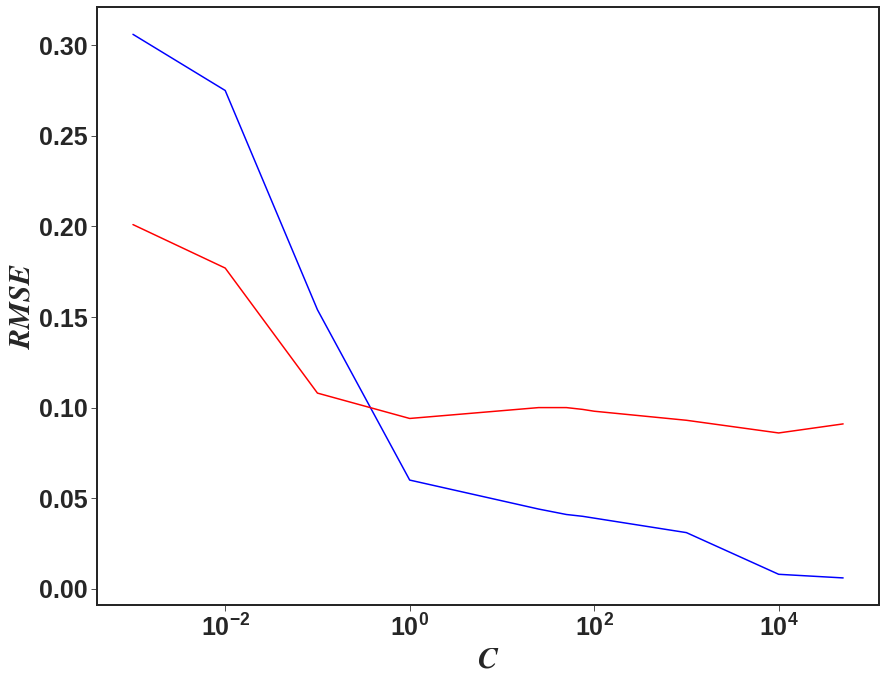

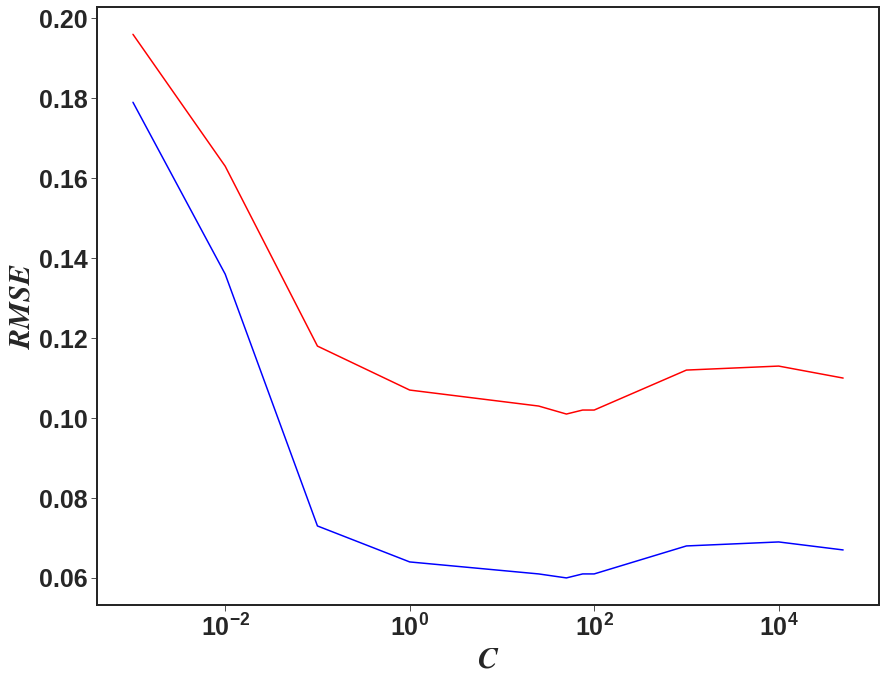

In [0]:

    # Cs     = [1e-3, 1e-2, 1e-1, 1, 1e1, 5e1, 1e2, 1e3, 1e4, 1e5]
    # gammas = [1e-3, 1e-2, 1e-1, 1, 1e1, 5e1, 1e2, 1e3, 1e4, 1e5]

test_size_ig = 0.35  #0.48
test_size_g = 0.35
randomSeed = 3 # or 3

# C_ig = tune_para_ig['C']
# C_g  = tune_para_g['C']
# gamma_ig = tune_para_ig['gamma']
# gamma_g  = tune_para_g['gamma']


# flag = Cs #Cs #gammas
# if flag == gammas:
#   gammas = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 0.25, 0.5, 0.75, 1, 1e1, 5e1, 1e2, 1e3, 1e4, 1e5, 1e6, 1e7]
#   Cs     = [C_g]
# elif flag == Cs:
#   gammas = [gamma_ig]
Cs     = [1e-3,1e-2,1e-1,1,25,50,75,1e2,1e3,1e4,5e4]#,1e5,2e5]#,1e6]#1e7]


X_ig = efs_ig.transform(X_global)
X_g  = efs_g.transform(X_global)
y_ig = y_global_ig
y_g = y_global_g

# RMSE_train_ig, RMSE_valid_ig, RMSE_train_g, RMSE_valid_g = loop_through_calc_metrics(Cs,gammas,X_ig,X_g,y_ig,y_g)

RMSE_valid_ig = []
RMSE_train_ig = []
RMSE_valid_g  = []
RMSE_train_g  = []
for i in Cs:
  # for j in gammas:
    X_global_ig_train, X_global_ig_valid, y_global_ig_train, y_global_ig_valid = train_test_split(X_ig, y_ig, 
                                                                                        shuffle=True, 
                                                                                        test_size=test_size_ig, 
                                                                                        random_state=randomSeed)
    X_global_g_train, X_global_g_valid, y_global_g_train, y_global_g_valid = train_test_split(X_g, y_g, 
                                                                                        shuffle=True, 
                                                                                        test_size=test_size_g, 
                                                                                        random_state=randomSeed)
    model_global_ig = SVR(kernel   = 'rbf', gamma='scale', C=i, epsilon=epsilon)
    model_global_g  = SVR(kernel   = 'rbf', gamma='scale', C=i, epsilon=epsilon)
    train_error_ig, valid_error_ig = calc_metrics(X_global_ig_train, y_global_ig_train, X_global_ig_valid, y_global_ig_valid, model_global_ig)
    train_error_g, valid_error_g   = calc_metrics(X_global_g_train,  y_global_g_train,  X_global_g_valid,  y_global_g_valid,  model_global_g)
    train_error_ig, valid_error_ig = round(train_error_ig, 3), round(valid_error_ig, 3)
    train_error_g, valid_error_g   = round(train_error_g,  3), round(valid_error_g,  3)
    RMSE_train_ig.append(train_error_ig)
    RMSE_valid_ig.append(valid_error_ig)
    RMSE_train_g.append(train_error_g)
    RMSE_valid_g.append(valid_error_g)


print('RMSE_train_ig:',RMSE_train_ig) 
print('RMSE_valid_ig:',RMSE_valid_ig) 
print('RMSE_train_g:',RMSE_train_g) 
print('RMSE_valid_g:',RMSE_valid_g)
print()
print()


# flag = flag

# if flag == Cs:
plt.figure()
plt.plot(Cs,RMSE_train_ig,'b')
plt.plot(Cs,RMSE_valid_ig,'r')
plt.xscale('log')
plt.xlabel(r'$C$')
plt.ylabel(r'$RMSE$')
plt.figure()
plt.plot(Cs,RMSE_train_g,'b')
plt.plot(Cs,RMSE_valid_g,'r')
plt.xscale('log')
plt.xlabel(r'$C$')
plt.ylabel(r'$RMSE$')
# elif flag == gammas:
#   plt.figure()
#   plt.plot(gammas,RMSE_train_ig,'b')
#   plt.plot(gammas,RMSE_valid_ig,'r')
#   plt.xscale('log')
#   plt.xlabel(r'$\gamma$')
#   plt.ylabel(r'$RMSE$')
#   plt.figure()
#   plt.plot(gammas,RMSE_train_g,'b')
#   plt.plot(gammas,RMSE_valid_g,'r')
#   plt.xscale('log')
#   plt.xlabel(r'$\gamma$')
#   plt.ylabel(r'$RMSE %$')
  # plt.xlim([-0.05,100])

print()
# print('tune_para_ig[C]:',tune_para_ig['C'])
# print('tune_para_g[C]:',tune_para_g['C'])
# print('tune_para_ig[gamma]:',tune_para_ig['gamma'])
# print('tune_para_g[gamma]:',tune_para_g['gamma'])
print()


Text(0, 0.5, '$RMSE$')

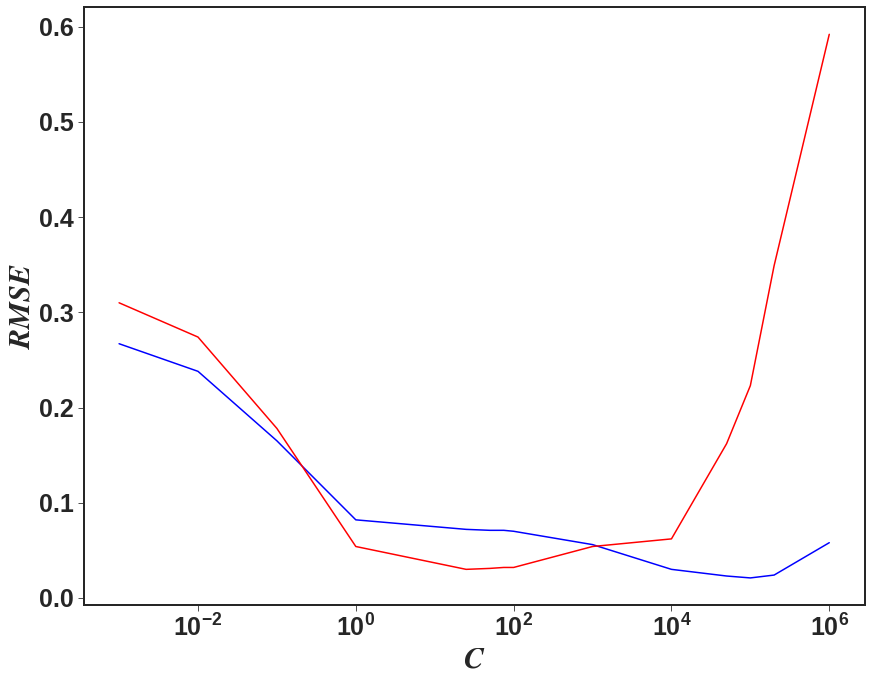

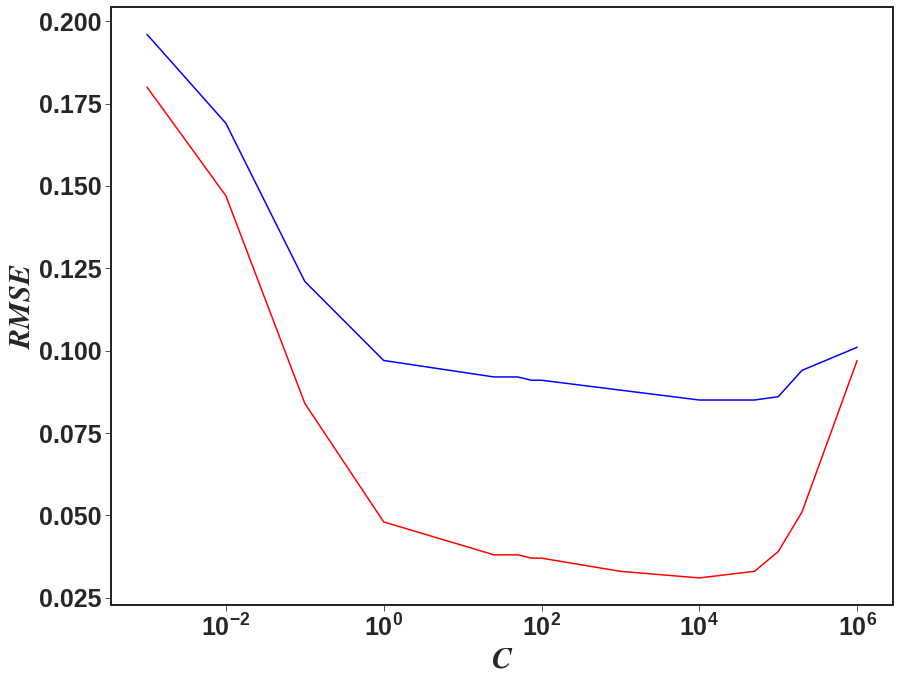

In [0]:
plt.figure()
plt.plot(Cs,RMSE_train_ig,'b')
plt.plot(Cs,RMSE_valid_ig,'r')
plt.xscale('log')
plt.xlabel(r'$C$')
plt.ylabel(r'$RMSE$')
plt.figure()
plt.plot(Cs,RMSE_train_g,'b')
plt.plot(Cs,RMSE_valid_g,'r')
plt.xscale('log')
plt.xlabel(r'$C$')
plt.ylabel(r'$RMSE$')

# plt.figure()
# plt.plot(gammas,RMSE_train_ig,'b')
# plt.plot(gammas,RMSE_valid_ig,'r')
# plt.xscale('log')
# plt.xlabel(r'$\gamma$')
# plt.ylabel(r'$RMSE$')
# plt.figure()
# plt.plot(gammas,RMSE_train_g,'b')
# plt.plot(gammas,RMSE_valid_g,'r')
# plt.xscale('log')
# plt.xlabel(r'$\gamma$')
# plt.ylabel(r'$RMSE %$')

In [0]:
# HMX
np.savetxt('/gdrive/My Drive/Transfer_Learning/SVM/HMX_P_surf.csv', HMX_P_surf, delimiter=',')
np.savetxt('/gdrive/My Drive/Transfer_Learning/SVM/HMX_D_surf.csv', HMX_D_surf, delimiter=',')
np.savetxt('/gdrive/My Drive/Transfer_Learning/SVM/y_pred_HMX_ig_surf.csv', y_pred_HMX_ig_surf, delimiter=',')
np.savetxt('/gdrive/My Drive/Transfer_Learning/SVM/y_pred_HMX_g_surf.csv', y_pred_HMX_g_surf, delimiter=',')
# HMX_P_surf, HMX_D_surf, y_pred_HMX_ig_surf
# TATB
np.savetxt('/gdrive/My Drive/Transfer_Learning/PR/TATB_allSamples_D_surf_PR.csv', TATB_allSamples_D_surf, delimiter=',')
np.savetxt('/gdrive/My Drive/Transfer_Learning/PR/TATB_allSamples_P_surf_PR.csv', TATB_allSamples_P_surf, delimiter=',')
np.savetxt('/gdrive/My Drive/Transfer_Learning/PR/TATB_allSamples_Fdot_ig_surf_PR.csv', TATB_allSamples_Fdot_ig_surf, delimiter=',')
np.savetxt('/gdrive/My Drive/Transfer_Learning/PR/TATB_allSamples_Fdot_g_surf_PR.csv', TATB_allSamples_Fdot_g_surf, delimiter=',')
# global
np.savetxt('/gdrive/My Drive/Transfer_Learning/PR/global_allSamples_D_surf_PR.csv', global_allSamples_D_surf, delimiter=',')
np.savetxt('/gdrive/My Drive/Transfer_Learning/PR/global_allSamples_P_surf_PR.csv', global_allSamples_P_surf, delimiter=',')
np.savetxt('/gdrive/My Drive/Transfer_Learning/PR/global_allSamples_Fdot_ig_surf_PR.csv', global_allSamples_Fdot_ig_surf, delimiter=',')
np.savetxt('/gdrive/My Drive/Transfer_Learning/PR/global_allSamples_Fdot_g_surf_PR.csv', global_allSamples_Fdot_g_surf, delimiter=',')